In [ ]:
!pip install torch-cluster #needed only for node2vec, comment to speed up the loading
!pip install torch_geometric
!pip install torchmetrics

In [ ]:
#Import everything we need
import torch
from torch_geometric.datasets import Planetoid
from torch_geometric.transforms import NormalizeFeatures, RandomLinkSplit
import torch.nn.functional as F
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
import numpy as np
import matplotlib.pyplot as plt
from torch_geometric.nn import GCNConv, GATConv, SAGEConv, Node2Vec
from google.colab import drive
import seaborn as sns
import warnings
from sklearn.linear_model import LogisticRegression
from sklearn.exceptions import UndefinedMetricWarning
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD
from torch_geometric.explain import Explainer, GNNExplainer, AttentionExplainer
from torch_geometric.data import Data
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, ConfusionMatrixDisplay
from sklearn.random_projection import GaussianRandomProjection
import networkx as nx
import random
import itertools
from torch_geometric.utils import to_networkx, from_networkx, negative_sampling
from tqdm import tqdm

#Load the datasets
cora_dataset = Planetoid(root='/tmp/Cora', name='Cora', transform=NormalizeFeatures())
citeseer_dataset = Planetoid(root='/tmp/CiteSeer', name='CiteSeer', transform=NormalizeFeatures())
pubmed_dataset = Planetoid(root='/tmp/PubMed', name='PubMed', transform=NormalizeFeatures())

data = cora_dataset[0]

Processing...
Done!
Processing...
Done!
Processing...
Done!


In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


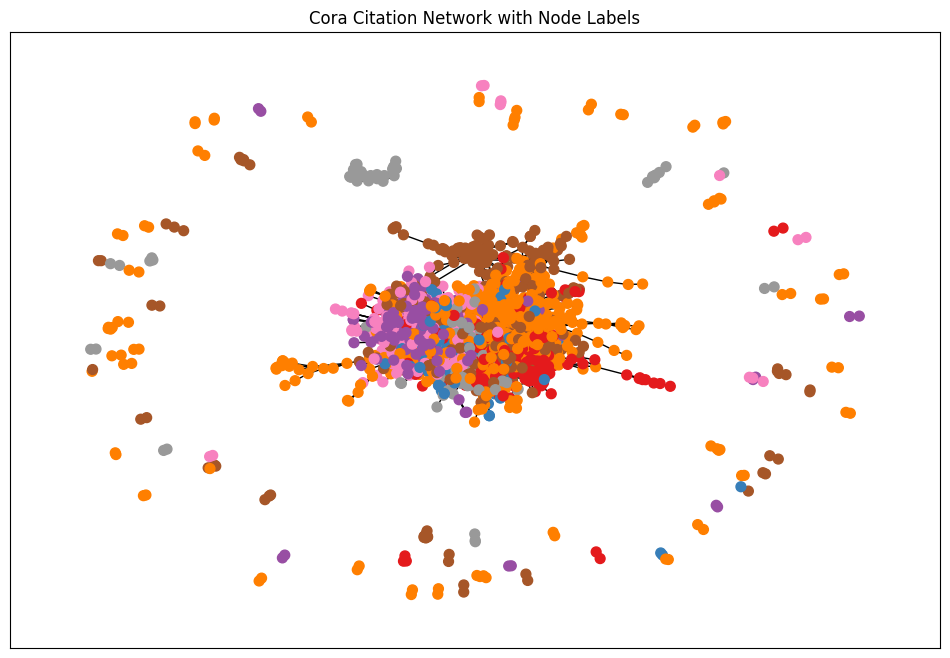

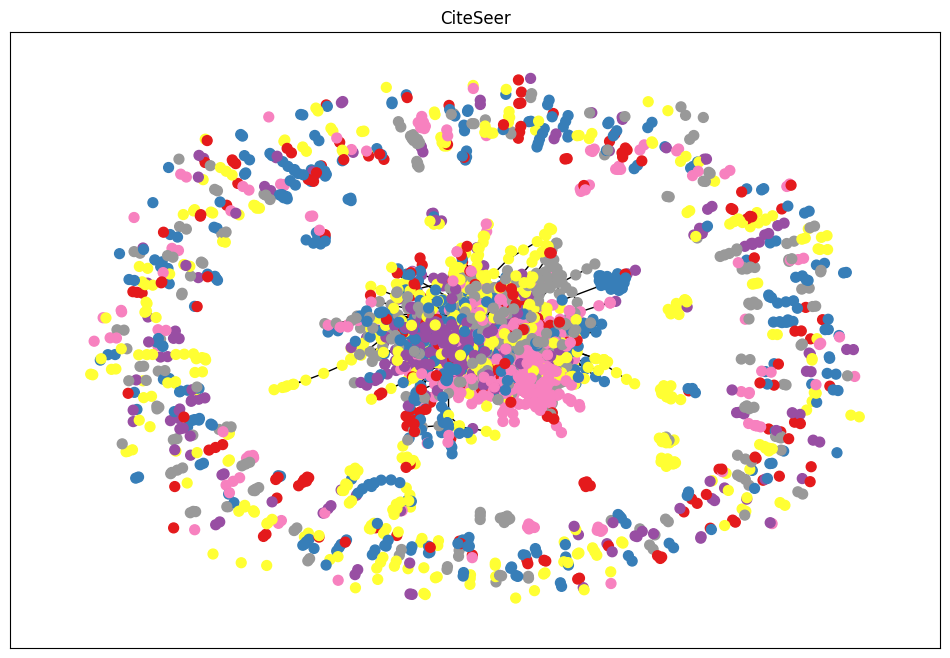

In [ ]:
#Visualize the datasets with networkx to understand the differences in graph structure between the datasets
def visualize_graph(data, title="Cora Dataset"):
  G = to_networkx(data, node_attrs=['y'], to_undirected=True)
  plt.figure(figsize=(12, 8))
  labels = [G.nodes[n]['y'] for n in G.nodes()]
  cmap = plt.get_cmap('Set1')
  nx.draw_networkx(
    G,
    node_color=labels,
    node_size=50,
    cmap=cmap,
    with_labels=False
  )
  plt.title(title)
  plt.show()

visualize_graph(data, title="Cora")
visualize_graph(citeseer_dataset[0], title="CiteSeer")
visualize_graph(pubmed_dataset[0], title="PubMed")

First, we change the dataset to get the largest connected component (lcc) to remove noise represented by outliers, which are lone nodes not connected to any node.

In [ ]:
#Removes outliers from Cora, nodes that don't belong to the largest connected component
print(f'Original Data: {data.num_nodes} nodes, {data.num_edges} edges')
G = to_networkx(data, to_undirected=True) #tranformation to networkx
#put features and labels
for i, node in enumerate(G.nodes()):
  G.nodes[node]['x'] = data.x[i].tolist()
  G.nodes[node]['y'] = data.y[i].item()

#Get all connected components, find largest one and get subgraph representing the lcc
connected_components = list(nx.connected_components(G))
largest_cc = max(connected_components, key=len)
G_lcc = G.subgraph(largest_cc).copy()
print(f'LCC Data: {G_lcc.number_of_nodes()} nodes, {G_lcc.number_of_edges()} edges')

#recovert to dataset and reassign features and labels to every node
data_lcc = from_networkx(G_lcc)
if 'x' in data_lcc:
    data_lcc.x = torch.tensor([G_lcc.nodes[n]['x'] for n in G_lcc.nodes()], dtype=torch.float)
if 'y' in data_lcc:
    data_lcc.y = torch.tensor([G_lcc.nodes[n]['y'] for n in G_lcc.nodes()], dtype=torch.long)
print(f'Converted Back Data: {data_lcc.num_nodes} nodes, {data_lcc.num_edges} edges')
num_nodes = data_lcc.num_nodes
indices = list(range(num_nodes))
random.shuffle(indices)

#Split dataset into train, validation and test set
train_size = int(0.6 * num_nodes)
val_size = int(0.2 * num_nodes)
test_size = num_nodes - train_size - val_size
train_indices = indices[:train_size]
val_indices = indices[train_size:train_size + val_size]
test_indices = indices[train_size + val_size:]
train_mask = torch.zeros(num_nodes, dtype=torch.bool)
val_mask = torch.zeros(num_nodes, dtype=torch.bool)
test_mask = torch.zeros(num_nodes, dtype=torch.bool)

train_mask[train_indices] = True
val_mask[val_indices] = True
test_mask[test_indices] = True
data_lcc.train_mask = train_mask
data_lcc.val_mask = val_mask
data_lcc.test_mask = test_mask

print(f'Train Mask: {data_lcc.train_mask.sum()} nodes')
print(f'Validation Mask: {data_lcc.val_mask.sum()} nodes')
print(f'Test Mask: {data_lcc.test_mask.sum()} nodes')

data = data_lcc

Original Data: 2708 nodes, 10556 edges
LCC Data: 2485 nodes, 5069 edges
Converted Back Data: 2485 nodes, 10138 edges
Train Mask: 1491 nodes
Validation Mask: 497 nodes
Test Mask: 497 nodes


# Node Classification Task
The first thing is to define the GNN architectures and a useful Experiment class to manage all the aspects of training, validation, testing, saving the model, and plotting the results. The task is to use the modified Cora dataset to predict the class of a node. The GNNs will both use the graph structure through the message passing mechanism, and the features of the node itself in order to predict the label.

In [ ]:
#GCN aggregates information from neighbours using convolutions on a normalized adjacency matrix, the update rule makes use of the adjacency matrix, a degree matrix, node embedding at current layer and learnable weight matrix
class GCN(torch.nn.Module):
    def __init__(self, input_dim, hidden_dim, dropout, output_dim): #every GNN type has a similar structure
        super(GCN, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)  #GCN layer
        self.conv2 = GCNConv(hidden_dim, output_dim) #Output later
        self.dropout = dropout #dropout parameter regularization

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)           #first calculation
        x = F.relu(x)                           #activation function
        x = F.dropout(x, p=self.dropout, training=self.training)  #regularization dropout will be useful to prevent overfitting on the train set
        x = self.conv2(x, edge_index)           #second convolution
        return F.log_softmax(x, dim=1)          #log softmax for multi-class classification as final activation function

#GAT uses the computation tree scheme for every node, and the value at next layer is updated by multiplying the attention coefficients to the embedding of the current layer and the weight matrix
class GAT(torch.nn.Module):
    def __init__(self, input_dim, hidden_dim, dropout, output_dim, heads=1):
        super(GAT, self).__init__()
        self.conv1 = GATConv(input_dim, hidden_dim, heads=heads, concat=True)  #First Gat layer has multi-head attention, outputs are concatenated
        self.conv2 = GATConv(hidden_dim * heads, output_dim, heads=1, concat=False)  #single-head for final prediction
        self.dropout = dropout

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)

#GraphSAGE samples for each node a random subset of its neighbours and aggregates their features with some function (mean, maxpooling, addition) and applies the update by concatenating the node's feature with the aggregated ones
class GraphSAGE(torch.nn.Module):
    def __init__(self, input_dim, hidden_dim, dropout, output_dim, aggr='mean'):
        super(GraphSAGE, self).__init__()
        self.conv1 = SAGEConv(input_dim, hidden_dim, aggr=aggr) #we select also the best performing aggregation function for fine-tuning
        self.conv2 = SAGEConv(hidden_dim, output_dim, aggr=aggr)
        self.dropout = dropout

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)          #log-probabilities for classification

In [ ]:
#Class experiment to register specific experiments involving specific models, optimizers and purposes
class Experiment:
    def __init__(self, model, experiment_name, optimizer, use_gpu=False):

        self.device = torch.device("cuda" if use_gpu and torch.cuda.is_available() else "cpu")
        self.model = model.to(self.device)
        self.experiment_name = experiment_name
        self.optimizer = optimizer
        self.history = {"loss": [], "val_acc": []}
        self.test_metrics = {}

    #Function to train on training set
    def train_fn(self, data):

        self.model.train()
        self.optimizer.zero_grad()
        out = self.model(data)
        loss = F.nll_loss(out[data.train_mask], data.y[data.train_mask]) #we use sigmoid with negative log likelihood
        loss.backward()
        self.optimizer.step()
        return loss.item()

    #Function to validate on validation set
    def validate(self, data):

        self.model.eval()
        with torch.no_grad():
          out = self.model(data)
          pred = out.argmax(dim=1)  #predicted class labels
          correct = (pred[data.val_mask] == data.y[data.val_mask]).sum() #correctly predicted labels
          acc = int(correct) / int(data.val_mask.sum()) #return accuracy metric
        return acc

    #Adapt input dimension in order to get
    def truncate_features(data, target_dim):
        data.x = data.x[:, :target_dim]
        return data

    #Function to test and compute precision, recall, F1-Score and accuracy
    def test(self, data):

        self.model.eval()
        with torch.no_grad():
          out = self.model(data)
          pred = out.argmax(dim=1)
          true_labels = data.y[data.test_mask].cpu()
          pred_labels = pred[data.test_mask].cpu()

        #Calculate metrics and save them
        precision = precision_score(true_labels, pred_labels, average='macro') #macro means that all the metrics are calculated separately for each class and then the scores are averaged on all classes, so all classes are treated equally
        recall = recall_score(true_labels, pred_labels, average='macro')
        f1 = f1_score(true_labels, pred_labels, average='macro')
        accuracy = accuracy_score(true_labels, pred_labels)

        self.test_metrics = {
            "precision": precision,
            "recall": recall,
            "f1_score": f1,
            "accuracy": accuracy,
        }

        return self.test_metrics

    #Function to move used data to cuda or cpu
    def _move_data_to_device(self, data):

        data = data.to(self.device)
        if hasattr(data, "x"):
            data.x = data.x.to(self.device)
        if hasattr(data, "edge_index"):
            data.edge_index = data.edge_index.to(self.device)
        if hasattr(data, "y"):
            data.y = data.y.to(self.device)
        if hasattr(data, "train_mask"):
            data.train_mask = data.train_mask.to(self.device)
        if hasattr(data, "val_mask"):
            data.val_mask = data.val_mask.to(self.device)
        if hasattr(data, "test_mask"):
            data.test_mask = data.test_mask.to(self.device)
        return data

    #Function run trains, validates and tests the model
    def run(self, data, epochs=200, log_interval=10):

        print(f"Starting Experiment: {self.experiment_name}")
        data = self._move_data_to_device(data)

        for epoch in range(1, epochs + 1):

            loss = self.train_fn(data) #train model
            self.history["loss"].append(loss) #save history

            val_acc = self.validate(data) #validate model
            self.history["val_acc"].append(val_acc)



            if epoch % log_interval == 0 or epoch == 1: #log validation accuracy
                print(
                    f"Epoch: {epoch}, Loss: {loss}, "
                    f"Validation Accuracy: {val_acc}"
                )

        print("Training completed. Evaluating on test set...")
        test_metrics = self.test(data)
        print(f"Test Metrics: {test_metrics}")

    #return history and metrics of experiment
    def plot_results(self, path):
        print(f"Experiment: {self.experiment_name}")

        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.plot(range(len(self.history['val_acc'])), self.history['val_acc'], marker='o')
        plt.title('Validation Accuracy over Epochs')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')

        plt.subplot(1, 2, 2)
        plt.plot(range(len(self.history['loss'])), self.history['loss'], color='orange')
        plt.title('Training Loss over Epochs')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.savefig(f'{path}/{self.experiment_name}_loss_&_validation_accuracy.png')
        plt.show()

    #Functions to save and load the entire experiment, along with the model, which is useful to be able to resume training
    def save_model(self, save_path):

        torch.save({
            'model_state_dict': self.model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict(),
            'history': self.history,
            'test_metrics': self.test_metrics,
            'experiment_name': self.experiment_name,
        }, save_path)
        print(f"Model and optimizer saved to {save_path}")

    #Loads model along with experiment
    def load_model(self, load_path, verbose=False):

        checkpoint = torch.load(load_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        self.history = checkpoint['history']
        self.test_metrics = checkpoint['test_metrics']
        self.model.eval()
        if verbose:
          print(f"Model and optimizer loaded from {load_path}")

#Called to load generic experiment passing correct hyperparameters and type of model
def load_experiment(load_path, use_gpu=False, hyperparams=None, type="GCN"):
    assert type in ["GCN", "GAT", "GraphSAGE"], "Invalid model type"
    checkpoint = torch.load(load_path)
    if type == "GCN":
        model = GCN(input_dim=cora_dataset[0].num_node_features, hidden_dim=hyperparams['hidden_units'], dropout=hyperparams['dropout'], output_dim=cora_dataset.num_classes)
    elif type == "GAT":
        model = GAT(input_dim=cora_dataset[0].num_node_features, hidden_dim=hyperparams['hidden_units'], dropout=hyperparams['dropout'], output_dim=cora_dataset.num_classes, heads=hyperparams['num heads'])
    elif type == "GraphSAGE":
        model = GraphSAGE(input_dim=cora_dataset[0].num_node_features, hidden_dim=hyperparams['hidden_units'], dropout=hyperparams['dropout'], output_dim=cora_dataset.num_classes, aggr=hyperparams['aggregate function'])
    optimizer = torch.optim.Adam(model.parameters(), lr=hyperparams['learning_rate'], weight_decay=hyperparams['weight_decay'])

    experiment = Experiment(model, checkpoint['experiment_name'], optimizer)
    experiment.load_model(load_path)
    return experiment

#Plots test metrics for more experiments together (for example, GCN, GAT and GraphSAGE experiments)
def plot_test_metrics(metric_names, experiments_metrics, output_path='test_metrics_comparison.png', name_plot=None):

    num_experiments = len(experiments_metrics)
    if name_plot:
      print(f"Plotting {name_plot}")
    #Get metrics values for experiments
    metrics_data = {metric: [] for metric in metric_names}
    for metrics in experiments_metrics:
        for metric in metric_names:
            metrics_data[metric].append(metrics[metric])

    x = np.arange(len(metric_names))
    width = 0.25 #width of columns

    fig, ax = plt.subplots(figsize=(10, 6))
    for i in range(num_experiments):
        ax.bar(x + i * width, [metrics_data[metric][i] for metric in metric_names],
               width=width, label=f'Experiment {i+1}') #1 is GCN, 2 is GAT and 3 is GraphSAGE

    ax.set_xlabel('Metrics')
    ax.set_ylabel('Values')
    ax.set_title('Comparison of Test Metrics Across Experiments')
    ax.set_xticks(x + width * (num_experiments - 1) / 2)
    ax.set_xticklabels(metric_names)
    ax.legend()

    plt.tight_layout()
    plt.savefig(output_path)
    plt.show()


##Fine tuning with validation set

In [ ]:
#Function to tune the hyperparameters for many tasks
def tune_hyperparameters(hyperparams, data, model_class, optimizer_class, experiment_class, output_path, num_classes):

    best_config = None
    best_val_acc = 0

    assert (model_class in [GCN, GAT, GraphSAGE] and experiment_class is Experiment), "Invalid model class or invalid model class for experiment"

    #generate combinations of hyperparameters and do cartesian product
    keys, values = zip(*hyperparams.items())  #unpack keys and value lists
    combinations = itertools.product(*values)

    #try all hyperparams combinations
    for combination in combinations:
        config = dict(zip(keys, combination))
        print(f"Training with hyperparameters: {config}")
        if model_class is GCN:
            model = model_class(
                input_dim=data.num_node_features,
                hidden_dim=config["hidden_units"],
                dropout=config["dropout"],
                output_dim=num_classes
            )
        elif model_class is GAT:
            model = model_class(
                input_dim=data.num_node_features,
                hidden_dim=config["hidden_units"],
                dropout=config["dropout"],
                heads=config["heads"],
                output_dim=num_classes
            )
        elif model_class is GraphSAGE:
            model = model_class(
                input_dim=data.num_node_features,
                hidden_dim=config["hidden_units"],
                dropout=config["dropout"],
                output_dim=num_classes,
                aggr=config["aggr"]
            )
        optimizer = optimizer_class(model.parameters(), lr=config["learning_rate"], weight_decay=config["weight_decay"])

        #train and validate the model
        experiment = experiment_class(model, "Hyperparameter Tuning", optimizer, use_gpu=True)
        experiment.run(data, epochs=config["num_epochs"])

        #get validation and update best configuration
        val_acc = experiment.history["val_acc"][-1]
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_config = config
            print(f"Found new best config {best_config}")


    #save the best configuration on some txt file
    with open(output_path, 'w') as file:
        file.write(str(best_config))

    print("Best Hyperparameters found in all the are:", best_config)
    return best_config

**Fine Tuning for GCN**

Best Hyperparameters found are: {'learning_rate': 0.01, 'hidden_units': 16, 'dropout': 0.0, 'weight_decay': 0.0001, 'num_epochs': 200}



In [ ]:
#Hyperparameter Tuning for GCN: use this bloc to tune hyperparameters.
hyperparams = {
    "learning_rate": [0.001, 0.005, 0.01],
    "hidden_units": [16, 32, 64],
    "dropout": [0.0, 0.2, 0.5, 0.75],
    "weight_decay": [0.000001, 0.00001, 0.0001],
    "num_epochs": [100, 150, 200], #get an idea of a good number of epochs, although special attention to the ideal number of epochs is also put in the training phase
}

#Get best hyperparams
GCN_hyperparams = tune_hyperparameters(
    hyperparams=hyperparams,
    data=data,
    model_class=GCN,
    optimizer_class=torch.optim.Adam,
    experiment_class=Experiment,
    output_path='/content/drive/MyDrive/DATA_MINING/Homework_4/best_config_gcn.txt',
    num_classes=cora_dataset.num_classes
)

Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 16, 'dropout': 0.0, 'weight_decay': 1e-06, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 1.9468834400177002, Validation Accuracy: 0.15492957746478872
Epoch: 10, Loss: 1.9356061220169067, Validation Accuracy: 0.13279678068410464
Epoch: 20, Loss: 1.9215449094772339, Validation Accuracy: 0.13279678068410464
Epoch: 30, Loss: 1.9062100648880005, Validation Accuracy: 0.14285714285714285
Epoch: 40, Loss: 1.889527440071106, Validation Accuracy: 0.2655935613682093
Epoch: 50, Loss: 1.8716496229171753, Validation Accuracy: 0.4708249496981891
Epoch: 60, Loss: 1.8524194955825806, Validation Accuracy: 0.5352112676056338
Epoch: 70, Loss: 1.8316274881362915, Validation Accuracy: 0.5372233400402414
Epoch: 80, Loss: 1.809141755104065, Validation Accuracy: 0.5271629778672032
Epoch: 90, Loss: 1.7850620746612549, Validation Accuracy: 0.5211267605633803
Epoch: 100, Loss: 1.7593408823013306, Validation Acc

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9298250675201416, Validation Accuracy: 0.29577464788732394
Epoch: 20, Loss: 1.910812258720398, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.891347050666809, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8713388442993164, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.850513219833374, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.8290376663208008, Validation Accuracy: 0.2917505030181087
Epoch: 70, Loss: 1.8071881532669067, Validation Accuracy: 0.2917505030181087
Epoch: 80, Loss: 1.7851312160491943, Validation Accuracy: 0.2917505030181087
Epoch: 90, Loss: 1.7629024982452393, Validation Accuracy: 0.2917505030181087
Epoch: 100, Loss: 1.740490198135376, Validation Accuracy: 0.2917505030181087
Epoch: 110, Loss: 1.7178055047988892, Validation Accuracy: 0.2917505030181087
Epoch: 120, Loss: 1.6947386264801025, Validation Accuracy: 0.2917505030181087
Epoch: 130, Loss: 1.6711833477020264, Validation Accuracy: 0.299798792756539

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9354586601257324, Validation Accuracy: 0.3199195171026157
Epoch: 20, Loss: 1.920555591583252, Validation Accuracy: 0.4305835010060362
Epoch: 30, Loss: 1.9039995670318604, Validation Accuracy: 0.43661971830985913
Epoch: 40, Loss: 1.8861196041107178, Validation Accuracy: 0.44064386317907445
Epoch: 50, Loss: 1.8669816255569458, Validation Accuracy: 0.44064386317907445
Epoch: 60, Loss: 1.8465540409088135, Validation Accuracy: 0.44064386317907445
Epoch: 70, Loss: 1.8247777223587036, Validation Accuracy: 0.4386317907444668
Epoch: 80, Loss: 1.8016384840011597, Validation Accuracy: 0.43661971830985913
Epoch: 90, Loss: 1.7771819829940796, Validation Accuracy: 0.4346076458752515
Epoch: 100, Loss: 1.75151526927948, Validation Accuracy: 0.43661971830985913
Epoch: 110, Loss: 1.7247852087020874, Validation Accuracy: 0.44064386317907445
Epoch: 120, Loss: 1.6971436738967896, Validation Accuracy: 0.4507042253521127
Epoch: 130, Loss: 1.6687322854995728, Validation Accuracy: 0.46076458

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9302490949630737, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.911077618598938, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.891038417816162, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8704936504364014, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.849439263343811, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.8277229070663452, Validation Accuracy: 0.2917505030181087
Epoch: 70, Loss: 1.8057454824447632, Validation Accuracy: 0.2917505030181087
Epoch: 80, Loss: 1.7836065292358398, Validation Accuracy: 0.2917505030181087
Epoch: 90, Loss: 1.7612643241882324, Validation Accuracy: 0.2917505030181087
Epoch: 100, Loss: 1.738593339920044, Validation Accuracy: 0.2917505030181087
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.04254096004599023, 'recall': 0.14285714285714285, 'f1_score': 0.06555924695459579, 'accuracy': 0.2977867203219316}
Training with hyperparameters: {'learning_

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9348832368850708, Validation Accuracy: 0.23340040241448692
Epoch: 20, Loss: 1.9197486639022827, Validation Accuracy: 0.3762575452716298
Epoch: 30, Loss: 1.902526617050171, Validation Accuracy: 0.45271629778672035
Epoch: 40, Loss: 1.8836629390716553, Validation Accuracy: 0.4949698189134809
Epoch: 50, Loss: 1.8633668422698975, Validation Accuracy: 0.4768611670020121
Epoch: 60, Loss: 1.8416827917099, Validation Accuracy: 0.44466800804828976
Epoch: 70, Loss: 1.818711757659912, Validation Accuracy: 0.4164989939637827
Epoch: 80, Loss: 1.7946230173110962, Validation Accuracy: 0.40040241448692154
Epoch: 90, Loss: 1.7696197032928467, Validation Accuracy: 0.386317907444668
Epoch: 100, Loss: 1.7439056634902954, Validation Accuracy: 0.3822937625754527
Epoch: 110, Loss: 1.7176525592803955, Validation Accuracy: 0.3963782696177062
Epoch: 120, Loss: 1.690970540046692, Validation Accuracy: 0.4084507042253521
Epoch: 130, Loss: 1.663892388343811, Validation Accuracy: 0.4245472837022133

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9331741333007812, Validation Accuracy: 0.4607645875251509
Epoch: 20, Loss: 1.9166755676269531, Validation Accuracy: 0.5010060362173038
Epoch: 30, Loss: 1.898116946220398, Validation Accuracy: 0.5070422535211268
Epoch: 40, Loss: 1.878342866897583, Validation Accuracy: 0.5010060362173038
Epoch: 50, Loss: 1.8574823141098022, Validation Accuracy: 0.48893360160965793
Epoch: 60, Loss: 1.83552885055542, Validation Accuracy: 0.48088531187122735
Epoch: 70, Loss: 1.8125293254852295, Validation Accuracy: 0.46680080482897385
Epoch: 80, Loss: 1.7885807752609253, Validation Accuracy: 0.45271629778672035
Epoch: 90, Loss: 1.7638235092163086, Validation Accuracy: 0.4426559356136821
Epoch: 100, Loss: 1.7384120225906372, Validation Accuracy: 0.44064386317907445
Epoch: 110, Loss: 1.7124882936477661, Validation Accuracy: 0.43661971830985913
Epoch: 120, Loss: 1.6861485242843628, Validation Accuracy: 0.4426559356136821
Epoch: 130, Loss: 1.6594403982162476, Validation Accuracy: 0.4446680080

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9322181940078735, Validation Accuracy: 0.3561368209255533
Epoch: 20, Loss: 1.9156622886657715, Validation Accuracy: 0.3299798792756539
Epoch: 30, Loss: 1.8979312181472778, Validation Accuracy: 0.317907444668008
Epoch: 40, Loss: 1.8792600631713867, Validation Accuracy: 0.30985915492957744
Epoch: 50, Loss: 1.8597493171691895, Validation Accuracy: 0.3038229376257545
Epoch: 60, Loss: 1.8394416570663452, Validation Accuracy: 0.29979879275653926
Epoch: 70, Loss: 1.81831955909729, Validation Accuracy: 0.29979879275653926
Epoch: 80, Loss: 1.7963587045669556, Validation Accuracy: 0.29979879275653926
Epoch: 90, Loss: 1.7732332944869995, Validation Accuracy: 0.30181086519114686
Epoch: 100, Loss: 1.7489354610443115, Validation Accuracy: 0.3038229376257545
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.18556998556998555, 'recall': 0.14625850340136054, 'f1_score': 0.07240768201381606, 'accuracy': 0.30181086519114686}
Training with hyperparameters: {'le

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9346020221710205, Validation Accuracy: 0.3299798792756539
Epoch: 20, Loss: 1.919974446296692, Validation Accuracy: 0.317907444668008
Epoch: 30, Loss: 1.9039853811264038, Validation Accuracy: 0.317907444668008
Epoch: 40, Loss: 1.8865416049957275, Validation Accuracy: 0.3199195171026157
Epoch: 50, Loss: 1.8677371740341187, Validation Accuracy: 0.32193158953722334
Epoch: 60, Loss: 1.8478189706802368, Validation Accuracy: 0.3380281690140845
Epoch: 70, Loss: 1.8269213438034058, Validation Accuracy: 0.3460764587525151
Epoch: 80, Loss: 1.8050864934921265, Validation Accuracy: 0.36217303822937624
Epoch: 90, Loss: 1.782379388809204, Validation Accuracy: 0.37424547283702214
Epoch: 100, Loss: 1.7588924169540405, Validation Accuracy: 0.3983903420523139
Epoch: 110, Loss: 1.7347185611724854, Validation Accuracy: 0.4104627766599598
Epoch: 120, Loss: 1.7099465131759644, Validation Accuracy: 0.4225352112676056
Epoch: 130, Loss: 1.684645652770996, Validation Accuracy: 0.43058350100603

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9353623390197754, Validation Accuracy: 0.30181086519114686
Epoch: 20, Loss: 1.9203684329986572, Validation Accuracy: 0.37424547283702214
Epoch: 30, Loss: 1.904152274131775, Validation Accuracy: 0.4024144869215292
Epoch: 40, Loss: 1.8866487741470337, Validation Accuracy: 0.3722334004024145
Epoch: 50, Loss: 1.8677486181259155, Validation Accuracy: 0.3299798792756539
Epoch: 60, Loss: 1.8474409580230713, Validation Accuracy: 0.30784708249496984
Epoch: 70, Loss: 1.825829029083252, Validation Accuracy: 0.30181086519114686
Epoch: 80, Loss: 1.803309440612793, Validation Accuracy: 0.2977867203219316
Epoch: 90, Loss: 1.7802093029022217, Validation Accuracy: 0.2937625754527163
Epoch: 100, Loss: 1.7567299604415894, Validation Accuracy: 0.29979879275653926
Epoch: 110, Loss: 1.7329978942871094, Validation Accuracy: 0.29979879275653926
Epoch: 120, Loss: 1.709061622619629, Validation Accuracy: 0.3038229376257545
Epoch: 130, Loss: 1.6848658323287964, Validation Accuracy: 0.3158953722

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9366233348846436, Validation Accuracy: 0.33400402414486924
Epoch: 20, Loss: 1.9228483438491821, Validation Accuracy: 0.2454728370221328
Epoch: 30, Loss: 1.9081429243087769, Validation Accuracy: 0.3822937625754527
Epoch: 40, Loss: 1.8922854661941528, Validation Accuracy: 0.3903420523138833
Epoch: 50, Loss: 1.8736345767974854, Validation Accuracy: 0.40643863179074446
Epoch: 60, Loss: 1.8543654680252075, Validation Accuracy: 0.4104627766599598
Epoch: 70, Loss: 1.8338191509246826, Validation Accuracy: 0.42052313883299797
Epoch: 80, Loss: 1.8118607997894287, Validation Accuracy: 0.4305835010060362
Epoch: 90, Loss: 1.7880089282989502, Validation Accuracy: 0.44064386317907445
Epoch: 100, Loss: 1.7658840417861938, Validation Accuracy: 0.4507042253521127
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.45482996832181977, 'recall': 0.2932008675706155, 'f1_score': 0.26601648203529554, 'accuracy': 0.4708249496981891}
Training with hyperparameters: {'le

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.933332085609436, Validation Accuracy: 0.2937625754527163
Epoch: 20, Loss: 1.9173966646194458, Validation Accuracy: 0.2937625754527163
Epoch: 30, Loss: 1.899126410484314, Validation Accuracy: 0.2937625754527163
Epoch: 40, Loss: 1.8807930946350098, Validation Accuracy: 0.2937625754527163
Epoch: 50, Loss: 1.8614732027053833, Validation Accuracy: 0.2937625754527163
Epoch: 60, Loss: 1.8402400016784668, Validation Accuracy: 0.2937625754527163
Epoch: 70, Loss: 1.8160011768341064, Validation Accuracy: 0.2937625754527163
Epoch: 80, Loss: 1.7982008457183838, Validation Accuracy: 0.2937625754527163
Epoch: 90, Loss: 1.773698329925537, Validation Accuracy: 0.2937625754527163
Epoch: 100, Loss: 1.753182053565979, Validation Accuracy: 0.29577464788732394
Epoch: 110, Loss: 1.729886770248413, Validation Accuracy: 0.29577464788732394
Epoch: 120, Loss: 1.7059581279754639, Validation Accuracy: 0.30985915492957744
Epoch: 130, Loss: 1.679789662361145, Validation Accuracy: 0.315895372233400

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9334571361541748, Validation Accuracy: 0.27565392354124746
Epoch: 20, Loss: 1.9165219068527222, Validation Accuracy: 0.32595573440643866
Epoch: 30, Loss: 1.8995649814605713, Validation Accuracy: 0.38028169014084506
Epoch: 40, Loss: 1.8804924488067627, Validation Accuracy: 0.4124748490945674
Epoch: 50, Loss: 1.8612116575241089, Validation Accuracy: 0.40643863179074446
Epoch: 60, Loss: 1.841827154159546, Validation Accuracy: 0.3822937625754527
Epoch: 70, Loss: 1.8187319040298462, Validation Accuracy: 0.36217303822937624
Epoch: 80, Loss: 1.7979196310043335, Validation Accuracy: 0.352112676056338
Epoch: 90, Loss: 1.7756386995315552, Validation Accuracy: 0.34004024144869216
Epoch: 100, Loss: 1.7530406713485718, Validation Accuracy: 0.3420523138832998
Epoch: 110, Loss: 1.7237920761108398, Validation Accuracy: 0.3440643863179074
Epoch: 120, Loss: 1.704757809638977, Validation Accuracy: 0.3561368209255533
Epoch: 130, Loss: 1.6769119501113892, Validation Accuracy: 0.386317907

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9356573820114136, Validation Accuracy: 0.29577464788732394
Epoch: 20, Loss: 1.9219601154327393, Validation Accuracy: 0.35412474849094566
Epoch: 30, Loss: 1.9068530797958374, Validation Accuracy: 0.4346076458752515
Epoch: 40, Loss: 1.8902777433395386, Validation Accuracy: 0.4346076458752515
Epoch: 50, Loss: 1.8723995685577393, Validation Accuracy: 0.43259557344064387
Epoch: 60, Loss: 1.8530724048614502, Validation Accuracy: 0.42655935613682094
Epoch: 70, Loss: 1.8362950086593628, Validation Accuracy: 0.42857142857142855
Epoch: 80, Loss: 1.813999056816101, Validation Accuracy: 0.4164989939637827
Epoch: 90, Loss: 1.7918791770935059, Validation Accuracy: 0.4164989939637827
Epoch: 100, Loss: 1.7712500095367432, Validation Accuracy: 0.41851106639839036
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.32757441398234505, 'recall': 0.2475190076030412, 'f1_score': 0.2226315140401392, 'accuracy': 0.4225352112676056}
Training with hyperparameters: {'le

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.935666561126709, Validation Accuracy: 0.32193158953722334
Epoch: 20, Loss: 1.9214032888412476, Validation Accuracy: 0.317907444668008
Epoch: 30, Loss: 1.9044253826141357, Validation Accuracy: 0.352112676056338
Epoch: 40, Loss: 1.8857461214065552, Validation Accuracy: 0.358148893360161
Epoch: 50, Loss: 1.8678427934646606, Validation Accuracy: 0.36217303822937624
Epoch: 60, Loss: 1.8465933799743652, Validation Accuracy: 0.36619718309859156
Epoch: 70, Loss: 1.8236734867095947, Validation Accuracy: 0.3682092555331992
Epoch: 80, Loss: 1.8009405136108398, Validation Accuracy: 0.3682092555331992
Epoch: 90, Loss: 1.7776778936386108, Validation Accuracy: 0.3722334004024145
Epoch: 100, Loss: 1.751645803451538, Validation Accuracy: 0.37424547283702214
Epoch: 110, Loss: 1.7273191213607788, Validation Accuracy: 0.3762575452716298
Epoch: 120, Loss: 1.6997051239013672, Validation Accuracy: 0.38832997987927564
Epoch: 130, Loss: 1.6724298000335693, Validation Accuracy: 0.400402414486

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9294898509979248, Validation Accuracy: 0.3380281690140845
Epoch: 20, Loss: 1.9096150398254395, Validation Accuracy: 0.3199195171026157
Epoch: 30, Loss: 1.8895251750946045, Validation Accuracy: 0.30784708249496984
Epoch: 40, Loss: 1.8689404726028442, Validation Accuracy: 0.30181086519114686
Epoch: 50, Loss: 1.8468732833862305, Validation Accuracy: 0.29577464788732394
Epoch: 60, Loss: 1.825857162475586, Validation Accuracy: 0.29577464788732394
Epoch: 70, Loss: 1.8017171621322632, Validation Accuracy: 0.29577464788732394
Epoch: 80, Loss: 1.7800050973892212, Validation Accuracy: 0.2977867203219316
Epoch: 90, Loss: 1.7536789178848267, Validation Accuracy: 0.2977867203219316
Epoch: 100, Loss: 1.7322784662246704, Validation Accuracy: 0.30181086519114686
Epoch: 110, Loss: 1.707566738128662, Validation Accuracy: 0.30784708249496984
Epoch: 120, Loss: 1.6835335493087769, Validation Accuracy: 0.3118712273641851
Epoch: 130, Loss: 1.6567028760910034, Validation Accuracy: 0.3199195

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9327057600021362, Validation Accuracy: 0.3722334004024145
Epoch: 20, Loss: 1.91539466381073, Validation Accuracy: 0.39235412474849096
Epoch: 30, Loss: 1.8969227075576782, Validation Accuracy: 0.3702213279678068
Epoch: 40, Loss: 1.8771522045135498, Validation Accuracy: 0.34808853118712274
Epoch: 50, Loss: 1.8570406436920166, Validation Accuracy: 0.3319919517102616
Epoch: 60, Loss: 1.8372843265533447, Validation Accuracy: 0.3299798792756539
Epoch: 70, Loss: 1.8142322301864624, Validation Accuracy: 0.3158953722334004
Epoch: 80, Loss: 1.7914438247680664, Validation Accuracy: 0.31388329979879276
Epoch: 90, Loss: 1.769494891166687, Validation Accuracy: 0.30985915492957744
Epoch: 100, Loss: 1.7477290630340576, Validation Accuracy: 0.30985915492957744
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.3293078055964654, 'recall': 0.16419294990723562, 'f1_score': 0.10560057440340258, 'accuracy': 0.32193158953722334}
Training with hyperparameters: {'lea

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9371548891067505, Validation Accuracy: 0.4124748490945674
Epoch: 20, Loss: 1.9259463548660278, Validation Accuracy: 0.448692152917505
Epoch: 30, Loss: 1.913658857345581, Validation Accuracy: 0.4346076458752515
Epoch: 40, Loss: 1.9003138542175293, Validation Accuracy: 0.44064386317907445
Epoch: 50, Loss: 1.8862274885177612, Validation Accuracy: 0.41448692152917505
Epoch: 60, Loss: 1.8701152801513672, Validation Accuracy: 0.41851106639839036
Epoch: 70, Loss: 1.8531806468963623, Validation Accuracy: 0.40643863179074446
Epoch: 80, Loss: 1.8354934453964233, Validation Accuracy: 0.39235412474849096
Epoch: 90, Loss: 1.8136365413665771, Validation Accuracy: 0.386317907444668
Epoch: 100, Loss: 1.7906501293182373, Validation Accuracy: 0.3782696177062374
Epoch: 110, Loss: 1.773451566696167, Validation Accuracy: 0.37424547283702214
Epoch: 120, Loss: 1.74690842628479, Validation Accuracy: 0.3702213279678068
Epoch: 130, Loss: 1.7236486673355103, Validation Accuracy: 0.376257545271

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9337337017059326, Validation Accuracy: 0.39436619718309857
Epoch: 20, Loss: 1.9176183938980103, Validation Accuracy: 0.5171026156941649
Epoch: 30, Loss: 1.9010560512542725, Validation Accuracy: 0.5110663983903421
Epoch: 40, Loss: 1.8838294744491577, Validation Accuracy: 0.5030181086519114
Epoch: 50, Loss: 1.8630708456039429, Validation Accuracy: 0.44466800804828976
Epoch: 60, Loss: 1.8426966667175293, Validation Accuracy: 0.42655935613682094
Epoch: 70, Loss: 1.8218843936920166, Validation Accuracy: 0.41851106639839036
Epoch: 80, Loss: 1.8007787466049194, Validation Accuracy: 0.40643863179074446
Epoch: 90, Loss: 1.7771472930908203, Validation Accuracy: 0.386317907444668
Epoch: 100, Loss: 1.7542427778244019, Validation Accuracy: 0.3782696177062374
Epoch: 110, Loss: 1.7270427942276, Validation Accuracy: 0.37424547283702214
Epoch: 120, Loss: 1.7050663232803345, Validation Accuracy: 0.3782696177062374
Epoch: 130, Loss: 1.682884693145752, Validation Accuracy: 0.38832997987

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9323409795761108, Validation Accuracy: 0.32193158953722334
Epoch: 20, Loss: 1.91470468044281, Validation Accuracy: 0.2937625754527163
Epoch: 30, Loss: 1.8954671621322632, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8765591382980347, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.8579206466674805, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.8369797468185425, Validation Accuracy: 0.2917505030181087
Epoch: 70, Loss: 1.8132820129394531, Validation Accuracy: 0.2917505030181087
Epoch: 80, Loss: 1.7869032621383667, Validation Accuracy: 0.2917505030181087
Epoch: 90, Loss: 1.7628048658370972, Validation Accuracy: 0.2917505030181087
Epoch: 100, Loss: 1.7399119138717651, Validation Accuracy: 0.2917505030181087
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.04254096004599023, 'recall': 0.14285714285714285, 'f1_score': 0.06555924695459579, 'accuracy': 0.2977867203219316}
Training with hyperparameters: {'learni

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.930317759513855, Validation Accuracy: 0.3380281690140845
Epoch: 20, Loss: 1.9137771129608154, Validation Accuracy: 0.3118712273641851
Epoch: 30, Loss: 1.8933786153793335, Validation Accuracy: 0.3118712273641851
Epoch: 40, Loss: 1.8744261264801025, Validation Accuracy: 0.3058350100603622
Epoch: 50, Loss: 1.856446623802185, Validation Accuracy: 0.3058350100603622
Epoch: 60, Loss: 1.8363511562347412, Validation Accuracy: 0.30181086519114686
Epoch: 70, Loss: 1.814881682395935, Validation Accuracy: 0.30181086519114686
Epoch: 80, Loss: 1.7949095964431763, Validation Accuracy: 0.30181086519114686
Epoch: 90, Loss: 1.7773640155792236, Validation Accuracy: 0.30181086519114686
Epoch: 100, Loss: 1.7528271675109863, Validation Accuracy: 0.30181086519114686
Epoch: 110, Loss: 1.734035611152649, Validation Accuracy: 0.30181086519114686
Epoch: 120, Loss: 1.7084635496139526, Validation Accuracy: 0.30784708249496984
Epoch: 130, Loss: 1.6960601806640625, Validation Accuracy: 0.311871227

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9271982908248901, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.9061172008514404, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.8838680982589722, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8646951913833618, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.8403961658477783, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.818596601486206, Validation Accuracy: 0.2917505030181087
Epoch: 70, Loss: 1.7963896989822388, Validation Accuracy: 0.2917505030181087
Epoch: 80, Loss: 1.7795408964157104, Validation Accuracy: 0.2917505030181087
Epoch: 90, Loss: 1.7554559707641602, Validation Accuracy: 0.2917505030181087
Epoch: 100, Loss: 1.7308701276779175, Validation Accuracy: 0.2917505030181087
Epoch: 110, Loss: 1.7160788774490356, Validation Accuracy: 0.2917505030181087
Epoch: 120, Loss: 1.6956312656402588, Validation Accuracy: 0.2937625754527163
Epoch: 130, Loss: 1.66607666015625, Validation Accuracy: 0.295774647887323

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.936080813407898, Validation Accuracy: 0.3199195171026157
Epoch: 20, Loss: 1.9220261573791504, Validation Accuracy: 0.3501006036217304
Epoch: 30, Loss: 1.9067208766937256, Validation Accuracy: 0.33601609657947684
Epoch: 40, Loss: 1.8931214809417725, Validation Accuracy: 0.33601609657947684
Epoch: 50, Loss: 1.8731894493103027, Validation Accuracy: 0.33601609657947684
Epoch: 60, Loss: 1.8519505262374878, Validation Accuracy: 0.34004024144869216
Epoch: 70, Loss: 1.8354064226150513, Validation Accuracy: 0.34004024144869216
Epoch: 80, Loss: 1.818007469177246, Validation Accuracy: 0.34004024144869216
Epoch: 90, Loss: 1.7861055135726929, Validation Accuracy: 0.3440643863179074
Epoch: 100, Loss: 1.7678476572036743, Validation Accuracy: 0.3460764587525151
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.1888198757763975, 'recall': 0.20578231292517007, 'f1_score': 0.15691605045672033, 'accuracy': 0.3722334004024145}
Training with hyperparameters: {'le

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9362139701843262, Validation Accuracy: 0.16700201207243462
Epoch: 20, Loss: 1.9224395751953125, Validation Accuracy: 0.16700201207243462
Epoch: 30, Loss: 1.9072704315185547, Validation Accuracy: 0.1750503018108652
Epoch: 40, Loss: 1.8904154300689697, Validation Accuracy: 0.2012072434607646
Epoch: 50, Loss: 1.8726633787155151, Validation Accuracy: 0.29979879275653926
Epoch: 60, Loss: 1.8570424318313599, Validation Accuracy: 0.3983903420523139
Epoch: 70, Loss: 1.834256887435913, Validation Accuracy: 0.43259557344064387
Epoch: 80, Loss: 1.8150657415390015, Validation Accuracy: 0.45472837022132795
Epoch: 90, Loss: 1.7947806119918823, Validation Accuracy: 0.47283702213279677
Epoch: 100, Loss: 1.7756009101867676, Validation Accuracy: 0.4768611670020121
Epoch: 110, Loss: 1.7493388652801514, Validation Accuracy: 0.4909456740442656
Epoch: 120, Loss: 1.7283542156219482, Validation Accuracy: 0.4969818913480885
Epoch: 130, Loss: 1.7065235376358032, Validation Accuracy: 0.5030181

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9335787296295166, Validation Accuracy: 0.3702213279678068
Epoch: 20, Loss: 1.9170840978622437, Validation Accuracy: 0.44466800804828976
Epoch: 30, Loss: 1.8989880084991455, Validation Accuracy: 0.4507042253521127
Epoch: 40, Loss: 1.8804162740707397, Validation Accuracy: 0.44064386317907445
Epoch: 50, Loss: 1.8624897003173828, Validation Accuracy: 0.4346076458752515
Epoch: 60, Loss: 1.8415589332580566, Validation Accuracy: 0.4245472837022133
Epoch: 70, Loss: 1.8214678764343262, Validation Accuracy: 0.41851106639839036
Epoch: 80, Loss: 1.8013286590576172, Validation Accuracy: 0.3983903420523139
Epoch: 90, Loss: 1.7792153358459473, Validation Accuracy: 0.38832997987927564
Epoch: 100, Loss: 1.7615280151367188, Validation Accuracy: 0.3843058350100604
Epoch: 110, Loss: 1.738763451576233, Validation Accuracy: 0.3903420523138833
Epoch: 120, Loss: 1.7117549180984497, Validation Accuracy: 0.3983903420523139
Epoch: 130, Loss: 1.6954835653305054, Validation Accuracy: 0.410462776

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9357362985610962, Validation Accuracy: 0.1448692152917505
Epoch: 20, Loss: 1.9234029054641724, Validation Accuracy: 0.1448692152917505
Epoch: 30, Loss: 1.9088382720947266, Validation Accuracy: 0.2112676056338028
Epoch: 40, Loss: 1.8946712017059326, Validation Accuracy: 0.358148893360161
Epoch: 50, Loss: 1.8760608434677124, Validation Accuracy: 0.4225352112676056
Epoch: 60, Loss: 1.8591474294662476, Validation Accuracy: 0.4305835010060362
Epoch: 70, Loss: 1.8397899866104126, Validation Accuracy: 0.39436619718309857
Epoch: 80, Loss: 1.8259944915771484, Validation Accuracy: 0.3641851106639839
Epoch: 90, Loss: 1.799932599067688, Validation Accuracy: 0.352112676056338
Epoch: 100, Loss: 1.7827993631362915, Validation Accuracy: 0.352112676056338
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.299436763952893, 'recall': 0.1934173669467787, 'f1_score': 0.15133352656375337, 'accuracy': 0.358148893360161}
Training with hyperparameters: {'learning_rat

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9352185726165771, Validation Accuracy: 0.17706237424547283
Epoch: 20, Loss: 1.9218215942382812, Validation Accuracy: 0.22535211267605634
Epoch: 30, Loss: 1.9063323736190796, Validation Accuracy: 0.2454728370221328
Epoch: 40, Loss: 1.8918635845184326, Validation Accuracy: 0.2655935613682093
Epoch: 50, Loss: 1.8743542432785034, Validation Accuracy: 0.32193158953722334
Epoch: 60, Loss: 1.8555593490600586, Validation Accuracy: 0.5150905432595574
Epoch: 70, Loss: 1.8369638919830322, Validation Accuracy: 0.5613682092555332
Epoch: 80, Loss: 1.814908504486084, Validation Accuracy: 0.5593561368209256
Epoch: 90, Loss: 1.7971936464309692, Validation Accuracy: 0.5472837022132797
Epoch: 100, Loss: 1.7772465944290161, Validation Accuracy: 0.5211267605633803
Epoch: 110, Loss: 1.7540929317474365, Validation Accuracy: 0.5050301810865191
Epoch: 120, Loss: 1.7295019626617432, Validation Accuracy: 0.48490945674044267
Epoch: 130, Loss: 1.7080705165863037, Validation Accuracy: 0.480885311

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.929467797279358, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.908997654914856, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.889407753944397, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8695415258407593, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.850695013999939, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.8316495418548584, Validation Accuracy: 0.2917505030181087
Epoch: 70, Loss: 1.8109723329544067, Validation Accuracy: 0.2917505030181087
Epoch: 80, Loss: 1.7939316034317017, Validation Accuracy: 0.2917505030181087
Epoch: 90, Loss: 1.7713743448257446, Validation Accuracy: 0.2917505030181087
Epoch: 100, Loss: 1.7441805601119995, Validation Accuracy: 0.2917505030181087
Epoch: 110, Loss: 1.7324497699737549, Validation Accuracy: 0.2917505030181087
Epoch: 120, Loss: 1.716275691986084, Validation Accuracy: 0.2917505030181087
Epoch: 130, Loss: 1.696806788444519, Validation Accuracy: 0.2917505030181087
E

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9308651685714722, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.9149824380874634, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.8940967321395874, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.878527045249939, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.8592225313186646, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.8410652875900269, Validation Accuracy: 0.2917505030181087
Epoch: 70, Loss: 1.8239493370056152, Validation Accuracy: 0.2917505030181087
Epoch: 80, Loss: 1.798134684562683, Validation Accuracy: 0.2917505030181087
Epoch: 90, Loss: 1.7834025621414185, Validation Accuracy: 0.2917505030181087
Epoch: 100, Loss: 1.7594813108444214, Validation Accuracy: 0.2917505030181087
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.04254096004599023, 'recall': 0.14285714285714285, 'f1_score': 0.06555924695459579, 'accuracy': 0.2977867203219316}
Training with hyperparameters: {'learnin

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9345041513442993, Validation Accuracy: 0.14688128772635814
Epoch: 20, Loss: 1.919108271598816, Validation Accuracy: 0.2796780684104628
Epoch: 30, Loss: 1.9079773426055908, Validation Accuracy: 0.38832997987927564
Epoch: 40, Loss: 1.8885027170181274, Validation Accuracy: 0.3963782696177062
Epoch: 50, Loss: 1.8704243898391724, Validation Accuracy: 0.36619718309859156
Epoch: 60, Loss: 1.8496265411376953, Validation Accuracy: 0.3380281690140845
Epoch: 70, Loss: 1.8283402919769287, Validation Accuracy: 0.3158953722334004
Epoch: 80, Loss: 1.8123804330825806, Validation Accuracy: 0.31388329979879276
Epoch: 90, Loss: 1.7905465364456177, Validation Accuracy: 0.3058350100603622
Epoch: 100, Loss: 1.7721154689788818, Validation Accuracy: 0.30784708249496984
Epoch: 110, Loss: 1.752833604812622, Validation Accuracy: 0.30985915492957744
Epoch: 120, Loss: 1.729062557220459, Validation Accuracy: 0.31388329979879276
Epoch: 130, Loss: 1.716994047164917, Validation Accuracy: 0.319919517

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9336563348770142, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.9179940223693848, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.903578519821167, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.886710524559021, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.8683596849441528, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.8518072366714478, Validation Accuracy: 0.2917505030181087
Epoch: 70, Loss: 1.8287755250930786, Validation Accuracy: 0.2917505030181087
Epoch: 80, Loss: 1.8109947443008423, Validation Accuracy: 0.2917505030181087
Epoch: 90, Loss: 1.7898370027542114, Validation Accuracy: 0.2917505030181087
Epoch: 100, Loss: 1.7790974378585815, Validation Accuracy: 0.2917505030181087
Epoch: 110, Loss: 1.7495942115783691, Validation Accuracy: 0.2917505030181087
Epoch: 120, Loss: 1.735217809677124, Validation Accuracy: 0.29577464788732394
Epoch: 130, Loss: 1.7252187728881836, Validation Accuracy: 0.29979879275653

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9302748441696167, Validation Accuracy: 0.30784708249496984
Epoch: 20, Loss: 1.914873719215393, Validation Accuracy: 0.29577464788732394
Epoch: 30, Loss: 1.8976142406463623, Validation Accuracy: 0.29577464788732394
Epoch: 40, Loss: 1.8813865184783936, Validation Accuracy: 0.2937625754527163
Epoch: 50, Loss: 1.8572442531585693, Validation Accuracy: 0.2937625754527163
Epoch: 60, Loss: 1.8462406396865845, Validation Accuracy: 0.2937625754527163
Epoch: 70, Loss: 1.8204296827316284, Validation Accuracy: 0.2937625754527163
Epoch: 80, Loss: 1.811211347579956, Validation Accuracy: 0.2937625754527163
Epoch: 90, Loss: 1.7958784103393555, Validation Accuracy: 0.2937625754527163
Epoch: 100, Loss: 1.7749028205871582, Validation Accuracy: 0.2937625754527163
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.04254096004599023, 'recall': 0.14285714285714285, 'f1_score': 0.06555924695459579, 'accuracy': 0.2977867203219316}
Training with hyperparameters: {'lear

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.932011365890503, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.9134374856948853, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.8964664936065674, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8797922134399414, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.8579540252685547, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.8425548076629639, Validation Accuracy: 0.2917505030181087
Epoch: 70, Loss: 1.8209788799285889, Validation Accuracy: 0.2917505030181087
Epoch: 80, Loss: 1.8002995252609253, Validation Accuracy: 0.2917505030181087
Epoch: 90, Loss: 1.7783902883529663, Validation Accuracy: 0.2917505030181087
Epoch: 100, Loss: 1.7548025846481323, Validation Accuracy: 0.2917505030181087
Epoch: 110, Loss: 1.7563462257385254, Validation Accuracy: 0.2917505030181087
Epoch: 120, Loss: 1.732497215270996, Validation Accuracy: 0.2917505030181087
Epoch: 130, Loss: 1.711754560470581, Validation Accuracy: 0.291750503018108

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9360145330429077, Validation Accuracy: 0.44466800804828976
Epoch: 20, Loss: 1.9225196838378906, Validation Accuracy: 0.45875251509054327
Epoch: 30, Loss: 1.908469557762146, Validation Accuracy: 0.46680080482897385
Epoch: 40, Loss: 1.8907876014709473, Validation Accuracy: 0.4426559356136821
Epoch: 50, Loss: 1.871474266052246, Validation Accuracy: 0.3843058350100604
Epoch: 60, Loss: 1.8594329357147217, Validation Accuracy: 0.33400402414486924
Epoch: 70, Loss: 1.8406078815460205, Validation Accuracy: 0.3199195171026157
Epoch: 80, Loss: 1.8158096075057983, Validation Accuracy: 0.30985915492957744
Epoch: 90, Loss: 1.79468834400177, Validation Accuracy: 0.30181086519114686
Epoch: 100, Loss: 1.7805424928665161, Validation Accuracy: 0.29979879275653926
Epoch: 110, Loss: 1.7671189308166504, Validation Accuracy: 0.2977867203219316
Epoch: 120, Loss: 1.7407457828521729, Validation Accuracy: 0.29979879275653926
Epoch: 130, Loss: 1.7241345643997192, Validation Accuracy: 0.29979879

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9336341619491577, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.9178916215896606, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.9024873971939087, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8828480243682861, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.8651148080825806, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.8469752073287964, Validation Accuracy: 0.2917505030181087
Epoch: 70, Loss: 1.828588843345642, Validation Accuracy: 0.2917505030181087
Epoch: 80, Loss: 1.8101266622543335, Validation Accuracy: 0.2917505030181087
Epoch: 90, Loss: 1.7954703569412231, Validation Accuracy: 0.2917505030181087
Epoch: 100, Loss: 1.7696691751480103, Validation Accuracy: 0.2917505030181087
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.04254096004599023, 'recall': 0.14285714285714285, 'f1_score': 0.06555924695459579, 'accuracy': 0.2977867203219316}
Training with hyperparameters: {'learni

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9317257404327393, Validation Accuracy: 0.2937625754527163
Epoch: 20, Loss: 1.914801001548767, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.8977737426757812, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8780299425125122, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.8615025281906128, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.8440080881118774, Validation Accuracy: 0.2917505030181087
Epoch: 70, Loss: 1.8241982460021973, Validation Accuracy: 0.2917505030181087
Epoch: 80, Loss: 1.801781415939331, Validation Accuracy: 0.2917505030181087
Epoch: 90, Loss: 1.7729991674423218, Validation Accuracy: 0.2917505030181087
Epoch: 100, Loss: 1.7712091207504272, Validation Accuracy: 0.2917505030181087
Epoch: 110, Loss: 1.7406517267227173, Validation Accuracy: 0.2917505030181087
Epoch: 120, Loss: 1.7194901704788208, Validation Accuracy: 0.29577464788732394
Epoch: 130, Loss: 1.6952095031738281, Validation Accuracy: 0.3018108651911

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9321457147598267, Validation Accuracy: 0.3440643863179074
Epoch: 20, Loss: 1.9155715703964233, Validation Accuracy: 0.352112676056338
Epoch: 30, Loss: 1.8998724222183228, Validation Accuracy: 0.32595573440643866
Epoch: 40, Loss: 1.8799550533294678, Validation Accuracy: 0.30784708249496984
Epoch: 50, Loss: 1.8657944202423096, Validation Accuracy: 0.2977867203219316
Epoch: 60, Loss: 1.8457698822021484, Validation Accuracy: 0.2917505030181087
Epoch: 70, Loss: 1.8372424840927124, Validation Accuracy: 0.2917505030181087
Epoch: 80, Loss: 1.8076767921447754, Validation Accuracy: 0.2917505030181087
Epoch: 90, Loss: 1.797929048538208, Validation Accuracy: 0.2917505030181087
Epoch: 100, Loss: 1.7699354887008667, Validation Accuracy: 0.2917505030181087
Epoch: 110, Loss: 1.7617143392562866, Validation Accuracy: 0.2917505030181087
Epoch: 120, Loss: 1.740020990371704, Validation Accuracy: 0.2917505030181087
Epoch: 130, Loss: 1.7354331016540527, Validation Accuracy: 0.2917505030181

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9296971559524536, Validation Accuracy: 0.2937625754527163
Epoch: 20, Loss: 1.9063973426818848, Validation Accuracy: 0.2937625754527163
Epoch: 30, Loss: 1.8801158666610718, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.851041316986084, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.8199459314346313, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.787448763847351, Validation Accuracy: 0.2937625754527163
Epoch: 70, Loss: 1.7539501190185547, Validation Accuracy: 0.2937625754527163
Epoch: 80, Loss: 1.719664216041565, Validation Accuracy: 0.2977867203219316
Epoch: 90, Loss: 1.6845895051956177, Validation Accuracy: 0.30985915492957744
Epoch: 100, Loss: 1.6485780477523804, Validation Accuracy: 0.323943661971831
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.4720752498530277, 'recall': 0.1638037032995016, 'f1_score': 0.10630304434111185, 'accuracy': 0.3199195171026157}
Training with hyperparameters: {'learning_r

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9296181201934814, Validation Accuracy: 0.5150905432595574
Epoch: 20, Loss: 1.9079519510269165, Validation Accuracy: 0.4647887323943662
Epoch: 30, Loss: 1.8839271068572998, Validation Accuracy: 0.43661971830985913
Epoch: 40, Loss: 1.8576760292053223, Validation Accuracy: 0.41851106639839036
Epoch: 50, Loss: 1.829127550125122, Validation Accuracy: 0.4044265593561368
Epoch: 60, Loss: 1.7984564304351807, Validation Accuracy: 0.3762575452716298
Epoch: 70, Loss: 1.7658392190933228, Validation Accuracy: 0.37424547283702214
Epoch: 80, Loss: 1.7315186262130737, Validation Accuracy: 0.3722334004024145
Epoch: 90, Loss: 1.6957740783691406, Validation Accuracy: 0.3822937625754527
Epoch: 100, Loss: 1.658694863319397, Validation Accuracy: 0.4084507042253521
Epoch: 110, Loss: 1.620228886604309, Validation Accuracy: 0.42655935613682094
Epoch: 120, Loss: 1.580348253250122, Validation Accuracy: 0.45271629778672035
Epoch: 130, Loss: 1.5390993356704712, Validation Accuracy: 0.48289738430

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9292409420013428, Validation Accuracy: 0.42857142857142855
Epoch: 20, Loss: 1.9073851108551025, Validation Accuracy: 0.4607645875251509
Epoch: 30, Loss: 1.8830703496932983, Validation Accuracy: 0.4567404426559356
Epoch: 40, Loss: 1.8566465377807617, Validation Accuracy: 0.45271629778672035
Epoch: 50, Loss: 1.8284825086593628, Validation Accuracy: 0.4426559356136821
Epoch: 60, Loss: 1.798014760017395, Validation Accuracy: 0.42857142857142855
Epoch: 70, Loss: 1.76576828956604, Validation Accuracy: 0.42655935613682094
Epoch: 80, Loss: 1.7318902015686035, Validation Accuracy: 0.4245472837022133
Epoch: 90, Loss: 1.6966357231140137, Validation Accuracy: 0.4305835010060362
Epoch: 100, Loss: 1.65962815284729, Validation Accuracy: 0.43259557344064387
Epoch: 110, Loss: 1.621067762374878, Validation Accuracy: 0.44466800804828976
Epoch: 120, Loss: 1.5811256170272827, Validation Accuracy: 0.4567404426559356
Epoch: 130, Loss: 1.5397961139678955, Validation Accuracy: 0.482897384305

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9270844459533691, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.902485728263855, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.8748798370361328, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8449616432189941, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.8133915662765503, Validation Accuracy: 0.2937625754527163
Epoch: 60, Loss: 1.7808642387390137, Validation Accuracy: 0.29577464788732394
Epoch: 70, Loss: 1.747686505317688, Validation Accuracy: 0.30181086519114686
Epoch: 80, Loss: 1.713716983795166, Validation Accuracy: 0.30784708249496984
Epoch: 90, Loss: 1.679088830947876, Validation Accuracy: 0.317907444668008
Epoch: 100, Loss: 1.6437699794769287, Validation Accuracy: 0.352112676056338
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.33147804576376005, 'recall': 0.2020608243297319, 'f1_score': 0.16728708909180182, 'accuracy': 0.3682092555331992}
Training with hyperparameters: {'learning_

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.924095869064331, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.8968398571014404, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.8684550523757935, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8390178680419922, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.8088343143463135, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.7779302597045898, Validation Accuracy: 0.2917505030181087
Epoch: 70, Loss: 1.7460829019546509, Validation Accuracy: 0.2917505030181087
Epoch: 80, Loss: 1.7126963138580322, Validation Accuracy: 0.29577464788732394
Epoch: 90, Loss: 1.677919626235962, Validation Accuracy: 0.3118712273641851
Epoch: 100, Loss: 1.6416547298431396, Validation Accuracy: 0.32796780684104626
Epoch: 110, Loss: 1.603846549987793, Validation Accuracy: 0.3501006036217304
Epoch: 120, Loss: 1.5645561218261719, Validation Accuracy: 0.40040241448692154
Epoch: 130, Loss: 1.5240041017532349, Validation Accuracy: 0.452716297786

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9287209510803223, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.9048372507095337, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.8773865699768066, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.847615361213684, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.8156423568725586, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.782078504562378, Validation Accuracy: 0.2917505030181087
Epoch: 70, Loss: 1.7475953102111816, Validation Accuracy: 0.2937625754527163
Epoch: 80, Loss: 1.712432622909546, Validation Accuracy: 0.29577464788732394
Epoch: 90, Loss: 1.6764696836471558, Validation Accuracy: 0.30784708249496984
Epoch: 100, Loss: 1.6394635438919067, Validation Accuracy: 0.3158953722334004
Epoch: 110, Loss: 1.6012284755706787, Validation Accuracy: 0.352112676056338
Epoch: 120, Loss: 1.5617938041687012, Validation Accuracy: 0.4164989939637827
Epoch: 130, Loss: 1.5212976932525635, Validation Accuracy: 0.48088531187122

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9302315711975098, Validation Accuracy: 0.30784708249496984
Epoch: 20, Loss: 1.9083325862884521, Validation Accuracy: 0.3058350100603622
Epoch: 30, Loss: 1.8834617137908936, Validation Accuracy: 0.3058350100603622
Epoch: 40, Loss: 1.8563072681427002, Validation Accuracy: 0.30181086519114686
Epoch: 50, Loss: 1.8270131349563599, Validation Accuracy: 0.3038229376257545
Epoch: 60, Loss: 1.7959717512130737, Validation Accuracy: 0.3038229376257545
Epoch: 70, Loss: 1.763803243637085, Validation Accuracy: 0.30784708249496984
Epoch: 80, Loss: 1.7309658527374268, Validation Accuracy: 0.3118712273641851
Epoch: 90, Loss: 1.6973353624343872, Validation Accuracy: 0.33400402414486924
Epoch: 100, Loss: 1.662920594215393, Validation Accuracy: 0.36619718309859156
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.33079500456899175, 'recall': 0.1899359743897559, 'f1_score': 0.14077327851724158, 'accuracy': 0.35412474849094566}
Training with hyperparameters: {'le

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.924619436264038, Validation Accuracy: 0.32796780684104626
Epoch: 20, Loss: 1.8974428176879883, Validation Accuracy: 0.33400402414486924
Epoch: 30, Loss: 1.8679440021514893, Validation Accuracy: 0.32796780684104626
Epoch: 40, Loss: 1.8366068601608276, Validation Accuracy: 0.30985915492957744
Epoch: 50, Loss: 1.8039458990097046, Validation Accuracy: 0.3058350100603622
Epoch: 60, Loss: 1.7704750299453735, Validation Accuracy: 0.3038229376257545
Epoch: 70, Loss: 1.7366116046905518, Validation Accuracy: 0.3058350100603622
Epoch: 80, Loss: 1.7025450468063354, Validation Accuracy: 0.3058350100603622
Epoch: 90, Loss: 1.6682099103927612, Validation Accuracy: 0.3158953722334004
Epoch: 100, Loss: 1.633496642112732, Validation Accuracy: 0.323943661971831
Epoch: 110, Loss: 1.5982344150543213, Validation Accuracy: 0.3561368209255533
Epoch: 120, Loss: 1.5624027252197266, Validation Accuracy: 0.4044265593561368
Epoch: 130, Loss: 1.5260498523712158, Validation Accuracy: 0.46478873239

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9260059595108032, Validation Accuracy: 0.3158953722334004
Epoch: 20, Loss: 1.9001100063323975, Validation Accuracy: 0.3038229376257545
Epoch: 30, Loss: 1.8733406066894531, Validation Accuracy: 0.30181086519114686
Epoch: 40, Loss: 1.8456333875656128, Validation Accuracy: 0.30181086519114686
Epoch: 50, Loss: 1.8174419403076172, Validation Accuracy: 0.29979879275653926
Epoch: 60, Loss: 1.7886823415756226, Validation Accuracy: 0.2977867203219316
Epoch: 70, Loss: 1.7592514753341675, Validation Accuracy: 0.2977867203219316
Epoch: 80, Loss: 1.7286646366119385, Validation Accuracy: 0.29979879275653926
Epoch: 90, Loss: 1.6968891620635986, Validation Accuracy: 0.3038229376257545
Epoch: 100, Loss: 1.6638232469558716, Validation Accuracy: 0.3118712273641851
Epoch: 110, Loss: 1.6293604373931885, Validation Accuracy: 0.352112676056338
Epoch: 120, Loss: 1.5935124158859253, Validation Accuracy: 0.42655935613682094
Epoch: 130, Loss: 1.5563746690750122, Validation Accuracy: 0.46076458

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.929624080657959, Validation Accuracy: 0.2937625754527163
Epoch: 20, Loss: 1.9053289890289307, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.8784123659133911, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8497300148010254, Validation Accuracy: 0.2937625754527163
Epoch: 50, Loss: 1.8200000524520874, Validation Accuracy: 0.2937625754527163
Epoch: 60, Loss: 1.7874563932418823, Validation Accuracy: 0.2937625754527163
Epoch: 70, Loss: 1.753382921218872, Validation Accuracy: 0.2937625754527163
Epoch: 80, Loss: 1.7200987339019775, Validation Accuracy: 0.2977867203219316
Epoch: 90, Loss: 1.6860668659210205, Validation Accuracy: 0.30181086519114686
Epoch: 100, Loss: 1.6518594026565552, Validation Accuracy: 0.30985915492957744
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.3293078055964654, 'recall': 0.1635090399796282, 'f1_score': 0.10380456384293832, 'accuracy': 0.32193158953722334}
Training with hyperparameters: {'learni

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.930289626121521, Validation Accuracy: 0.44064386317907445
Epoch: 20, Loss: 1.9101485013961792, Validation Accuracy: 0.49899396378269617
Epoch: 30, Loss: 1.8852932453155518, Validation Accuracy: 0.5432595573440644
Epoch: 40, Loss: 1.8615739345550537, Validation Accuracy: 0.5593561368209256
Epoch: 50, Loss: 1.8325542211532593, Validation Accuracy: 0.5694164989939637
Epoch: 60, Loss: 1.8027496337890625, Validation Accuracy: 0.5653923541247485
Epoch: 70, Loss: 1.7727296352386475, Validation Accuracy: 0.5513078470824949
Epoch: 80, Loss: 1.7393925189971924, Validation Accuracy: 0.5412474849094567
Epoch: 90, Loss: 1.7031928300857544, Validation Accuracy: 0.5311871227364185
Epoch: 100, Loss: 1.6655094623565674, Validation Accuracy: 0.5291750503018109
Epoch: 110, Loss: 1.629800796508789, Validation Accuracy: 0.5271629778672032
Epoch: 120, Loss: 1.5896430015563965, Validation Accuracy: 0.5352112676056338
Epoch: 130, Loss: 1.5529323816299438, Validation Accuracy: 0.543259557344

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9312918186187744, Validation Accuracy: 0.43661971830985913
Epoch: 20, Loss: 1.9116710424423218, Validation Accuracy: 0.44668008048289737
Epoch: 30, Loss: 1.889707088470459, Validation Accuracy: 0.44668008048289737
Epoch: 40, Loss: 1.86491060256958, Validation Accuracy: 0.43661971830985913
Epoch: 50, Loss: 1.8364394903182983, Validation Accuracy: 0.4104627766599598
Epoch: 60, Loss: 1.8053150177001953, Validation Accuracy: 0.386317907444668
Epoch: 70, Loss: 1.7719223499298096, Validation Accuracy: 0.36619718309859156
Epoch: 80, Loss: 1.7360800504684448, Validation Accuracy: 0.35412474849094566
Epoch: 90, Loss: 1.7020343542099, Validation Accuracy: 0.34808853118712274
Epoch: 100, Loss: 1.6643668413162231, Validation Accuracy: 0.3561368209255533
Epoch: 110, Loss: 1.6226789951324463, Validation Accuracy: 0.3782696177062374
Epoch: 120, Loss: 1.5853848457336426, Validation Accuracy: 0.42052313883299797
Epoch: 130, Loss: 1.5467854738235474, Validation Accuracy: 0.45472837022

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9283422231674194, Validation Accuracy: 0.2937625754527163
Epoch: 20, Loss: 1.9056298732757568, Validation Accuracy: 0.2937625754527163
Epoch: 30, Loss: 1.8799532651901245, Validation Accuracy: 0.29577464788732394
Epoch: 40, Loss: 1.8525034189224243, Validation Accuracy: 0.2977867203219316
Epoch: 50, Loss: 1.822450041770935, Validation Accuracy: 0.2977867203219316
Epoch: 60, Loss: 1.7899221181869507, Validation Accuracy: 0.30181086519114686
Epoch: 70, Loss: 1.7574678659439087, Validation Accuracy: 0.30181086519114686
Epoch: 80, Loss: 1.7223153114318848, Validation Accuracy: 0.3158953722334004
Epoch: 90, Loss: 1.6889864206314087, Validation Accuracy: 0.3420523138832998
Epoch: 100, Loss: 1.6550661325454712, Validation Accuracy: 0.3722334004024145
Epoch: 110, Loss: 1.616237998008728, Validation Accuracy: 0.4124748490945674
Epoch: 120, Loss: 1.5781917572021484, Validation Accuracy: 0.44064386317907445
Epoch: 130, Loss: 1.5419377088546753, Validation Accuracy: 0.4647887323

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.927763819694519, Validation Accuracy: 0.2937625754527163
Epoch: 20, Loss: 1.904018521308899, Validation Accuracy: 0.2937625754527163
Epoch: 30, Loss: 1.8788628578186035, Validation Accuracy: 0.2937625754527163
Epoch: 40, Loss: 1.851377248764038, Validation Accuracy: 0.2937625754527163
Epoch: 50, Loss: 1.821994662284851, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.7917505502700806, Validation Accuracy: 0.2917505030181087
Epoch: 70, Loss: 1.7590569257736206, Validation Accuracy: 0.2937625754527163
Epoch: 80, Loss: 1.7246549129486084, Validation Accuracy: 0.29577464788732394
Epoch: 90, Loss: 1.695342779159546, Validation Accuracy: 0.30181086519114686
Epoch: 100, Loss: 1.6609026193618774, Validation Accuracy: 0.30985915492957744
Epoch: 110, Loss: 1.6271145343780518, Validation Accuracy: 0.32595573440643866
Epoch: 120, Loss: 1.5888032913208008, Validation Accuracy: 0.352112676056338
Epoch: 130, Loss: 1.5474692583084106, Validation Accuracy: 0.40845070422535

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9255552291870117, Validation Accuracy: 0.27364185110663986
Epoch: 20, Loss: 1.900327205657959, Validation Accuracy: 0.4386317907444668
Epoch: 30, Loss: 1.8724931478500366, Validation Accuracy: 0.45271629778672035
Epoch: 40, Loss: 1.843185305595398, Validation Accuracy: 0.44466800804828976
Epoch: 50, Loss: 1.815260410308838, Validation Accuracy: 0.4305835010060362
Epoch: 60, Loss: 1.7836858034133911, Validation Accuracy: 0.3983903420523139
Epoch: 70, Loss: 1.7506083250045776, Validation Accuracy: 0.37424547283702214
Epoch: 80, Loss: 1.7230769395828247, Validation Accuracy: 0.3501006036217304
Epoch: 90, Loss: 1.6873000860214233, Validation Accuracy: 0.34808853118712274
Epoch: 100, Loss: 1.6530954837799072, Validation Accuracy: 0.36619718309859156
Epoch: 110, Loss: 1.6178117990493774, Validation Accuracy: 0.39436619718309857
Epoch: 120, Loss: 1.5850274562835693, Validation Accuracy: 0.4305835010060362
Epoch: 130, Loss: 1.5475084781646729, Validation Accuracy: 0.46076458

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9289214611053467, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.9054285287857056, Validation Accuracy: 0.2977867203219316
Epoch: 30, Loss: 1.8802541494369507, Validation Accuracy: 0.29979879275653926
Epoch: 40, Loss: 1.8531670570373535, Validation Accuracy: 0.29979879275653926
Epoch: 50, Loss: 1.8240596055984497, Validation Accuracy: 0.30181086519114686
Epoch: 60, Loss: 1.7931766510009766, Validation Accuracy: 0.30181086519114686
Epoch: 70, Loss: 1.7638001441955566, Validation Accuracy: 0.3038229376257545
Epoch: 80, Loss: 1.7341159582138062, Validation Accuracy: 0.3118712273641851
Epoch: 90, Loss: 1.6998794078826904, Validation Accuracy: 0.33400402414486924
Epoch: 100, Loss: 1.6639293432235718, Validation Accuracy: 0.3682092555331992
Epoch: 110, Loss: 1.6301218271255493, Validation Accuracy: 0.40040241448692154
Epoch: 120, Loss: 1.593907356262207, Validation Accuracy: 0.42655935613682094
Epoch: 130, Loss: 1.5547786951065063, Validation Accuracy: 0.442655

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9320710897445679, Validation Accuracy: 0.44668008048289737
Epoch: 20, Loss: 1.9103150367736816, Validation Accuracy: 0.4507042253521127
Epoch: 30, Loss: 1.8877477645874023, Validation Accuracy: 0.45271629778672035
Epoch: 40, Loss: 1.8599640130996704, Validation Accuracy: 0.45271629778672035
Epoch: 50, Loss: 1.8347046375274658, Validation Accuracy: 0.4507042253521127
Epoch: 60, Loss: 1.8040953874588013, Validation Accuracy: 0.4507042253521127
Epoch: 70, Loss: 1.7672117948532104, Validation Accuracy: 0.44668008048289737
Epoch: 80, Loss: 1.7298451662063599, Validation Accuracy: 0.44466800804828976
Epoch: 90, Loss: 1.69708251953125, Validation Accuracy: 0.448692152917505
Epoch: 100, Loss: 1.6597423553466797, Validation Accuracy: 0.4607645875251509
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6093707287737138, 'recall': 0.30357092331882246, 'f1_score': 0.270170738680302, 'accuracy': 0.47283702213279677}
Training with hyperparameters: {'learn

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9239832162857056, Validation Accuracy: 0.3038229376257545
Epoch: 20, Loss: 1.897227168083191, Validation Accuracy: 0.29577464788732394
Epoch: 30, Loss: 1.8677974939346313, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8399873971939087, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.8094133138656616, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.7825788259506226, Validation Accuracy: 0.2917505030181087
Epoch: 70, Loss: 1.7534325122833252, Validation Accuracy: 0.2917505030181087
Epoch: 80, Loss: 1.7267508506774902, Validation Accuracy: 0.2917505030181087
Epoch: 90, Loss: 1.6982500553131104, Validation Accuracy: 0.2917505030181087
Epoch: 100, Loss: 1.6631731986999512, Validation Accuracy: 0.2977867203219316
Epoch: 110, Loss: 1.6279449462890625, Validation Accuracy: 0.3058350100603622
Epoch: 120, Loss: 1.5976037979125977, Validation Accuracy: 0.32193158953722334
Epoch: 130, Loss: 1.5628412961959839, Validation Accuracy: 0.34406438631

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9271528720855713, Validation Accuracy: 0.5412474849094567
Epoch: 20, Loss: 1.9048773050308228, Validation Accuracy: 0.5110663983903421
Epoch: 30, Loss: 1.8791413307189941, Validation Accuracy: 0.47283702213279677
Epoch: 40, Loss: 1.8505070209503174, Validation Accuracy: 0.4386317907444668
Epoch: 50, Loss: 1.820780634880066, Validation Accuracy: 0.4104627766599598
Epoch: 60, Loss: 1.7900047302246094, Validation Accuracy: 0.3983903420523139
Epoch: 70, Loss: 1.7580132484436035, Validation Accuracy: 0.3983903420523139
Epoch: 80, Loss: 1.7251791954040527, Validation Accuracy: 0.39436619718309857
Epoch: 90, Loss: 1.6935003995895386, Validation Accuracy: 0.4024144869215292
Epoch: 100, Loss: 1.6642067432403564, Validation Accuracy: 0.41448692152917505
Epoch: 110, Loss: 1.6195237636566162, Validation Accuracy: 0.44668008048289737
Epoch: 120, Loss: 1.5790152549743652, Validation Accuracy: 0.4768611670020121
Epoch: 130, Loss: 1.5466610193252563, Validation Accuracy: 0.501006036

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9284006357192993, Validation Accuracy: 0.323943661971831
Epoch: 20, Loss: 1.9059362411499023, Validation Accuracy: 0.31388329979879276
Epoch: 30, Loss: 1.881584644317627, Validation Accuracy: 0.3038229376257545
Epoch: 40, Loss: 1.8554893732070923, Validation Accuracy: 0.29979879275653926
Epoch: 50, Loss: 1.8269729614257812, Validation Accuracy: 0.2977867203219316
Epoch: 60, Loss: 1.7957508563995361, Validation Accuracy: 0.29577464788732394
Epoch: 70, Loss: 1.7630258798599243, Validation Accuracy: 0.2937625754527163
Epoch: 80, Loss: 1.7291442155838013, Validation Accuracy: 0.2937625754527163
Epoch: 90, Loss: 1.7019275426864624, Validation Accuracy: 0.3038229376257545
Epoch: 100, Loss: 1.6692020893096924, Validation Accuracy: 0.30784708249496984
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.32868757259001163, 'recall': 0.15128051220488195, 'f1_score': 0.08227386460202059, 'accuracy': 0.30784708249496984}
Training with hyperparameters: {'le

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9274647235870361, Validation Accuracy: 0.2977867203219316
Epoch: 20, Loss: 1.9038375616073608, Validation Accuracy: 0.2937625754527163
Epoch: 30, Loss: 1.877294659614563, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8512036800384521, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.8167517185211182, Validation Accuracy: 0.2937625754527163
Epoch: 60, Loss: 1.7874995470046997, Validation Accuracy: 0.29577464788732394
Epoch: 70, Loss: 1.7578926086425781, Validation Accuracy: 0.2977867203219316
Epoch: 80, Loss: 1.7254536151885986, Validation Accuracy: 0.2977867203219316
Epoch: 90, Loss: 1.6942203044891357, Validation Accuracy: 0.30784708249496984
Epoch: 100, Loss: 1.665328025817871, Validation Accuracy: 0.32595573440643866
Epoch: 110, Loss: 1.6288836002349854, Validation Accuracy: 0.3762575452716298
Epoch: 120, Loss: 1.592297911643982, Validation Accuracy: 0.4124748490945674
Epoch: 130, Loss: 1.5535519123077393, Validation Accuracy: 0.448692152917

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9291843175888062, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.9067023992538452, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.881252408027649, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.852315902709961, Validation Accuracy: 0.2937625754527163
Epoch: 50, Loss: 1.8218427896499634, Validation Accuracy: 0.2977867203219316
Epoch: 60, Loss: 1.7882046699523926, Validation Accuracy: 0.29979879275653926
Epoch: 70, Loss: 1.7567812204360962, Validation Accuracy: 0.30181086519114686
Epoch: 80, Loss: 1.7257815599441528, Validation Accuracy: 0.3058350100603622
Epoch: 90, Loss: 1.6901973485946655, Validation Accuracy: 0.3199195171026157
Epoch: 100, Loss: 1.6534503698349, Validation Accuracy: 0.352112676056338
Epoch: 110, Loss: 1.617573618888855, Validation Accuracy: 0.39235412474849096
Epoch: 120, Loss: 1.5852242708206177, Validation Accuracy: 0.4305835010060362
Epoch: 130, Loss: 1.541993498802185, Validation Accuracy: 0.4708249496981891


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9317060708999634, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.9117192029953003, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.889163613319397, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8628910779953003, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.838076114654541, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.81059992313385, Validation Accuracy: 0.2917505030181087
Epoch: 70, Loss: 1.7787442207336426, Validation Accuracy: 0.2937625754527163
Epoch: 80, Loss: 1.7514129877090454, Validation Accuracy: 0.2937625754527163
Epoch: 90, Loss: 1.7197879552841187, Validation Accuracy: 0.2937625754527163
Epoch: 100, Loss: 1.6987340450286865, Validation Accuracy: 0.30181086519114686
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.18574326282237033, 'recall': 0.1495798319327731, 'f1_score': 0.07880944451261196, 'accuracy': 0.3058350100603622}
Training with hyperparameters: {'learning_

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9292786121368408, Validation Accuracy: 0.3038229376257545
Epoch: 20, Loss: 1.90577232837677, Validation Accuracy: 0.3058350100603622
Epoch: 30, Loss: 1.881775140762329, Validation Accuracy: 0.29979879275653926
Epoch: 40, Loss: 1.8561972379684448, Validation Accuracy: 0.29979879275653926
Epoch: 50, Loss: 1.828244686126709, Validation Accuracy: 0.30181086519114686
Epoch: 60, Loss: 1.8000123500823975, Validation Accuracy: 0.3038229376257545
Epoch: 70, Loss: 1.7665863037109375, Validation Accuracy: 0.30784708249496984
Epoch: 80, Loss: 1.7360225915908813, Validation Accuracy: 0.3118712273641851
Epoch: 90, Loss: 1.7056063413619995, Validation Accuracy: 0.3299798792756539
Epoch: 100, Loss: 1.6776068210601807, Validation Accuracy: 0.352112676056338
Epoch: 110, Loss: 1.6428130865097046, Validation Accuracy: 0.4044265593561368
Epoch: 120, Loss: 1.5925918817520142, Validation Accuracy: 0.4426559356136821
Epoch: 130, Loss: 1.560524821281433, Validation Accuracy: 0.49094567404426

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9296095371246338, Validation Accuracy: 0.2937625754527163
Epoch: 20, Loss: 1.9073283672332764, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.880783200263977, Validation Accuracy: 0.2937625754527163
Epoch: 40, Loss: 1.8537812232971191, Validation Accuracy: 0.2937625754527163
Epoch: 50, Loss: 1.8250521421432495, Validation Accuracy: 0.2937625754527163
Epoch: 60, Loss: 1.790037751197815, Validation Accuracy: 0.2977867203219316
Epoch: 70, Loss: 1.7632304430007935, Validation Accuracy: 0.29979879275653926
Epoch: 80, Loss: 1.7326160669326782, Validation Accuracy: 0.3058350100603622
Epoch: 90, Loss: 1.6998188495635986, Validation Accuracy: 0.32595573440643866
Epoch: 100, Loss: 1.6709054708480835, Validation Accuracy: 0.36217303822937624
Epoch: 110, Loss: 1.6342904567718506, Validation Accuracy: 0.386317907444668
Epoch: 120, Loss: 1.6026662588119507, Validation Accuracy: 0.42655935613682094
Epoch: 130, Loss: 1.5707937479019165, Validation Accuracy: 0.45070422535

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.92837655544281, Validation Accuracy: 0.3199195171026157
Epoch: 20, Loss: 1.9090371131896973, Validation Accuracy: 0.3199195171026157
Epoch: 30, Loss: 1.8865443468093872, Validation Accuracy: 0.323943661971831
Epoch: 40, Loss: 1.861258864402771, Validation Accuracy: 0.32193158953722334
Epoch: 50, Loss: 1.8324793577194214, Validation Accuracy: 0.3118712273641851
Epoch: 60, Loss: 1.8066691160202026, Validation Accuracy: 0.3058350100603622
Epoch: 70, Loss: 1.7743383646011353, Validation Accuracy: 0.30784708249496984
Epoch: 80, Loss: 1.746923804283142, Validation Accuracy: 0.30784708249496984
Epoch: 90, Loss: 1.7087674140930176, Validation Accuracy: 0.30784708249496984
Epoch: 100, Loss: 1.6897532939910889, Validation Accuracy: 0.3158953722334004
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.47327091513138025, 'recall': 0.1840772672705446, 'f1_score': 0.13704264466756358, 'accuracy': 0.3460764587525151}
Training with hyperparameters: {'learnin

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9322397708892822, Validation Accuracy: 0.323943661971831
Epoch: 20, Loss: 1.911624550819397, Validation Accuracy: 0.38028169014084506
Epoch: 30, Loss: 1.8872777223587036, Validation Accuracy: 0.33601609657947684
Epoch: 40, Loss: 1.867261528968811, Validation Accuracy: 0.31388329979879276
Epoch: 50, Loss: 1.8415591716766357, Validation Accuracy: 0.3118712273641851
Epoch: 60, Loss: 1.8100767135620117, Validation Accuracy: 0.30784708249496984
Epoch: 70, Loss: 1.7793340682983398, Validation Accuracy: 0.30784708249496984
Epoch: 80, Loss: 1.7532298564910889, Validation Accuracy: 0.3058350100603622
Epoch: 90, Loss: 1.722898244857788, Validation Accuracy: 0.3118712273641851
Epoch: 100, Loss: 1.6952444314956665, Validation Accuracy: 0.3158953722334004
Epoch: 110, Loss: 1.6681703329086304, Validation Accuracy: 0.32595573440643866
Epoch: 120, Loss: 1.6350759267807007, Validation Accuracy: 0.3641851106639839
Epoch: 130, Loss: 1.6015545129776, Validation Accuracy: 0.4144869215291

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.932440996170044, Validation Accuracy: 0.3158953722334004
Epoch: 20, Loss: 1.9147803783416748, Validation Accuracy: 0.31388329979879276
Epoch: 30, Loss: 1.8956093788146973, Validation Accuracy: 0.30784708249496984
Epoch: 40, Loss: 1.8734670877456665, Validation Accuracy: 0.3058350100603622
Epoch: 50, Loss: 1.8507593870162964, Validation Accuracy: 0.30181086519114686
Epoch: 60, Loss: 1.8221389055252075, Validation Accuracy: 0.30181086519114686
Epoch: 70, Loss: 1.7879151105880737, Validation Accuracy: 0.29979879275653926
Epoch: 80, Loss: 1.771896481513977, Validation Accuracy: 0.30784708249496984
Epoch: 90, Loss: 1.7401835918426514, Validation Accuracy: 0.3118712273641851
Epoch: 100, Loss: 1.7124075889587402, Validation Accuracy: 0.323943661971831
Epoch: 110, Loss: 1.6697794198989868, Validation Accuracy: 0.3682092555331992
Epoch: 120, Loss: 1.6365785598754883, Validation Accuracy: 0.4104627766599598
Epoch: 130, Loss: 1.603965401649475, Validation Accuracy: 0.4466800804

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.929916262626648, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.910322666168213, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.888289213180542, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8685930967330933, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.844963550567627, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.8151684999465942, Validation Accuracy: 0.2917505030181087
Epoch: 70, Loss: 1.784521222114563, Validation Accuracy: 0.2937625754527163
Epoch: 80, Loss: 1.7632535696029663, Validation Accuracy: 0.29577464788732394
Epoch: 90, Loss: 1.7261567115783691, Validation Accuracy: 0.30181086519114686
Epoch: 100, Loss: 1.6970499753952026, Validation Accuracy: 0.3058350100603622
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.32868757259001163, 'recall': 0.1518243661100804, 'f1_score': 0.08332283388253538, 'accuracy': 0.30784708249496984}
Training with hyperparameters: {'learning

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9276994466781616, Validation Accuracy: 0.3038229376257545
Epoch: 20, Loss: 1.9072071313858032, Validation Accuracy: 0.30181086519114686
Epoch: 30, Loss: 1.8816553354263306, Validation Accuracy: 0.29979879275653926
Epoch: 40, Loss: 1.8553152084350586, Validation Accuracy: 0.29979879275653926
Epoch: 50, Loss: 1.8297624588012695, Validation Accuracy: 0.29979879275653926
Epoch: 60, Loss: 1.7990232706069946, Validation Accuracy: 0.29979879275653926
Epoch: 70, Loss: 1.7685950994491577, Validation Accuracy: 0.3038229376257545
Epoch: 80, Loss: 1.7529104948043823, Validation Accuracy: 0.30784708249496984
Epoch: 90, Loss: 1.7197049856185913, Validation Accuracy: 0.3299798792756539
Epoch: 100, Loss: 1.6828371286392212, Validation Accuracy: 0.36619718309859156
Epoch: 110, Loss: 1.655734896659851, Validation Accuracy: 0.40040241448692154
Epoch: 120, Loss: 1.6289386749267578, Validation Accuracy: 0.4225352112676056
Epoch: 130, Loss: 1.5911355018615723, Validation Accuracy: 0.43460

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9301706552505493, Validation Accuracy: 0.2937625754527163
Epoch: 20, Loss: 1.907795786857605, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.8828024864196777, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8559399843215942, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.8258097171783447, Validation Accuracy: 0.2937625754527163
Epoch: 60, Loss: 1.7948179244995117, Validation Accuracy: 0.2937625754527163
Epoch: 70, Loss: 1.764649748802185, Validation Accuracy: 0.2977867203219316
Epoch: 80, Loss: 1.7431628704071045, Validation Accuracy: 0.29979879275653926
Epoch: 90, Loss: 1.712123990058899, Validation Accuracy: 0.3058350100603622
Epoch: 100, Loss: 1.6806299686431885, Validation Accuracy: 0.3158953722334004
Epoch: 110, Loss: 1.6562762260437012, Validation Accuracy: 0.3501006036217304
Epoch: 120, Loss: 1.6222864389419556, Validation Accuracy: 0.3903420523138833
Epoch: 130, Loss: 1.589048147201538, Validation Accuracy: 0.428571428571428

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9319275617599487, Validation Accuracy: 0.2937625754527163
Epoch: 20, Loss: 1.9157636165618896, Validation Accuracy: 0.29577464788732394
Epoch: 30, Loss: 1.893843412399292, Validation Accuracy: 0.29577464788732394
Epoch: 40, Loss: 1.8701832294464111, Validation Accuracy: 0.29577464788732394
Epoch: 50, Loss: 1.8425240516662598, Validation Accuracy: 0.2937625754527163
Epoch: 60, Loss: 1.8153529167175293, Validation Accuracy: 0.2977867203219316
Epoch: 70, Loss: 1.7893346548080444, Validation Accuracy: 0.2977867203219316
Epoch: 80, Loss: 1.7631323337554932, Validation Accuracy: 0.3038229376257545
Epoch: 90, Loss: 1.7325278520584106, Validation Accuracy: 0.30985915492957744
Epoch: 100, Loss: 1.6961820125579834, Validation Accuracy: 0.3158953722334004
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.4719859196245233, 'recall': 0.16026774346102077, 'f1_score': 0.09964394715246754, 'accuracy': 0.317907444668008}
Training with hyperparameters: {'lear

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9298136234283447, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.908141016960144, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.8822739124298096, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8548835515975952, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.8272768259048462, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.8008649349212646, Validation Accuracy: 0.2917505030181087
Epoch: 70, Loss: 1.7814451456069946, Validation Accuracy: 0.2917505030181087
Epoch: 80, Loss: 1.7533893585205078, Validation Accuracy: 0.2937625754527163
Epoch: 90, Loss: 1.7240041494369507, Validation Accuracy: 0.2977867203219316
Epoch: 100, Loss: 1.7049317359924316, Validation Accuracy: 0.3038229376257545
Epoch: 110, Loss: 1.660670518875122, Validation Accuracy: 0.3158953722334004
Epoch: 120, Loss: 1.6405420303344727, Validation Accuracy: 0.3501006036217304
Epoch: 130, Loss: 1.593014121055603, Validation Accuracy: 0.386317907444668

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9339569807052612, Validation Accuracy: 0.323943661971831
Epoch: 20, Loss: 1.9171369075775146, Validation Accuracy: 0.36016096579476864
Epoch: 30, Loss: 1.8949646949768066, Validation Accuracy: 0.3963782696177062
Epoch: 40, Loss: 1.8728312253952026, Validation Accuracy: 0.40040241448692154
Epoch: 50, Loss: 1.845594882965088, Validation Accuracy: 0.4024144869215292
Epoch: 60, Loss: 1.8205054998397827, Validation Accuracy: 0.3983903420523139
Epoch: 70, Loss: 1.7934874296188354, Validation Accuracy: 0.40040241448692154
Epoch: 80, Loss: 1.7606942653656006, Validation Accuracy: 0.40040241448692154
Epoch: 90, Loss: 1.7312731742858887, Validation Accuracy: 0.4044265593561368
Epoch: 100, Loss: 1.702244758605957, Validation Accuracy: 0.4124748490945674
Epoch: 110, Loss: 1.6709593534469604, Validation Accuracy: 0.42052313883299797
Epoch: 120, Loss: 1.642182469367981, Validation Accuracy: 0.4426559356136821
Epoch: 130, Loss: 1.6138663291931152, Validation Accuracy: 0.45271629778

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9211807250976562, Validation Accuracy: 0.38832997987927564
Epoch: 20, Loss: 1.8880130052566528, Validation Accuracy: 0.35412474849094566
Epoch: 30, Loss: 1.8503447771072388, Validation Accuracy: 0.33601609657947684
Epoch: 40, Loss: 1.8080370426177979, Validation Accuracy: 0.34004024144869216
Epoch: 50, Loss: 1.7621403932571411, Validation Accuracy: 0.3420523138832998
Epoch: 60, Loss: 1.7131843566894531, Validation Accuracy: 0.3501006036217304
Epoch: 70, Loss: 1.661731243133545, Validation Accuracy: 0.3762575452716298
Epoch: 80, Loss: 1.6079037189483643, Validation Accuracy: 0.43259557344064387
Epoch: 90, Loss: 1.551643967628479, Validation Accuracy: 0.5010060362173038
Epoch: 100, Loss: 1.4927006959915161, Validation Accuracy: 0.5533199195171026
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6114498959569382, 'recall': 0.3935491368264477, 'f1_score': 0.4130663410685859, 'accuracy': 0.5674044265593562}
Training with hyperparameters: {'learn

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9207701683044434, Validation Accuracy: 0.30784708249496984
Epoch: 20, Loss: 1.8871208429336548, Validation Accuracy: 0.30784708249496984
Epoch: 30, Loss: 1.8477303981781006, Validation Accuracy: 0.31388329979879276
Epoch: 40, Loss: 1.8040095567703247, Validation Accuracy: 0.3118712273641851
Epoch: 50, Loss: 1.7570589780807495, Validation Accuracy: 0.3199195171026157
Epoch: 60, Loss: 1.707885503768921, Validation Accuracy: 0.33400402414486924
Epoch: 70, Loss: 1.6567397117614746, Validation Accuracy: 0.3702213279678068
Epoch: 80, Loss: 1.603531002998352, Validation Accuracy: 0.4164989939637827
Epoch: 90, Loss: 1.548004388809204, Validation Accuracy: 0.482897384305835
Epoch: 100, Loss: 1.4900791645050049, Validation Accuracy: 0.5311871227364185
Epoch: 110, Loss: 1.4300868511199951, Validation Accuracy: 0.5734406438631791
Epoch: 120, Loss: 1.3685978651046753, Validation Accuracy: 0.6197183098591549
Epoch: 130, Loss: 1.306308627128601, Validation Accuracy: 0.6539235412474

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9173563718795776, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.8804258108139038, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.8401943445205688, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.7971606254577637, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.7526741027832031, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.707010269165039, Validation Accuracy: 0.2937625754527163
Epoch: 70, Loss: 1.6593488454818726, Validation Accuracy: 0.30784708249496984
Epoch: 80, Loss: 1.6088248491287231, Validation Accuracy: 0.3319919517102616
Epoch: 90, Loss: 1.5550585985183716, Validation Accuracy: 0.4124748490945674
Epoch: 100, Loss: 1.4984084367752075, Validation Accuracy: 0.4969818913480885
Epoch: 110, Loss: 1.4394763708114624, Validation Accuracy: 0.5573440643863179
Epoch: 120, Loss: 1.378969669342041, Validation Accuracy: 0.6257545271629779
Epoch: 130, Loss: 1.317528486251831, Validation Accuracy: 0.67605633802816

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.921770691871643, Validation Accuracy: 0.29979879275653926
Epoch: 20, Loss: 1.8880081176757812, Validation Accuracy: 0.2977867203219316
Epoch: 30, Loss: 1.8490225076675415, Validation Accuracy: 0.3058350100603622
Epoch: 40, Loss: 1.805584192276001, Validation Accuracy: 0.30985915492957744
Epoch: 50, Loss: 1.7587709426879883, Validation Accuracy: 0.3158953722334004
Epoch: 60, Loss: 1.7093013525009155, Validation Accuracy: 0.34004024144869216
Epoch: 70, Loss: 1.6572812795639038, Validation Accuracy: 0.3843058350100604
Epoch: 80, Loss: 1.6029654741287231, Validation Accuracy: 0.43661971830985913
Epoch: 90, Loss: 1.54623281955719, Validation Accuracy: 0.48088531187122735
Epoch: 100, Loss: 1.4870946407318115, Validation Accuracy: 0.545271629778672
Epoch: 110, Loss: 1.4258623123168945, Validation Accuracy: 0.5855130784708249
Epoch: 120, Loss: 1.3631080389022827, Validation Accuracy: 0.6398390342052314
Epoch: 130, Loss: 1.2995768785476685, Validation Accuracy: 0.690140845070

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9182922840118408, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.8812675476074219, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.8404479026794434, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.7969739437103271, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.7521299123764038, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.7061920166015625, Validation Accuracy: 0.29979879275653926
Epoch: 70, Loss: 1.6585882902145386, Validation Accuracy: 0.30784708249496984
Epoch: 80, Loss: 1.6085017919540405, Validation Accuracy: 0.32595573440643866
Epoch: 90, Loss: 1.5555795431137085, Validation Accuracy: 0.4024144869215292
Epoch: 100, Loss: 1.499714732170105, Validation Accuracy: 0.47283702213279677
Epoch: 110, Loss: 1.4406083822250366, Validation Accuracy: 0.5412474849094567
Epoch: 120, Loss: 1.3794190883636475, Validation Accuracy: 0.5774647887323944
Epoch: 130, Loss: 1.3171087503433228, Validation Accuracy: 0.639839034

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9278780221939087, Validation Accuracy: 0.4768611670020121
Epoch: 20, Loss: 1.9003392457962036, Validation Accuracy: 0.48490945674044267
Epoch: 30, Loss: 1.8667645454406738, Validation Accuracy: 0.4788732394366197
Epoch: 40, Loss: 1.8278071880340576, Validation Accuracy: 0.4647887323943662
Epoch: 50, Loss: 1.7839833498001099, Validation Accuracy: 0.45875251509054327
Epoch: 60, Loss: 1.7360615730285645, Validation Accuracy: 0.46277665995975853
Epoch: 70, Loss: 1.6851024627685547, Validation Accuracy: 0.4647887323943662
Epoch: 80, Loss: 1.6318527460098267, Validation Accuracy: 0.48088531187122735
Epoch: 90, Loss: 1.576839804649353, Validation Accuracy: 0.5110663983903421
Epoch: 100, Loss: 1.5203560590744019, Validation Accuracy: 0.5492957746478874
Epoch: 110, Loss: 1.4626024961471558, Validation Accuracy: 0.6016096579476862
Epoch: 120, Loss: 1.4040008783340454, Validation Accuracy: 0.6519114688128773
Epoch: 130, Loss: 1.3450932502746582, Validation Accuracy: 0.702213279

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9193695783615112, Validation Accuracy: 0.29979879275653926
Epoch: 20, Loss: 1.8847345113754272, Validation Accuracy: 0.29577464788732394
Epoch: 30, Loss: 1.846564531326294, Validation Accuracy: 0.29577464788732394
Epoch: 40, Loss: 1.806036114692688, Validation Accuracy: 0.29577464788732394
Epoch: 50, Loss: 1.7642345428466797, Validation Accuracy: 0.29979879275653926
Epoch: 60, Loss: 1.7214027643203735, Validation Accuracy: 0.3038229376257545
Epoch: 70, Loss: 1.677290678024292, Validation Accuracy: 0.317907444668008
Epoch: 80, Loss: 1.6315369606018066, Validation Accuracy: 0.3501006036217304
Epoch: 90, Loss: 1.583779215812683, Validation Accuracy: 0.4104627766599598
Epoch: 100, Loss: 1.5336233377456665, Validation Accuracy: 0.4708249496981891
Epoch: 110, Loss: 1.4809215068817139, Validation Accuracy: 0.5171026156941649
Epoch: 120, Loss: 1.4259999990463257, Validation Accuracy: 0.5653923541247485
Epoch: 130, Loss: 1.3691643476486206, Validation Accuracy: 0.617706237424

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9223129749298096, Validation Accuracy: 0.2937625754527163
Epoch: 20, Loss: 1.8898321390151978, Validation Accuracy: 0.29577464788732394
Epoch: 30, Loss: 1.8509340286254883, Validation Accuracy: 0.2977867203219316
Epoch: 40, Loss: 1.8091537952423096, Validation Accuracy: 0.3058350100603622
Epoch: 50, Loss: 1.763124704360962, Validation Accuracy: 0.30784708249496984
Epoch: 60, Loss: 1.7159806489944458, Validation Accuracy: 0.3118712273641851
Epoch: 70, Loss: 1.666418433189392, Validation Accuracy: 0.32193158953722334
Epoch: 80, Loss: 1.6155767440795898, Validation Accuracy: 0.3702213279678068
Epoch: 90, Loss: 1.5603324174880981, Validation Accuracy: 0.44668008048289737
Epoch: 100, Loss: 1.5082182884216309, Validation Accuracy: 0.5090543259557344
Epoch: 110, Loss: 1.441633701324463, Validation Accuracy: 0.5633802816901409
Epoch: 120, Loss: 1.3889243602752686, Validation Accuracy: 0.6217303822937625
Epoch: 130, Loss: 1.3222955465316772, Validation Accuracy: 0.68611670020

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9173094034194946, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.8793120384216309, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.8388488292694092, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.7957696914672852, Validation Accuracy: 0.2937625754527163
Epoch: 50, Loss: 1.7523683309555054, Validation Accuracy: 0.2937625754527163
Epoch: 60, Loss: 1.7066912651062012, Validation Accuracy: 0.30181086519114686
Epoch: 70, Loss: 1.6609896421432495, Validation Accuracy: 0.3199195171026157
Epoch: 80, Loss: 1.6097655296325684, Validation Accuracy: 0.3963782696177062
Epoch: 90, Loss: 1.5570532083511353, Validation Accuracy: 0.4426559356136821
Epoch: 100, Loss: 1.5054360628128052, Validation Accuracy: 0.482897384305835
Epoch: 110, Loss: 1.4467108249664307, Validation Accuracy: 0.5251509054325956
Epoch: 120, Loss: 1.3902086019515991, Validation Accuracy: 0.5814889336016097
Epoch: 130, Loss: 1.3283694982528687, Validation Accuracy: 0.625754527162

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.919746994972229, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.8852686882019043, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.8474196195602417, Validation Accuracy: 0.2937625754527163
Epoch: 40, Loss: 1.8033822774887085, Validation Accuracy: 0.29577464788732394
Epoch: 50, Loss: 1.7575417757034302, Validation Accuracy: 0.29979879275653926
Epoch: 60, Loss: 1.7084920406341553, Validation Accuracy: 0.30985915492957744
Epoch: 70, Loss: 1.661649465560913, Validation Accuracy: 0.3299798792756539
Epoch: 80, Loss: 1.6105552911758423, Validation Accuracy: 0.386317907444668
Epoch: 90, Loss: 1.557889461517334, Validation Accuracy: 0.46277665995975853
Epoch: 100, Loss: 1.497560739517212, Validation Accuracy: 0.5171026156941649
Epoch: 110, Loss: 1.4461172819137573, Validation Accuracy: 0.5633802816901409
Epoch: 120, Loss: 1.3867274522781372, Validation Accuracy: 0.6096579476861167
Epoch: 130, Loss: 1.3242381811141968, Validation Accuracy: 0.6599597585513

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9230282306671143, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.891637921333313, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.8556466102600098, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8157539367675781, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.774232268333435, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.7321243286132812, Validation Accuracy: 0.2917505030181087
Epoch: 70, Loss: 1.688321828842163, Validation Accuracy: 0.29577464788732394
Epoch: 80, Loss: 1.6450507640838623, Validation Accuracy: 0.3038229376257545
Epoch: 90, Loss: 1.5995393991470337, Validation Accuracy: 0.34808853118712274
Epoch: 100, Loss: 1.5471113920211792, Validation Accuracy: 0.4305835010060362
Epoch: 110, Loss: 1.4974910020828247, Validation Accuracy: 0.48490945674044267
Epoch: 120, Loss: 1.4416815042495728, Validation Accuracy: 0.5291750503018109
Epoch: 130, Loss: 1.383431315422058, Validation Accuracy: 0.5875251509054

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.922408103942871, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.8893802165985107, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.8519355058670044, Validation Accuracy: 0.2937625754527163
Epoch: 40, Loss: 1.8088791370391846, Validation Accuracy: 0.2937625754527163
Epoch: 50, Loss: 1.766654133796692, Validation Accuracy: 0.29577464788732394
Epoch: 60, Loss: 1.7219549417495728, Validation Accuracy: 0.3038229376257545
Epoch: 70, Loss: 1.6742265224456787, Validation Accuracy: 0.3299798792756539
Epoch: 80, Loss: 1.6299015283584595, Validation Accuracy: 0.3782696177062374
Epoch: 90, Loss: 1.5762451887130737, Validation Accuracy: 0.4346076458752515
Epoch: 100, Loss: 1.5263149738311768, Validation Accuracy: 0.4869215291750503
Epoch: 110, Loss: 1.4696905612945557, Validation Accuracy: 0.5372233400402414
Epoch: 120, Loss: 1.4128522872924805, Validation Accuracy: 0.5674044265593562
Epoch: 130, Loss: 1.3602973222732544, Validation Accuracy: 0.6197183098591

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9201260805130005, Validation Accuracy: 0.2937625754527163
Epoch: 20, Loss: 1.8846313953399658, Validation Accuracy: 0.2937625754527163
Epoch: 30, Loss: 1.845913052558899, Validation Accuracy: 0.2937625754527163
Epoch: 40, Loss: 1.8050044775009155, Validation Accuracy: 0.2937625754527163
Epoch: 50, Loss: 1.7615233659744263, Validation Accuracy: 0.29979879275653926
Epoch: 60, Loss: 1.7172743082046509, Validation Accuracy: 0.30181086519114686
Epoch: 70, Loss: 1.6685237884521484, Validation Accuracy: 0.3299798792756539
Epoch: 80, Loss: 1.6164590120315552, Validation Accuracy: 0.3822937625754527
Epoch: 90, Loss: 1.5669834613800049, Validation Accuracy: 0.448692152917505
Epoch: 100, Loss: 1.5107595920562744, Validation Accuracy: 0.49295774647887325
Epoch: 110, Loss: 1.4555333852767944, Validation Accuracy: 0.5291750503018109
Epoch: 120, Loss: 1.4043340682983398, Validation Accuracy: 0.5774647887323944
Epoch: 130, Loss: 1.3422001600265503, Validation Accuracy: 0.61368209255

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9255839586257935, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.895634412765503, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.8607141971588135, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8231830596923828, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.7785985469818115, Validation Accuracy: 0.2937625754527163
Epoch: 60, Loss: 1.7359362840652466, Validation Accuracy: 0.2937625754527163
Epoch: 70, Loss: 1.6917765140533447, Validation Accuracy: 0.30181086519114686
Epoch: 80, Loss: 1.6397804021835327, Validation Accuracy: 0.30985915492957744
Epoch: 90, Loss: 1.5979660749435425, Validation Accuracy: 0.36016096579476864
Epoch: 100, Loss: 1.5432430505752563, Validation Accuracy: 0.4386317907444668
Epoch: 110, Loss: 1.4868565797805786, Validation Accuracy: 0.5010060362173038
Epoch: 120, Loss: 1.434395432472229, Validation Accuracy: 0.545271629778672
Epoch: 130, Loss: 1.373747706413269, Validation Accuracy: 0.5915492957746

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9157922267913818, Validation Accuracy: 0.3058350100603622
Epoch: 20, Loss: 1.8777639865875244, Validation Accuracy: 0.30985915492957744
Epoch: 30, Loss: 1.8361822366714478, Validation Accuracy: 0.3058350100603622
Epoch: 40, Loss: 1.7941687107086182, Validation Accuracy: 0.30985915492957744
Epoch: 50, Loss: 1.7459408044815063, Validation Accuracy: 0.30985915492957744
Epoch: 60, Loss: 1.7041808366775513, Validation Accuracy: 0.3118712273641851
Epoch: 70, Loss: 1.658084750175476, Validation Accuracy: 0.32796780684104626
Epoch: 80, Loss: 1.6044820547103882, Validation Accuracy: 0.3702213279678068
Epoch: 90, Loss: 1.5544524192810059, Validation Accuracy: 0.46680080482897385
Epoch: 100, Loss: 1.5034215450286865, Validation Accuracy: 0.5311871227364185
Epoch: 110, Loss: 1.4445948600769043, Validation Accuracy: 0.5754527162977867
Epoch: 120, Loss: 1.3913609981536865, Validation Accuracy: 0.6156941649899397
Epoch: 130, Loss: 1.3425660133361816, Validation Accuracy: 0.64386317

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9214433431625366, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.889935851097107, Validation Accuracy: 0.2937625754527163
Epoch: 30, Loss: 1.8516501188278198, Validation Accuracy: 0.2937625754527163
Epoch: 40, Loss: 1.8105289936065674, Validation Accuracy: 0.2937625754527163
Epoch: 50, Loss: 1.7700484991073608, Validation Accuracy: 0.30181086519114686
Epoch: 60, Loss: 1.721440076828003, Validation Accuracy: 0.3058350100603622
Epoch: 70, Loss: 1.674190640449524, Validation Accuracy: 0.32193158953722334
Epoch: 80, Loss: 1.629335641860962, Validation Accuracy: 0.37424547283702214
Epoch: 90, Loss: 1.5846518278121948, Validation Accuracy: 0.44466800804828976
Epoch: 100, Loss: 1.5322678089141846, Validation Accuracy: 0.5191146881287726
Epoch: 110, Loss: 1.4747629165649414, Validation Accuracy: 0.5533199195171026
Epoch: 120, Loss: 1.4330917596817017, Validation Accuracy: 0.5995975855130785
Epoch: 130, Loss: 1.3764508962631226, Validation Accuracy: 0.645875251509

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9253066778182983, Validation Accuracy: 0.3460764587525151
Epoch: 20, Loss: 1.8951860666275024, Validation Accuracy: 0.3199195171026157
Epoch: 30, Loss: 1.8603686094284058, Validation Accuracy: 0.30784708249496984
Epoch: 40, Loss: 1.8209738731384277, Validation Accuracy: 0.3058350100603622
Epoch: 50, Loss: 1.7789781093597412, Validation Accuracy: 0.30784708249496984
Epoch: 60, Loss: 1.7358770370483398, Validation Accuracy: 0.3158953722334004
Epoch: 70, Loss: 1.6891775131225586, Validation Accuracy: 0.33400402414486924
Epoch: 80, Loss: 1.6452863216400146, Validation Accuracy: 0.3822937625754527
Epoch: 90, Loss: 1.592880368232727, Validation Accuracy: 0.42857142857142855
Epoch: 100, Loss: 1.5485584735870361, Validation Accuracy: 0.47484909456740443
Epoch: 110, Loss: 1.4895434379577637, Validation Accuracy: 0.5171026156941649
Epoch: 120, Loss: 1.438057541847229, Validation Accuracy: 0.5633802816901409
Epoch: 130, Loss: 1.3919671773910522, Validation Accuracy: 0.621730382

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9221689701080322, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.8896484375, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.8543299436569214, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8165385723114014, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.7759339809417725, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.7323061227798462, Validation Accuracy: 0.2917505030181087
Epoch: 70, Loss: 1.6975374221801758, Validation Accuracy: 0.2937625754527163
Epoch: 80, Loss: 1.664769172668457, Validation Accuracy: 0.3038229376257545
Epoch: 90, Loss: 1.6172744035720825, Validation Accuracy: 0.32193158953722334
Epoch: 100, Loss: 1.5687826871871948, Validation Accuracy: 0.386317907444668
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.4770642201834862, 'recall': 0.2483175088217105, 'f1_score': 0.23459439837901197, 'accuracy': 0.42052313883299797}
Training with hyperparameters: {'learning_rate

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9212645292282104, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.8888256549835205, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.852611780166626, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8136882781982422, Validation Accuracy: 0.2937625754527163
Epoch: 50, Loss: 1.77338445186615, Validation Accuracy: 0.29979879275653926
Epoch: 60, Loss: 1.7331938743591309, Validation Accuracy: 0.3058350100603622
Epoch: 70, Loss: 1.6912921667099, Validation Accuracy: 0.3158953722334004
Epoch: 80, Loss: 1.6475671529769897, Validation Accuracy: 0.3561368209255533
Epoch: 90, Loss: 1.6014823913574219, Validation Accuracy: 0.41448692152917505
Epoch: 100, Loss: 1.5443358421325684, Validation Accuracy: 0.482897384305835
Epoch: 110, Loss: 1.50052809715271, Validation Accuracy: 0.5311871227364185
Epoch: 120, Loss: 1.4566410779953003, Validation Accuracy: 0.5613682092555332
Epoch: 130, Loss: 1.4043810367584229, Validation Accuracy: 0.5975855130784709
Ep

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9240403175354004, Validation Accuracy: 0.38028169014084506
Epoch: 20, Loss: 1.8934134244918823, Validation Accuracy: 0.3762575452716298
Epoch: 30, Loss: 1.859963297843933, Validation Accuracy: 0.32796780684104626
Epoch: 40, Loss: 1.8209446668624878, Validation Accuracy: 0.30181086519114686
Epoch: 50, Loss: 1.7895214557647705, Validation Accuracy: 0.30181086519114686
Epoch: 60, Loss: 1.7486175298690796, Validation Accuracy: 0.29979879275653926
Epoch: 70, Loss: 1.7001150846481323, Validation Accuracy: 0.30181086519114686
Epoch: 80, Loss: 1.6660124063491821, Validation Accuracy: 0.30985915492957744
Epoch: 90, Loss: 1.6204793453216553, Validation Accuracy: 0.3501006036217304
Epoch: 100, Loss: 1.5759879350662231, Validation Accuracy: 0.41851106639839036
Epoch: 110, Loss: 1.5243010520935059, Validation Accuracy: 0.4909456740442656
Epoch: 120, Loss: 1.478600263595581, Validation Accuracy: 0.5331991951710262
Epoch: 130, Loss: 1.4290391206741333, Validation Accuracy: 0.571428

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9260451793670654, Validation Accuracy: 0.34808853118712274
Epoch: 20, Loss: 1.8993251323699951, Validation Accuracy: 0.3722334004024145
Epoch: 30, Loss: 1.8662476539611816, Validation Accuracy: 0.34004024144869216
Epoch: 40, Loss: 1.8294726610183716, Validation Accuracy: 0.32193158953722334
Epoch: 50, Loss: 1.794642686843872, Validation Accuracy: 0.3158953722334004
Epoch: 60, Loss: 1.7559925317764282, Validation Accuracy: 0.317907444668008
Epoch: 70, Loss: 1.713670015335083, Validation Accuracy: 0.3199195171026157
Epoch: 80, Loss: 1.675397276878357, Validation Accuracy: 0.3460764587525151
Epoch: 90, Loss: 1.6304250955581665, Validation Accuracy: 0.386317907444668
Epoch: 100, Loss: 1.5727673768997192, Validation Accuracy: 0.4386317907444668
Epoch: 110, Loss: 1.5261619091033936, Validation Accuracy: 0.5050301810865191
Epoch: 120, Loss: 1.4726401567459106, Validation Accuracy: 0.5412474849094567
Epoch: 130, Loss: 1.428673267364502, Validation Accuracy: 0.599597585513078

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.919073224067688, Validation Accuracy: 0.2937625754527163
Epoch: 20, Loss: 1.8855563402175903, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.8458293676376343, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8063794374465942, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.766732931137085, Validation Accuracy: 0.2917505030181087
Epoch: 60, Loss: 1.7226563692092896, Validation Accuracy: 0.29577464788732394
Epoch: 70, Loss: 1.6938576698303223, Validation Accuracy: 0.3058350100603622
Epoch: 80, Loss: 1.6351124048233032, Validation Accuracy: 0.34004024144869216
Epoch: 90, Loss: 1.6058776378631592, Validation Accuracy: 0.4124748490945674
Epoch: 100, Loss: 1.559578776359558, Validation Accuracy: 0.45472837022132795
Epoch: 110, Loss: 1.5103353261947632, Validation Accuracy: 0.4969818913480885
Epoch: 120, Loss: 1.4571354389190674, Validation Accuracy: 0.5492957746478874
Epoch: 130, Loss: 1.4110758304595947, Validation Accuracy: 0.577464788732

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.9217737913131714, Validation Accuracy: 0.2937625754527163
Epoch: 20, Loss: 1.8885329961776733, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.8525893688201904, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.8182026147842407, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.774405598640442, Validation Accuracy: 0.2937625754527163
Epoch: 60, Loss: 1.737320899963379, Validation Accuracy: 0.2977867203219316
Epoch: 70, Loss: 1.693598747253418, Validation Accuracy: 0.3058350100603622
Epoch: 80, Loss: 1.6651604175567627, Validation Accuracy: 0.31388329979879276
Epoch: 90, Loss: 1.6055409908294678, Validation Accuracy: 0.3460764587525151
Epoch: 100, Loss: 1.571851372718811, Validation Accuracy: 0.41448692152917505
Epoch: 110, Loss: 1.5319451093673706, Validation Accuracy: 0.48490945674044267
Epoch: 120, Loss: 1.4825375080108643, Validation Accuracy: 0.5372233400402414
Epoch: 130, Loss: 1.4364150762557983, Validation Accuracy: 0.5794768611670

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.915934443473816, Validation Accuracy: 0.2937625754527163
Epoch: 20, Loss: 1.8796429634094238, Validation Accuracy: 0.2937625754527163
Epoch: 30, Loss: 1.844753623008728, Validation Accuracy: 0.2937625754527163
Epoch: 40, Loss: 1.8049490451812744, Validation Accuracy: 0.2937625754527163
Epoch: 50, Loss: 1.7687571048736572, Validation Accuracy: 0.2937625754527163
Epoch: 60, Loss: 1.7329601049423218, Validation Accuracy: 0.2937625754527163
Epoch: 70, Loss: 1.6956422328948975, Validation Accuracy: 0.2937625754527163
Epoch: 80, Loss: 1.6610356569290161, Validation Accuracy: 0.30181086519114686
Epoch: 90, Loss: 1.6297810077667236, Validation Accuracy: 0.317907444668008
Epoch: 100, Loss: 1.5757075548171997, Validation Accuracy: 0.36016096579476864
Epoch: 110, Loss: 1.5438121557235718, Validation Accuracy: 0.4346076458752515
Epoch: 120, Loss: 1.494650959968567, Validation Accuracy: 0.4949698189134809
Epoch: 130, Loss: 1.4506803750991821, Validation Accuracy: 0.54527162977867

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.8739038705825806, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.7867358922958374, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.7003039121627808, Validation Accuracy: 0.29577464788732394
Epoch: 40, Loss: 1.6005157232284546, Validation Accuracy: 0.36619718309859156
Epoch: 50, Loss: 1.4871307611465454, Validation Accuracy: 0.5050301810865191
Epoch: 60, Loss: 1.3642467260360718, Validation Accuracy: 0.5714285714285714
Epoch: 70, Loss: 1.23890221118927, Validation Accuracy: 0.6458752515090543
Epoch: 80, Loss: 1.1155918836593628, Validation Accuracy: 0.7323943661971831
Epoch: 90, Loss: 0.998301088809967, Validation Accuracy: 0.772635814889336
Epoch: 100, Loss: 0.8901268839836121, Validation Accuracy: 0.7927565392354124
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7073038297097879, 'recall': 0.6295771379804993, 'f1_score': 0.6293228084106742, 'accuracy': 0.7625754527162978}
Training with hyperparameters: {'learning_r

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.8816685676574707, Validation Accuracy: 0.37424547283702214
Epoch: 20, Loss: 1.8003571033477783, Validation Accuracy: 0.2977867203219316
Epoch: 30, Loss: 1.7175898551940918, Validation Accuracy: 0.29979879275653926
Epoch: 40, Loss: 1.6297951936721802, Validation Accuracy: 0.3420523138832998
Epoch: 50, Loss: 1.5370116233825684, Validation Accuracy: 0.5110663983903421
Epoch: 60, Loss: 1.434163212776184, Validation Accuracy: 0.5774647887323944
Epoch: 70, Loss: 1.318217158317566, Validation Accuracy: 0.6177062374245473
Epoch: 80, Loss: 1.200896978378296, Validation Accuracy: 0.6539235412474849
Epoch: 90, Loss: 1.084396481513977, Validation Accuracy: 0.710261569416499
Epoch: 100, Loss: 0.9895550608634949, Validation Accuracy: 0.7826961770623743
Epoch: 110, Loss: 0.885667085647583, Validation Accuracy: 0.8249496981891348
Epoch: 120, Loss: 0.8041313290596008, Validation Accuracy: 0.8470824949698189
Epoch: 130, Loss: 0.7378107905387878, Validation Accuracy: 0.8551307847082495

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.8841160535812378, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.8042080402374268, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.723678708076477, Validation Accuracy: 0.29979879275653926
Epoch: 40, Loss: 1.6258670091629028, Validation Accuracy: 0.39436619718309857
Epoch: 50, Loss: 1.5182470083236694, Validation Accuracy: 0.4869215291750503
Epoch: 60, Loss: 1.408012866973877, Validation Accuracy: 0.5653923541247485
Epoch: 70, Loss: 1.3029310703277588, Validation Accuracy: 0.682092555331992
Epoch: 80, Loss: 1.172070860862732, Validation Accuracy: 0.7484909456740443
Epoch: 90, Loss: 1.0490005016326904, Validation Accuracy: 0.8008048289738431
Epoch: 100, Loss: 0.9572973847389221, Validation Accuracy: 0.8350100603621731
Epoch: 110, Loss: 0.8483807444572449, Validation Accuracy: 0.8511066398390342
Epoch: 120, Loss: 0.7618070840835571, Validation Accuracy: 0.8631790744466801
Epoch: 130, Loss: 0.7017568349838257, Validation Accuracy: 0.86519114688128

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.8777400255203247, Validation Accuracy: 0.4507042253521127
Epoch: 20, Loss: 1.7920976877212524, Validation Accuracy: 0.3319919517102616
Epoch: 30, Loss: 1.7054221630096436, Validation Accuracy: 0.30784708249496984
Epoch: 40, Loss: 1.6277481317520142, Validation Accuracy: 0.35412474849094566
Epoch: 50, Loss: 1.5241680145263672, Validation Accuracy: 0.4768611670020121
Epoch: 60, Loss: 1.4265519380569458, Validation Accuracy: 0.5593561368209256
Epoch: 70, Loss: 1.325114130973816, Validation Accuracy: 0.5875251509054326
Epoch: 80, Loss: 1.2316941022872925, Validation Accuracy: 0.6197183098591549
Epoch: 90, Loss: 1.1437723636627197, Validation Accuracy: 0.6498993963782697
Epoch: 100, Loss: 1.0618338584899902, Validation Accuracy: 0.7002012072434608
Epoch: 110, Loss: 0.9706032276153564, Validation Accuracy: 0.7766599597585513
Epoch: 120, Loss: 0.9278503656387329, Validation Accuracy: 0.806841046277666
Epoch: 130, Loss: 0.8461881279945374, Validation Accuracy: 0.837022132796

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.873022198677063, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.786904215812683, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.7149384021759033, Validation Accuracy: 0.29577464788732394
Epoch: 40, Loss: 1.6343190670013428, Validation Accuracy: 0.3199195171026157
Epoch: 50, Loss: 1.5464533567428589, Validation Accuracy: 0.4647887323943662
Epoch: 60, Loss: 1.4520752429962158, Validation Accuracy: 0.579476861167002
Epoch: 70, Loss: 1.3422774076461792, Validation Accuracy: 0.6277665995975855
Epoch: 80, Loss: 1.210633635520935, Validation Accuracy: 0.6901408450704225
Epoch: 90, Loss: 1.1658573150634766, Validation Accuracy: 0.7303822937625755
Epoch: 100, Loss: 1.0701215267181396, Validation Accuracy: 0.7847082494969819
Epoch: 110, Loss: 1.0033814907073975, Validation Accuracy: 0.8148893360160966
Epoch: 120, Loss: 0.9526137113571167, Validation Accuracy: 0.8249496981891348
Epoch: 130, Loss: 0.8903040885925293, Validation Accuracy: 0.843058350100603

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.8961697816848755, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.8321640491485596, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.7703251838684082, Validation Accuracy: 0.2937625754527163
Epoch: 40, Loss: 1.7029138803482056, Validation Accuracy: 0.317907444668008
Epoch: 50, Loss: 1.618188500404358, Validation Accuracy: 0.46680080482897385
Epoch: 60, Loss: 1.510168433189392, Validation Accuracy: 0.5150905432595574
Epoch: 70, Loss: 1.4284096956253052, Validation Accuracy: 0.5955734406438632
Epoch: 80, Loss: 1.3201813697814941, Validation Accuracy: 0.647887323943662
Epoch: 90, Loss: 1.2207027673721313, Validation Accuracy: 0.7142857142857143
Epoch: 100, Loss: 1.1068447828292847, Validation Accuracy: 0.7565392354124748
Epoch: 110, Loss: 1.0509613752365112, Validation Accuracy: 0.806841046277666
Epoch: 120, Loss: 1.0104529857635498, Validation Accuracy: 0.8169014084507042
Epoch: 130, Loss: 0.9230818748474121, Validation Accuracy: 0.8249496981891348

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.8782497644424438, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.795002818107605, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.7181626558303833, Validation Accuracy: 0.2937625754527163
Epoch: 40, Loss: 1.6557644605636597, Validation Accuracy: 0.30784708249496984
Epoch: 50, Loss: 1.5531433820724487, Validation Accuracy: 0.4305835010060362
Epoch: 60, Loss: 1.478891134262085, Validation Accuracy: 0.5070422535211268
Epoch: 70, Loss: 1.3719112873077393, Validation Accuracy: 0.5593561368209256
Epoch: 80, Loss: 1.3001446723937988, Validation Accuracy: 0.613682092555332
Epoch: 90, Loss: 1.224719524383545, Validation Accuracy: 0.6680080482897385
Epoch: 100, Loss: 1.1824984550476074, Validation Accuracy: 0.7022132796780685
Epoch: 110, Loss: 1.1066702604293823, Validation Accuracy: 0.738430583501006
Epoch: 120, Loss: 1.0445722341537476, Validation Accuracy: 0.7625754527162978
Epoch: 130, Loss: 1.020060420036316, Validation Accuracy: 0.7947686116700201


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.8889148235321045, Validation Accuracy: 0.2937625754527163
Epoch: 20, Loss: 1.8253438472747803, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.757379412651062, Validation Accuracy: 0.2917505030181087
Epoch: 40, Loss: 1.7028189897537231, Validation Accuracy: 0.2917505030181087
Epoch: 50, Loss: 1.6094179153442383, Validation Accuracy: 0.3118712273641851
Epoch: 60, Loss: 1.5460861921310425, Validation Accuracy: 0.43259557344064387
Epoch: 70, Loss: 1.4507471323013306, Validation Accuracy: 0.5412474849094567
Epoch: 80, Loss: 1.3438955545425415, Validation Accuracy: 0.6257545271629779
Epoch: 90, Loss: 1.2723060846328735, Validation Accuracy: 0.6639839034205232
Epoch: 100, Loss: 1.2055584192276, Validation Accuracy: 0.738430583501006
Epoch: 110, Loss: 1.1510790586471558, Validation Accuracy: 0.7706237424547284
Epoch: 120, Loss: 1.065194845199585, Validation Accuracy: 0.8008048289738431
Epoch: 130, Loss: 1.0514720678329468, Validation Accuracy: 0.8189134808853119


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 1.8273608684539795, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.7134170532226562, Validation Accuracy: 0.2937625754527163
Epoch: 30, Loss: 1.578406810760498, Validation Accuracy: 0.43259557344064387
Epoch: 40, Loss: 1.4327926635742188, Validation Accuracy: 0.4688128772635815
Epoch: 50, Loss: 1.2875133752822876, Validation Accuracy: 0.5955734406438632
Epoch: 60, Loss: 1.152661681175232, Validation Accuracy: 0.6901408450704225
Epoch: 70, Loss: 1.0252925157546997, Validation Accuracy: 0.7424547283702213
Epoch: 80, Loss: 0.9383370280265808, Validation Accuracy: 0.7927565392354124
Epoch: 90, Loss: 0.8313299417495728, Validation Accuracy: 0.8350100603621731
Epoch: 100, Loss: 0.7703335285186768, Validation Accuracy: 0.8591549295774648
Epoch: 110, Loss: 0.7114284634590149, Validation Accuracy: 0.8772635814889336
Epoch: 120, Loss: 0.6421611309051514, Validation Accuracy: 0.8792756539235412
Epoch: 130, Loss: 0.5984252095222473, Validation Accuracy: 0.8792756539235

**Fine Tuning for GAT**

Best Hyperparameter found are: {'learning_rate': 0.005, 'hidden_units': 64, 'dropout': 0.75, 'num heads': 16, 'weight_decay': 0.0001, 'num_epochs': 100}





In [ ]:
#Hyperparameter tuning for GAT
hyperparams = {
    "learning_rate": [0.001, 0.005, 0.01],
    "hidden_units": [16, 32, 64],
    "dropout": [0.0, 0.2, 0.5, 0.75],
    "heads": [8, 16, 32, 64],
    "weight_decay": [0.000001, 0.00001, 0.0001],
    "num_epochs": [100, 150, 200],
}

GAT_hyperparams = tune_hyperparameters(
    hyperparams=hyperparams,
    data=data,
    model_class=GAT,
    optimizer_class=torch.optim.Adam,
    experiment_class=Experiment,
    output_path='/content/drive/MyDrive/DATA_MINING/Homework_4/best_config_gat.txt',
    num_classes=cora_dataset.num_classes
)

**Fine Tuning for GraphSAGE**

Best Hyperparameter found are: {'learning_rate': 0.005, 'hidden_units': 32, 'dropout': 0.75, 'aggregate function': 'mean', 'weight_decay': 0.0001, 'num_epochs': 100}







In [ ]:
#Hyperparams for GraphSAGE
hyperparams = {
    "learning_rate": [0.001, 0.005, 0.01],
    "hidden_units": [16, 32, 64],
    "dropout": [0.0, 0.2, 0.5, 0.75],
    "aggr": ["mean", "sum", "max"],
    "weight_decay": [0.0001, 0.001, 0.01],
    "num_epochs": [100, 150, 200]
}

GSAGE_hyperparams = tune_hyperparameters(
    hyperparams=hyperparams,
    data=data,
    model_class=GraphSAGE,
    optimizer_class=torch.optim.Adam,
    experiment_class=Experiment,
    output_path='/content/drive/MyDrive/DATA_MINING/Homework_4/best_config_graphsage.txt',
    num_classes=cora_dataset.num_classes
)

##Training & Testing

We train and test on Cora dataset the best found GCN, GraphSAGE and GAT GNNs to see which one awards the best result, report the metrics and save the results.
We also try to play a bit with the hyperparameters given by the fine-tuning phase to understand if there is room for improvement.

Starting Experiment: GCN_node_classification
Epoch: 1, Loss: 1.9458441734313965, Validation Accuracy: 0.3440643863179074
Epoch: 10, Loss: 1.8097317218780518, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.662890911102295, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.4986974000930786, Validation Accuracy: 0.4949698189134809
Epoch: 40, Loss: 1.3062087297439575, Validation Accuracy: 0.6096579476861167
Epoch: 50, Loss: 1.0984336137771606, Validation Accuracy: 0.7645875251509054
Epoch: 60, Loss: 0.8970528244972229, Validation Accuracy: 0.8229376257545271
Epoch: 70, Loss: 0.7273153066635132, Validation Accuracy: 0.8631790744466801
Epoch: 80, Loss: 0.5988064408302307, Validation Accuracy: 0.8732394366197183
Epoch: 90, Loss: 0.5084707736968994, Validation Accuracy: 0.8812877263581489
Epoch: 100, Loss: 0.44675183296203613, Validation Accuracy: 0.8893360160965795
Epoch: 110, Loss: 0.4036112129688263, Validation Accuracy: 0.8913480885311871
Epoch: 120, Loss: 0.3720252811

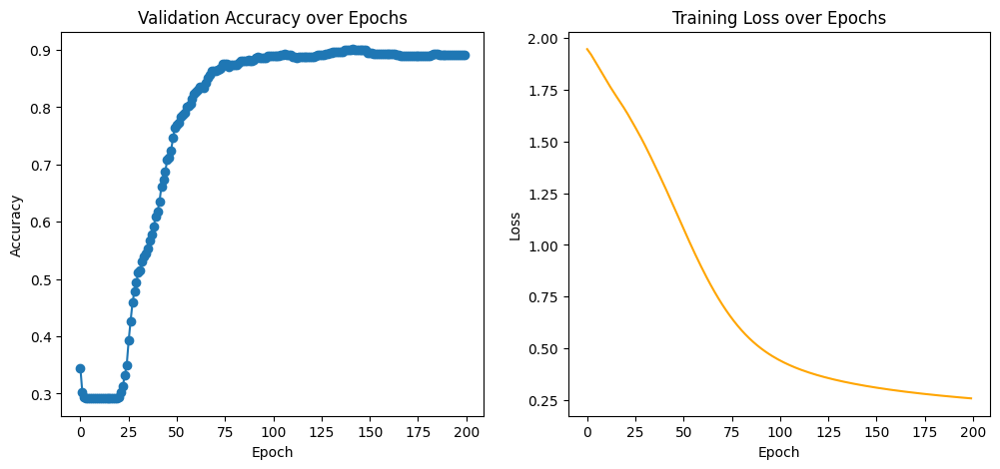

Model and optimizer saved to /content/drive/MyDrive/DATA_MINING/Homework_4/gcn_model.pth


In [ ]:
#GCN
hyperparams = {'learning_rate': 0.01, 'hidden_units': 16, 'dropout': 0.0, 'weight_decay': 0.0001, 'num_epochs': 200}

model = GCN(input_dim=data.num_node_features, hidden_dim=hyperparams['hidden_units'], dropout=hyperparams['dropout'], output_dim=cora_dataset.num_classes)
optimizer = torch.optim.Adam(model.parameters(), lr=hyperparams['learning_rate'], weight_decay=hyperparams['weight_decay'])

GCN_experiment = Experiment(model, "GCN_node_classification", optimizer)
GCN_experiment.run(data, epochs=hyperparams['num_epochs'])
GCN_experiment.plot_results("/content/drive/MyDrive/DATA_MINING/Homework_4")
#save
GCN_experiment.save_model('/content/drive/MyDrive/DATA_MINING/Homework_4/gcn_model.pth')

Starting Experiment: GAT_node_classification
Epoch: 1, Loss: 1.9462826251983643, Validation Accuracy: 0.2917505030181087
Epoch: 10, Loss: 1.5032938718795776, Validation Accuracy: 0.48088531187122735
Epoch: 20, Loss: 0.8697025179862976, Validation Accuracy: 0.8229376257545271
Epoch: 30, Loss: 0.47257518768310547, Validation Accuracy: 0.8953722334004024
Epoch: 40, Loss: 0.3364400565624237, Validation Accuracy: 0.8913480885311871
Epoch: 50, Loss: 0.2943180501461029, Validation Accuracy: 0.8873239436619719
Epoch: 60, Loss: 0.25975266098976135, Validation Accuracy: 0.8893360160965795
Epoch: 70, Loss: 0.2441132366657257, Validation Accuracy: 0.8853118712273642
Epoch: 80, Loss: 0.22650793194770813, Validation Accuracy: 0.8953722334004024
Epoch: 90, Loss: 0.21534083783626556, Validation Accuracy: 0.8853118712273642
Epoch: 100, Loss: 0.2018955796957016, Validation Accuracy: 0.8792756539235412
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.838176567924467, 'recall': 

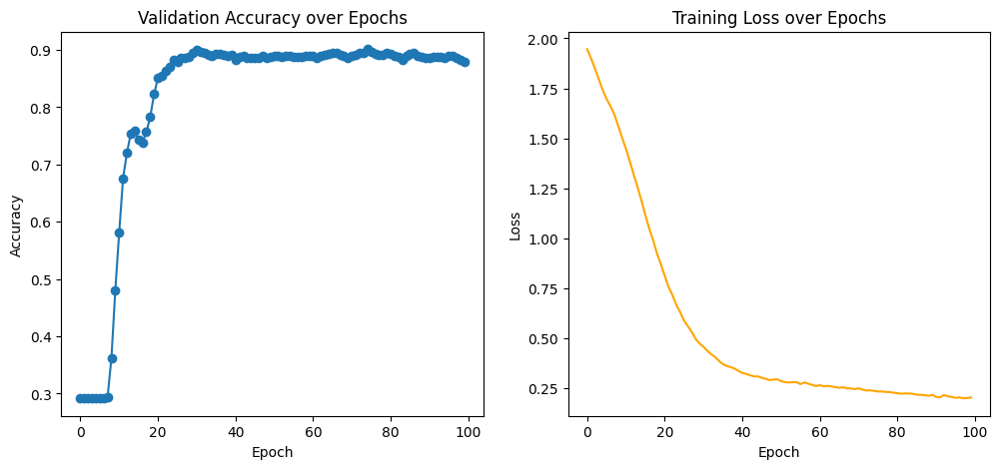

Model and optimizer saved to /content/drive/MyDrive/DATA_MINING/Homework_4/gat_model.pth


In [ ]:
#GAT
hyperparams = {'learning_rate': 0.005, 'hidden_units': 64, 'dropout': 0.75, 'num heads': 16, 'weight_decay': 0.0001, 'num_epochs': 100}
model = GAT(input_dim=data.num_node_features, hidden_dim=hyperparams['hidden_units'], dropout=hyperparams['dropout'], output_dim=cora_dataset.num_classes, heads=hyperparams['num heads'])
optimizer = torch.optim.Adam(model.parameters(), lr=hyperparams['learning_rate'], weight_decay=hyperparams['weight_decay'])

GAT_experiment = Experiment(model, "GAT_node_classification", optimizer)
GAT_experiment.run(data, epochs=hyperparams['num_epochs'])
GAT_experiment.plot_results("/content/drive/MyDrive/DATA_MINING/Homework_4")

GAT_experiment.save_model('/content/drive/MyDrive/DATA_MINING/Homework_4/gat_model.pth')

Starting Experiment: GraphSAGE_node_classification
Epoch: 1, Loss: 1.935041069984436, Validation Accuracy: 0.2917505030181087
Epoch: 10, Loss: 1.8703166246414185, Validation Accuracy: 0.2917505030181087
Epoch: 20, Loss: 1.7695256471633911, Validation Accuracy: 0.2917505030181087
Epoch: 30, Loss: 1.6782453060150146, Validation Accuracy: 0.30985915492957744
Epoch: 40, Loss: 1.5611544847488403, Validation Accuracy: 0.4305835010060362
Epoch: 50, Loss: 1.4187021255493164, Validation Accuracy: 0.49899396378269617
Epoch: 60, Loss: 1.278367042541504, Validation Accuracy: 0.613682092555332
Epoch: 70, Loss: 1.1733592748641968, Validation Accuracy: 0.7323943661971831
Epoch: 80, Loss: 1.0840617418289185, Validation Accuracy: 0.7947686116700201
Epoch: 90, Loss: 1.0371085405349731, Validation Accuracy: 0.8269617706237424
Epoch: 100, Loss: 0.9482163786888123, Validation Accuracy: 0.8511066398390342
Epoch: 110, Loss: 0.9090753197669983, Validation Accuracy: 0.8551307847082495
Epoch: 120, Loss: 0.85491

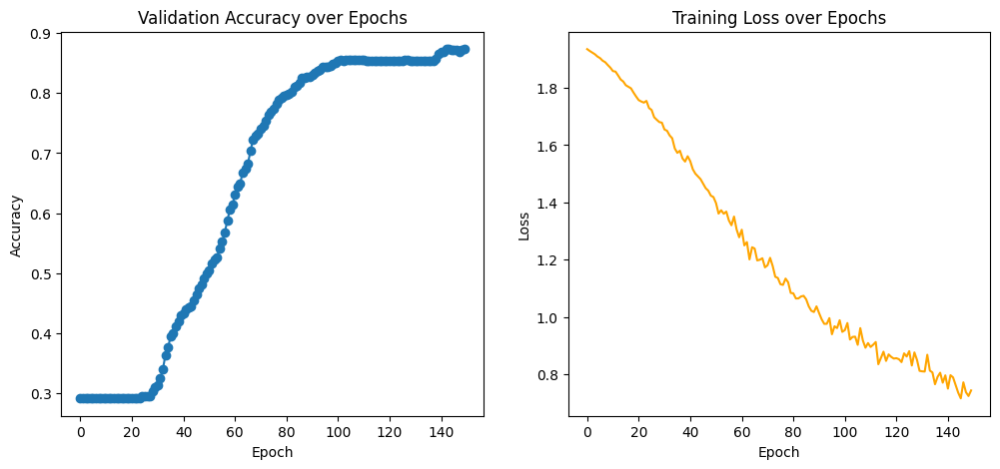

Model and optimizer saved to /content/drive/MyDrive/DATA_MINING/Homework_4/graphsage_model.pth


In [ ]:
#GraphSAGE
hyperparams = {'learning_rate': 0.005, 'hidden_units': 16, 'dropout': 0.75, 'aggregate function': 'mean', 'weight_decay': 0.0001, 'num_epochs': 150}

model = GraphSAGE(input_dim=data.num_node_features, hidden_dim=hyperparams['hidden_units'], dropout=hyperparams['dropout'], output_dim=cora_dataset.num_classes, aggr=hyperparams['aggregate function'])
optimizer = torch.optim.Adam(model.parameters(), lr=hyperparams['learning_rate'], weight_decay=hyperparams['weight_decay'])

GSAGE_experiment = Experiment(model, "GraphSAGE_node_classification", optimizer)
GSAGE_experiment.run(data, epochs=hyperparams['num_epochs'])
GSAGE_experiment.plot_results("/content/drive/MyDrive/DATA_MINING/Homework_4")

GSAGE_experiment.save_model('/content/drive/MyDrive/DATA_MINING/Homework_4/graphsage_model.pth')

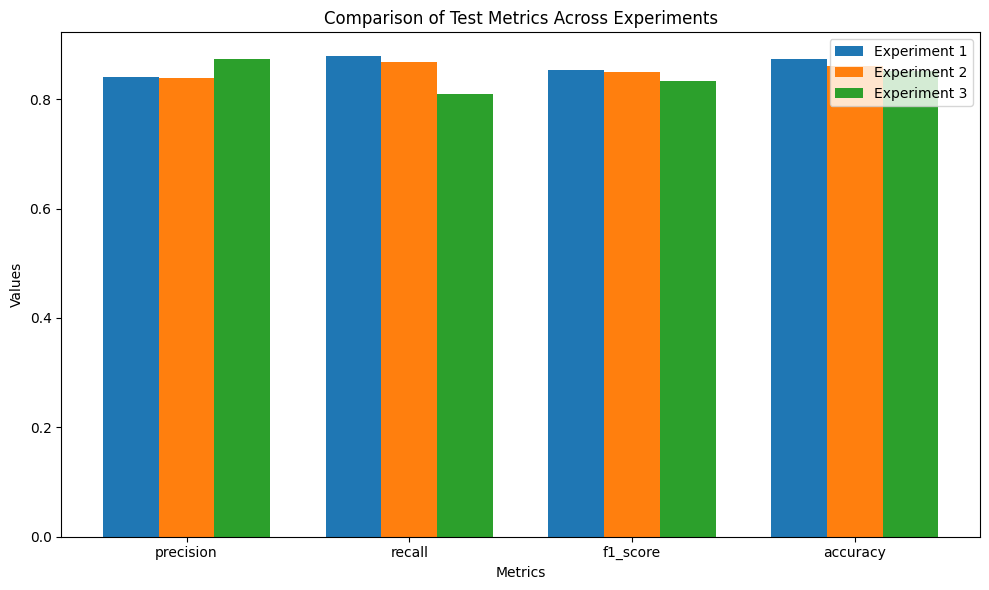

In [ ]:
experiments_metrics = [GCN_experiment.test_metrics, GAT_experiment.test_metrics, GSAGE_experiment.test_metrics]
plot_test_metrics(['precision', 'recall', 'f1_score', 'accuracy'], experiments_metrics, output_path='/content/drive/MyDrive/DATA_MINING/Homework_4/CoraClassification.png')

#Testing on PubMed and CiteSeer

For this we needed first to either apply some modification to the model or the input dataset to match it with the input layer of the model. PCA was tried to reduce dataset dimensionality, although unfortunately PubMed has less features then Cora, so we cannot use dimensionality reduction to have use our model on PubMed. That is why a padding approach was tried instead. So we have different approaches for the two different datasets. As a second approach, if we don't modify the datasets, we should at least modify in some way the GNN. So, the alternative approach was to apply SVD to the weight matrix of the input layer (or padding if the new dimension is smaller than the original one). Also, the output layer needs to be redefined as well to accomodate the differnt number of classes for PubMed and CiteSeer.
So far these solution do not offer great results.
The third successful attempt is to wrap the old model in a new model containing different and new input and output linear layers. This yielded the most successfull results.


In [ ]:
#Functions to apply dimensionality reduction if the new dataset has more features, or padding if the new dataset has less features
def preprocess_features_with_pca(data, target_dim):
    assert data.x.size(1) > target_dim, "Target dimension exceeds input dimension"
    #use pca to reduce dimensionalirt of dataset
    pca = PCA(n_components=target_dim)
    reduced_features = pca.fit_transform(data.x.cpu().numpy())
    data.x = torch.tensor(reduced_features, dtype=torch.float32).to(data.x.device)
    return data

def pad_features(data, target_dim):
    assert data.x.size(1) < target_dim, "Input dimension exceeds target dimension"
    current_dim = data.x.size(1)
    padding = torch.zeros(data.x.size(0), target_dim - current_dim) #build padding tensor
    data.x = torch.cat([data.x, padding], dim=1) #concatenate the tensor with data along the feature dimension
    return data

#Function to apply dimensionality reduction to a matrix, SVD for inpput matrices and pca for output matrices
def apply_svd(matrix, target_dim):

    svd = TruncatedSVD(n_components=target_dim)
    reduced_matrix = svd.fit_transform(matrix)
    #if the target dimension is bigger than the new reduced matrix dimension, we apply padding
    if target_dim > reduced_matrix.shape[1]:
      padding = np.zeros((reduced_matrix.shape[0], target_dim - reduced_matrix.shape[1]))
      reduced_matrix = np.concatenate((reduced_matrix, padding), axis=1)
    return reduced_matrix

def apply_pca(matrix, target_dim):
    pca = PCA(n_components=target_dim)
    reduced_matrix = pca.fit_transform(matrix)
    return reduced_matrix

#Function to project vector onto lower dim space with SVD
def apply_random_proj(vec, target_dim):
    transformer = GaussianRandomProjection(n_components=target_dim)
    vec = transformer.fit_transform(vec)
    return vec

#Functions to apply dimensionality reduciton or padding to the weight matrix of the input layer
def pad_first_input_layer_with_zeros(model, new_input_dim):
    conv_layer = model.conv1  # Access the first GCNConv layer
    current_input_dim = conv_layer.in_channels
    output_dim = conv_layer.out_channels
    layer_type = type(conv_layer)

    if new_input_dim <= current_input_dim:
        raise ValueError("new_input_dim must be greater than current input_dim.")

    if layer_type is SAGEConv: #sage needs to update two matrices

      w_node = conv_layer.lin_l.weight.data #get node features matrix and neighbour features matrix and pad them
      w_neig = conv_layer.lin_r.weight.data
      #create padded matrices
      new_wnode = torch.zeros(output_dim, new_input_dim)
      new_wneig = torch.zeros(output_dim, new_input_dim)
      with torch.no_grad():
          new_wnode[:, :current_input_dim] = w_node #copy old weights into the padded matrices in the right places
          new_wneig[:, :current_input_dim] = w_neig

      conv_layer.lin_l.weight = torch.nn.Parameter(new_wnode) #update the two sublayers
      conv_layer.lin_r.weight = torch.nn.Parameter(new_wneig)

    #GCN and GAT have only one matrix to update
    else:
      weight = conv_layer.lin.weight

      #create a new weight matrix with padded dimensions and copy weights
      if layer_type is GATConv: #with gat we need to take into account number of heads for attention
        heads = conv_layer.heads
        new_weight = torch.zeros(output_dim * heads, new_input_dim)
        with torch.no_grad():
            new_weight[:, :current_input_dim] = weight
      else: #Normal GCN workflow

        new_weight = torch.zeros(output_dim, new_input_dim)
        with torch.no_grad():
            new_weight[:, :current_input_dim] = weight

      # Update the weight parameter of the linear transformation
      conv_layer.lin.weight = torch.nn.Parameter(new_weight)

    return model

#Takes the weight matrix (or matrices for GSAGE) of the fist layer and reduces its dimension with SVD decomposition to be able to take in PubMed input
def reduce_first_input_layer(model, new_input_dim):
    conv_layer = model.conv1
    current_input_dim = conv_layer.in_channels
    output_dim = conv_layer.out_channels
    layer_type = type(conv_layer)

    if new_input_dim >= current_input_dim:
        raise ValueError("new_input_dim must be smaller than current input_dim.")

    #Contrary to the other models, GraphSAGE has two weight matrices, one for node features and the other for neighbours features to aggregate
    if layer_type is SAGEConv:
      weight_node_features = conv_layer.lin_l.weight.data.numpy()
      weight_neighborhood_features = conv_layer.lin_r.weight.data.numpy()
      reduced_weights_node = apply_svd(weight_node_features, new_input_dim)
      reduced_weights_neigh = apply_svd(weight_neighborhood_features, new_input_dim)
      reduced_weights_node_tensor = torch.tensor(reduced_weights_node, dtype=torch.float32)
      reduced_weights_neigh_tensor = torch.tensor(reduced_weights_neigh, dtype=torch.float32)
      with torch.no_grad():
          conv_layer.lin_l.weight = torch.nn.Parameter(reduced_weights_node_tensor)
          conv_layer.lin_r.weight = torch.nn.Parameter(reduced_weights_neigh_tensor)
    #Same workflow for one weight matrix for the other GNNs
    else:
      #Access the underlying weight matrix and perform truncated svd
      weight = conv_layer.lin.weight.data.numpy()
      weight = apply_svd(weight, new_input_dim)
      reduced_weights_tensor = torch.tensor(weight, dtype=torch.float32)
      with torch.no_grad():
          #Finally update the weight matrix
          conv_layer.lin.weight = torch.nn.Parameter(reduced_weights_tensor)
      conv_layer.in_channels = new_input_dim
    model.conv1 = conv_layer

    return model

#Function to reduce number of classes outputted by GNN too, the workflow followed is the same of the reduction of the input layer, but tweaked for the output layer
def reduce_num_classes(model, num_classes):
    conv_layer = model.conv2
    input_dim = conv_layer.in_channels
    current_output_dim = conv_layer.out_channels
    layer_type = type(conv_layer)
    new_output_dim = num_classes

    if layer_type is SAGEConv:
      weight_node_features = conv_layer.lin_l.weight.data.numpy().T
      weight_neighborhood_features = conv_layer.lin_r.weight.data.numpy().T

      #the node feature matrix has a bias vector to project too onto a lower dimensional space
      original_bias = conv_layer.lin_l.bias.data.numpy().reshape(1, -1)
      reprojected_bias = apply_random_proj(original_bias, new_output_dim)

      reduced_weights_node = apply_pca(weight_node_features, new_output_dim)
      reduced_weights_neigh = apply_pca(weight_neighborhood_features, new_output_dim)
      reduced_weights_node_tensor = torch.tensor(reduced_weights_node.T, dtype=torch.float32)
      reduced_weights_neigh_tensor = torch.tensor(reduced_weights_neigh.T, dtype=torch.float32)

      with torch.no_grad():
          conv_layer.lin_l.bias = torch.nn.Parameter(torch.tensor(reprojected_bias, dtype=torch.float32))
          conv_layer.lin_l.weight = torch.nn.Parameter(reduced_weights_node_tensor)
          conv_layer.lin_r.weight = torch.nn.Parameter(reduced_weights_neigh_tensor)

    else:
      weight = conv_layer.lin.weight.data.numpy().T
      reduced_weights = apply_pca(weight, new_output_dim)
      reduced_weights_tensor = torch.tensor(reduced_weights.T, dtype=torch.float32)

      with torch.no_grad():
          conv_layer.lin.weight = torch.nn.Parameter(reduced_weights_tensor)

          #reducing the output involves also reducing additional vectors that the GNNs make use of, by projecting them onto a lower dimensional space
          #we can still achieve this projection with SVD, even though there is no variance between different vectors to compute (as in  a matrix)
          #project the original bias vector onto the reduced space and update the layer's bias vector to the new output dimension using random projections instead
          original_bias = conv_layer.bias.data.numpy().reshape(1, -1)
          reprojected_bias = apply_random_proj(original_bias, new_output_dim)
          conv_layer.bias = torch.nn.Parameter(torch.tensor(reprojected_bias, dtype=torch.float32))

      #GAT makes use of two other learnable vectors that are use for calculating attention weights that need updating
      if layer_type is GATConv:
        #again reproject the original vectors into the new reduced space using Random projections and update the layers
        or_att_src = conv_layer.att_src.data.squeeze().numpy().reshape(1, -1)
        or_att_dst = conv_layer.att_dst.data.squeeze().numpy().reshape(1, -1)
        reprojected_att_src = apply_random_proj(or_att_src, new_output_dim)
        reprojected_att_dst = apply_random_proj(or_att_dst, new_output_dim)
        with torch.no_grad():
            #update attention vectors
            conv_layer.att_src = torch.nn.Parameter(torch.tensor(reprojected_att_src, dtype=torch.float32))
            conv_layer.att_dst = torch.nn.Parameter(torch.tensor(reprojected_att_dst, dtype=torch.float32))

      conv_layer.out_channels = new_output_dim

    model.conv2 = conv_layer
    return model

#Third approach: add an input and output linear layers and train only those
class ModifiedGNN(torch.nn.Module):
    def __init__(self, pretrained_model, new_input_dim, dropout, new_output_dim):
        super(ModifiedGNN, self).__init__()
        self.dropout=dropout
        #freeze the pretrained model's layers
        self.frozen_layers = torch.nn.ModuleList(pretrained_model.children())
        for layer in self.frozen_layers:
            for param in layer.parameters():
                param.requires_grad = False

        #add new input and output layers to adapt the network to the new dataset
        self.new_input_layer = torch.nn.Linear(new_input_dim, pretrained_model.conv1.in_channels)
        self.new_output_layer = torch.nn.Linear(pretrained_model.conv2.out_channels, new_output_dim)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.new_input_layer(x) #use new input layer
        x = self.frozen_layers[0](x, edge_index) #frozen layer 1
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.frozen_layers[1](x, edge_index) #frozen layer 2
        x = self.new_output_layer(x) #use new output layer
        return F.log_softmax(x, dim=1)

#Takes old model, new dataset, old optimizer and num epochs and trains only the input and output layers, freezing the old model
def train_modified_model(experiment, data, epochs, weight_decay, lr, num_classes, dropout):
    pretrained_model = experiment.model
    new_input_dim = data.num_features
    new_output_dim = num_classes

    #wrap the old model with the new I/O layers and train them
    model = ModifiedGNN(pretrained_model, new_input_dim, dropout, new_output_dim)
    optimizer = torch.optim.Adam(
        filter(lambda p: p.requires_grad, model.parameters()), #compute optimization only for non-trained layers, save computation time
        lr=lr,
        weight_decay=weight_decay
    )

    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()
        out = model(data)
        loss = F.nll_loss(out[data.train_mask], data.y[data.train_mask])
        loss.backward()
        optimizer.step()
    return model


In [ ]:
#Hyperparameters to load trained models
gcn_hyperparams = {'learning_rate': 0.01, 'hidden_units': 16, 'dropout': 0.0, 'weight_decay': 0.0001, 'num_epochs': 200}
gat_hyperparams = {'learning_rate': 0.005, 'hidden_units': 64, 'dropout': 0.75, 'num heads': 16, 'weight_decay': 0.0001, 'num_epochs': 100}
gsage_hyperparams = {'learning_rate': 0.005, 'hidden_units': 16, 'dropout': 0.75, 'aggregate function': 'mean', 'weight_decay': 0.0001, 'num_epochs': 150}
warnings.filterwarnings("ignore", category=FutureWarning, message=".*torch.load.*") #suppress torch.load warnings for clarity of print
warnings.filterwarnings("ignore", category=UndefinedMetricWarning) #warning coming from the fact that the model doesn't predict any instance of one class for recall and precision
metrics_names = ['precision', 'recall', 'f1_score', 'accuracy']

We apply here all the techniques described above and collect the results.

GCN Evaluation on other datasets:
Metrics on PubMed are: {'precision': 0.519957249908878, 'recall': 0.3182336199285352, 'f1_score': 0.23664039375531068, 'accuracy': 0.323}
Metrics on CiteSeer for GCN are: {'precision': 0.102817099002545, 'recall': 0.18504193780436873, 'f1_score': 0.07658201651375714, 'accuracy': 0.178}

GAT Evaluation on other datasets:
Metrics on PubMed are: {'precision': 0.2383008447215571, 'recall': 0.2452216469165622, 'f1_score': 0.22122988126653906, 'accuracy': 0.228}
Metrics on CiteSeer for GAT are: {'precision': 0.10784384185881041, 'recall': 0.13805957111311978, 'f1_score': 0.08055573602633713, 'accuracy': 0.095}

GraphSAGE Evaluation on other datasets:
Metrics on PubMed are: {'precision': 0.46248077954472205, 'recall': 0.3364356652492246, 'f1_score': 0.24252969237920022, 'accuracy': 0.396}
Metrics on CiteSeer for GraphSAGE are: {'precision': 0.2257505634309378, 'recall': 0.19514707561881384, 'f1_score': 0.14243471838192123, 'accuracy': 0.222}

Plotting Pubmed 

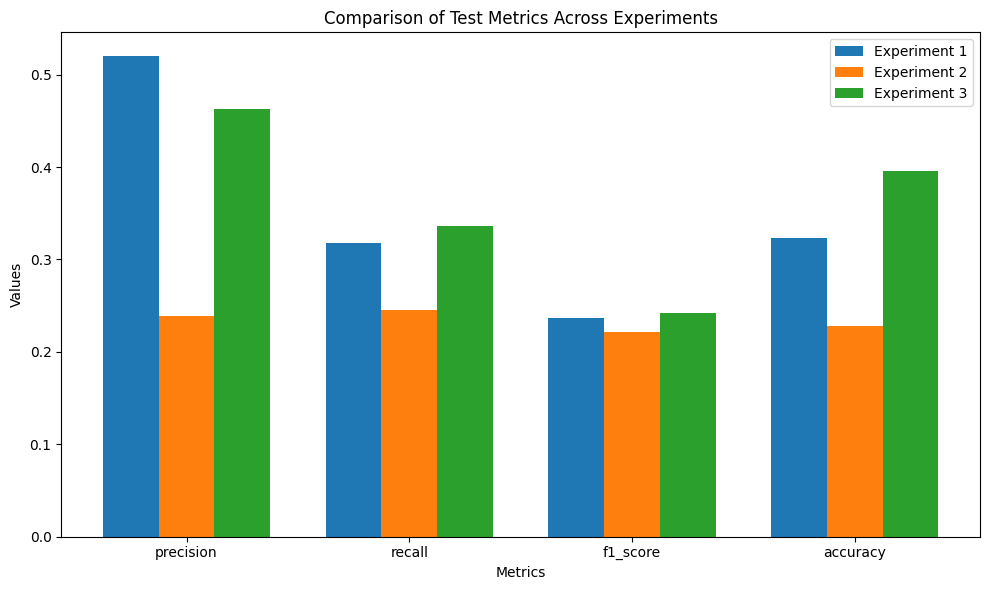

Plotting CiteSeer Dimensionality Reduction Results


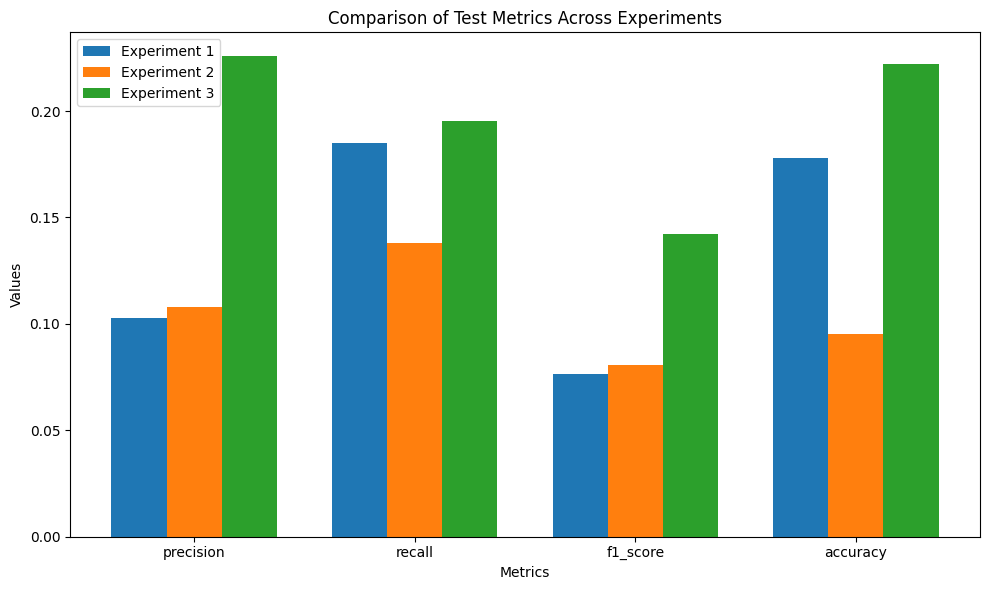

In [ ]:
#Reduce dimensionality for citeseer and pad the one for pubmed
citeseer_dataset_reduced = preprocess_features_with_pca(citeseer_dataset[0], cora_dataset[0].num_node_features)
pubmed_dataset_reduced = pad_features(pubmed_dataset[0], cora_dataset[0].num_node_features)

#GCN
print("GCN Evaluation on other datasets:")
GCN_experiment = load_experiment(hyperparams=gcn_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/gcn_model.pth')
GCN_experiment.model = reduce_num_classes(GCN_experiment.model, pubmed_dataset.num_classes)
print(f"Metrics on PubMed are: {GCN_experiment.test(pubmed_dataset_reduced)}")
gcn_pubmed_test_metrics = GCN_experiment.test_metrics
GCN_experiment = load_experiment(hyperparams=gcn_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/gcn_model.pth')
GCN_experiment.model = reduce_num_classes(GCN_experiment.model, citeseer_dataset.num_classes)
print(f"Metrics on CiteSeer for GCN are: {GCN_experiment.test(citeseer_dataset_reduced)}\n")

#GAT
print("GAT Evaluation on other datasets:")
GAT_experiment = load_experiment(hyperparams=gat_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/gat_model.pth', type="GAT")
GAT_experiment.model = reduce_num_classes(GAT_experiment.model, pubmed_dataset.num_classes)
print(f"Metrics on PubMed are: {GAT_experiment.test(pubmed_dataset_reduced)}")
gat_pubmed_test_metrics = GAT_experiment.test_metrics
GAT_experiment = load_experiment(hyperparams=gat_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/gat_model.pth', type="GAT")
GAT_experiment.model = reduce_num_classes(GAT_experiment.model, citeseer_dataset.num_classes)
print(f"Metrics on CiteSeer for GAT are: {GAT_experiment.test(citeseer_dataset_reduced)}\n")

#GraphSAGE
print("GraphSAGE Evaluation on other datasets:")
GSAGE_experiment = load_experiment(hyperparams=gsage_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/graphsage_model.pth', type="GraphSAGE")
GSAGE_experiment.model = reduce_num_classes(GSAGE_experiment.model, pubmed_dataset.num_classes)
print(f"Metrics on PubMed are: {GSAGE_experiment.test(pubmed_dataset_reduced)}")
gsage_pubmed_test_metrics = GSAGE_experiment.test_metrics
GSAGE_experiment = load_experiment(hyperparams=gsage_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/graphsage_model.pth', type="GraphSAGE")
GSAGE_experiment.model = reduce_num_classes(GSAGE_experiment.model, citeseer_dataset.num_classes)
print(f"Metrics on CiteSeer for GraphSAGE are: {GSAGE_experiment.test(citeseer_dataset_reduced)}\n")

experiments_metrics_pubmed = [gcn_pubmed_test_metrics, gat_pubmed_test_metrics, gsage_pubmed_test_metrics]
experiments_metrics_citeseer = [GCN_experiment.test_metrics, GAT_experiment.test_metrics, GSAGE_experiment.test_metrics]
plot_test_metrics(metrics_names, experiments_metrics_pubmed, output_path='/content/drive/MyDrive/DATA_MINING/Homework_4/ChangeDatasetsDimensionsPubmed.png', name_plot="Pubmed Padding Results")
plot_test_metrics(metrics_names, experiments_metrics_citeseer, output_path='/content/drive/MyDrive/DATA_MINING/Homework_4/ChangeDatasetsDimensionsCiteSeer.png', name_plot="CiteSeer Dimensionality Reduction Results")

GCN Evaluation on other datasets:
Metrics on PubMed for GCN are: {'precision': 0.1550896691083607, 'recall': 0.32802802802802805, 'f1_score': 0.19884512316817474, 'accuracy': 0.398}

Metrics on CiteSeer for GCN are: {'precision': 0.04537421238666053, 'recall': 0.1687833345291909, 'f1_score': 0.034768058008738494, 'accuracy': 0.082}

GAT Evaluation on other datasets:
Metrics on PubMed for GAT are: {'precision': 0.21947492798655568, 'recall': 0.2236128159856973, 'f1_score': 0.20558195836837875, 'accuracy': 0.257}

Metrics on CiteSeer for GAT are: {'precision': 0.2633085560961868, 'recall': 0.1605482451981602, 'f1_score': 0.06354029954331065, 'accuracy': 0.096}

GraphSAGE Evaluation on other datasets:
Metrics on PubMed for GSAGE are: {'precision': 0.33435685472930193, 'recall': 0.35561645731137254, 'f1_score': 0.24984704406229943, 'accuracy': 0.409}

Metrics on CiteSeer for GSAGE are: {'precision': 0.0385, 'recall': 0.16666666666666666, 'f1_score': 0.06255077173030056, 'accuracy': 0.231}


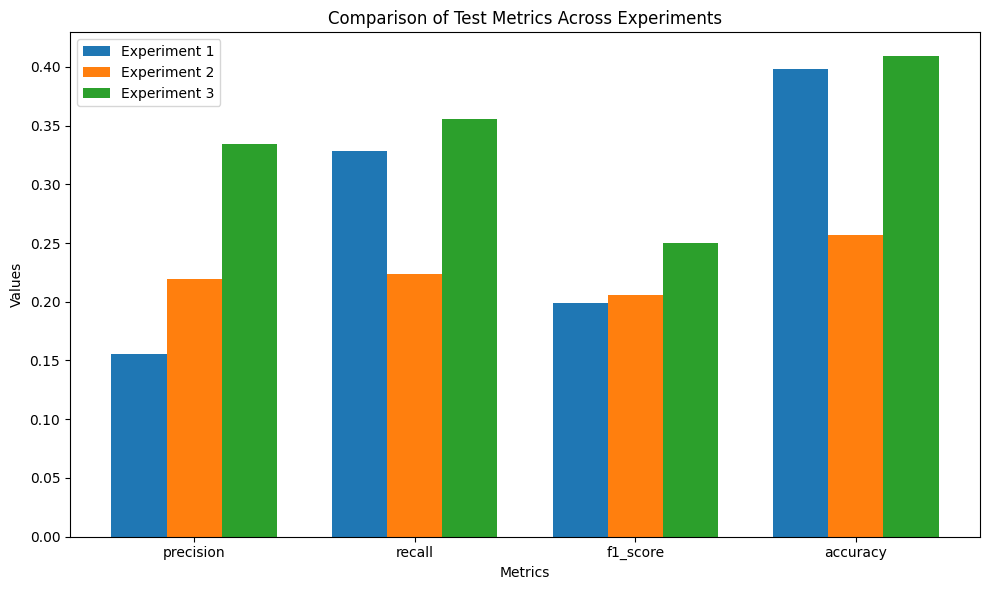

Plotting CiteSeer Dimensionality Reduction GNN Results


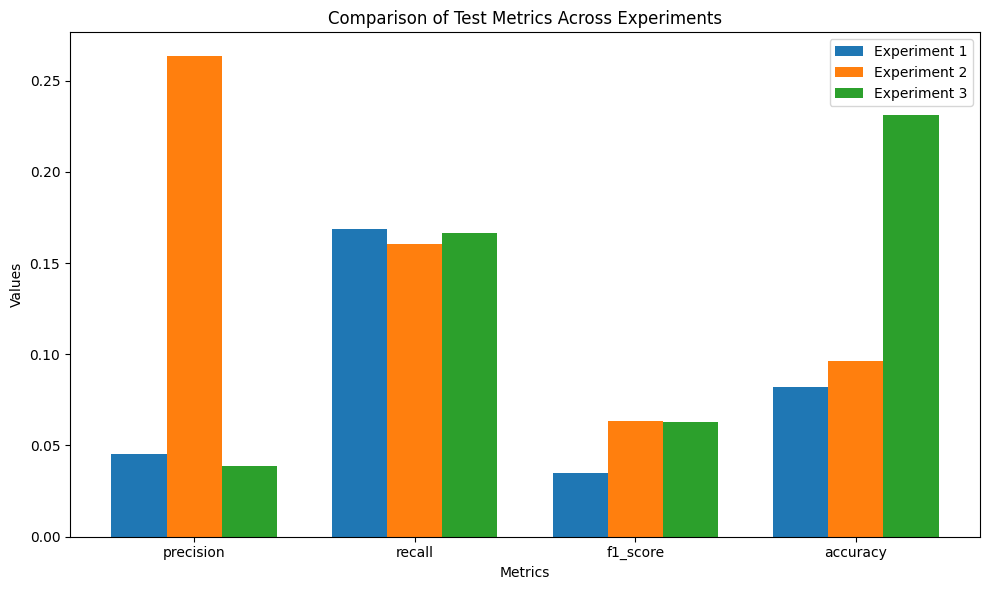

In [ ]:
#Reduce or pad dimensionality of GNNs input layer weights' matrices
#GCN
print("GCN Evaluation on other datasets:")
GCN_experiment_pubmed = load_experiment(hyperparams=gcn_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/gcn_model.pth')
GCN_experiment_pubmed.model = reduce_first_input_layer(GCN_experiment_pubmed.model, pubmed_dataset[0].num_features)
GCN_experiment_pubmed.model = reduce_num_classes(GCN_experiment_pubmed.model, pubmed_dataset.num_classes)
print(f"Metrics on PubMed for GCN are: {GCN_experiment_pubmed.test(pubmed_dataset[0])}\n")
GCN_experiment_citeseer = load_experiment(hyperparams=gcn_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/gcn_model.pth')
GCN_experiment_citeseer.model = pad_first_input_layer_with_zeros(GCN_experiment_citeseer.model, citeseer_dataset[0].num_features)
GCN_experiment_citeseer.model = reduce_num_classes(GCN_experiment_citeseer.model, citeseer_dataset.num_classes)
print(f"Metrics on CiteSeer for GCN are: {GCN_experiment_citeseer.test(citeseer_dataset[0])}\n")

#GAT
print("GAT Evaluation on other datasets:")
GAT_experiment_pubmed = load_experiment(hyperparams=gat_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/gat_model.pth', type="GAT")
GAT_experiment_pubmed.model = reduce_first_input_layer(GAT_experiment_pubmed.model, pubmed_dataset[0].num_features)
GAT_experiment_pubmed.model = reduce_num_classes(GAT_experiment_pubmed.model, pubmed_dataset.num_classes)
print(f"Metrics on PubMed for GAT are: {GAT_experiment_pubmed.test(pubmed_dataset[0])}\n")
GAT_experiment_citeseer = load_experiment(hyperparams=gat_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/gat_model.pth', type="GAT")
GAT_experiment_citeseer.model = pad_first_input_layer_with_zeros(GAT_experiment_citeseer.model, citeseer_dataset[0].num_features)
GAT_experiment_citeseer.model = reduce_num_classes(GAT_experiment_citeseer.model, citeseer_dataset.num_classes)
print(f"Metrics on CiteSeer for GAT are: {GAT_experiment_citeseer.test(citeseer_dataset[0])}\n")

#GraphSAGE
print("GraphSAGE Evaluation on other datasets:")
GSAGE_experiment_pubmed = load_experiment(hyperparams=gsage_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/graphsage_model.pth', type="GraphSAGE")
GSAGE_experiment_pubmed.model = reduce_first_input_layer(GSAGE_experiment_pubmed.model, pubmed_dataset[0].num_features)
GSAGE_experiment_pubmed.model = reduce_num_classes(GSAGE_experiment_pubmed.model, pubmed_dataset.num_classes)
print(f"Metrics on PubMed for GSAGE are: {GSAGE_experiment_pubmed.test(pubmed_dataset[0])}\n")
GSAGE_experiment_citeseer = load_experiment(hyperparams=gsage_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/graphsage_model.pth', type="GraphSAGE")
GSAGE_experiment_citeseer.model = pad_first_input_layer_with_zeros(GSAGE_experiment_citeseer.model, citeseer_dataset[0].num_features)
GSAGE_experiment_citeseer.model = reduce_num_classes(GSAGE_experiment_citeseer.model, citeseer_dataset.num_classes)
print(f"Metrics on CiteSeer for GSAGE are: {GSAGE_experiment_citeseer.test(citeseer_dataset[0])}\n")

experiments_metrics_pubmed = [GCN_experiment_pubmed.test_metrics, GAT_experiment_pubmed.test_metrics, GSAGE_experiment_pubmed.test_metrics]
experiments_metrics_citeseer = [GCN_experiment_citeseer.test_metrics, GAT_experiment_citeseer.test_metrics, GSAGE_experiment_citeseer.test_metrics]
plot_test_metrics(metrics_names, experiments_metrics_pubmed, output_path='/content/drive/MyDrive/DATA_MINING/Homework_4/ChangeWeightMatrixDimensionsPubmed.png', name_plot="Pubmed Padding GNN Results")
plot_test_metrics(metrics_names, experiments_metrics_citeseer, output_path='/content/drive/MyDrive/DATA_MINING/Homework_4/ChangeWeightMatrixDimensionsCiteSeer.png', name_plot="CiteSeer Dimensionality Reduction GNN Results")

GCN Evaluation on other datasets:
Metrics on PubMed for GCN are: {'precision': 0.7370562107748944, 'recall': 0.767603086247154, 'f1_score': 0.747447634971332, 'accuracy': 0.75}
Metrics on CiteSeer for GCN are: {'precision': 0.6339051622745928, 'recall': 0.6023773823510862, 'f1_score': 0.6022080552670557, 'accuracy': 0.617}

GAT Evaluation on other datasets:
Metrics on PubMed for GAT are: {'precision': 0.7112031485182717, 'recall': 0.7361590293793684, 'f1_score': 0.7203495837842055, 'accuracy': 0.724}
Metrics on CiteSeer for GAT are: {'precision': 0.5965135209154347, 'recall': 0.590860556222594, 'f1_score': 0.5786907007322, 'accuracy': 0.625}

GraphSAGE Evaluation on other datasets:
Metrics on for GraphSAGE PubMed are: {'precision': 0.7294969260758734, 'recall': 0.743836704853654, 'f1_score': 0.7331310096766952, 'accuracy': 0.739}
Metrics on CiteSeer for GraphSAGE are: {'precision': 0.6080816904701671, 'recall': 0.5993764794019788, 'f1_score': 0.5984212869347895, 'accuracy': 0.621}

Plo

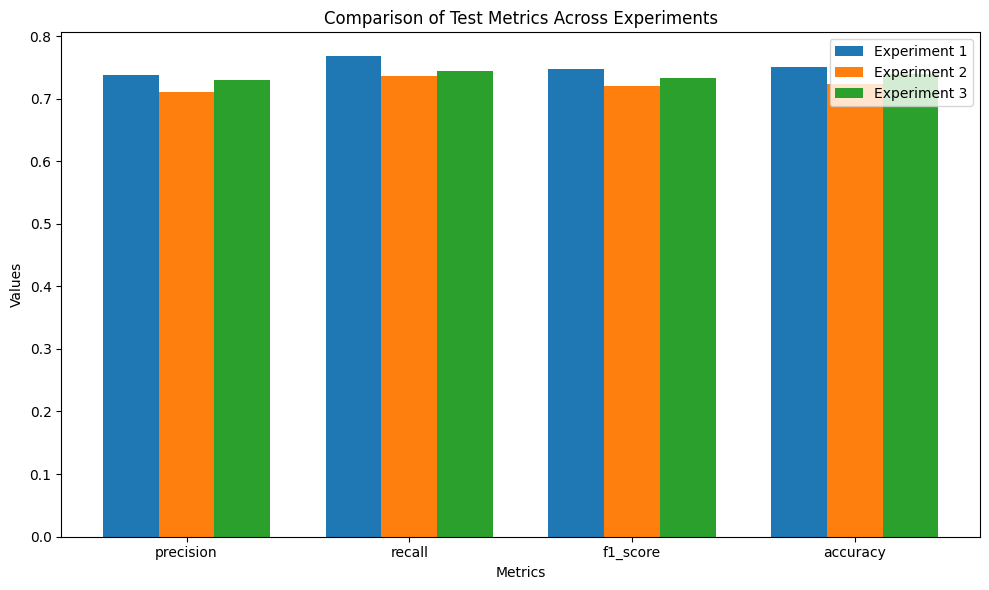

Plotting CiteSeer Train New Input Output Layers Results


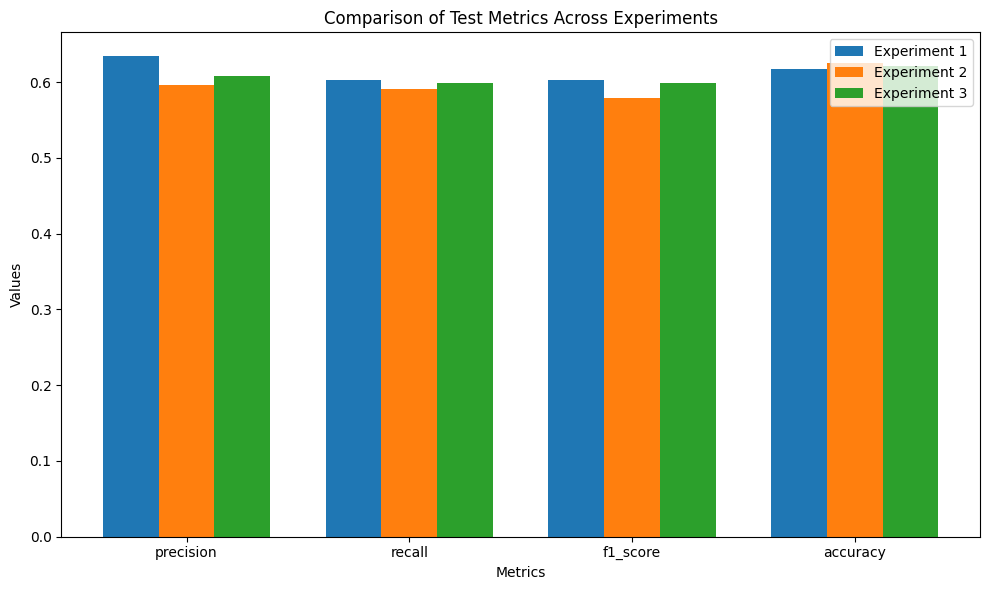

In [ ]:
#Here we wrap the models with an ulterior input and output layers to match the dimensionality of the different datasets and we train only those new layers
#GCN
print("GCN Evaluation on other datasets:")
GCN_experiment_pubmed = load_experiment(hyperparams=gcn_hyperparams,load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/gcn_model.pth')
GCN_experiment_pubmed.model = train_modified_model(experiment=GCN_experiment_pubmed, data=pubmed_dataset[0], epochs=150, weight_decay=gcn_hyperparams['weight_decay'], lr=gcn_hyperparams['learning_rate'], num_classes=pubmed_dataset.num_classes, dropout=gcn_hyperparams['dropout'])
print(f"Metrics on PubMed for GCN are: {GCN_experiment_pubmed.test(pubmed_dataset[0])}")
GCN_experiment_citeseer = load_experiment(hyperparams=gcn_hyperparams,load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/gcn_model.pth')
GCN_experiment_citeseer.model = train_modified_model(GCN_experiment_citeseer, citeseer_dataset[0], epochs=150, weight_decay=gcn_hyperparams['weight_decay'], lr=gcn_hyperparams['learning_rate'], num_classes=citeseer_dataset.num_classes, dropout=gcn_hyperparams['dropout'])
print(f"Metrics on CiteSeer for GCN are: {GCN_experiment_citeseer.test(citeseer_dataset[0])}\n")

#GAT
print("GAT Evaluation on other datasets:")
GAT_experiment_pubmed = load_experiment(hyperparams=gat_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/gat_model.pth', type="GAT")
GAT_experiment_pubmed.model = train_modified_model(experiment=GAT_experiment_pubmed, data=pubmed_dataset[0], epochs=150, weight_decay=gat_hyperparams['weight_decay'], lr=gat_hyperparams['learning_rate'], num_classes=pubmed_dataset.num_classes, dropout=gat_hyperparams['dropout'])
print(f"Metrics on PubMed for GAT are: {GAT_experiment_pubmed.test(pubmed_dataset[0])}")
GAT_experiment_citeseer = load_experiment(hyperparams=gat_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/gat_model.pth', type="GAT")
GAT_experiment_citeseer.model = train_modified_model(experiment=GAT_experiment_citeseer, data=citeseer_dataset[0], epochs=150, weight_decay=gat_hyperparams['weight_decay'], lr=gat_hyperparams['learning_rate'], num_classes=citeseer_dataset.num_classes, dropout=gat_hyperparams['dropout'])
print(f"Metrics on CiteSeer for GAT are: {GAT_experiment_citeseer.test(citeseer_dataset[0])}\n")

#GraphSAGE
print("GraphSAGE Evaluation on other datasets:")
GSAGE_experiment_pubmed = load_experiment(hyperparams=gsage_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/graphsage_model.pth', type="GraphSAGE")
GSAGE_experiment_pubmed.model = train_modified_model(experiment=GSAGE_experiment_pubmed, data=pubmed_dataset[0], epochs=150, weight_decay=gsage_hyperparams['weight_decay'], lr=gsage_hyperparams['learning_rate'], num_classes=pubmed_dataset.num_classes, dropout=gsage_hyperparams['dropout'])
print(f"Metrics on for GraphSAGE PubMed are: {GSAGE_experiment_pubmed.test(pubmed_dataset[0])}")
GSAGE_experiment_citeseer = load_experiment(hyperparams=gsage_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/graphsage_model.pth', type="GraphSAGE")
GSAGE_experiment_citeseer.model = train_modified_model(experiment=GSAGE_experiment_citeseer, data=citeseer_dataset[0], epochs=150, weight_decay=gsage_hyperparams['weight_decay'], lr=gsage_hyperparams['learning_rate'], num_classes=citeseer_dataset.num_classes, dropout=gsage_hyperparams['dropout'])
print(f"Metrics on CiteSeer for GraphSAGE are: {GSAGE_experiment_citeseer.test(citeseer_dataset[0])}\n")

experiments_metrics_pubmed = [GCN_experiment_pubmed.test_metrics, GAT_experiment_pubmed.test_metrics, GSAGE_experiment_pubmed.test_metrics]
experiments_metrics_citeseer = [GCN_experiment_citeseer.test_metrics, GAT_experiment_citeseer.test_metrics, GSAGE_experiment_citeseer.test_metrics]
plot_test_metrics(metrics_names, experiments_metrics_pubmed, output_path='/content/drive/MyDrive/DATA_MINING/Homework_4/TrainNewIOLayersDimensionsPubmed.png', name_plot="Pubmed Train New Input Output Layers Results")
plot_test_metrics(metrics_names, experiments_metrics_citeseer, output_path='/content/drive/MyDrive/DATA_MINING/Homework_4/TrainNewIOLayersDimensionsCiteSeer.png', name_plot="CiteSeer Train New Input Output Layers Results")

#Edge Prediction Task

We define the link prediction task as a binary task predicting whether a certain edge exists or not. For this purpose, we define a dataset by extracting all the positive edges from the cora dataset and generating a number of negative (labeled as non-existing) equal to the number of edges for the validation and test datasets. We then expand the Experiment class to edge prediction to include the usage of the new dataset pieces, the calculation of the ROC-AUC metric, and a better loss criterion for our purposes.
The GCN, GAT and GSAGE classes are redefined as GCNEP, GATEP AND GSAGEEP for edge prediction task, and they include the possibilities of doing the dot product between the node embeddings or to concatenatenate the vectors and pass them through a simple multi-layer perceptron.

In [ ]:
#DATA PREPARATION
G = to_networkx(data, to_undirected=True)
pos = nx.spring_layout(G, seed=0)

split = RandomLinkSplit(
    num_val=0.05,
    num_test=0.1,
    is_undirected=True,
    add_negative_train_samples=False, #train set has no negative edges, they will be added dynamically later
    neg_sampling_ratio=1.0,
)
train_data, val_data, test_data = split(data) #get data splits

In [ ]:
#Declare the EP (edge prediction) classes
#We change the GCN model into a GCNEP (edge prediction) model that can either apply concatenation and input into a feed-forward network or can compute dot product.
#Prediction is divided into two steps: encode(embedding production) and predict
class GCNEP(torch.nn.Module):
    def __init__(self, input_dim, hidden_dim, dropout, use_concatenation=False):
        super(GCNEP, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GCNConv(hidden_dim, hidden_dim) #this not the output layer anymore
        self.dropout = dropout

        self.use_concatenation = use_concatenation
        if use_concatenation:
          self.fc = torch.nn.Linear(2 * hidden_dim, 1) #When we use concatenation we add a feed forward layer

    #Produces embeddings as normal GCN
    def encode(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)
        return self.conv2(x, edge_index)

    #Does the actual prediction, returning scores to be tranformed into probabilities w
    def predict(self, node_embeds, edge_label_index):

        #for the output, we do dot product of the two embeddings and pass it to a sigmoid
        if self.use_concatenation:
            #concatenate node embeddings for the source and target nodes of each edge
            edge_embeds = torch.cat([node_embeds[edge_label_index[0]], node_embeds[edge_label_index[1]]], dim=1)
            scores = self.fc(edge_embeds).squeeze()
        else:
            #dot product approach
            edge_embeds = node_embeds[edge_label_index]  #extract embeddings for source and target nodes
            scores = (edge_embeds[0] * edge_embeds[1]).sum(dim=1)  #compute dot product and sum result over hidden_dim
        return scores

    def forward(self, data):
        x = self.encode(data)
        return self.predict(x, data.edge_label_index).squeeze().sigmoid() #apply final sigmoid to get probabilities

#Same transformations for edge predictions apply for GAT and GraphSAGE
class GATEP(torch.nn.Module):
    def __init__(self, input_dim, hidden_dim, dropout, heads=1, use_concatenation=False):
        super(GATEP, self).__init__()
        self.conv1 = GATConv(input_dim, hidden_dim, heads=heads, concat=True)
        self.conv2 = GATConv(hidden_dim * heads, hidden_dim, heads=1, concat=True)
        self.dropout = dropout

        self.use_concatenation = use_concatenation
        if use_concatenation:
            self.fc = torch.nn.Linear(2 * hidden_dim, 1)

    def encode(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)
        return self.conv2(x, edge_index)

    def predict(self, node_embeds, edge_label_index):
        if self.use_concatenation:
            edge_embeds = torch.cat([node_embeds[edge_label_index[0]], node_embeds[edge_label_index[1]]], dim=1)
            scores = self.fc(edge_embeds).squeeze()
        else:
            edge_embeds = node_embeds[edge_label_index]
            scores = (edge_embeds[0] * edge_embeds[1]).sum(dim=1)
        return scores

    def forward(self, data):
        x = self.encode(data)
        return self.predict(x, data.edge_label_index).squeeze().sigmoid()

class GraphSAGEEP(torch.nn.Module):
    def __init__(self, input_dim, hidden_dim, dropout, aggr='mean', use_concatenation=False):
        super(GraphSAGEEP, self).__init__()
        self.conv1 = SAGEConv(input_dim, hidden_dim, aggr=aggr)
        self.conv2 = SAGEConv(hidden_dim, hidden_dim, aggr=aggr)
        self.dropout = dropout

        self.use_concatenation = use_concatenation
        if use_concatenation:
            self.fc = torch.nn.Linear(2 * hidden_dim, 1)

    def encode(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)
        return self.conv2(x, edge_index)

    def predict(self, node_embeds, edge_label_index):
        if self.use_concatenation:
            edge_embeds = torch.cat([node_embeds[edge_label_index[0]], node_embeds[edge_label_index[1]]], dim=1)
            scores = self.fc(edge_embeds).squeeze()
        else:
            edge_embeds = node_embeds[edge_label_index]
            scores = (edge_embeds[0] * edge_embeds[1]).sum(dim=1)
        return scores

    def forward(self, data):
        x = self.encode(data)
        return self.predict(x, data.edge_label_index).squeeze().sigmoid()

#ExperimentEP overrides many functions of experiment and adds new functions to handle the binary classification task
class ExperimentEP(Experiment):
    def __init__(self, model, experiment_name, optimizer, use_gpu=False, criterion=torch.nn.BCEWithLogitsLoss()):
        super().__init__(model, experiment_name, optimizer, use_gpu)
        self.history = {"loss": [], "val_auc": []}
        self.criterion = criterion

    #Training function has to sample edges
    def train_fn(self, train_data):
        #For the training we sample negative edges after the embedding and predict result
        self.model.train()
        self.optimizer.zero_grad()
        x = self.model.encode(train_data) #get embedding
        neg_edge_index = negative_sampling( #samples negative edges for training data
            edge_index=train_data.edge_index,
            num_nodes=train_data.num_nodes,
            num_neg_samples=train_data.edge_label_index.size(1),
            method='sparse'
        )
        #concatenates labels for positive and negative edges
        edge_label_index = torch.cat([train_data.edge_label_index, neg_edge_index], dim=-1)
        edge_label = torch.cat([
            train_data.edge_label,
            train_data.edge_label.new_zeros(neg_edge_index.size(1))
        ], dim=0)

        out = self.model.predict(x, edge_label_index)
        loss = self.criterion(out, edge_label)
        loss.backward()
        self.optimizer.step()
        return loss.item()

    #Validation with ROC-AUC
    def validate(self, data):
        self.model.eval()
        out = self.model(data)
        return roc_auc_score(data.edge_label.cpu().numpy(), out.detach().cpu().numpy())

    #Test function also calculates ROC-AUC metric
    def test(self, data, threshold=0.5):

        self.model.eval()
        with torch.no_grad():
          pred_scores = self.model(data)
          pred_labels = (pred_scores > threshold).float() #use 0.5 as threshold
        test_labels = data.edge_label

        pred_scores = pred_scores.cpu().numpy()
        pred_labels = pred_labels.cpu().numpy()
        test_labels = test_labels.cpu().numpy()

        #Calculate metrics with ROC-AUC as fifth metric
        precision = precision_score(test_labels, pred_labels, average='macro')
        recall = recall_score(test_labels, pred_labels, average='macro')
        f1 = f1_score(test_labels, pred_labels, average='macro')
        accuracy = accuracy_score(test_labels, pred_labels)
        roc_auc = roc_auc_score(test_labels, pred_scores)

        self.test_metrics = {
            "precision": precision,
            "recall": recall,
            "f1_score": f1,
            "accuracy": accuracy,
            "roc_auc": roc_auc,
        }

        return self.test_metrics

    #Moves data to GPU or CPU
    def _move_data_to_device(self, train_data, val_data, test_data):
        train_data = train_data.to(self.device)
        val_data = val_data.to(self.device)
        test_data = test_data.to(self.device)
        return train_data, val_data, test_data

    #Run function now has three pieces of data and uses AUC as validation
    def run(self, train_data, val_data, test_data, epochs=200, log_interval=10):

        print(f"Starting Experiment: {self.experiment_name}")
        train_data, val_data, test_data = self._move_data_to_device(train_data, val_data, test_data)

        for epoch in range(1, epochs + 1):

            loss = self.train_fn(train_data) #train model
            self.history["loss"].append(loss)

            val_auc = self.validate(val_data) #validate model
            self.history["val_auc"].append(val_auc)

            if epoch % log_interval == 0 or epoch == 1: #log validation
                print(
                    f"Epoch: {epoch}, Loss: {loss}, "
                    f"Validation AUC: {val_auc}"
                )

        #Test after training
        print("Training completed. Evaluating on test set...")
        test_metrics = self.test(test_data)
        print(f"Test Metrics: {test_metrics}")

    #Function to plot trainig history with AUC
    def plot_results(self, path):
        print(f"Experiment: {self.experiment_name}")

        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.plot(range(len(self.history['val_auc'])), self.history['val_auc'], marker='o')
        plt.title('Validation AUC over Epochs')
        plt.xlabel('Epoch')
        plt.ylabel('AUC')

        plt.subplot(1, 2, 2)
        plt.plot(range(len(self.history['loss'])), self.history['loss'], color='orange')
        plt.title('Training Loss over Epochs')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.savefig(f'{path}/{self.experiment_name}_loss_&_validation_auc.png')
        plt.show()

    #Function to plot ROC Curve
    @torch.no_grad()
    def plot_roc(self, data, path):
        model.eval()
        x = self.model.encode(data)
        out = self.model.predict(x, data.edge_label_index).view(-1).sigmoid()
        fpr, tpr, _ = roc_curve(data.edge_label.cpu().numpy(), out.cpu().numpy())

        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, label=f'AUC = {roc_auc_score(data.edge_label.cpu().numpy(), out.cpu().numpy()):.3f}')
        plt.plot([0, 1], [0, 1], 'k--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve')
        plt.legend(loc='lower right')
        plt.savefig(f"{path}")
        plt.show()

    #Function to both plot score distributions and the confusion matrix
    @torch.no_grad()
    def plot_score_distributions_and_confusion_matrix(self, data, threshold=0.5):
        self.model.eval()
        x = self.model.encode(data)  # Get node embeddings
        scores = self.model.predict(x, data.edge_label_index).view(-1).sigmoid().cpu().numpy()  # Predicted probabilities
        labels = data.edge_label.cpu().numpy()  # True labels

        plt.figure(figsize=(10, 6))
        sns.kdeplot(scores[labels == 1], fill=True, label='Positive Edges')
        sns.kdeplot(scores[labels == 0], fill=True, label='Negative Edges')
        plt.xlabel('Predicted Score')
        plt.ylabel('Density')
        plt.title('Distribution of Predicted Scores')
        plt.legend()
        plt.show()

        pred_labels = (scores >= threshold).astype(int)
        cm = confusion_matrix(labels, pred_labels)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Negative", "Positive"])
        disp.plot(cmap="Blues", values_format="d")
        plt.title("Confusion Matrix")
        plt.show()

    #Save model needs to save the criterion too
    def save_model(self, save_path):

        torch.save({
            'model_state_dict': self.model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict(),
            'history': self.history,
            'test_metrics': self.test_metrics,
            'experiment_name': self.experiment_name,
            'criterion': self.criterion,
        }, save_path)
        print(f"Model and optimizer saved to {save_path}")

    def load_model(self, load_path, verbose=False):

        checkpoint = torch.load(load_path)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        self.history = checkpoint['history']
        self.test_metrics = checkpoint['test_metrics']
        self.criterion = checkpoint['criterion']
        self.model.eval()
        if verbose:
          print(f"Model and optimizer loaded from {load_path}")

#Same as load_experiment, but with different hyperparameters and model types
def load_experimentEP(load_path, use_gpu=False, hyperparams=None, type="GCNEP"):
    assert type in ["GCNEP", "GATEP", "GraphSAGEEP"], "Invalid model type"
    checkpoint = torch.load(load_path)
    if type == "GCNEP":
        model = GCNEP(input_dim=cora_dataset[0].num_node_features, hidden_dim=hyperparams['hidden_units'], dropout=hyperparams['dropout'], use_concatenation=hyperparams['use_concatenation'])
    elif type == "GATEP":
        model = GATEP(input_dim=cora_dataset[0].num_node_features, hidden_dim=hyperparams['hidden_units'], dropout=hyperparams['dropout'], use_concatenation=hyperparams['use_concatenation'], heads=hyperparams['heads'])
    elif type == "GraphSAGEEP":
        model = GraphSAGEEP(input_dim=cora_dataset[0].num_node_features, hidden_dim=hyperparams['hidden_units'], dropout=hyperparams['dropout'], aggr=hyperparams['aggr'], use_concatenation=hyperparams['use_concatenation'])
    optimizer = torch.optim.Adam(model.parameters(), lr=hyperparams['learning_rate'], weight_decay=hyperparams['weight_decay'])

    experiment = ExperimentEP(model, checkpoint['experiment_name'], optimizer)
    experiment.load_model(load_path)
    return experiment

##Fine tuning Edge Prediction

In [ ]:
#Function to tune the hyperparameters for many task for Edge Prediction
#Same workflow of Node Classification function adjusted for the new classes
def tune_hyperparameters_EP(hyperparams, data, train_data, val_data, test_data, model_class, optimizer_class, experiment_class, output_path):

    best_config = None
    best_val_auc = 0

    assert (model_class in [GCNEP, GATEP, GraphSAGEEP] and experiment_class is ExperimentEP), "Invalid model class or invalid model class for experiment"

    keys, values = zip(*hyperparams.items())
    combinations = itertools.product(*values)

    for combination in combinations:
        config = dict(zip(keys, combination))
        print(f"Training with hyperparameters: {config}")
        if model_class is GCNEP:
            model = model_class(
                input_dim=data.num_node_features,
                hidden_dim=config["hidden_units"],
                dropout=config["dropout"],
                use_concatenation=config["use_concatenation"]
            )
        elif model_class is GATEP:
            model = model_class(
                input_dim=data.num_node_features,
                hidden_dim=config["hidden_units"],
                dropout=config["dropout"],
                heads=config["heads"],
                use_concatenation=config["use_concatenation"]
            )
        elif model_class is GraphSAGEEP:
            model = model_class(
                input_dim=data.num_node_features,
                hidden_dim=config["hidden_units"],
                dropout=config["dropout"],
                use_concatenation=config["use_concatenation"],
                aggr=config["aggr"]
            )
        optimizer = optimizer_class(model.parameters(), lr=config["learning_rate"], weight_decay=config["weight_decay"])

        #train and validate the model
        experiment = experiment_class(model, "Hyperparameter Tuning", optimizer, use_gpu=True)
        experiment.run(train_data, val_data, test_data, epochs=config["num_epochs"])

        #evaluate on the validation set and get best configuration
        val_auc = experiment.history["val_auc"][-1]
        if val_auc > best_val_auc:
            best_val_auc = val_auc
            best_config = config
            print(f"Found new best config {best_config}")


    #save the best configuration
    with open(output_path, 'w') as file:
        file.write(str(best_config))

    print("Best Hyperparameters found in all the are:", best_config)
    return best_config

**Fine Tuning GCN EdgePrediction**

Best Hyperparameters found are: {'learning_rate': 0.01, 'use_concatenation': False, 'hidden_units': 64, 'dropout': 0.5, 'weight_decay': 1e-06, 'num_epochs': 100}


In [ ]:
#Hyperparameter Tuning for GCN: use this bloc to tune hyperparameters.
hyperparams = {
    "learning_rate": [0.001, 0.005, 0.01],
    "use_concatenation": [True, False],
    "hidden_units": [16, 32, 64],
    "dropout": [0.0, 0.2, 0.5, 0.75],
    "weight_decay": [0.000001, 0.00001, 0.0001],
    "num_epochs": [50, 100, 150],
}

GCNEP_hyperparams = tune_hyperparameters_EP(
    hyperparams=hyperparams,
    data=data,
    train_data=train_data,
    val_data=val_data,
    test_data=test_data,
    model_class=GCNEP,
    optimizer_class=torch.optim.Adam,
    experiment_class=ExperimentEP,
    output_path='/content/drive/MyDrive/DATA_MINING/Homework_4/GCNEP_hyperparams.txt')

Training with hyperparameters: {'learning_rate': 0.001, 'use_concatenation': True, 'hidden_units': 16, 'dropout': 0.0, 'weight_decay': 1e-06, 'num_epochs': 50}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6946260333061218, Validation AUC: 0.5282616507053696
Epoch: 10, Loss: 0.6935254335403442, Validation AUC: 0.66817166335984
Epoch: 20, Loss: 0.6916114687919617, Validation AUC: 0.6835523129559906
Epoch: 30, Loss: 0.6881873607635498, Validation AUC: 0.6839272602290304
Epoch: 40, Loss: 0.6831244230270386, Validation AUC: 0.6837944664031621
Epoch: 50, Loss: 0.6768043041229248, Validation AUC: 0.6823103001140466
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.6698433032854756}
Found new best config {'learning_rate': 0.001, 'use_concatenation': True, 'hidden_units': 16, 'dropout': 0.0, 'weight_decay': 1e-06, 'num_epochs': 50}
Training with hyperparameters: {'learning_

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6916984915733337, Validation AUC: 0.6913012232654782
Epoch: 20, Loss: 0.6871529817581177, Validation AUC: 0.7054008030120764
Epoch: 30, Loss: 0.6828937530517578, Validation AUC: 0.7061819431642425
Epoch: 40, Loss: 0.6790122389793396, Validation AUC: 0.7037604086925275
Epoch: 50, Loss: 0.6746820211410522, Validation AUC: 0.701791935509069
Epoch: 60, Loss: 0.6702212691307068, Validation AUC: 0.6987298661125778
Epoch: 70, Loss: 0.6648813486099243, Validation AUC: 0.6928556921682888
Epoch: 80, Loss: 0.6579973101615906, Validation AUC: 0.686997141027043
Epoch: 90, Loss: 0.6514133810997009, Validation AUC: 0.6829352122357795
Epoch: 100, Loss: 0.6435726284980774, Validation AUC: 0.680248090112328
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.5752379064234734, 'recall': 0.5711462450592886, 'f1_score': 0.5652352952822157, 'accuracy': 0.5711462450592886, 'roc_auc': 0.657411457763752}
Training with hyperparameters: {'learning_rate': 0.001, 'use_con

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6907065510749817, Validation AUC: 0.6856145229577091
Epoch: 20, Loss: 0.6871881484985352, Validation AUC: 0.6928869377743754
Epoch: 30, Loss: 0.6833485960960388, Validation AUC: 0.6930275430017653
Epoch: 40, Loss: 0.6786218881607056, Validation AUC: 0.6914652626974331
Epoch: 50, Loss: 0.6736712455749512, Validation AUC: 0.6896842631504945
Epoch: 60, Loss: 0.6676927804946899, Validation AUC: 0.6862784920870502
Epoch: 70, Loss: 0.6618759632110596, Validation AUC: 0.6835601243575122
Epoch: 80, Loss: 0.6545725464820862, Validation AUC: 0.680685528597541
Epoch: 90, Loss: 0.6469173431396484, Validation AUC: 0.6772485119280102
Epoch: 100, Loss: 0.6381269693374634, Validation AUC: 0.6747801090471652
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6169094611528823, 'recall': 0.616600790513834, 'f1_score': 0.6163475555659776, 'accuracy': 0.616600790513834, 'roc_auc': 0.6663477011045322}
Training with hyperparameters: {'learning_rate': 0.001, 'use_co

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.693562388420105, Validation AUC: 0.647893265009608
Epoch: 20, Loss: 0.6893678903579712, Validation AUC: 0.6749441484791201
Epoch: 30, Loss: 0.685279130935669, Validation AUC: 0.6819665984470934
Epoch: 40, Loss: 0.6812834143638611, Validation AUC: 0.6848724398131513
Epoch: 50, Loss: 0.6779765486717224, Validation AUC: 0.68674717617835
Epoch: 60, Loss: 0.6736577749252319, Validation AUC: 0.6873720883000829
Epoch: 70, Loss: 0.6685696244239807, Validation AUC: 0.6869034042087832
Epoch: 80, Loss: 0.6627528667449951, Validation AUC: 0.6853879923135809
Epoch: 90, Loss: 0.6560600996017456, Validation AUC: 0.6833257823118624
Epoch: 100, Loss: 0.6493885517120361, Validation AUC: 0.6804668093549344
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.5797101449275363, 'recall': 0.5691699604743083, 'f1_score': 0.5544407283537718, 'accuracy': 0.5691699604743083, 'roc_auc': 0.6673631833023481}
Training with hyperparameters: {'learning_rate': 0.001, 'use_conc

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6914024353027344, Validation AUC: 0.6776234592010498
Epoch: 20, Loss: 0.6882240772247314, Validation AUC: 0.6851380274648877
Epoch: 30, Loss: 0.6838592290878296, Validation AUC: 0.6873877111031261
Epoch: 40, Loss: 0.6786497235298157, Validation AUC: 0.6863097376931371
Epoch: 50, Loss: 0.6723873019218445, Validation AUC: 0.6854192379196675
Epoch: 60, Loss: 0.6660717129707336, Validation AUC: 0.6828727210236061
Epoch: 70, Loss: 0.6573302745819092, Validation AUC: 0.6800762392788514
Epoch: 80, Loss: 0.6496309041976929, Validation AUC: 0.6762330297301941
Epoch: 90, Loss: 0.6425538659095764, Validation AUC: 0.6730772235154432
Epoch: 100, Loss: 0.6329131722450256, Validation AUC: 0.6718273992719774
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6246636841446627, 'recall': 0.6245059288537549, 'f1_score': 0.624387099294798, 'accuracy': 0.6245059288537549, 'roc_auc': 0.6576340827071193}
Training with hyperparameters: {'learning_rate': 0.001, 'use_

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6920148134231567, Validation AUC: 0.6564858066834351
Epoch: 20, Loss: 0.6895986795425415, Validation AUC: 0.6727647674545767
Epoch: 30, Loss: 0.6857396960258484, Validation AUC: 0.6784827133684326
Epoch: 40, Loss: 0.6799532771110535, Validation AUC: 0.6803262041275445
Epoch: 50, Loss: 0.6724213361740112, Validation AUC: 0.6814979143557937
Epoch: 60, Loss: 0.6646442413330078, Validation AUC: 0.6813416863253604
Epoch: 70, Loss: 0.6555331349372864, Validation AUC: 0.6802637129153712
Epoch: 80, Loss: 0.6464178562164307, Validation AUC: 0.6787483010201689
Epoch: 90, Loss: 0.6375303864479065, Validation AUC: 0.676467371775844
Epoch: 100, Loss: 0.6277830600738525, Validation AUC: 0.6761080473058476
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6436752167300078, 'recall': 0.6413043478260869, 'f1_score': 0.6398184561715194, 'accuracy': 0.6413043478260869, 'roc_auc': 0.6663789467106189}
Training with hyperparameters: {'learning_rate': 0.001, 'use_

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6911088228225708, Validation AUC: 0.7004483744473433
Epoch: 20, Loss: 0.6880686283111572, Validation AUC: 0.7054008030120763
Epoch: 30, Loss: 0.6842753887176514, Validation AUC: 0.7031198737677514
Epoch: 40, Loss: 0.6790965795516968, Validation AUC: 0.7008076989173398
Epoch: 50, Loss: 0.6746377944946289, Validation AUC: 0.6989642081582278
Epoch: 60, Loss: 0.6697864532470703, Validation AUC: 0.696745770126076
Epoch: 70, Loss: 0.6641750335693359, Validation AUC: 0.6934337358808917
Epoch: 80, Loss: 0.6582497954368591, Validation AUC: 0.6911371838335234
Epoch: 90, Loss: 0.6505513787269592, Validation AUC: 0.6889187458013716
Epoch: 100, Loss: 0.6431998610496521, Validation AUC: 0.6849505538283679
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6026088827823668, 'recall': 0.5968379446640316, 'f1_score': 0.5910884342962177, 'accuracy': 0.5968379446640316, 'roc_auc': 0.6687184614663563}
Training with hyperparameters: {'learning_rate': 0.001, 'use_

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6922464966773987, Validation AUC: 0.688496930119202
Epoch: 20, Loss: 0.6896176934242249, Validation AUC: 0.6967145245199894
Epoch: 30, Loss: 0.6856799721717834, Validation AUC: 0.698636129294318
Epoch: 40, Loss: 0.6806954741477966, Validation AUC: 0.6976440813010671
Epoch: 50, Loss: 0.6748476624488831, Validation AUC: 0.6949179021700074
Epoch: 60, Loss: 0.6686733961105347, Validation AUC: 0.6910746926213501
Epoch: 70, Loss: 0.6617485284805298, Validation AUC: 0.6872783514818228
Epoch: 80, Loss: 0.6541000008583069, Validation AUC: 0.6829352122357794
Epoch: 90, Loss: 0.6459908485412598, Validation AUC: 0.6810448530675374
Epoch: 100, Loss: 0.6372712850570679, Validation AUC: 0.6789513974597321
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6186957541637345, 'recall': 0.6185770750988142, 'f1_score': 0.618481708936915, 'accuracy': 0.6185770750988142, 'roc_auc': 0.6622545267071818}
Training with hyperparameters: {'learning_rate': 0.001, 'use_co

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.691487193107605, Validation AUC: 0.6778421784436564
Epoch: 20, Loss: 0.6887760758399963, Validation AUC: 0.679326344732772
Epoch: 30, Loss: 0.6846199631690979, Validation AUC: 0.6804355637488478
Epoch: 40, Loss: 0.6794993877410889, Validation AUC: 0.6808886250371041
Epoch: 50, Loss: 0.675104022026062, Validation AUC: 0.6822009404927432
Epoch: 60, Loss: 0.6685899496078491, Validation AUC: 0.6823259229170897
Epoch: 70, Loss: 0.6637831926345825, Validation AUC: 0.683497633145339
Epoch: 80, Loss: 0.6549026370048523, Validation AUC: 0.6817791248105735
Epoch: 90, Loss: 0.649296224117279, Validation AUC: 0.6804980549610211
Epoch: 100, Loss: 0.6464149951934814, Validation AUC: 0.6798262744301583
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6339017935901206, 'recall': 0.633399209486166, 'f1_score': 0.6330548885194535, 'accuracy': 0.633399209486166, 'roc_auc': 0.6663437954037714}
Training with hyperparameters: {'learning_rate': 0.001, 'use_concat

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6906245946884155, Validation AUC: 0.694027402396538
Epoch: 20, Loss: 0.6860665678977966, Validation AUC: 0.7040572419503507
Epoch: 30, Loss: 0.6801290512084961, Validation AUC: 0.7066037588464122
Epoch: 40, Loss: 0.6739292740821838, Validation AUC: 0.7048383821025168
Epoch: 50, Loss: 0.6682517528533936, Validation AUC: 0.6984174100517114
Epoch: 60, Loss: 0.6600713133811951, Validation AUC: 0.6917620959552562
Epoch: 70, Loss: 0.6509958505630493, Validation AUC: 0.6868409129966099
Epoch: 80, Loss: 0.6392243504524231, Validation AUC: 0.6824977737505664
Epoch: 90, Loss: 0.6285471320152283, Validation AUC: 0.6789670202627756
Epoch: 100, Loss: 0.6187160015106201, Validation AUC: 0.6787170554140824
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6374890114281148, 'recall': 0.6343873517786561, 'f1_score': 0.6323136626445449, 'accuracy': 0.6343873517786561, 'roc_auc': 0.6676209595525628}
Training with hyperparameters: {'learning_rate': 0.001, 'use_

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6907085180282593, Validation AUC: 0.6889656142105016
Epoch: 20, Loss: 0.6855647563934326, Validation AUC: 0.6952772266400037
Epoch: 30, Loss: 0.6775797605514526, Validation AUC: 0.6970660375884641
Epoch: 40, Loss: 0.6707050204277039, Validation AUC: 0.6973550594447655
Epoch: 50, Loss: 0.6607447862625122, Validation AUC: 0.6966051648986862
Epoch: 60, Loss: 0.6544517874717712, Validation AUC: 0.6942148760330578
Epoch: 70, Loss: 0.6458881497383118, Validation AUC: 0.6909497101970037
Epoch: 80, Loss: 0.6372807025909424, Validation AUC: 0.6887312721648517
Epoch: 90, Loss: 0.6290245056152344, Validation AUC: 0.6858566764048806
Epoch: 100, Loss: 0.6186676025390625, Validation AUC: 0.6837944664031621
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6608923483923483, 'recall': 0.6482213438735178, 'f1_score': 0.6411561983306441, 'accuracy': 0.6482213438735178, 'roc_auc': 0.6749597712821634}
Training with hyperparameters: {'learning_rate': 0.001, 'use

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6917466521263123, Validation AUC: 0.6863644175037885
Epoch: 20, Loss: 0.686323881149292, Validation AUC: 0.6952147354278304
Epoch: 30, Loss: 0.6790369153022766, Validation AUC: 0.6950428845943539
Epoch: 40, Loss: 0.6767711043357849, Validation AUC: 0.6933087534565452
Epoch: 50, Loss: 0.6734283566474915, Validation AUC: 0.6892936930744115
Epoch: 60, Loss: 0.6703414916992188, Validation AUC: 0.6856535799653174
Epoch: 70, Loss: 0.666878879070282, Validation AUC: 0.6810136074614507
Epoch: 80, Loss: 0.6635096669197083, Validation AUC: 0.6758893280632411
Epoch: 90, Loss: 0.65931236743927, Validation AUC: 0.6716555484385007
Epoch: 100, Loss: 0.6554716229438782, Validation AUC: 0.6680779265415802
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.5, 'recall': 0.5, 'f1_score': 0.3350819604013878, 'accuracy': 0.5, 'roc_auc': 0.6396209907981689}
Training with hyperparameters: {'learning_rate': 0.001, 'use_concatenation': False, 'hidden_units': 16, 'drop

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6922625303268433, Validation AUC: 0.6980268399756284
Epoch: 20, Loss: 0.6883051991462708, Validation AUC: 0.6973081910356356
Epoch: 30, Loss: 0.6813856959342957, Validation AUC: 0.6969488665656391
Epoch: 40, Loss: 0.6771015524864197, Validation AUC: 0.6949491477760938
Epoch: 50, Loss: 0.6736956834793091, Validation AUC: 0.6919495695917761
Epoch: 60, Loss: 0.6702166795730591, Validation AUC: 0.6873564654970394
Epoch: 70, Loss: 0.6676449775695801, Validation AUC: 0.6812479495071005
Epoch: 80, Loss: 0.6643663048744202, Validation AUC: 0.6754987579871581
Epoch: 90, Loss: 0.6605966687202454, Validation AUC: 0.6695464700276523
Epoch: 100, Loss: 0.6556549072265625, Validation AUC: 0.6651720851755223
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6254960317460317, 'recall': 0.5019762845849802, 'f1_score': 0.33943585360167844, 'accuracy': 0.5019762845849802, 'roc_auc': 0.6375041009857989}
Training with hyperparameters: {'learning_rate': 0.001, 'us

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6922234296798706, Validation AUC: 0.7133918667687357
Epoch: 20, Loss: 0.6880073547363281, Validation AUC: 0.7048383821025169
Epoch: 30, Loss: 0.6808328032493591, Validation AUC: 0.7022918652064551
Epoch: 40, Loss: 0.6768203973770142, Validation AUC: 0.6989485853551844
Epoch: 50, Loss: 0.673919141292572, Validation AUC: 0.6951522442156572
Epoch: 60, Loss: 0.6710854172706604, Validation AUC: 0.6909340873939602
Epoch: 70, Loss: 0.6672322750091553, Validation AUC: 0.6862628692840069
Epoch: 80, Loss: 0.6668252348899841, Validation AUC: 0.6809042478401475
Epoch: 90, Loss: 0.6614921689033508, Validation AUC: 0.6747801090471652
Epoch: 100, Loss: 0.6588360667228699, Validation AUC: 0.669624584042869
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7502472799208704, 'recall': 0.5009881422924901, 'f1_score': 0.3355254518481535, 'accuracy': 0.5009881422924901, 'roc_auc': 0.6423393585277071}
Training with hyperparameters: {'learning_rate': 0.001, 'use_c

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6913392543792725, Validation AUC: 0.7120248715024451
Epoch: 20, Loss: 0.6849222183227539, Validation AUC: 0.705760127482073
Epoch: 30, Loss: 0.6772395372390747, Validation AUC: 0.7019794091455889
Epoch: 40, Loss: 0.6764079332351685, Validation AUC: 0.6999640675530003
Epoch: 50, Loss: 0.6718746423721313, Validation AUC: 0.6952459810339171
Epoch: 60, Loss: 0.6688723564147949, Validation AUC: 0.6901373244387508
Epoch: 70, Loss: 0.6643847823143005, Validation AUC: 0.6860597728444437
Epoch: 80, Loss: 0.6629900932312012, Validation AUC: 0.681029230264494
Epoch: 90, Loss: 0.6585136651992798, Validation AUC: 0.6756706088206346
Epoch: 100, Loss: 0.6547179222106934, Validation AUC: 0.6704213469980784
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.5, 'recall': 0.5, 'f1_score': 0.3350819604013878, 'accuracy': 0.5, 'roc_auc': 0.6393397803433892}
Training with hyperparameters: {'learning_rate': 0.001, 'use_concatenation': False, 'hidden_units': 16, 'dr

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6921201944351196, Validation AUC: 0.6993313440297458
Epoch: 20, Loss: 0.68754643201828, Validation AUC: 0.6996203658860473
Epoch: 30, Loss: 0.6800509095191956, Validation AUC: 0.6989329625521411
Epoch: 40, Loss: 0.6769689917564392, Validation AUC: 0.6965192394819478
Epoch: 50, Loss: 0.6728394627571106, Validation AUC: 0.6941992532300146
Epoch: 60, Loss: 0.6691611409187317, Validation AUC: 0.6902623068630974
Epoch: 70, Loss: 0.6674574017524719, Validation AUC: 0.6859191676170538
Epoch: 80, Loss: 0.6653351783752441, Validation AUC: 0.6811073442797106
Epoch: 90, Loss: 0.6598116755485535, Validation AUC: 0.6771547751097502
Epoch: 100, Loss: 0.6558051705360413, Validation AUC: 0.6741239513193458
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7502472799208704, 'recall': 0.5009881422924901, 'f1_score': 0.3355254518481535, 'accuracy': 0.5009881422924901, 'roc_auc': 0.6511974878532706}
Training with hyperparameters: {'learning_rate': 0.001, 'use_c

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6921329498291016, Validation AUC: 0.6999328219469136
Epoch: 20, Loss: 0.6875147223472595, Validation AUC: 0.7023074880094987
Epoch: 30, Loss: 0.6803238987922668, Validation AUC: 0.7023387336155853
Epoch: 40, Loss: 0.6760601997375488, Validation AUC: 0.6996828570982205
Epoch: 50, Loss: 0.6734756827354431, Validation AUC: 0.693402490274805
Epoch: 60, Loss: 0.670868992805481, Validation AUC: 0.6881219828461622
Epoch: 70, Loss: 0.6667504906654358, Validation AUC: 0.683794466403162
Epoch: 80, Loss: 0.6647371649742126, Validation AUC: 0.6777796872314831
Epoch: 90, Loss: 0.6610831022262573, Validation AUC: 0.6716086800293708
Epoch: 100, Loss: 0.6581855416297913, Validation AUC: 0.6680623037385367
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.5, 'recall': 0.5, 'f1_score': 0.3350819604013878, 'accuracy': 0.5, 'roc_auc': 0.6399568810636005}
Training with hyperparameters: {'learning_rate': 0.001, 'use_concatenation': False, 'hidden_units': 16, 'dro

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6920099854469299, Validation AUC: 0.6998547079316972
Epoch: 20, Loss: 0.6873788833618164, Validation AUC: 0.702666812479495
Epoch: 30, Loss: 0.6808757185935974, Validation AUC: 0.7020262775547189
Epoch: 40, Loss: 0.6764638423919678, Validation AUC: 0.6984330328547548
Epoch: 50, Loss: 0.6734897494316101, Validation AUC: 0.6933868674717618
Epoch: 60, Loss: 0.6700136661529541, Validation AUC: 0.6884813073161585
Epoch: 70, Loss: 0.6656084656715393, Validation AUC: 0.681513537158837
Epoch: 80, Loss: 0.6625133752822876, Validation AUC: 0.673655267228046
Epoch: 90, Loss: 0.6569333672523499, Validation AUC: 0.6679373213141901
Epoch: 100, Loss: 0.6522015929222107, Validation AUC: 0.6654220500242154
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6254960317460317, 'recall': 0.5019762845849802, 'f1_score': 0.33943585360167844, 'accuracy': 0.5019762845849802, 'roc_auc': 0.6310401662266243}
Training with hyperparameters: {'learning_rate': 0.001, 'use_c

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6916555166244507, Validation AUC: 0.6959724413754316
Epoch: 20, Loss: 0.6864110827445984, Validation AUC: 0.6980268399756284
Epoch: 30, Loss: 0.6792284250259399, Validation AUC: 0.6974331734599821
Epoch: 40, Loss: 0.6757763624191284, Validation AUC: 0.6960349325876048
Epoch: 50, Loss: 0.6724182367324829, Validation AUC: 0.6903560436813574
Epoch: 60, Loss: 0.6690162420272827, Validation AUC: 0.6855910887531441
Epoch: 70, Loss: 0.6665846705436707, Validation AUC: 0.6791076254901653
Epoch: 80, Loss: 0.6626307964324951, Validation AUC: 0.6722179693480603
Epoch: 90, Loss: 0.6550719141960144, Validation AUC: 0.66812479495071
Epoch: 100, Loss: 0.653798520565033, Validation AUC: 0.6648908747207423
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.41641889659729103, 'recall': 0.4990118577075099, 'f1_score': 0.33463790386897235, 'accuracy': 0.4990118577075099, 'roc_auc': 0.632707900451499}
Training with hyperparameters: {'learning_rate': 0.001, 'use_c

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6923957467079163, Validation AUC: 0.6949803933821805
Epoch: 20, Loss: 0.689107358455658, Validation AUC: 0.7001046727803902
Epoch: 30, Loss: 0.682837963104248, Validation AUC: 0.7008076989173397
Epoch: 40, Loss: 0.6785309314727783, Validation AUC: 0.6991048133856176
Epoch: 50, Loss: 0.6744232177734375, Validation AUC: 0.696308331640863
Epoch: 60, Loss: 0.6715236902236938, Validation AUC: 0.6927150869408989
Epoch: 70, Loss: 0.6684514880180359, Validation AUC: 0.689996719211361
Epoch: 80, Loss: 0.6662504076957703, Validation AUC: 0.6862003780718338
Epoch: 90, Loss: 0.6637815237045288, Validation AUC: 0.6834351419331655
Epoch: 100, Loss: 0.6607845425605774, Validation AUC: 0.6784983361714758
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.6616335202862097}
Training with hyperparameters: {'learning_rate': 0.001, 'use_concatenation': False, 'hidden_units': 16, 'dro

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6928219199180603, Validation AUC: 0.7004483744473433
Epoch: 20, Loss: 0.6910441517829895, Validation AUC: 0.7022215625927604
Epoch: 30, Loss: 0.6863742470741272, Validation AUC: 0.7016669530847224
Epoch: 40, Loss: 0.680393397808075, Validation AUC: 0.7003390148260401
Epoch: 50, Loss: 0.6758419275283813, Validation AUC: 0.6985580152791013
Epoch: 60, Loss: 0.6734975576400757, Validation AUC: 0.6968395069443358
Epoch: 70, Loss: 0.6696839928627014, Validation AUC: 0.6933478104641535
Epoch: 80, Loss: 0.6659452319145203, Validation AUC: 0.6898873595900576
Epoch: 90, Loss: 0.6638919115066528, Validation AUC: 0.6855442203440142
Epoch: 100, Loss: 0.6607862710952759, Validation AUC: 0.681560405567967
Epoch: 110, Loss: 0.6594733595848083, Validation AUC: 0.6765923542001905
Epoch: 120, Loss: 0.6559303402900696, Validation AUC: 0.6733740567732662
Epoch: 130, Loss: 0.6540480852127075, Validation AUC: 0.6707806714680749
Epoch: 140, Loss: 0.6472316980361938, Validation AUC: 0.668640

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6919435262680054, Validation AUC: 0.7186801855989001
Epoch: 20, Loss: 0.6863657236099243, Validation AUC: 0.7089628021059539
Epoch: 30, Loss: 0.6775647401809692, Validation AUC: 0.7055570310425097
Epoch: 40, Loss: 0.6730472445487976, Validation AUC: 0.7034323298286178
Epoch: 50, Loss: 0.6689435839653015, Validation AUC: 0.6987611117186646
Epoch: 60, Loss: 0.6638686656951904, Validation AUC: 0.6944960864878376
Epoch: 70, Loss: 0.6601520776748657, Validation AUC: 0.6926525957287256
Epoch: 80, Loss: 0.6508443355560303, Validation AUC: 0.6900435876204907
Epoch: 90, Loss: 0.6432821154594421, Validation AUC: 0.6898873595900576
Epoch: 100, Loss: 0.6361810564994812, Validation AUC: 0.692347951069381
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.6727296161477293}
Training with hyperparameters: {'learning_rate': 0.001, 'use_concatenation': False, 'hidden_units': 16, '

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6914342641830444, Validation AUC: 0.698979830961271
Epoch: 20, Loss: 0.6848499178886414, Validation AUC: 0.6999953131590869
Epoch: 30, Loss: 0.6773794293403625, Validation AUC: 0.6995656860753956
Epoch: 40, Loss: 0.6713845729827881, Validation AUC: 0.6984642784608414
Epoch: 50, Loss: 0.6696040034294128, Validation AUC: 0.6967613929291193
Epoch: 60, Loss: 0.6645349860191345, Validation AUC: 0.694902279366964
Epoch: 70, Loss: 0.6593178510665894, Validation AUC: 0.6935509069037167
Epoch: 80, Loss: 0.6554455161094666, Validation AUC: 0.6914340170913466
Epoch: 90, Loss: 0.6462476849555969, Validation AUC: 0.6902623068630973
Epoch: 100, Loss: 0.6405524015426636, Validation AUC: 0.6901295130372291
Epoch: 110, Loss: 0.629490077495575, Validation AUC: 0.6899029823931009
Epoch: 120, Loss: 0.6213206648826599, Validation AUC: 0.6904029120904872
Epoch: 130, Loss: 0.6057397723197937, Validation AUC: 0.6928713149713321
Epoch: 140, Loss: 0.6087994575500488, Validation AUC: 0.6980424

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6916872262954712, Validation AUC: 0.6891530878470216
Epoch: 20, Loss: 0.685889482498169, Validation AUC: 0.6955896827008702
Epoch: 30, Loss: 0.6767274737358093, Validation AUC: 0.6970113577778123
Epoch: 40, Loss: 0.6736345291137695, Validation AUC: 0.6970738489899858
Epoch: 50, Loss: 0.6686722040176392, Validation AUC: 0.6943398584574044
Epoch: 60, Loss: 0.6637429594993591, Validation AUC: 0.6927307097439422
Epoch: 70, Loss: 0.6614773869514465, Validation AUC: 0.6921682888343826
Epoch: 80, Loss: 0.6542777419090271, Validation AUC: 0.6917933415613431
Epoch: 90, Loss: 0.6467258334159851, Validation AUC: 0.6909497101970036
Epoch: 100, Loss: 0.6401327252388, Validation AUC: 0.6906216313330938
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.6783928822509333}
Training with hyperparameters: {'learning_rate': 0.001, 'use_concatenation': False, 'hidden_units': 16, 'dro

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6918783187866211, Validation AUC: 0.6928322579637238
Epoch: 20, Loss: 0.6866593956947327, Validation AUC: 0.6957693449358684
Epoch: 30, Loss: 0.6779870986938477, Validation AUC: 0.6967613929291194
Epoch: 40, Loss: 0.6754118204116821, Validation AUC: 0.6966051648986862
Epoch: 50, Loss: 0.6703811287879944, Validation AUC: 0.6942304988361012
Epoch: 60, Loss: 0.6653048992156982, Validation AUC: 0.6914965083035198
Epoch: 70, Loss: 0.6626677513122559, Validation AUC: 0.6902466840600541
Epoch: 80, Loss: 0.6569219827651978, Validation AUC: 0.6878563951944258
Epoch: 90, Loss: 0.6484320163726807, Validation AUC: 0.6859504132231404
Epoch: 100, Loss: 0.6446561813354492, Validation AUC: 0.6847005889796749
Epoch: 110, Loss: 0.6356572508811951, Validation AUC: 0.6842162820853317
Epoch: 120, Loss: 0.6226685047149658, Validation AUC: 0.6838413348122919
Epoch: 130, Loss: 0.6143565773963928, Validation AUC: 0.684716211782718
Epoch: 140, Loss: 0.6153191924095154, Validation AUC: 0.68660

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6924443244934082, Validation AUC: 0.7084316268024808
Epoch: 20, Loss: 0.6888048052787781, Validation AUC: 0.7058148072927245
Epoch: 30, Loss: 0.6814507842063904, Validation AUC: 0.7043696980112173
Epoch: 40, Loss: 0.6763092279434204, Validation AUC: 0.703244856192098
Epoch: 50, Loss: 0.6721417903900146, Validation AUC: 0.7004171288412566
Epoch: 60, Loss: 0.6669920682907104, Validation AUC: 0.6974175506569389
Epoch: 70, Loss: 0.6618746519088745, Validation AUC: 0.6949647705791374
Epoch: 80, Loss: 0.65888512134552, Validation AUC: 0.693011920198722
Epoch: 90, Loss: 0.6553905010223389, Validation AUC: 0.6914808855004766
Epoch: 100, Loss: 0.6488022208213806, Validation AUC: 0.6891218422409349
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.6718313049727381}
Training with hyperparameters: {'learning_rate': 0.001, 'use_concatenation': False, 'hidden_units': 16, 'dro

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6921535134315491, Validation AUC: 0.697183208611289
Epoch: 20, Loss: 0.6880738735198975, Validation AUC: 0.6983236732334516
Epoch: 30, Loss: 0.6801155209541321, Validation AUC: 0.6992141730069209
Epoch: 40, Loss: 0.6731497645378113, Validation AUC: 0.6989017169460544
Epoch: 50, Loss: 0.6705257296562195, Validation AUC: 0.6973550594447656
Epoch: 60, Loss: 0.6661476492881775, Validation AUC: 0.6953709634582637
Epoch: 70, Loss: 0.661791205406189, Validation AUC: 0.693886797169148
Epoch: 80, Loss: 0.6547601819038391, Validation AUC: 0.6928400693652454
Epoch: 90, Loss: 0.6481702327728271, Validation AUC: 0.6908403505757001
Epoch: 100, Loss: 0.6441904306411743, Validation AUC: 0.6892468246652814
Epoch: 110, Loss: 0.6317770481109619, Validation AUC: 0.6864034745113967
Epoch: 120, Loss: 0.6245800852775574, Validation AUC: 0.6849817994344545
Epoch: 130, Loss: 0.6194952726364136, Validation AUC: 0.6839038260244652
Epoch: 140, Loss: 0.6050507426261902, Validation AUC: 0.6835132

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6910701394081116, Validation AUC: 0.7177115718102142
Epoch: 20, Loss: 0.6828680038452148, Validation AUC: 0.7055570310425097
Epoch: 30, Loss: 0.6774998903274536, Validation AUC: 0.7014638566451592
Epoch: 40, Loss: 0.6726453900337219, Validation AUC: 0.697276945429549
Epoch: 50, Loss: 0.6694141030311584, Validation AUC: 0.6900748332265775
Epoch: 60, Loss: 0.6626448035240173, Validation AUC: 0.680732397006671
Epoch: 70, Loss: 0.6562220454216003, Validation AUC: 0.6743739161680389
Epoch: 80, Loss: 0.6472200155258179, Validation AUC: 0.674920714274555
Epoch: 90, Loss: 0.6372777223587036, Validation AUC: 0.6980893311878016
Epoch: 100, Loss: 0.6234242916107178, Validation AUC: 0.7273820868940306
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6639100609756098, 'recall': 0.6007905138339921, 'f1_score': 0.5582638609774966, 'accuracy': 0.6007905138339921, 'roc_auc': 0.6926955584370946}
Found new best config {'learning_rate': 0.001, 'use_concatenati

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6900214552879333, Validation AUC: 0.7062991141870675
Epoch: 20, Loss: 0.6808378100395203, Validation AUC: 0.7021981283881955
Epoch: 30, Loss: 0.6755631566047668, Validation AUC: 0.6972144542173757
Epoch: 40, Loss: 0.6717718839645386, Validation AUC: 0.6892155790591947
Epoch: 50, Loss: 0.6674216985702515, Validation AUC: 0.6826696245840429
Epoch: 60, Loss: 0.6618344783782959, Validation AUC: 0.671421206392851
Epoch: 70, Loss: 0.6562128663063049, Validation AUC: 0.6640784889624897
Epoch: 80, Loss: 0.6494353413581848, Validation AUC: 0.6580793325938541
Epoch: 90, Loss: 0.6402468085289001, Validation AUC: 0.6628130419159806
Epoch: 100, Loss: 0.6280509829521179, Validation AUC: 0.6910590698183068
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6251001722109499, 'recall': 0.5859683794466404, 'f1_score': 0.5508439656587805, 'accuracy': 0.5859683794466403, 'roc_auc': 0.6576926682185318}
Training with hyperparameters: {'learning_rate': 0.001, 'use_

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.691676139831543, Validation AUC: 0.7048071364964301
Epoch: 20, Loss: 0.6845481991767883, Validation AUC: 0.7002921464169101
Epoch: 30, Loss: 0.6779550313949585, Validation AUC: 0.6977143839147619
Epoch: 40, Loss: 0.674119770526886, Validation AUC: 0.6907934821665703
Epoch: 50, Loss: 0.6707779765129089, Validation AUC: 0.685106781858801
Epoch: 60, Loss: 0.6664562225341797, Validation AUC: 0.6763111437454108
Epoch: 70, Loss: 0.6599844098091125, Validation AUC: 0.6666874970707245
Epoch: 80, Loss: 0.6562345027923584, Validation AUC: 0.660313393429049
Epoch: 90, Loss: 0.6523939967155457, Validation AUC: 0.658563639488197
Epoch: 100, Loss: 0.6423790454864502, Validation AUC: 0.6700307769219953
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6076371220020855, 'recall': 0.5503952569169961, 'f1_score': 0.48145403684529997, 'accuracy': 0.5503952569169961, 'roc_auc': 0.6320322142198753}
Training with hyperparameters: {'learning_rate': 0.001, 'use_con

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6901149153709412, Validation AUC: 0.7048540049055603
Epoch: 20, Loss: 0.6798779964447021, Validation AUC: 0.6984799012638848
Epoch: 30, Loss: 0.6762107610702515, Validation AUC: 0.69577715633739
Epoch: 40, Loss: 0.6717041730880737, Validation AUC: 0.6890437282257182
Epoch: 50, Loss: 0.6675494909286499, Validation AUC: 0.681560405567967
Epoch: 60, Loss: 0.6625104546546936, Validation AUC: 0.6734990391976129
Epoch: 70, Loss: 0.657197892665863, Validation AUC: 0.6692652595728725
Epoch: 80, Loss: 0.6499150991439819, Validation AUC: 0.6669062163133308
Epoch: 90, Loss: 0.6402286887168884, Validation AUC: 0.6751394335171617
Epoch: 100, Loss: 0.6282246112823486, Validation AUC: 0.7095096002124701
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6478767942583732, 'recall': 0.5849802371541502, 'f1_score': 0.535599250036056, 'accuracy': 0.5849802371541502, 'roc_auc': 0.6739208548797824}
Training with hyperparameters: {'learning_rate': 0.001, 'use_conc

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.690886378288269, Validation AUC: 0.6967613929291194
Epoch: 20, Loss: 0.6818707585334778, Validation AUC: 0.6954959458826101
Epoch: 30, Loss: 0.6771059632301331, Validation AUC: 0.6931837710321985
Epoch: 40, Loss: 0.6723693013191223, Validation AUC: 0.6889499914074584
Epoch: 50, Loss: 0.6677209734916687, Validation AUC: 0.6828258526144761
Epoch: 60, Loss: 0.6630592942237854, Validation AUC: 0.6760143104875878
Epoch: 70, Loss: 0.6574285626411438, Validation AUC: 0.6681872861628834
Epoch: 80, Loss: 0.6510177850723267, Validation AUC: 0.65900107797341
Epoch: 90, Loss: 0.6443751454353333, Validation AUC: 0.6558452717586589
Epoch: 100, Loss: 0.6329206228256226, Validation AUC: 0.6680232467309284
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.5992414118648237, 'recall': 0.558300395256917, 'f1_score': 0.5075071936454226, 'accuracy': 0.558300395256917, 'roc_auc': 0.6380821446984019}
Training with hyperparameters: {'learning_rate': 0.001, 'use_conc

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6917718648910522, Validation AUC: 0.7067443640738021
Epoch: 20, Loss: 0.6845641732215881, Validation AUC: 0.7031667421768814
Epoch: 30, Loss: 0.677507758140564, Validation AUC: 0.701260760205596
Epoch: 40, Loss: 0.6740556359291077, Validation AUC: 0.6968238841412926
Epoch: 50, Loss: 0.670616090297699, Validation AUC: 0.6918870783796028
Epoch: 60, Loss: 0.6666709780693054, Validation AUC: 0.6847474573888046
Epoch: 70, Loss: 0.6630530953407288, Validation AUC: 0.6757331000328078
Epoch: 80, Loss: 0.658650815486908, Validation AUC: 0.6687184614663564
Epoch: 90, Loss: 0.6529204249382019, Validation AUC: 0.6645471730537893
Epoch: 100, Loss: 0.6470628380775452, Validation AUC: 0.6629536471433705
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.5765473720608576, 'recall': 0.5138339920948617, 'f1_score': 0.3886097399248508, 'accuracy': 0.5138339920948617, 'roc_auc': 0.621209517411614}
Training with hyperparameters: {'learning_rate': 0.001, 'use_conc

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.689965009689331, Validation AUC: 0.7007452077051666
Epoch: 20, Loss: 0.68017578125, Validation AUC: 0.6978471777406301
Epoch: 30, Loss: 0.6755468249320984, Validation AUC: 0.695339717852177
Epoch: 40, Loss: 0.6704928874969482, Validation AUC: 0.689184333453108
Epoch: 50, Loss: 0.6671028733253479, Validation AUC: 0.6839194488275087
Epoch: 60, Loss: 0.6600804328918457, Validation AUC: 0.6753425299567248
Epoch: 70, Loss: 0.6561810374259949, Validation AUC: 0.6673749004046305
Epoch: 80, Loss: 0.6504626274108887, Validation AUC: 0.6635473136590166
Epoch: 90, Loss: 0.6402419805526733, Validation AUC: 0.6638910153259698
Epoch: 100, Loss: 0.631829023361206, Validation AUC: 0.6903716664844005
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.635485903291857, 'recall': 0.5503952569169961, 'f1_score': 0.46665462046950057, 'accuracy': 0.5503952569169961, 'roc_auc': 0.6588721898483025}
Training with hyperparameters: {'learning_rate': 0.001, 'use_concaten

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6909093856811523, Validation AUC: 0.710087643925073
Epoch: 20, Loss: 0.6816591024398804, Validation AUC: 0.7027761721007983
Epoch: 30, Loss: 0.6767264604568481, Validation AUC: 0.7001515411895203
Epoch: 40, Loss: 0.6706320643424988, Validation AUC: 0.6967301473230327
Epoch: 50, Loss: 0.6669797301292419, Validation AUC: 0.69126216625787
Epoch: 60, Loss: 0.6616082191467285, Validation AUC: 0.6837632207970754
Epoch: 70, Loss: 0.6572020649909973, Validation AUC: 0.6775765907919198
Epoch: 80, Loss: 0.6507858633995056, Validation AUC: 0.6740614601071724
Epoch: 90, Loss: 0.6435925960540771, Validation AUC: 0.681029230264494
Epoch: 100, Loss: 0.6290221214294434, Validation AUC: 0.7143995375650298
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6555735930735931, 'recall': 0.5494071146245059, 'f1_score': 0.4567210567210567, 'accuracy': 0.549407114624506, 'roc_auc': 0.683507397397241}
Training with hyperparameters: {'learning_rate': 0.001, 'use_conca

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6906018257141113, Validation AUC: 0.7143448577543782
Epoch: 20, Loss: 0.6803295612335205, Validation AUC: 0.7073380305894483
Epoch: 30, Loss: 0.6768351793289185, Validation AUC: 0.7031042509647081
Epoch: 40, Loss: 0.6722769141197205, Validation AUC: 0.6976206470965021
Epoch: 50, Loss: 0.6686137318611145, Validation AUC: 0.6905591401209206
Epoch: 60, Loss: 0.665213406085968, Validation AUC: 0.6824040369323064
Epoch: 70, Loss: 0.6623553037643433, Validation AUC: 0.6745770126076021
Epoch: 80, Loss: 0.659058153629303, Validation AUC: 0.6681091721476666
Epoch: 90, Loss: 0.6529811024665833, Validation AUC: 0.666078207752035
Epoch: 100, Loss: 0.6486691832542419, Validation AUC: 0.6667812338889844
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.5961836525807866, 'recall': 0.5128458498023716, 'f1_score': 0.3781451646073865, 'accuracy': 0.5128458498023716, 'roc_auc': 0.6262595884953678}
Training with hyperparameters: {'learning_rate': 0.001, 'use_co

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6898761987686157, Validation AUC: 0.7064475308159789
Epoch: 20, Loss: 0.679542064666748, Validation AUC: 0.7014169882360293
Epoch: 30, Loss: 0.6730238795280457, Validation AUC: 0.697964348763455
Epoch: 40, Loss: 0.6680757403373718, Validation AUC: 0.6947304285334874
Epoch: 50, Loss: 0.6613825559616089, Validation AUC: 0.6914965083035198
Epoch: 60, Loss: 0.6559547781944275, Validation AUC: 0.6879501320126857
Epoch: 70, Loss: 0.6486054062843323, Validation AUC: 0.684809948600978
Epoch: 80, Loss: 0.6362716555595398, Validation AUC: 0.6819353528410067
Epoch: 90, Loss: 0.6244152784347534, Validation AUC: 0.6784827133684326
Epoch: 100, Loss: 0.6086083650588989, Validation AUC: 0.6783733537471293
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7502472799208704, 'recall': 0.5009881422924901, 'f1_score': 0.3355254518481535, 'accuracy': 0.5009881422924901, 'roc_auc': 0.6582707119311347}
Training with hyperparameters: {'learning_rate': 0.001, 'use_co

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6900319457054138, Validation AUC: 0.7028464747144934
Epoch: 20, Loss: 0.6784597039222717, Validation AUC: 0.7010967207736412
Epoch: 30, Loss: 0.673062264919281, Validation AUC: 0.6994172694464841
Epoch: 40, Loss: 0.6681535243988037, Validation AUC: 0.6966364105047728
Epoch: 50, Loss: 0.6620643734931946, Validation AUC: 0.693636832320455
Epoch: 60, Loss: 0.6566881537437439, Validation AUC: 0.6915902451217799
Epoch: 70, Loss: 0.6479433178901672, Validation AUC: 0.6886687809526785
Epoch: 80, Loss: 0.6363952159881592, Validation AUC: 0.6865909481479167
Epoch: 90, Loss: 0.6219069361686707, Validation AUC: 0.6835601243575122
Epoch: 100, Loss: 0.6065154671669006, Validation AUC: 0.6820915808714398
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7502472799208704, 'recall': 0.5009881422924901, 'f1_score': 0.3355254518481535, 'accuracy': 0.5009881422924901, 'roc_auc': 0.6643167367089002}
Training with hyperparameters: {'learning_rate': 0.001, 'use_c

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6915779709815979, Validation AUC: 0.7044400006249121
Epoch: 20, Loss: 0.6843135952949524, Validation AUC: 0.703244856192098
Epoch: 30, Loss: 0.6750068068504333, Validation AUC: 0.7010107953569029
Epoch: 40, Loss: 0.6718508005142212, Validation AUC: 0.6982455592182348
Epoch: 50, Loss: 0.666254460811615, Validation AUC: 0.696073989595213
Epoch: 60, Loss: 0.6605660915374756, Validation AUC: 0.694027402396538
Epoch: 70, Loss: 0.6543793678283691, Validation AUC: 0.6917620959552563
Epoch: 80, Loss: 0.6434159874916077, Validation AUC: 0.6904497804996172
Epoch: 90, Loss: 0.6344879269599915, Validation AUC: 0.6887000265587652
Epoch: 100, Loss: 0.6231284141540527, Validation AUC: 0.6865597025418301
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.6668984049118092}
Training with hyperparameters: {'learning_rate': 0.001, 'use_concatenation': False, 'hidden_units': 32, 'dro

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6915150284767151, Validation AUC: 0.7104625911981128
Epoch: 20, Loss: 0.68401700258255, Validation AUC: 0.7040572419503508
Epoch: 30, Loss: 0.6754174828529358, Validation AUC: 0.7016981986908091
Epoch: 40, Loss: 0.6702408194541931, Validation AUC: 0.6997609711134372
Epoch: 50, Loss: 0.6634511947631836, Validation AUC: 0.697276945429549
Epoch: 60, Loss: 0.657302737236023, Validation AUC: 0.6956209283069568
Epoch: 70, Loss: 0.6525871157646179, Validation AUC: 0.6936055867143684
Epoch: 80, Loss: 0.6463496685028076, Validation AUC: 0.6920901748191661
Epoch: 90, Loss: 0.6345142126083374, Validation AUC: 0.690199815650924
Epoch: 100, Loss: 0.6192145943641663, Validation AUC: 0.6884188161039853
Epoch: 110, Loss: 0.6027728319168091, Validation AUC: 0.686075395647487
Epoch: 120, Loss: 0.591020941734314, Validation AUC: 0.685106781858801
Epoch: 130, Loss: 0.5685096979141235, Validation AUC: 0.6868096673905232
Epoch: 140, Loss: 0.5575391054153442, Validation AUC: 0.697073848989

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6894544959068298, Validation AUC: 0.7001515411895203
Epoch: 20, Loss: 0.6791614890098572, Validation AUC: 0.6976362698995453
Epoch: 30, Loss: 0.6740761399269104, Validation AUC: 0.6918870783796028
Epoch: 40, Loss: 0.6691935658454895, Validation AUC: 0.6838413348122919
Epoch: 50, Loss: 0.6646707057952881, Validation AUC: 0.6715305660141542
Epoch: 60, Loss: 0.6581706404685974, Validation AUC: 0.662875533128154
Epoch: 70, Loss: 0.6483591794967651, Validation AUC: 0.6577981221390742
Epoch: 80, Loss: 0.6346285939216614, Validation AUC: 0.6845599837522849
Epoch: 90, Loss: 0.6081011891365051, Validation AUC: 0.7221015794653877
Epoch: 100, Loss: 0.5795236229896545, Validation AUC: 0.7389273383430456
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6781960805977157, 'recall': 0.6511857707509882, 'f1_score': 0.6374471626401172, 'accuracy': 0.6511857707509882, 'roc_auc': 0.7318814541705071}
Training with hyperparameters: {'learning_rate': 0.001, 'use_

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6892470121383667, Validation AUC: 0.6966832789139027
Epoch: 20, Loss: 0.6776411533355713, Validation AUC: 0.6969957349747692
Epoch: 30, Loss: 0.6732559204101562, Validation AUC: 0.6902779296661408
Epoch: 40, Loss: 0.6690120697021484, Validation AUC: 0.6828414754175194
Epoch: 50, Loss: 0.6645418405532837, Validation AUC: 0.6718742676811074
Epoch: 60, Loss: 0.6583150625228882, Validation AUC: 0.6656251464637786
Epoch: 70, Loss: 0.6494671702384949, Validation AUC: 0.6623912262338109
Epoch: 80, Loss: 0.6364004015922546, Validation AUC: 0.6854348607227109
Epoch: 90, Loss: 0.6135843396186829, Validation AUC: 0.7238825790123263
Epoch: 100, Loss: 0.5855817794799805, Validation AUC: 0.7424112234217062
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6714468864468865, 'recall': 0.6462450592885376, 'f1_score': 0.6327490501850974, 'accuracy': 0.6462450592885376, 'roc_auc': 0.7292724460622725}
Training with hyperparameters: {'learning_rate': 0.001, 'use

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6884845495223999, Validation AUC: 0.7049164961177333
Epoch: 20, Loss: 0.6771409511566162, Validation AUC: 0.6998234623256104
Epoch: 30, Loss: 0.6730504631996155, Validation AUC: 0.6908091049696137
Epoch: 40, Loss: 0.6681207418441772, Validation AUC: 0.6846537205705447
Epoch: 50, Loss: 0.6621977686882019, Validation AUC: 0.6764986173819307
Epoch: 60, Loss: 0.6565141081809998, Validation AUC: 0.6688278210876595
Epoch: 70, Loss: 0.6524534821510315, Validation AUC: 0.6632192347951069
Epoch: 80, Loss: 0.6436013579368591, Validation AUC: 0.6670624443437642
Epoch: 90, Loss: 0.6245608329772949, Validation AUC: 0.703541689449921
Epoch: 100, Loss: 0.5981014370918274, Validation AUC: 0.7319751909887672
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6769746429612358, 'recall': 0.6422924901185771, 'f1_score': 0.6238644390780805, 'accuracy': 0.642292490118577, 'roc_auc': 0.7171647737036979}
Training with hyperparameters: {'learning_rate': 0.001, 'use_c

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6866365671157837, Validation AUC: 0.7039166367229608
Epoch: 20, Loss: 0.6731619834899902, Validation AUC: 0.6993547782343107
Epoch: 30, Loss: 0.6686331629753113, Validation AUC: 0.6953709634582637
Epoch: 40, Loss: 0.6602936387062073, Validation AUC: 0.6914183942883032
Epoch: 50, Loss: 0.6496326923370361, Validation AUC: 0.6891218422409349
Epoch: 60, Loss: 0.6363456845283508, Validation AUC: 0.6864034745113968
Epoch: 70, Loss: 0.6187145709991455, Validation AUC: 0.684622474964458
Epoch: 80, Loss: 0.5925588607788086, Validation AUC: 0.6909653330000467
Epoch: 90, Loss: 0.5653474926948547, Validation AUC: 0.7166179755971817
Epoch: 100, Loss: 0.5353121161460876, Validation AUC: 0.7416613288756269
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6880828479208032, 'recall': 0.5780632411067194, 'f1_score': 0.5057909935668334, 'accuracy': 0.5780632411067194, 'roc_auc': 0.6947030886281618}
Training with hyperparameters: {'learning_rate': 0.001, 'use_

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.68695068359375, Validation AUC: 0.7065725132403256
Epoch: 20, Loss: 0.6752123236656189, Validation AUC: 0.7016122732740708
Epoch: 30, Loss: 0.6675392389297485, Validation AUC: 0.6995734974769174
Epoch: 40, Loss: 0.6607527732849121, Validation AUC: 0.6961208580043431
Epoch: 50, Loss: 0.6515592336654663, Validation AUC: 0.6925901045165523
Epoch: 60, Loss: 0.6386424899101257, Validation AUC: 0.689465543907888
Epoch: 70, Loss: 0.6169446110725403, Validation AUC: 0.6836851067818588
Epoch: 80, Loss: 0.5929082036018372, Validation AUC: 0.6851692730709744
Epoch: 90, Loss: 0.5622333288192749, Validation AUC: 0.6998547079316971
Epoch: 100, Loss: 0.5385779738426208, Validation AUC: 0.729397428486619
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.684352146926879, 'recall': 0.5820158102766799, 'f1_score': 0.5146613152837537, 'accuracy': 0.5820158102766798, 'roc_auc': 0.6855949944539049}
Training with hyperparameters: {'learning_rate': 0.001, 'use_conc

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6883949637413025, Validation AUC: 0.7082753987720477
Epoch: 20, Loss: 0.6749093532562256, Validation AUC: 0.701354497023856
Epoch: 30, Loss: 0.6702564358711243, Validation AUC: 0.6979174803543251
Epoch: 40, Loss: 0.6649171710014343, Validation AUC: 0.6941211392147979
Epoch: 50, Loss: 0.6575013399124146, Validation AUC: 0.6901998156509241
Epoch: 60, Loss: 0.6515660285949707, Validation AUC: 0.6874502023152994
Epoch: 70, Loss: 0.6399617195129395, Validation AUC: 0.6840912996609851
Epoch: 80, Loss: 0.623092532157898, Validation AUC: 0.6800606164758081
Epoch: 90, Loss: 0.6009719371795654, Validation AUC: 0.6790763798840789
Epoch: 100, Loss: 0.5720767974853516, Validation AUC: 0.6889187458013716
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6686085257957026, 'recall': 0.5286561264822134, 'f1_score': 0.40523617492357905, 'accuracy': 0.5286561264822134, 'roc_auc': 0.6616218031839273}
Training with hyperparameters: {'learning_rate': 0.001, 'use_

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6761773228645325, Validation AUC: 0.7023387336155853
Epoch: 20, Loss: 0.6655005216598511, Validation AUC: 0.6940430251995813
Epoch: 30, Loss: 0.6460726261138916, Validation AUC: 0.690871596181787
Epoch: 40, Loss: 0.6170431971549988, Validation AUC: 0.6893561842865845
Epoch: 50, Loss: 0.6031036376953125, Validation AUC: 0.6790607570810355
Epoch: 60, Loss: 0.576023519039154, Validation AUC: 0.6772953803371401
Epoch: 70, Loss: 0.5813296437263489, Validation AUC: 0.6996203658860473
Epoch: 80, Loss: 0.575691819190979, Validation AUC: 0.7245699823462326
Epoch: 90, Loss: 0.5636768341064453, Validation AUC: 0.7392554172069553
Epoch: 100, Loss: 0.5539582967758179, Validation AUC: 0.7484728710025154
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6854061976549414, 'recall': 0.6245059288537549, 'f1_score': 0.5909127657854313, 'accuracy': 0.6245059288537549, 'roc_auc': 0.7158368354450155}
Training with hyperparameters: {'learning_rate': 0.005, 'use_co

**Fine Tuning GAT EdgePrediction**

Best Hyperparameters found are: {'learning_rate': 0.01, 'use_concatenation': False, 'hidden_units': 16, 'heads': 8, 'dropout': 0.75, 'weight_decay': 1e-06, 'num_epochs': 150}


In [ ]:
#Hyperparameter Tuning for GCN: use this bloc to tune hyperparameters.
hyperparams = {
    "learning_rate": [0.001, 0.005, 0.01],
    "use_concatenation": [True, False],
    "hidden_units": [16, 32, 64],
    "heads": [8, 16, 32, 64],
    "dropout": [0.0, 0.2, 0.5, 0.75],
    "weight_decay": [0.000001, 0.00001, 0.0001],
    "num_epochs": [50, 100, 150],
}

GATEP_hyperparams = tune_hyperparameters_EP(
    hyperparams=hyperparams,
    data=data,
    train_data=train_data,
    val_data=val_data,
    test_data=test_data,
    model_class=GATEP,
    optimizer_class=torch.optim.Adam,
    experiment_class=ExperimentEP,
    output_path='/content/drive/MyDrive/DATA_MINING/Homework_4/GATEP_hyperparams.txt')

Output streaming troncato alle ultime 5000 righe.
Epoch: 140, Loss: 0.521301805973053, Validation AUC: 0.8145260822696808
Epoch: 150, Loss: 0.5212380886077881, Validation AUC: 0.8188848443187676
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7810911755667447, 'recall': 0.7322134387351779, 'f1_score': 0.7200433227884604, 'accuracy': 0.7322134387351779, 'roc_auc': 0.841666796856692}
Training with hyperparameters: {'learning_rate': 0.01, 'use_concatenation': False, 'hidden_units': 16, 'heads': 32, 'dropout': 0.75, 'weight_decay': 1e-06, 'num_epochs': 50}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6931010484695435, Validation AUC: 0.6524473120967363
Epoch: 10, Loss: 0.7144877314567566, Validation AUC: 0.8212282647752661
Epoch: 20, Loss: 0.5377687215805054, Validation AUC: 0.8703151119373838
Epoch: 30, Loss: 0.5080719590187073, Validation AUC: 0.8915152556671719
Epoch: 40, Loss: 0.47561466693878174, Validation AUC: 0.9129966098517396
Epoch: 50,

**Fine Tuning GraphSAGE EdgePrediction**

Best Hyperparameters found are: {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'max', 'weight_decay': 0.0001, 'num_epochs': 150}


In [ ]:
warnings.filterwarnings("ignore", message="The usage of `scatter\\(reduce='max'\\)` can be accelerated via the 'torch-scatter' package, but it was not found")

hyperparams = {
    "learning_rate": [0.001, 0.005, 0.01],
    "hidden_units": [16, 32, 64],
    "use_concatenation": [True, False],
    "dropout": [0.0, 0.2, 0.5, 0.75],
    "aggr": ["mean", "sum", "max"],
    "weight_decay": [0.0001, 0.001, 0.01],
    "num_epochs": [50, 100, 150]
}

GSAGEEP_hyperaprams = tune_hyperparameters_EP(
    hyperparams=hyperparams,
    data=data,
    train_data=train_data,
    val_data=val_data,
    test_data=test_data,
    model_class=GraphSAGEEP,
    optimizer_class=torch.optim.Adam,
    experiment_class=ExperimentEP,
    output_path='/content/drive/MyDrive/DATA_MINING/Homework_4/GSAGEEP_hyperparams.txt')

Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.0001, 'num_epochs': 50}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7000546455383301, Validation AUC: 0.4787061194519521
Epoch: 10, Loss: 0.6957011818885803, Validation AUC: 0.5204268149791436
Epoch: 20, Loss: 0.6925316452980042, Validation AUC: 0.5616788264150354
Epoch: 30, Loss: 0.6913154125213623, Validation AUC: 0.5736615163492633
Epoch: 40, Loss: 0.6900792717933655, Validation AUC: 0.5819806589698323
Epoch: 50, Loss: 0.6883909702301025, Validation AUC: 0.5893546220062804
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.5524306091404132, 'recall': 0.5464426877470355, 'f1_score': 0.5331122732567899, 'accuracy': 0.5464426877470355, 'roc_auc': 0.6294720273711509}
Found new best config {'learning_rate': 0.001, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.0, 'aggr': 'mean', 'wei

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6939511895179749, Validation AUC: 0.5032339202299676
Epoch: 20, Loss: 0.6932281255722046, Validation AUC: 0.581137027605493
Epoch: 30, Loss: 0.6930947303771973, Validation AUC: 0.5884250652252028
Epoch: 40, Loss: 0.6930602788925171, Validation AUC: 0.540049055601556
Epoch: 50, Loss: 0.6930546164512634, Validation AUC: 0.5472980362136575
Epoch: 60, Loss: 0.6930506825447083, Validation AUC: 0.553554968832508
Epoch: 70, Loss: 0.6930677890777588, Validation AUC: 0.5435954318923901
Epoch: 80, Loss: 0.6930712461471558, Validation AUC: 0.544314080832383
Epoch: 90, Loss: 0.6930813789367676, Validation AUC: 0.5423143620428378
Epoch: 100, Loss: 0.6930978894233704, Validation AUC: 0.5476729834866971
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.2495049504950495, 'recall': 0.4980237154150198, 'f1_score': 0.3324538258575198, 'accuracy': 0.4980237154150198, 'roc_auc': 0.5912430283241419}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6466430425643921, Validation AUC: 0.6422221875048822
Epoch: 30, Loss: 0.6290209889411926, Validation AUC: 0.6540798950147635
Epoch: 40, Loss: 0.616728663444519, Validation AUC: 0.6714836976050242
Epoch: 50, Loss: 0.6033368706703186, Validation AUC: 0.6795450639753785
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6147120862656967, 'recall': 0.6136363636363635, 'f1_score': 0.6127284454114195, 'accuracy': 0.6136363636363636, 'roc_auc': 0.6817322564014436}
Found new best config {'learning_rate': 0.001, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.0, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 50}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.0, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7170958518981934, Validation AUC: 0.37997781561967847
Epoch: 10, Loss: 0.662102997303009,

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6931137442588806, Validation AUC: 0.4776906372541361
Epoch: 20, Loss: 0.6930388808250427, Validation AUC: 0.5162164695589683
Epoch: 30, Loss: 0.6929844617843628, Validation AUC: 0.5465168960614913
Epoch: 40, Loss: 0.6929970383644104, Validation AUC: 0.547563623865394
Epoch: 50, Loss: 0.6930027008056641, Validation AUC: 0.5494149260260276
Epoch: 60, Loss: 0.6930556297302246, Validation AUC: 0.5498054961021106
Epoch: 70, Loss: 0.6930637955665588, Validation AUC: 0.5569216828883439
Epoch: 80, Loss: 0.693057656288147, Validation AUC: 0.5591791779281039
Epoch: 90, Loss: 0.6930629014968872, Validation AUC: 0.5498601759127623
Epoch: 100, Loss: 0.6931000351905823, Validation AUC: 0.5536096486431595
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5947366776547047}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 16, 'use_concatenation': True, 'dr

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6933146119117737, Validation AUC: 0.5826368166976519
Epoch: 20, Loss: 0.6931394338607788, Validation AUC: 0.5662016278960771
Epoch: 30, Loss: 0.6931201219558716, Validation AUC: 0.5402599634426408
Epoch: 40, Loss: 0.6930775046348572, Validation AUC: 0.5183802277804683
Epoch: 50, Loss: 0.6930767893791199, Validation AUC: 0.5191223109250261
Epoch: 60, Loss: 0.6930627822875977, Validation AUC: 0.5268477870299488
Epoch: 70, Loss: 0.6930745840072632, Validation AUC: 0.5211688981237014
Epoch: 80, Loss: 0.6930890083312988, Validation AUC: 0.5239263228608477
Epoch: 90, Loss: 0.6931241154670715, Validation AUC: 0.5294333609336187
Epoch: 100, Loss: 0.6931154727935791, Validation AUC: 0.5280819884703714
Epoch: 110, Loss: 0.6931252479553223, Validation AUC: 0.522121889109344
Epoch: 120, Loss: 0.6931228041648865, Validation AUC: 0.5306363167679545
Epoch: 130, Loss: 0.6931331157684326, Validation AUC: 0.529495852145792
Epoch: 140, Loss: 0.6931344866752625, Validation AUC: 0.529792

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6931057572364807, Validation AUC: 0.4886578449905482
Epoch: 20, Loss: 0.6931198239326477, Validation AUC: 0.49583652298895464
Epoch: 30, Loss: 0.6930907964706421, Validation AUC: 0.5453529972347639
Epoch: 40, Loss: 0.6931018233299255, Validation AUC: 0.5335109125279257
Epoch: 50, Loss: 0.6930696368217468, Validation AUC: 0.5281835366901529
Epoch: 60, Loss: 0.6931211352348328, Validation AUC: 0.5379399771907075
Epoch: 70, Loss: 0.6931283473968506, Validation AUC: 0.5456185848865003
Epoch: 80, Loss: 0.6931285858154297, Validation AUC: 0.5478135887140871
Epoch: 90, Loss: 0.6931297183036804, Validation AUC: 0.5412207658298052
Epoch: 100, Loss: 0.6931315660476685, Validation AUC: 0.5513521536033995
Epoch: 110, Loss: 0.693145751953125, Validation AUC: 0.5541095783405459
Epoch: 120, Loss: 0.6931449770927429, Validation AUC: 0.5476651720851755
Epoch: 130, Loss: 0.6931432485580444, Validation AUC: 0.5457357559093252
Epoch: 140, Loss: 0.6931440234184265, Validation AUC: 0.5247

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6931560039520264, Validation AUC: 0.604618100579606
Epoch: 20, Loss: 0.6929802298545837, Validation AUC: 0.5746457529409927
Epoch: 30, Loss: 0.692970335483551, Validation AUC: 0.5630614444843693
Epoch: 40, Loss: 0.6928930878639221, Validation AUC: 0.5527191488696902
Epoch: 50, Loss: 0.6927792429924011, Validation AUC: 0.5549297755003202
Epoch: 60, Loss: 0.6927734017372131, Validation AUC: 0.558577700010936
Epoch: 70, Loss: 0.6926600337028503, Validation AUC: 0.5609133090659126
Epoch: 80, Loss: 0.692517876625061, Validation AUC: 0.5615147869830805
Epoch: 90, Loss: 0.6923420429229736, Validation AUC: 0.5597337874361418
Epoch: 100, Loss: 0.692143976688385, Validation AUC: 0.5577575028511615
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.5741109613919972, 'recall': 0.5741106719367589, 'f1_score': 0.5741102560872846, 'accuracy': 0.5741106719367589, 'roc_auc': 0.5949261041416051}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_u

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6929937601089478, Validation AUC: 0.5227233670265119
Epoch: 20, Loss: 0.6931329965591431, Validation AUC: 0.5054914152697277
Epoch: 30, Loss: 0.693089485168457, Validation AUC: 0.5184270961895983
Epoch: 40, Loss: 0.6930123567581177, Validation AUC: 0.5269883922573388
Epoch: 50, Loss: 0.693083643913269, Validation AUC: 0.5240903622928026
Epoch: 60, Loss: 0.6931115984916687, Validation AUC: 0.5132793825868237
Epoch: 70, Loss: 0.693104088306427, Validation AUC: 0.5155525004296271
Epoch: 80, Loss: 0.6931231617927551, Validation AUC: 0.524355949944539
Epoch: 90, Loss: 0.6931214332580566, Validation AUC: 0.5115764970551017
Epoch: 100, Loss: 0.6931034326553345, Validation AUC: 0.5050383539814713
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.3771294082486551, 'recall': 0.47430830039525695, 'f1_score': 0.34474784699943045, 'accuracy': 0.4743083003952569, 'roc_auc': 0.5785670765048665}
Training with hyperparameters: {'learning_rate': 0.001, 'hidde

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.646389901638031, Validation AUC: 0.6061960036869816
Epoch: 30, Loss: 0.6315727829933167, Validation AUC: 0.6287553312815386
Epoch: 40, Loss: 0.6211265325546265, Validation AUC: 0.6431595556874814
Epoch: 50, Loss: 0.6173032522201538, Validation AUC: 0.6599384461560094
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6147123202001251, 'recall': 0.6146245059288538, 'f1_score': 0.61455073890471, 'accuracy': 0.6146245059288538, 'roc_auc': 0.6544782764923682}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7000018954277039, Validation AUC: 0.48015122873345933
Epoch: 10, Loss: 0.664336621761322, Validation AUC: 0.581090159196363
Epoch: 20, Loss: 0.6558588743209839, Validation AUC: 0.5983689793622771
Epoch: 30, Loss: 0.6492084860801697, Validation AUC: 0.618803

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6957399845123291, Validation AUC: 0.6293021293880547
Epoch: 30, Loss: 0.694066047668457, Validation AUC: 0.6420034682622756
Epoch: 40, Loss: 0.6932639479637146, Validation AUC: 0.6467606117889673
Epoch: 50, Loss: 0.6928757429122925, Validation AUC: 0.6531815838397725
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.6438840631786156}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7025913000106812, Validation AUC: 0.5533362495899015


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6986666321754456, Validation AUC: 0.6686091018450531
Epoch: 20, Loss: 0.6960607767105103, Validation AUC: 0.680802699620366
Epoch: 30, Loss: 0.6942858695983887, Validation AUC: 0.6821853176896999
Epoch: 40, Loss: 0.6932306289672852, Validation AUC: 0.6759205736693278
Epoch: 50, Loss: 0.6925683617591858, Validation AUC: 0.6681169835491885
Epoch: 60, Loss: 0.6920005679130554, Validation AUC: 0.6520333078160884
Epoch: 70, Loss: 0.6910500526428223, Validation AUC: 0.6279741911293724
Epoch: 80, Loss: 0.6894387006759644, Validation AUC: 0.6125388617225703
Epoch: 90, Loss: 0.686007022857666, Validation AUC: 0.6264587792341703
Epoch: 100, Loss: 0.6777322888374329, Validation AUC: 0.6853098782983642
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.709679039630318, 'recall': 0.5652173913043478, 'f1_score': 0.47474709346217725, 'accuracy': 0.5652173913043478, 'roc_auc': 0.6935450483525754}
Found new best config {'learning_rate': 0.001, 'hidden_units':

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.7124982476234436, Validation AUC: 0.5909325251136559
Epoch: 20, Loss: 0.7060323357582092, Validation AUC: 0.61978003093315
Epoch: 30, Loss: 0.7008383274078369, Validation AUC: 0.6314971332156415
Epoch: 40, Loss: 0.6973902583122253, Validation AUC: 0.6409254948522864
Epoch: 50, Loss: 0.695460855960846, Validation AUC: 0.6453936165226765
Epoch: 60, Loss: 0.6943856477737427, Validation AUC: 0.6482994578887344
Epoch: 70, Loss: 0.6939271688461304, Validation AUC: 0.6508303519817525
Epoch: 80, Loss: 0.6935526728630066, Validation AUC: 0.6539549125904169
Epoch: 90, Loss: 0.6934278011322021, Validation AUC: 0.653908044181287
Epoch: 100, Loss: 0.6932421326637268, Validation AUC: 0.6490962208439438
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.615956349888297}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 16, 'use_concatenation': False, 'drop

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.7049604058265686, Validation AUC: 0.6562670874408287
Epoch: 20, Loss: 0.7001194953918457, Validation AUC: 0.6671093127528942
Epoch: 30, Loss: 0.696739912033081, Validation AUC: 0.6656720148729085
Epoch: 40, Loss: 0.6948812007904053, Validation AUC: 0.6620631473699011
Epoch: 50, Loss: 0.6940335035324097, Validation AUC: 0.656860753956475
Epoch: 60, Loss: 0.6936886310577393, Validation AUC: 0.6519942508084802
Epoch: 70, Loss: 0.6934702396392822, Validation AUC: 0.6487603305785123
Epoch: 80, Loss: 0.6933644413948059, Validation AUC: 0.6459716602352794
Epoch: 90, Loss: 0.6932644248008728, Validation AUC: 0.6369885484853692
Epoch: 100, Loss: 0.6931578516960144, Validation AUC: 0.6261931915824337
Epoch: 110, Loss: 0.693067193031311, Validation AUC: 0.614780733959287
Epoch: 120, Loss: 0.6930129528045654, Validation AUC: 0.6056492055804652
Epoch: 130, Loss: 0.6929394006729126, Validation AUC: 0.5965411114062085
Epoch: 140, Loss: 0.6928034424781799, Validation AUC: 0.58811260

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.7034939527511597, Validation AUC: 0.633770251058445
Epoch: 30, Loss: 0.7003522515296936, Validation AUC: 0.6342467465512662
Epoch: 40, Loss: 0.6981730461120605, Validation AUC: 0.6284038182130638
Epoch: 50, Loss: 0.6966817378997803, Validation AUC: 0.6268181037041667
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5462766954647003}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6996569633483887, Validation AUC: 0.5024527800778016


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6974666118621826, Validation AUC: 0.5841287943882891
Epoch: 20, Loss: 0.6958655714988708, Validation AUC: 0.6206392851005327
Epoch: 30, Loss: 0.6948902010917664, Validation AUC: 0.6238732053305004
Epoch: 40, Loss: 0.6942899823188782, Validation AUC: 0.6417222578074959
Epoch: 50, Loss: 0.6939417719841003, Validation AUC: 0.6430189504600916
Epoch: 60, Loss: 0.6937471628189087, Validation AUC: 0.6341373869299629
Epoch: 70, Loss: 0.6936141848564148, Validation AUC: 0.6272477307878579
Epoch: 80, Loss: 0.6935414671897888, Validation AUC: 0.625287069005921
Epoch: 90, Loss: 0.6934804916381836, Validation AUC: 0.6286850286678436
Epoch: 100, Loss: 0.6934351921081543, Validation AUC: 0.6209595525629208
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.6241719914387039}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 16, 'use_concatenation': False, '

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6957591772079468, Validation AUC: 0.5625380805824182
Epoch: 20, Loss: 0.6948307752609253, Validation AUC: 0.5566717180396507
Epoch: 30, Loss: 0.694283127784729, Validation AUC: 0.6204049430548828
Epoch: 40, Loss: 0.6939409971237183, Validation AUC: 0.6434095205361746
Epoch: 50, Loss: 0.6937450170516968, Validation AUC: 0.6441984720898625
Epoch: 60, Loss: 0.6936070322990417, Validation AUC: 0.6408864378446781
Epoch: 70, Loss: 0.6935279369354248, Validation AUC: 0.6299895327219609
Epoch: 80, Loss: 0.6934539675712585, Validation AUC: 0.6366057898108078
Epoch: 90, Loss: 0.693403422832489, Validation AUC: 0.6367542064397194
Epoch: 100, Loss: 0.693364679813385, Validation AUC: 0.6331453389367121
Epoch: 110, Loss: 0.6933332085609436, Validation AUC: 0.6347544876501743
Epoch: 120, Loss: 0.6933062076568604, Validation AUC: 0.6255135996500492
Epoch: 130, Loss: 0.6932830214500427, Validation AUC: 0.6270290115452515
Epoch: 140, Loss: 0.693267285823822, Validation AUC: 0.63034104

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.633349597454071, Validation AUC: 0.6246309112781016
Epoch: 30, Loss: 0.6130800247192383, Validation AUC: 0.6585323938821104
Epoch: 40, Loss: 0.5865283012390137, Validation AUC: 0.712712274836351
Epoch: 50, Loss: 0.5575678944587708, Validation AUC: 0.7633770251058445
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.656755738623127, 'recall': 0.6235177865612648, 'f1_score': 0.6024436642590902, 'accuracy': 0.6235177865612648, 'roc_auc': 0.7234217063225483}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6880208849906921, Validation AUC: 0.6265525160524301
Epoch: 10, Loss: 0.6502171754837036, Validation AUC: 0.6320361199206361
Epoch: 20, Loss: 0.6256377696990967, Validation AUC: 0.6612507616116483
Epoch: 30, Loss: 0.5992467999458313, Validation AUC: 0.70665

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6998887062072754, Validation AUC: 0.5267931072192973
Epoch: 20, Loss: 0.6968702077865601, Validation AUC: 0.5633270321361059
Epoch: 30, Loss: 0.695078432559967, Validation AUC: 0.5922604633723383
Epoch: 40, Loss: 0.6938537359237671, Validation AUC: 0.6084456873252199
Epoch: 50, Loss: 0.6933422088623047, Validation AUC: 0.6217094471090003
Epoch: 60, Loss: 0.6928351521492004, Validation AUC: 0.6270212001437298
Epoch: 70, Loss: 0.6924342513084412, Validation AUC: 0.6230842537768126
Epoch: 80, Loss: 0.6910948753356934, Validation AUC: 0.6033214079270102
Epoch: 90, Loss: 0.6900956034660339, Validation AUC: 0.5837147901076412
Epoch: 100, Loss: 0.6855279207229614, Validation AUC: 0.5779187301785687
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7507433102081269, 'recall': 0.5029644268774703, 'f1_score': 0.33988730896665303, 'accuracy': 0.5029644268774703, 'roc_auc': 0.6293489977971848}
Training with hyperparameters: {'learning_rate': 0.001, 'hid

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.7022090554237366, Validation AUC: 0.637293193144714
Epoch: 20, Loss: 0.6984239220619202, Validation AUC: 0.661672577293818
Epoch: 30, Loss: 0.6959643959999084, Validation AUC: 0.657477854676686
Epoch: 40, Loss: 0.6944562196731567, Validation AUC: 0.6526347857332562
Epoch: 50, Loss: 0.6937595009803772, Validation AUC: 0.6536190223249856
Epoch: 60, Loss: 0.693224310874939, Validation AUC: 0.6508772203908825
Epoch: 70, Loss: 0.6933876872062683, Validation AUC: 0.6495727163367652
Epoch: 80, Loss: 0.693122923374176, Validation AUC: 0.6428314768235717
Epoch: 90, Loss: 0.6930828094482422, Validation AUC: 0.6328172600728024
Epoch: 100, Loss: 0.6928929686546326, Validation AUC: 0.6260838319611305
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.6128708462872409}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 16, 'use_concatenation': False, 'drop

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.7003068923950195, Validation AUC: 0.6054382977393804
Epoch: 20, Loss: 0.6970129013061523, Validation AUC: 0.6371135309097158
Epoch: 30, Loss: 0.6951452493667603, Validation AUC: 0.645424862128763
Epoch: 40, Loss: 0.6941245198249817, Validation AUC: 0.6452373884922433
Epoch: 50, Loss: 0.6935743689537048, Validation AUC: 0.6450186692496367
Epoch: 60, Loss: 0.6935583353042603, Validation AUC: 0.6451827086815916
Epoch: 70, Loss: 0.6932547688484192, Validation AUC: 0.6413160649283695
Epoch: 80, Loss: 0.6931009888648987, Validation AUC: 0.634941961286694
Epoch: 90, Loss: 0.6930344700813293, Validation AUC: 0.62909122154697
Epoch: 100, Loss: 0.6929263472557068, Validation AUC: 0.6229045915418144
Epoch: 110, Loss: 0.6930707097053528, Validation AUC: 0.6167882641503538
Epoch: 120, Loss: 0.6927480697631836, Validation AUC: 0.6084613101282632
Epoch: 130, Loss: 0.6927953362464905, Validation AUC: 0.6004468121670391
Epoch: 140, Loss: 0.6927729845046997, Validation AUC: 0.59171366

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6962305903434753, Validation AUC: 0.6165382993016608
Epoch: 30, Loss: 0.6953406929969788, Validation AUC: 0.6362230311362465
Epoch: 40, Loss: 0.6947107315063477, Validation AUC: 0.6501898170569764
Epoch: 50, Loss: 0.694311797618866, Validation AUC: 0.6580558983892889
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.6056062428720962}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.2, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7095913290977478, Validation AUC: 0.5586870596322392


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.7053948640823364, Validation AUC: 0.5851052195784968
Epoch: 20, Loss: 0.7018123269081116, Validation AUC: 0.5808636285522348
Epoch: 30, Loss: 0.6991692185401917, Validation AUC: 0.5932212657595025
Epoch: 40, Loss: 0.6973803639411926, Validation AUC: 0.5952131731475261
Epoch: 50, Loss: 0.6961916089057922, Validation AUC: 0.603329219328532
Epoch: 60, Loss: 0.6953062415122986, Validation AUC: 0.6143745410801607
Epoch: 70, Loss: 0.6948307752609253, Validation AUC: 0.6261463231733038
Epoch: 80, Loss: 0.6945183277130127, Validation AUC: 0.6311456201471668
Epoch: 90, Loss: 0.6943027377128601, Validation AUC: 0.6326532206408474
Epoch: 100, Loss: 0.6940426230430603, Validation AUC: 0.6394335171616492
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5940492743207987}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 16, 'use_concatenation': False, '

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.7066417336463928, Validation AUC: 0.5775515943070506
Epoch: 20, Loss: 0.7029600143432617, Validation AUC: 0.6210532893811808
Epoch: 30, Loss: 0.7000970244407654, Validation AUC: 0.629825493290006
Epoch: 40, Loss: 0.6981393694877625, Validation AUC: 0.6293489977971847
Epoch: 50, Loss: 0.6968601942062378, Validation AUC: 0.6218031839272602
Epoch: 60, Loss: 0.6958546042442322, Validation AUC: 0.6181083910075146
Epoch: 70, Loss: 0.695285975933075, Validation AUC: 0.621139214797919
Epoch: 80, Loss: 0.6949777603149414, Validation AUC: 0.6297864362823978
Epoch: 90, Loss: 0.6947463750839233, Validation AUC: 0.6309815807152119
Epoch: 100, Loss: 0.6944472789764404, Validation AUC: 0.6409411176553297
Epoch: 110, Loss: 0.6942223906517029, Validation AUC: 0.6543767282725866
Epoch: 120, Loss: 0.6941668391227722, Validation AUC: 0.6495883391398085
Epoch: 130, Loss: 0.6939844489097595, Validation AUC: 0.6490259182302489
Epoch: 140, Loss: 0.6939436197280884, Validation AUC: 0.6541814

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6300764083862305, Validation AUC: 0.6523145182708681
Epoch: 30, Loss: 0.600353479385376, Validation AUC: 0.7236951053758066
Epoch: 40, Loss: 0.5874126553535461, Validation AUC: 0.7613460607102125
Epoch: 50, Loss: 0.5549030303955078, Validation AUC: 0.7926697808120732
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6955096073517126, 'recall': 0.6462450592885376, 'f1_score': 0.6224620373728154, 'accuracy': 0.6462450592885376, 'roc_auc': 0.7633770251058445}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.2, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6802185773849487, Validation AUC: 0.6474402037213517
Epoch: 10, Loss: 0.6354794502258301, Validation AUC: 0.6416519551938009
Epoch: 20, Loss: 0.6170898675918579, Validation AUC: 0.6646252870690059
Epoch: 30, Loss: 0.5905820727348328, Validation AUC: 0.694

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.7027816772460938, Validation AUC: 0.5857613773063163
Epoch: 20, Loss: 0.6983689665794373, Validation AUC: 0.6250761611648362
Epoch: 30, Loss: 0.6961184144020081, Validation AUC: 0.6492133918667687
Epoch: 40, Loss: 0.6946730017662048, Validation AUC: 0.664531550250746
Epoch: 50, Loss: 0.6932910084724426, Validation AUC: 0.6757643456388945
Epoch: 60, Loss: 0.6923434734344482, Validation AUC: 0.6900201534159258
Epoch: 70, Loss: 0.6915704011917114, Validation AUC: 0.6805839803777594
Epoch: 80, Loss: 0.6903978586196899, Validation AUC: 0.5205908544110984
Epoch: 90, Loss: 0.6881812214851379, Validation AUC: 0.47880766767173366
Epoch: 100, Loss: 0.6871638894081116, Validation AUC: 0.4809479916886688
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.3797112724757953, 'recall': 0.47826086956521735, 'f1_score': 0.34387386723642527, 'accuracy': 0.4782608695652174, 'roc_auc': 0.5276445499851583}
Training with hyperparameters: {'learning_rate': 0.001, 'h

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.7013370394706726, Validation AUC: 0.6169991719914387
Epoch: 20, Loss: 0.6981022357940674, Validation AUC: 0.6368245090534144
Epoch: 30, Loss: 0.6960396766662598, Validation AUC: 0.6406520957990283
Epoch: 40, Loss: 0.6949056386947632, Validation AUC: 0.6406052273898983
Epoch: 50, Loss: 0.6939420104026794, Validation AUC: 0.6433157837179146
Epoch: 60, Loss: 0.6933928728103638, Validation AUC: 0.6418159946257558
Epoch: 70, Loss: 0.6931735277175903, Validation AUC: 0.6375353465918856
Epoch: 80, Loss: 0.6925802230834961, Validation AUC: 0.6362308425377681
Epoch: 90, Loss: 0.6922374367713928, Validation AUC: 0.6541658204315017
Epoch: 100, Loss: 0.6914148926734924, Validation AUC: 0.5568982486837788
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.662895061631958}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 16, 'use_concatenation': False, '

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.7039890885353088, Validation AUC: 0.5912293583714789
Epoch: 20, Loss: 0.6985741257667542, Validation AUC: 0.6226468152915995
Epoch: 30, Loss: 0.6949560642242432, Validation AUC: 0.6353012857566905
Epoch: 40, Loss: 0.6936458945274353, Validation AUC: 0.6416675779968442
Epoch: 50, Loss: 0.6932095885276794, Validation AUC: 0.6469637082285303
Epoch: 60, Loss: 0.6924718022346497, Validation AUC: 0.6500179662234998
Epoch: 70, Loss: 0.6922830939292908, Validation AUC: 0.6553765876673593
Epoch: 80, Loss: 0.6917374134063721, Validation AUC: 0.6720539299161057
Epoch: 90, Loss: 0.6910772919654846, Validation AUC: 0.5416660157165398
Epoch: 100, Loss: 0.6900851726531982, Validation AUC: 0.4350560077489103
Epoch: 110, Loss: 0.6885753273963928, Validation AUC: 0.43631364339389767
Epoch: 120, Loss: 0.687487006187439, Validation AUC: 0.4485462981768189
Epoch: 130, Loss: 0.6853681206703186, Validation AUC: 0.4532175162867722
Epoch: 140, Loss: 0.6827674508094788, Validation AUC: 0.4574

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.7172389626502991, Validation AUC: 0.5716696089612398
Epoch: 20, Loss: 0.7113904356956482, Validation AUC: 0.5876673592776016
Epoch: 30, Loss: 0.7064311504364014, Validation AUC: 0.603672920995485
Epoch: 40, Loss: 0.7026033997535706, Validation AUC: 0.6090627880454311
Epoch: 50, Loss: 0.7001205086708069, Validation AUC: 0.6070708806574076
Epoch: 60, Loss: 0.6981394290924072, Validation AUC: 0.6048290084206909
Epoch: 70, Loss: 0.6970767378807068, Validation AUC: 0.6030636316767954
Epoch: 80, Loss: 0.6959567666053772, Validation AUC: 0.6028839694417972
Epoch: 90, Loss: 0.6955311298370361, Validation AUC: 0.6022746801231076
Epoch: 100, Loss: 0.6947951912879944, Validation AUC: 0.6063834773235013
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5338526613444985}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 16, 'use_concatenation': False, '

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.7018806338310242, Validation AUC: 0.5975722164070678
Epoch: 20, Loss: 0.699016273021698, Validation AUC: 0.6346998078395225
Epoch: 30, Loss: 0.6972693800926208, Validation AUC: 0.6306222562452155
Epoch: 40, Loss: 0.6960278749465942, Validation AUC: 0.6282163445765439
Epoch: 50, Loss: 0.6953057050704956, Validation AUC: 0.6289193707134935
Epoch: 60, Loss: 0.6947923898696899, Validation AUC: 0.6376603290162322
Epoch: 70, Loss: 0.6944114565849304, Validation AUC: 0.6474167695167866
Epoch: 80, Loss: 0.6941575407981873, Validation AUC: 0.6496039619428517
Epoch: 90, Loss: 0.6940562725067139, Validation AUC: 0.6521817244449999
Epoch: 100, Loss: 0.6938785314559937, Validation AUC: 0.6420112796637973
Epoch: 110, Loss: 0.6937136054039001, Validation AUC: 0.6475105063350467
Epoch: 120, Loss: 0.6936651468276978, Validation AUC: 0.6475651861456982
Epoch: 130, Loss: 0.6936464309692383, Validation AUC: 0.6403162055335969
Epoch: 140, Loss: 0.69361811876297, Validation AUC: 0.6395350

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.639378547668457, Validation AUC: 0.5964942429970785
Epoch: 30, Loss: 0.6320884823799133, Validation AUC: 0.6146713743379837
Epoch: 40, Loss: 0.6217241883277893, Validation AUC: 0.6451905200831133
Epoch: 50, Loss: 0.6072147488594055, Validation AUC: 0.6891218422409346
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.56877990430622, 'recall': 0.5395256916996047, 'f1_score': 0.4847363107542907, 'accuracy': 0.5395256916996047, 'roc_auc': 0.6790334171757098}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.5, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6958690881729126, Validation AUC: 0.5956037432236091
Epoch: 10, Loss: 0.6665870547294617, Validation AUC: 0.6495492821322002
Epoch: 20, Loss: 0.6532501578330994, Validation AUC: 0.6669999531315909
Epoch: 30, Loss: 0.625458836555481, Validation AUC: 0.678123

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.702643632888794, Validation AUC: 0.6040791138746114
Epoch: 20, Loss: 0.6975516676902771, Validation AUC: 0.6440031870518208
Epoch: 30, Loss: 0.6941247582435608, Validation AUC: 0.6589151525566717
Epoch: 40, Loss: 0.6914816498756409, Validation AUC: 0.6703822899904701
Epoch: 50, Loss: 0.6879624724388123, Validation AUC: 0.6152728522551516
Epoch: 60, Loss: 0.6819631457328796, Validation AUC: 0.5420331515880579
Epoch: 70, Loss: 0.6773315072059631, Validation AUC: 0.5058663625427674
Epoch: 80, Loss: 0.6692057847976685, Validation AUC: 0.49960161852239526
Epoch: 90, Loss: 0.6618998050689697, Validation AUC: 0.49888296958240247
Epoch: 100, Loss: 0.6529675126075745, Validation AUC: 0.5041087972003937
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.38262584087218743, 'recall': 0.4762845849802372, 'f1_score': 0.34577478532396566, 'accuracy': 0.4762845849802372, 'roc_auc': 0.5644616382071271}
Training with hyperparameters: {'learning_rate': 0.001, '

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6979976296424866, Validation AUC: 0.571919573809933
Epoch: 20, Loss: 0.6959251165390015, Validation AUC: 0.6219672233592151
Epoch: 30, Loss: 0.6946078538894653, Validation AUC: 0.6462294364854942
Epoch: 40, Loss: 0.6929484605789185, Validation AUC: 0.6620787701729445
Epoch: 50, Loss: 0.6916452646255493, Validation AUC: 0.6765220515864957
Epoch: 60, Loss: 0.6901291012763977, Validation AUC: 0.5440563045821682
Epoch: 70, Loss: 0.6870877146720886, Validation AUC: 0.4806980268399756
Epoch: 80, Loss: 0.682400107383728, Validation AUC: 0.4654970394788233
Epoch: 90, Loss: 0.6769799590110779, Validation AUC: 0.46535643425143336
Epoch: 100, Loss: 0.6664254069328308, Validation AUC: 0.4619350403849459
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.38551360497373444, 'recall': 0.4772727272727273, 'f1_score': 0.34628755639947006, 'accuracy': 0.4772727272727273, 'roc_auc': 0.5710427439891266}
Training with hyperparameters: {'learning_rate': 0.001, 'hi

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.703934907913208, Validation AUC: 0.5871752409817369
Epoch: 20, Loss: 0.7004913091659546, Validation AUC: 0.6041572278898281
Epoch: 30, Loss: 0.6980102062225342, Validation AUC: 0.6206939649111844
Epoch: 40, Loss: 0.6961188912391663, Validation AUC: 0.6234982580574607
Epoch: 50, Loss: 0.6952095627784729, Validation AUC: 0.6222328110109516
Epoch: 60, Loss: 0.6944770812988281, Validation AUC: 0.6246699682857099
Epoch: 70, Loss: 0.6941474080085754, Validation AUC: 0.6238419597244138
Epoch: 80, Loss: 0.6935632824897766, Validation AUC: 0.6298098704869628
Epoch: 90, Loss: 0.693356990814209, Validation AUC: 0.6287709540845818
Epoch: 100, Loss: 0.6936874985694885, Validation AUC: 0.627755471886766
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5724761361683514}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 16, 'use_concatenation': False, 'dr

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6989471912384033, Validation AUC: 0.5606320986111328
Epoch: 20, Loss: 0.6973513960838318, Validation AUC: 0.6120076864190973
Epoch: 30, Loss: 0.6960787177085876, Validation AUC: 0.6163664484681841
Epoch: 40, Loss: 0.6952440142631531, Validation AUC: 0.6251464637785311
Epoch: 50, Loss: 0.6945499181747437, Validation AUC: 0.632270461966286
Epoch: 60, Loss: 0.6942223906517029, Validation AUC: 0.6353715883703854
Epoch: 70, Loss: 0.6937465667724609, Validation AUC: 0.6372931931447139
Epoch: 80, Loss: 0.6934411525726318, Validation AUC: 0.6533065662641192
Epoch: 90, Loss: 0.6933894157409668, Validation AUC: 0.6479088878126513
Epoch: 100, Loss: 0.6933904886245728, Validation AUC: 0.6442609633020355
Epoch: 110, Loss: 0.6930440664291382, Validation AUC: 0.6456904497804996
Epoch: 120, Loss: 0.6933087706565857, Validation AUC: 0.6308175412832571
Epoch: 130, Loss: 0.6928927898406982, Validation AUC: 0.6273727132122046
Epoch: 140, Loss: 0.6929240822792053, Validation AUC: 0.62352

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.658974826335907, Validation AUC: 0.6513302816791389
Epoch: 30, Loss: 0.6483254432678223, Validation AUC: 0.6602040338077457
Epoch: 40, Loss: 0.6361786723136902, Validation AUC: 0.6561889734256121
Epoch: 50, Loss: 0.6164224743843079, Validation AUC: 0.6991360589917043
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.5336468129571578, 'recall': 0.5069169960474309, 'f1_score': 0.3847184806937129, 'accuracy': 0.5069169960474308, 'roc_auc': 0.6713997250386665}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.75, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6933387517929077, Validation AUC: 0.636738583636676
Epoch: 10, Loss: 0.6795489192008972, Validation AUC: 0.6586417535034135
Epoch: 20, Loss: 0.6461020112037659, Validation AUC: 0.6616100860816448
Epoch: 30, Loss: 0.6328567862510681, Validation AUC: 0.685

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6910929679870605, Validation AUC: 0.5822774922276555
Epoch: 20, Loss: 0.6821730136871338, Validation AUC: 0.6195535002890218
Epoch: 30, Loss: 0.6615710258483887, Validation AUC: 0.6386914340170913
Epoch: 40, Loss: 0.6608670353889465, Validation AUC: 0.6419878454592323
Epoch: 50, Loss: 0.6503176689147949, Validation AUC: 0.6521114218313049
Epoch: 60, Loss: 0.6419246792793274, Validation AUC: 0.6506428783452327
Epoch: 70, Loss: 0.6362136006355286, Validation AUC: 0.6645315502507461
Epoch: 80, Loss: 0.6316256523132324, Validation AUC: 0.6741708197284757
Epoch: 90, Loss: 0.620034396648407, Validation AUC: 0.7078223374837913
Epoch: 100, Loss: 0.6137884855270386, Validation AUC: 0.7316236779202925
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6056923859343214, 'recall': 0.5454545454545454, 'f1_score': 0.46992780852178273, 'accuracy': 0.5454545454545454, 'roc_auc': 0.7159735349716446}
Training with hyperparameters: {'learning_rate': 0.001, 'hid

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.693256676197052, Validation AUC: 0.41196550485088035
Epoch: 20, Loss: 0.6930454969406128, Validation AUC: 0.48410379790341984
Epoch: 30, Loss: 0.6930282115936279, Validation AUC: 0.5326594697620647
Epoch: 40, Loss: 0.6930442452430725, Validation AUC: 0.5275117561592901
Epoch: 50, Loss: 0.6930775046348572, Validation AUC: 0.5112952866003218
Epoch: 60, Loss: 0.6930773854255676, Validation AUC: 0.4993907106813104
Epoch: 70, Loss: 0.6930879950523376, Validation AUC: 0.49910168882500905
Epoch: 80, Loss: 0.6931031942367554, Validation AUC: 0.5074833226577513
Epoch: 90, Loss: 0.6931114792823792, Validation AUC: 0.5062725554218939
Epoch: 100, Loss: 0.6931218504905701, Validation AUC: 0.5003515130684747
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5744367979502882}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 32, 'use_concatenation': True,

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6931173801422119, Validation AUC: 0.4916652345763877
Epoch: 20, Loss: 0.6930969953536987, Validation AUC: 0.48692371385273947
Epoch: 30, Loss: 0.693114161491394, Validation AUC: 0.47551906763111434
Epoch: 40, Loss: 0.6931108236312866, Validation AUC: 0.5141776937618148
Epoch: 50, Loss: 0.6931084394454956, Validation AUC: 0.5218563014576075
Epoch: 60, Loss: 0.6931187510490417, Validation AUC: 0.5256057741880048
Epoch: 70, Loss: 0.6931286454200745, Validation AUC: 0.5203565123654487
Epoch: 80, Loss: 0.6931362152099609, Validation AUC: 0.5140761455420331
Epoch: 90, Loss: 0.6931402087211609, Validation AUC: 0.5129122467153057
Epoch: 100, Loss: 0.6931435465812683, Validation AUC: 0.5083035198175256
Epoch: 110, Loss: 0.6931449770927429, Validation AUC: 0.5094986642503398
Epoch: 120, Loss: 0.6931465864181519, Validation AUC: 0.516638285241138
Epoch: 130, Loss: 0.6931469440460205, Validation AUC: 0.4999453201893484
Epoch: 140, Loss: 0.6931469440460205, Validation AUC: 0.4980

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6387856006622314, Validation AUC: 0.6480026246309113
Epoch: 30, Loss: 0.6237972378730774, Validation AUC: 0.6635629364620601
Epoch: 40, Loss: 0.6041988730430603, Validation AUC: 0.6736396444250028
Epoch: 50, Loss: 0.597813606262207, Validation AUC: 0.6785764501866924
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6426309539517088, 'recall': 0.6393280632411067, 'f1_score': 0.6372278939123859, 'accuracy': 0.6393280632411067, 'roc_auc': 0.6826266618756737}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.0, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6966173648834229, Validation AUC: 0.5570154197066037
Epoch: 10, Loss: 0.6584389209747314, Validation AUC: 0.5925416738271181
Epoch: 20, Loss: 0.6386340260505676, Validation AUC: 0.6256620162789608
Epoch: 30, Loss: 0.6243181228637695, Validation AUC: 0.6403

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6931168437004089, Validation AUC: 0.5300660844568732
Epoch: 20, Loss: 0.6930941343307495, Validation AUC: 0.5287693918042775
Epoch: 30, Loss: 0.6930776238441467, Validation AUC: 0.5412832570419785
Epoch: 40, Loss: 0.6930473446846008, Validation AUC: 0.5378071833648392
Epoch: 50, Loss: 0.6930486559867859, Validation AUC: 0.5409083097689388
Epoch: 60, Loss: 0.6930851340293884, Validation AUC: 0.5352528550672562
Epoch: 70, Loss: 0.6930858492851257, Validation AUC: 0.5331281538533643
Epoch: 80, Loss: 0.6931103467941284, Validation AUC: 0.5318158383977254
Epoch: 90, Loss: 0.6931154727935791, Validation AUC: 0.5358855785905108
Epoch: 100, Loss: 0.6931342482566833, Validation AUC: 0.5351044384383445
Epoch: 110, Loss: 0.6931359767913818, Validation AUC: 0.5274180193410302
Epoch: 120, Loss: 0.6931427717208862, Validation AUC: 0.527582058772985
Epoch: 130, Loss: 0.6931423544883728, Validation AUC: 0.5367995125685451
Epoch: 140, Loss: 0.6931458115577698, Validation AUC: 0.53472

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6441860198974609, Validation AUC: 0.6193816494555453
Epoch: 30, Loss: 0.6273332834243774, Validation AUC: 0.6408005124279398
Epoch: 40, Loss: 0.6138446927070618, Validation AUC: 0.6569232451686482
Epoch: 50, Loss: 0.5963205695152283, Validation AUC: 0.6751863019262916
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6401606977977723, 'recall': 0.6393280632411067, 'f1_score': 0.6387916172431092, 'accuracy': 0.6393280632411067, 'roc_auc': 0.677849989845178}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.2, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.686647355556488, Validation AUC: 0.5987126810292303
Epoch: 10, Loss: 0.6595160365104675, Validation AUC: 0.6008686278492087
Epoch: 20, Loss: 0.6383185386657715, Validation AUC: 0.6430814416722648
Epoch: 30, Loss: 0.620455265045166, Validation AUC: 0.660297

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6931248903274536, Validation AUC: 0.4841741005171148
Epoch: 20, Loss: 0.6930567026138306, Validation AUC: 0.506936524551235
Epoch: 30, Loss: 0.6930956244468689, Validation AUC: 0.5224421565717321
Epoch: 40, Loss: 0.6930807828903198, Validation AUC: 0.5211376525176147
Epoch: 50, Loss: 0.6930990219116211, Validation AUC: 0.5221297005108656
Epoch: 60, Loss: 0.6931254267692566, Validation AUC: 0.5150994391413708
Epoch: 70, Loss: 0.6931194067001343, Validation AUC: 0.5169741755065694
Epoch: 80, Loss: 0.6931383609771729, Validation AUC: 0.5153181583839772
Epoch: 90, Loss: 0.693139374256134, Validation AUC: 0.5237857176334578
Epoch: 100, Loss: 0.6931450963020325, Validation AUC: 0.5258869846427846
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5825801840366198}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 32, 'use_concatenation': True, 'dr

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6931943893432617, Validation AUC: 0.5423768532550111
Epoch: 20, Loss: 0.6931526064872742, Validation AUC: 0.5659282288428189
Epoch: 30, Loss: 0.6931599378585815, Validation AUC: 0.579152931618991
Epoch: 40, Loss: 0.6931392550468445, Validation AUC: 0.5360496180224656
Epoch: 50, Loss: 0.6931532621383667, Validation AUC: 0.5134199878142136
Epoch: 60, Loss: 0.6931588649749756, Validation AUC: 0.5111234357668453
Epoch: 70, Loss: 0.6931615471839905, Validation AUC: 0.5356043681357309
Epoch: 80, Loss: 0.6931511163711548, Validation AUC: 0.5473214704182224
Epoch: 90, Loss: 0.6931544542312622, Validation AUC: 0.539635051320908
Epoch: 100, Loss: 0.6931498050689697, Validation AUC: 0.516567982627443
Epoch: 110, Loss: 0.6931506991386414, Validation AUC: 0.5252073927104001
Epoch: 120, Loss: 0.6931523084640503, Validation AUC: 0.5387211173428735
Epoch: 130, Loss: 0.6931506395339966, Validation AUC: 0.5291677732818824
Epoch: 140, Loss: 0.6931502819061279, Validation AUC: 0.5287772

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6449777483940125, Validation AUC: 0.5995563123935697
Epoch: 30, Loss: 0.6324082016944885, Validation AUC: 0.6321298567388961
Epoch: 40, Loss: 0.6211811900138855, Validation AUC: 0.6490493524348138
Epoch: 50, Loss: 0.6116957664489746, Validation AUC: 0.6656876376759517
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6186957541637345, 'recall': 0.6185770750988142, 'f1_score': 0.618481708936915, 'accuracy': 0.6185770750988142, 'roc_auc': 0.6652384820884564}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.5, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7086492776870728, Validation AUC: 0.5288787514255807
Epoch: 10, Loss: 0.6573264598846436, Validation AUC: 0.5966192254214251
Epoch: 20, Loss: 0.6436411738395691, Validation AUC: 0.6400037494727304
Epoch: 30, Loss: 0.6215738654136658, Validation AUC: 0.6519

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6930869221687317, Validation AUC: 0.4838069646455967
Epoch: 20, Loss: 0.6931234002113342, Validation AUC: 0.509537721257948
Epoch: 30, Loss: 0.6931555271148682, Validation AUC: 0.535510631317471
Epoch: 40, Loss: 0.6931687593460083, Validation AUC: 0.5118811417144464
Epoch: 50, Loss: 0.6931585669517517, Validation AUC: 0.5135684044431251
Epoch: 60, Loss: 0.6931396722793579, Validation AUC: 0.5122326547829212
Epoch: 70, Loss: 0.6931390166282654, Validation AUC: 0.5153962723991938
Epoch: 80, Loss: 0.6931418180465698, Validation AUC: 0.522098454904779
Epoch: 90, Loss: 0.6931443214416504, Validation AUC: 0.5090456029620836
Epoch: 100, Loss: 0.6931447386741638, Validation AUC: 0.5109750191379338
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5769696448936869}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 32, 'use_concatenation': True, 'dro

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6937702894210815, Validation AUC: 0.564959615054133
Epoch: 20, Loss: 0.6932646632194519, Validation AUC: 0.60590698183068
Epoch: 30, Loss: 0.693078339099884, Validation AUC: 0.5517505350810042
Epoch: 40, Loss: 0.6931270956993103, Validation AUC: 0.5486728428814698
Epoch: 50, Loss: 0.6930942535400391, Validation AUC: 0.5252542611195301
Epoch: 60, Loss: 0.6931377649307251, Validation AUC: 0.5447827649236826
Epoch: 70, Loss: 0.6931309700012207, Validation AUC: 0.5542892405755441
Epoch: 80, Loss: 0.6931185126304626, Validation AUC: 0.5195363152056742
Epoch: 90, Loss: 0.6931481957435608, Validation AUC: 0.5246527832023622
Epoch: 100, Loss: 0.693153977394104, Validation AUC: 0.5287459575997124
Epoch: 110, Loss: 0.6931419372558594, Validation AUC: 0.5242934587323658
Epoch: 120, Loss: 0.6931450366973877, Validation AUC: 0.5323157680951116
Epoch: 130, Loss: 0.693154513835907, Validation AUC: 0.5222000031245606
Epoch: 140, Loss: 0.6931521892547607, Validation AUC: 0.5293396241

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6474669575691223, Validation AUC: 0.636832320454936
Epoch: 30, Loss: 0.6293331384658813, Validation AUC: 0.6542829914543267
Epoch: 40, Loss: 0.6149742603302002, Validation AUC: 0.6684372510115765
Epoch: 50, Loss: 0.5960666537284851, Validation AUC: 0.676467371775844
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6375070913685648, 'recall': 0.6353754940711462, 'f1_score': 0.6339569191560271, 'accuracy': 0.6353754940711462, 'roc_auc': 0.6796153665890735}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.683915376663208, Validation AUC: 0.5902919901888797
Epoch: 10, Loss: 0.6551035046577454, Validation AUC: 0.6041337936852631
Epoch: 20, Loss: 0.6367141008377075, Validation AUC: 0.6352856629536471
Epoch: 30, Loss: 0.62071692943573, Validation AUC: 0.6488931

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6950175762176514, Validation AUC: 0.6547672983486698
Epoch: 30, Loss: 0.6934142708778381, Validation AUC: 0.6671952381696324
Epoch: 40, Loss: 0.692849338054657, Validation AUC: 0.6969254323610743
Epoch: 50, Loss: 0.6921296119689941, Validation AUC: 0.6601102969894858
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.687415051008452}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7068372964859009, Validation AUC: 0.5490556015560312


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.699114978313446, Validation AUC: 0.6547672983486696
Epoch: 20, Loss: 0.6946423649787903, Validation AUC: 0.6597353497164462
Epoch: 30, Loss: 0.6932263374328613, Validation AUC: 0.6614226124451249
Epoch: 40, Loss: 0.6927345991134644, Validation AUC: 0.6711634301426361
Epoch: 50, Loss: 0.6920239925384521, Validation AUC: 0.6621490727866395
Epoch: 60, Loss: 0.6908218860626221, Validation AUC: 0.6578918589573342
Epoch: 70, Loss: 0.6876723766326904, Validation AUC: 0.6899654736052743
Epoch: 80, Loss: 0.6789055466651917, Validation AUC: 0.7507069318377102
Epoch: 90, Loss: 0.6550919413566589, Validation AUC: 0.7644237529097472
Epoch: 100, Loss: 0.6055904030799866, Validation AUC: 0.7763908200409317
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7155176025359942, 'recall': 0.6808300395256917, 'f1_score': 0.6674490174833534, 'accuracy': 0.6808300395256917, 'roc_auc': 0.7327836710462592}
Training with hyperparameters: {'learning_rate': 0.001, 'hidd

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6992946863174438, Validation AUC: 0.6022043775094128
Epoch: 20, Loss: 0.6952004432678223, Validation AUC: 0.643261103907263
Epoch: 30, Loss: 0.6937597393989563, Validation AUC: 0.6548844693714946
Epoch: 40, Loss: 0.6933556199073792, Validation AUC: 0.6552984736521428
Epoch: 50, Loss: 0.6932003498077393, Validation AUC: 0.6525801059226046
Epoch: 60, Loss: 0.6930997371673584, Validation AUC: 0.6454795419394148
Epoch: 70, Loss: 0.6930819153785706, Validation AUC: 0.6356527988251652
Epoch: 80, Loss: 0.6930195093154907, Validation AUC: 0.6259276039306971
Epoch: 90, Loss: 0.6929237842559814, Validation AUC: 0.6104141605086785
Epoch: 100, Loss: 0.6928905844688416, Validation AUC: 0.5946741864425316
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.6034327203986939}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 32, 'use_concatenation': False, '

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6990114450454712, Validation AUC: 0.611414019903451
Epoch: 20, Loss: 0.6950875520706177, Validation AUC: 0.6343404833695262
Epoch: 30, Loss: 0.6938253045082092, Validation AUC: 0.6425893233764002
Epoch: 40, Loss: 0.6934018135070801, Validation AUC: 0.6445265509537722
Epoch: 50, Loss: 0.693326473236084, Validation AUC: 0.6415972753831493
Epoch: 60, Loss: 0.6931830048561096, Validation AUC: 0.6305519536315205
Epoch: 70, Loss: 0.693134605884552, Validation AUC: 0.6213188770329172
Epoch: 80, Loss: 0.6930922269821167, Validation AUC: 0.6104688403193301
Epoch: 90, Loss: 0.6929630041122437, Validation AUC: 0.6010248558796419
Epoch: 100, Loss: 0.6929461359977722, Validation AUC: 0.5927994500773328
Epoch: 110, Loss: 0.6928537487983704, Validation AUC: 0.5838788295395959
Epoch: 120, Loss: 0.6928189396858215, Validation AUC: 0.5656470183880391
Epoch: 130, Loss: 0.6927010416984558, Validation AUC: 0.540970800981112
Epoch: 140, Loss: 0.6926395297050476, Validation AUC: 0.52459810

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.697862982749939, Validation AUC: 0.6178271805527348
Epoch: 30, Loss: 0.6961507797241211, Validation AUC: 0.6349107156806074
Epoch: 40, Loss: 0.6951454877853394, Validation AUC: 0.6425112093611836
Epoch: 50, Loss: 0.6945532560348511, Validation AUC: 0.6553062850536643
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.6035713727757035}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7014733552932739, Validation AUC: 0.4262056898248684


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6983255743980408, Validation AUC: 0.5497820618975456
Epoch: 20, Loss: 0.6962376832962036, Validation AUC: 0.6171866456279587
Epoch: 30, Loss: 0.6950681209564209, Validation AUC: 0.6406364729959849
Epoch: 40, Loss: 0.6944445967674255, Validation AUC: 0.6564936180849569
Epoch: 50, Loss: 0.6940842270851135, Validation AUC: 0.662594322673374
Epoch: 60, Loss: 0.6938586235046387, Validation AUC: 0.6651017825618272
Epoch: 70, Loss: 0.693719208240509, Validation AUC: 0.6620865815744661
Epoch: 80, Loss: 0.6936171650886536, Validation AUC: 0.6499164180037181
Epoch: 90, Loss: 0.693554699420929, Validation AUC: 0.6441516036807324
Epoch: 100, Loss: 0.6935039162635803, Validation AUC: 0.6421440734896655
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.6264841662891156}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 32, 'use_concatenation': False, 'dr

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.7031140923500061, Validation AUC: 0.5165836054304864
Epoch: 20, Loss: 0.6996930241584778, Validation AUC: 0.5912371697730008
Epoch: 30, Loss: 0.6974390745162964, Validation AUC: 0.6036338639878767
Epoch: 40, Loss: 0.6959874629974365, Validation AUC: 0.6206002280929244
Epoch: 50, Loss: 0.6950857639312744, Validation AUC: 0.6438157134153011
Epoch: 60, Loss: 0.6945379972457886, Validation AUC: 0.6549547719851896
Epoch: 70, Loss: 0.69420325756073, Validation AUC: 0.6610554765736069
Epoch: 80, Loss: 0.6939881443977356, Validation AUC: 0.6589542095642801
Epoch: 90, Loss: 0.6938467621803284, Validation AUC: 0.6501507600493681
Epoch: 100, Loss: 0.6937486529350281, Validation AUC: 0.6504085362995828
Epoch: 110, Loss: 0.6936781406402588, Validation AUC: 0.6431283100813948
Epoch: 120, Loss: 0.6936232447624207, Validation AUC: 0.6438703932259526
Epoch: 130, Loss: 0.6935743093490601, Validation AUC: 0.6405036791701166
Epoch: 140, Loss: 0.6935312747955322, Validation AUC: 0.633692

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.5763989090919495, Validation AUC: 0.7550500710837539
Epoch: 30, Loss: 0.5434536933898926, Validation AUC: 0.8012466996828571
Epoch: 40, Loss: 0.5257653594017029, Validation AUC: 0.8184942742426846
Epoch: 50, Loss: 0.505061149597168, Validation AUC: 0.8260088425065226
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.717136155508724, 'recall': 0.6887351778656126, 'f1_score': 0.6782128995462597, 'accuracy': 0.6887351778656127, 'roc_auc': 0.7873463106750613}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6877597570419312, Validation AUC: 0.5751378712368573
Epoch: 10, Loss: 0.6321700215339661, Validation AUC: 0.6311456201471668
Epoch: 20, Loss: 0.5864381790161133, Validation AUC: 0.7189457732506365
Epoch: 30, Loss: 0.5504061579704285, Validation AUC: 0.7951

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6991002559661865, Validation AUC: 0.6227717977159463
Epoch: 20, Loss: 0.6958950161933899, Validation AUC: 0.6487212735709041
Epoch: 30, Loss: 0.6941025853157043, Validation AUC: 0.6508381633832743
Epoch: 40, Loss: 0.6933789849281311, Validation AUC: 0.6541970660375884
Epoch: 50, Loss: 0.6931143403053284, Validation AUC: 0.651533378118702
Epoch: 60, Loss: 0.6931201219558716, Validation AUC: 0.6448233842115952
Epoch: 70, Loss: 0.6928635835647583, Validation AUC: 0.6277320376822009
Epoch: 80, Loss: 0.69284987449646, Validation AUC: 0.6049930478526457
Epoch: 90, Loss: 0.6928109526634216, Validation AUC: 0.5769032479807528
Epoch: 100, Loss: 0.6927545666694641, Validation AUC: 0.5515630614444844
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5838710181380744}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 32, 'use_concatenation': False, 'dr

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.7030042409896851, Validation AUC: 0.6397381618209939
Epoch: 20, Loss: 0.6976693272590637, Validation AUC: 0.6486353481541658
Epoch: 30, Loss: 0.6945149302482605, Validation AUC: 0.6529706759986876
Epoch: 40, Loss: 0.6935431361198425, Validation AUC: 0.6569232451686482
Epoch: 50, Loss: 0.6932396292686462, Validation AUC: 0.6558999515693107
Epoch: 60, Loss: 0.693088173866272, Validation AUC: 0.6530409786123826
Epoch: 70, Loss: 0.6929177641868591, Validation AUC: 0.6322470277617209
Epoch: 80, Loss: 0.6929002404212952, Validation AUC: 0.5726929025605774
Epoch: 90, Loss: 0.6927356123924255, Validation AUC: 0.5746926213501227
Epoch: 100, Loss: 0.6925449371337891, Validation AUC: 0.5595853708072303
Epoch: 110, Loss: 0.692488968372345, Validation AUC: 0.4965864175350341
Epoch: 120, Loss: 0.6922668814659119, Validation AUC: 0.4729178709244012
Epoch: 130, Loss: 0.6920804977416992, Validation AUC: 0.46746551266228187
Epoch: 140, Loss: 0.6913061141967773, Validation AUC: 0.46871

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6977891325950623, Validation AUC: 0.5817775625302692
Epoch: 20, Loss: 0.6957475543022156, Validation AUC: 0.6103048008873753
Epoch: 30, Loss: 0.6946694850921631, Validation AUC: 0.6233810870346357
Epoch: 40, Loss: 0.6941906809806824, Validation AUC: 0.625794810104829
Epoch: 50, Loss: 0.6939266324043274, Validation AUC: 0.6337858738614882
Epoch: 60, Loss: 0.6937387585639954, Validation AUC: 0.6447140245902919
Epoch: 70, Loss: 0.693592369556427, Validation AUC: 0.6294974144260963
Epoch: 80, Loss: 0.6935698390007019, Validation AUC: 0.6258338671124373
Epoch: 90, Loss: 0.6934532523155212, Validation AUC: 0.6193582152509803
Epoch: 100, Loss: 0.6934305429458618, Validation AUC: 0.6255135996500492
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.6241602743364214}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 32, 'use_concatenation': False, 'd

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.7014819979667664, Validation AUC: 0.533229702073146
Epoch: 20, Loss: 0.6982488632202148, Validation AUC: 0.6216235216922621
Epoch: 30, Loss: 0.6963591575622559, Validation AUC: 0.645292068302895
Epoch: 40, Loss: 0.6952862739562988, Validation AUC: 0.6460029058413661
Epoch: 50, Loss: 0.6946195363998413, Validation AUC: 0.6435735599681295
Epoch: 60, Loss: 0.694291889667511, Validation AUC: 0.6380352762892719
Epoch: 70, Loss: 0.6940221190452576, Validation AUC: 0.6465184583417958
Epoch: 80, Loss: 0.6938371062278748, Validation AUC: 0.651072505428924
Epoch: 90, Loss: 0.6937292218208313, Validation AUC: 0.6386289428049181
Epoch: 100, Loss: 0.6936558485031128, Validation AUC: 0.6340514615132247
Epoch: 110, Loss: 0.693577229976654, Validation AUC: 0.6401677889046853
Epoch: 120, Loss: 0.6935378313064575, Validation AUC: 0.6351060007186489
Epoch: 130, Loss: 0.6934669017791748, Validation AUC: 0.632176725148026
Epoch: 140, Loss: 0.6934683322906494, Validation AUC: 0.6174366104

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.5921159982681274, Validation AUC: 0.718383352341077
Epoch: 30, Loss: 0.5591250658035278, Validation AUC: 0.7675951819275412
Epoch: 40, Loss: 0.5339955687522888, Validation AUC: 0.8081832242340921
Epoch: 50, Loss: 0.5163374543190002, Validation AUC: 0.8154322048461934
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7140120415982485, 'recall': 0.6847826086956521, 'f1_score': 0.6736391437308868, 'accuracy': 0.6847826086956522, 'roc_auc': 0.7902209064350325}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.2, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6792487502098083, Validation AUC: 0.6040088112609165
Epoch: 10, Loss: 0.6342271566390991, Validation AUC: 0.6296614538580512
Epoch: 20, Loss: 0.6049709320068359, Validation AUC: 0.6957459107313033
Epoch: 30, Loss: 0.5661267638206482, Validation AUC: 0.746

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.7036933302879333, Validation AUC: 0.6295989626458779
Epoch: 20, Loss: 0.6976474523544312, Validation AUC: 0.6453076911059382
Epoch: 30, Loss: 0.6946033239364624, Validation AUC: 0.6501663828524114
Epoch: 40, Loss: 0.6933865547180176, Validation AUC: 0.6567592057366932
Epoch: 50, Loss: 0.6928839683532715, Validation AUC: 0.661282007217735
Epoch: 60, Loss: 0.6926211714744568, Validation AUC: 0.6688981237013545
Epoch: 70, Loss: 0.6921257376670837, Validation AUC: 0.6594619506631879
Epoch: 80, Loss: 0.6917298436164856, Validation AUC: 0.48554109578340543
Epoch: 90, Loss: 0.6908847689628601, Validation AUC: 0.44653095658423037
Epoch: 100, Loss: 0.6897447109222412, Validation AUC: 0.4516708587854833
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.38262584087218743, 'recall': 0.4762845849802372, 'f1_score': 0.34577478532396566, 'accuracy': 0.4762845849802372, 'roc_auc': 0.5604172850692871}
Training with hyperparameters: {'learning_rate': 0.001, '

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.7050443291664124, Validation AUC: 0.614319861269509
Epoch: 20, Loss: 0.7002847194671631, Validation AUC: 0.6172413254386102
Epoch: 30, Loss: 0.6975634694099426, Validation AUC: 0.6216782015029138
Epoch: 40, Loss: 0.6958289742469788, Validation AUC: 0.6221234513896483
Epoch: 50, Loss: 0.6951799392700195, Validation AUC: 0.6264978362417786
Epoch: 60, Loss: 0.6945977807044983, Validation AUC: 0.6383321095470949
Epoch: 70, Loss: 0.6942988634109497, Validation AUC: 0.6499554750113266
Epoch: 80, Loss: 0.6939327716827393, Validation AUC: 0.6528456935743412
Epoch: 90, Loss: 0.6938855648040771, Validation AUC: 0.6479245106156948
Epoch: 100, Loss: 0.6938365697860718, Validation AUC: 0.6602352794138324
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.6052000499929697}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 32, 'use_concatenation': False, '

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.700554609298706, Validation AUC: 0.5733724944929619
Epoch: 20, Loss: 0.6974449753761292, Validation AUC: 0.6270758799543814
Epoch: 30, Loss: 0.6957628130912781, Validation AUC: 0.6415738411785843
Epoch: 40, Loss: 0.6948013305664062, Validation AUC: 0.6484713087222109
Epoch: 50, Loss: 0.6941751837730408, Validation AUC: 0.6633988970301052
Epoch: 60, Loss: 0.6940562129020691, Validation AUC: 0.6619147307409896
Epoch: 70, Loss: 0.6938120722770691, Validation AUC: 0.6585948850942835
Epoch: 80, Loss: 0.6936553120613098, Validation AUC: 0.6539627239919387
Epoch: 90, Loss: 0.6935181617736816, Validation AUC: 0.6460888312581043
Epoch: 100, Loss: 0.6935180425643921, Validation AUC: 0.641972222656189
Epoch: 110, Loss: 0.6935029029846191, Validation AUC: 0.653908044181287
Epoch: 120, Loss: 0.6934797763824463, Validation AUC: 0.6478307737974347
Epoch: 130, Loss: 0.6934358477592468, Validation AUC: 0.6354575137871237
Epoch: 140, Loss: 0.6933628916740417, Validation AUC: 0.6415347

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6167894005775452, Validation AUC: 0.6534862284991174
Epoch: 30, Loss: 0.5839804410934448, Validation AUC: 0.7350528831883016
Epoch: 40, Loss: 0.5593991279602051, Validation AUC: 0.7701416988236028
Epoch: 50, Loss: 0.5275031328201294, Validation AUC: 0.8010436032432938
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.691573248851135, 'recall': 0.6719367588932806, 'f1_score': 0.6633089487924642, 'accuracy': 0.6719367588932806, 'roc_auc': 0.7653904138480526}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.5, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6776938438415527, Validation AUC: 0.5792154228311643
Epoch: 10, Loss: 0.6390775442123413, Validation AUC: 0.6006967770157322
Epoch: 20, Loss: 0.6106085181236267, Validation AUC: 0.6432220468996548
Epoch: 30, Loss: 0.5836517214775085, Validation AUC: 0.728

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.7010770440101624, Validation AUC: 0.576020559608805
Epoch: 20, Loss: 0.6982064843177795, Validation AUC: 0.6111718664562795
Epoch: 30, Loss: 0.6964032649993896, Validation AUC: 0.6135621553219078
Epoch: 40, Loss: 0.6952703595161438, Validation AUC: 0.6261385117717821
Epoch: 50, Loss: 0.6945722699165344, Validation AUC: 0.6380352762892718
Epoch: 60, Loss: 0.6942736506462097, Validation AUC: 0.6357465356434251
Epoch: 70, Loss: 0.6939491629600525, Validation AUC: 0.6371291537127591
Epoch: 80, Loss: 0.6936150789260864, Validation AUC: 0.6439172616350826
Epoch: 90, Loss: 0.69352126121521, Validation AUC: 0.6422924901185771
Epoch: 100, Loss: 0.6934486031532288, Validation AUC: 0.6447765158024653
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5953322970207315}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 32, 'use_concatenation': False, 'dr

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.7002869844436646, Validation AUC: 0.6141714446405975
Epoch: 20, Loss: 0.6977136135101318, Validation AUC: 0.6461356996672343
Epoch: 30, Loss: 0.6961902379989624, Validation AUC: 0.652962864597166
Epoch: 40, Loss: 0.6948506236076355, Validation AUC: 0.6344107859832211
Epoch: 50, Loss: 0.69441819190979, Validation AUC: 0.6296458310550079
Epoch: 60, Loss: 0.694080650806427, Validation AUC: 0.6423862269368371
Epoch: 70, Loss: 0.6935422420501709, Validation AUC: 0.6330203565123653
Epoch: 80, Loss: 0.6932929754257202, Validation AUC: 0.624896498929838
Epoch: 90, Loss: 0.6930015683174133, Validation AUC: 0.6186786233185958
Epoch: 100, Loss: 0.6926277279853821, Validation AUC: 0.6069380868315393
Epoch: 110, Loss: 0.6923288106918335, Validation AUC: 0.6055242231561186
Epoch: 120, Loss: 0.6921034455299377, Validation AUC: 0.5951272477307878
Epoch: 130, Loss: 0.6914686560630798, Validation AUC: 0.5854489212454499
Epoch: 140, Loss: 0.6904369592666626, Validation AUC: 0.512349825

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6306029558181763, Validation AUC: 0.6121951600556171
Epoch: 30, Loss: 0.6152758598327637, Validation AUC: 0.6485494227374275
Epoch: 40, Loss: 0.607312798500061, Validation AUC: 0.6788732834445156
Epoch: 50, Loss: 0.5955427885055542, Validation AUC: 0.7273352184849005
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.631421308576481, 'recall': 0.5928853754940712, 'f1_score': 0.5606805834776855, 'accuracy': 0.5928853754940712, 'roc_auc': 0.7092479182614945}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.75, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.695546567440033, Validation AUC: 0.5478838913277821
Epoch: 10, Loss: 0.6517049670219421, Validation AUC: 0.5932290771610242
Epoch: 20, Loss: 0.6916862726211548, Validation AUC: 0.623834148322892
Epoch: 30, Loss: 0.6206822395324707, Validation AUC: 0.68487

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6931225657463074, Validation AUC: 0.4657001359183865
Epoch: 20, Loss: 0.6931087374687195, Validation AUC: 0.5351747410520395
Epoch: 30, Loss: 0.693112313747406, Validation AUC: 0.521200143729788
Epoch: 40, Loss: 0.6931195259094238, Validation AUC: 0.5193097845615461
Epoch: 50, Loss: 0.6931313872337341, Validation AUC: 0.5294177381305754
Epoch: 60, Loss: 0.6931390762329102, Validation AUC: 0.5100376509553344
Epoch: 70, Loss: 0.6931436061859131, Validation AUC: 0.521200143729788
Epoch: 80, Loss: 0.6931455731391907, Validation AUC: 0.5356981049539908
Epoch: 90, Loss: 0.6931465864181519, Validation AUC: 0.5444312518552079
Epoch: 100, Loss: 0.6931470036506653, Validation AUC: 0.530120764267525
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5751242012841944}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 64, 'use_concatenation': True, 'drop

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6931062340736389, Validation AUC: 0.495367838897655
Epoch: 20, Loss: 0.6930798888206482, Validation AUC: 0.5095533440609914
Epoch: 30, Loss: 0.6930882334709167, Validation AUC: 0.5451577121967224
Epoch: 40, Loss: 0.6931126117706299, Validation AUC: 0.5300817072599164
Epoch: 50, Loss: 0.6931278109550476, Validation AUC: 0.5227468012310769
Epoch: 60, Loss: 0.693139374256134, Validation AUC: 0.5082878970144824
Epoch: 70, Loss: 0.6931442022323608, Validation AUC: 0.528597540970801
Epoch: 80, Loss: 0.693146288394928, Validation AUC: 0.5381508850317924
Epoch: 90, Loss: 0.6931468844413757, Validation AUC: 0.5321829742692434
Epoch: 100, Loss: 0.6931470632553101, Validation AUC: 0.5213173147526129
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5083035198175256
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.4668796575481573
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Epoch: 140, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch:

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6300473213195801, Validation AUC: 0.6537830617569405
Epoch: 30, Loss: 0.6040927767753601, Validation AUC: 0.665796997297255
Epoch: 40, Loss: 0.5835931897163391, Validation AUC: 0.6841225452670718
Epoch: 50, Loss: 0.5732160210609436, Validation AUC: 0.6814041775375338
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6591484712542833, 'recall': 0.650197628458498, 'f1_score': 0.6452090826981889, 'accuracy': 0.650197628458498, 'roc_auc': 0.6851224046618445}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.0, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.689687967300415, Validation AUC: 0.5886203502632442
Epoch: 10, Loss: 0.6451340913772583, Validation AUC: 0.6237716571107188
Epoch: 20, Loss: 0.6215940117835999, Validation AUC: 0.6588448499429768
Epoch: 30, Loss: 0.6036432981491089, Validation AUC: 0.6739208

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6930939555168152, Validation AUC: 0.5269024668406005
Epoch: 30, Loss: 0.6931050419807434, Validation AUC: 0.5046946523145183
Epoch: 40, Loss: 0.6930948495864868, Validation AUC: 0.4988751581808808
Epoch: 50, Loss: 0.6930989027023315, Validation AUC: 0.5125841678513959
Epoch: 60, Loss: 0.6931237578392029, Validation AUC: 0.527582058772985
Epoch: 70, Loss: 0.6931337118148804, Validation AUC: 0.5272696027121186
Epoch: 80, Loss: 0.6931419968605042, Validation AUC: 0.5264103485447359
Epoch: 90, Loss: 0.6931452751159668, Validation AUC: 0.529495852145792
Epoch: 100, Loss: 0.6931461691856384, Validation AUC: 0.5246918402099704
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5856403005827306}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.2, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
St

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6930877566337585, Validation AUC: 0.5139433517161649
Epoch: 30, Loss: 0.6931005716323853, Validation AUC: 0.5421581340124045
Epoch: 40, Loss: 0.6931000351905823, Validation AUC: 0.5488134481088598
Epoch: 50, Loss: 0.6931216716766357, Validation AUC: 0.5384477182896155
Epoch: 60, Loss: 0.6931344866752625, Validation AUC: 0.5241919105125842
Epoch: 70, Loss: 0.6931384801864624, Validation AUC: 0.523941945663891
Epoch: 80, Loss: 0.6931429505348206, Validation AUC: 0.5267384274086456
Epoch: 90, Loss: 0.6931447982788086, Validation AUC: 0.5237935290349794
Epoch: 100, Loss: 0.6931467652320862, Validation AUC: 0.5276445499851583
Epoch: 110, Loss: 0.693146824836731, Validation AUC: 0.5174819166054774
Epoch: 120, Loss: 0.6931471228599548, Validation AUC: 0.46953553406552206
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.46943398584574053
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.45861519473824
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.45849

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.649524450302124, Validation AUC: 0.6080551172491369
Epoch: 20, Loss: 0.6243479251861572, Validation AUC: 0.6515802465278321
Epoch: 30, Loss: 0.6067851781845093, Validation AUC: 0.6732803199550064
Epoch: 40, Loss: 0.578449547290802, Validation AUC: 0.6808730022340608
Epoch: 50, Loss: 0.5576861500740051, Validation AUC: 0.681654142386227
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6595814448923327, 'recall': 0.6492094861660078, 'f1_score': 0.6434154538497652, 'accuracy': 0.6492094861660079, 'roc_auc': 0.6791037197894045}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.2, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.69358229637146, Validation AUC: 0.5732006436594854
Epoch: 10, Loss: 0.6479462385177612, Validation AUC: 0.6322235935571561
Epoch: 20, Loss: 0.6219087839126587, Validation AUC: 0.65887609

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6930816173553467, Validation AUC: 0.49678170257307563
Epoch: 30, Loss: 0.6931188702583313, Validation AUC: 0.5436735459076067
Epoch: 40, Loss: 0.6931125521659851, Validation AUC: 0.5459700979549751
Epoch: 50, Loss: 0.693117618560791, Validation AUC: 0.5254807917636584
Epoch: 60, Loss: 0.6931273341178894, Validation AUC: 0.5101938789857676
Epoch: 70, Loss: 0.6931260228157043, Validation AUC: 0.5192082363417645
Epoch: 80, Loss: 0.6931442618370056, Validation AUC: 0.5248324454373604
Epoch: 90, Loss: 0.6931458115577698, Validation AUC: 0.5173334999765659
Epoch: 100, Loss: 0.6931496858596802, Validation AUC: 0.5136777640644284
Epoch: 110, Loss: 0.6931475400924683, Validation AUC: 0.5152947241794124
Epoch: 120, Loss: 0.693147599697113, Validation AUC: 0.4991173116280523
Epoch: 130, Loss: 0.6931474208831787, Validation AUC: 0.4673795872455436
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.49852364511240604
Epoch: 150, Loss: 0.6931471228599548, Validation AUC: 0.458

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6481892466545105, Validation AUC: 0.6155071943008015
Epoch: 20, Loss: 0.6228001117706299, Validation AUC: 0.6625005858551142
Epoch: 30, Loss: 0.6071033477783203, Validation AUC: 0.6665468918433346
Epoch: 40, Loss: 0.5971391797065735, Validation AUC: 0.6776078363980065
Epoch: 50, Loss: 0.5696250200271606, Validation AUC: 0.6773734943523567
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6558572766251047, 'recall': 0.6482213438735178, 'f1_score': 0.6438592328983788, 'accuracy': 0.6482213438735178, 'roc_auc': 0.6767407708291022}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.5, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7001996040344238, Validation AUC: 0.5692012060803949
Epoch: 10, Loss: 0.658394455909729, Validation AUC: 0.6167882641503539
Epoch: 20, Loss: 0.6292614340782166, Validation AUC: 0.6568

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.69307941198349, Validation AUC: 0.5045071786779984
Epoch: 30, Loss: 0.693117082118988, Validation AUC: 0.5258947960443063
Epoch: 40, Loss: 0.6931154727935791, Validation AUC: 0.5390179506006967
Epoch: 50, Loss: 0.6931142210960388, Validation AUC: 0.528136668281023
Epoch: 60, Loss: 0.6931184530258179, Validation AUC: 0.5296911371838335
Epoch: 70, Loss: 0.6931344866752625, Validation AUC: 0.5492274523895078
Epoch: 80, Loss: 0.6931419968605042, Validation AUC: 0.5363230170757238
Epoch: 90, Loss: 0.6931419372558594, Validation AUC: 0.5241372307019324
Epoch: 100, Loss: 0.6931455731391907, Validation AUC: 0.5574997266009468
Epoch: 110, Loss: 0.6931483149528503, Validation AUC: 0.5393460294646066
Epoch: 120, Loss: 0.6931465864181519, Validation AUC: 0.5330344170351045
Epoch: 130, Loss: 0.6931470036506653, Validation AUC: 0.4784249089971722
Epoch: 140, Loss: 0.6931470036506653, Validation AUC: 0.45883391398084644
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.458724

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6559916734695435, Validation AUC: 0.6021340748957178
Epoch: 20, Loss: 0.6334837675094604, Validation AUC: 0.6617350685059913
Epoch: 30, Loss: 0.6157098412513733, Validation AUC: 0.6651095939633489
Epoch: 40, Loss: 0.599488377571106, Validation AUC: 0.6752644159415082
Epoch: 50, Loss: 0.5880324244499207, Validation AUC: 0.6794200815510318
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6534617717570261, 'recall': 0.6452569169960475, 'f1_score': 0.6404510839176412, 'accuracy': 0.6452569169960475, 'roc_auc': 0.6770844724960553}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6970802545547485, Validation AUC: 0.5925416738271181
Epoch: 10, Loss: 0.6614770889282227, Validation AUC: 0.6043447015263479
Epoch: 20, Loss: 0.6291502714157104, Validation AUC: 0.663

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6727097034454346, Validation AUC: 0.5111156243653237
Epoch: 30, Loss: 0.6643866300582886, Validation AUC: 0.5227702354356418
Epoch: 40, Loss: 0.6514104604721069, Validation AUC: 0.5395491259041697
Epoch: 50, Loss: 0.6346527934074402, Validation AUC: 0.560374322360918
Epoch: 60, Loss: 0.6172758340835571, Validation AUC: 0.5854645440484931
Epoch: 70, Loss: 0.5864765048027039, Validation AUC: 0.5979471636801075
Epoch: 80, Loss: 0.56414395570755, Validation AUC: 0.5986658126201003
Epoch: 90, Loss: 0.5539736151695251, Validation AUC: 0.5960411817088223
Epoch: 100, Loss: 0.5501303672790527, Validation AUC: 0.5924323142058149
Epoch: 110, Loss: 0.5466628074645996, Validation AUC: 0.5876204908684717
Epoch: 120, Loss: 0.5461122989654541, Validation AUC: 0.5838241497289444
Epoch: 130, Loss: 0.5469150543212891, Validation AUC: 0.5800590541955037
Epoch: 140, Loss: 0.5447447896003723, Validation AUC: 0.5812776328328829
Epoch: 150, Loss: 0.5478987097740173, Validation AUC: 0.579293

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6979411840438843, Validation AUC: 0.6462060022809292
Epoch: 20, Loss: 0.6933678984642029, Validation AUC: 0.6766939024199722
Epoch: 30, Loss: 0.692409098148346, Validation AUC: 0.5297536283960068
Epoch: 40, Loss: 0.691233217716217, Validation AUC: 0.5442515896202097
Epoch: 50, Loss: 0.688249409198761, Validation AUC: 0.5573122529644268
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.38850160256410254, 'recall': 0.4782608695652174, 'f1_score': 0.3467998650412944, 'accuracy': 0.4782608695652174, 'roc_auc': 0.622455435954319}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7059251666069031, Validation AUC: 0.581160461810058
Epoch: 10, Loss: 0.6965748071670532, Validation AUC: 0.6496430189504602
Epoch: 20, Loss: 0.6932229995727539, Validation AUC: 0.65439

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.693659245967865, Validation AUC: 0.6436438625818244
Epoch: 30, Loss: 0.6932161450386047, Validation AUC: 0.6431908012935681
Epoch: 40, Loss: 0.6930823922157288, Validation AUC: 0.6385508287897014
Epoch: 50, Loss: 0.6930528283119202, Validation AUC: 0.6251074067709228
Epoch: 60, Loss: 0.6929540038108826, Validation AUC: 0.6122888968738771
Epoch: 70, Loss: 0.6928582787513733, Validation AUC: 0.5898154946960583
Epoch: 80, Loss: 0.6927766799926758, Validation AUC: 0.5671077504725899
Epoch: 90, Loss: 0.6927176713943481, Validation AUC: 0.5411582746176319
Epoch: 100, Loss: 0.6926378011703491, Validation AUC: 0.5305503913512162
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.573048321329813}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.001, 'num_epochs': 150}


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.693748950958252, Validation AUC: 0.6520801762252183
Epoch: 30, Loss: 0.6932074427604675, Validation AUC: 0.6574075520629912
Epoch: 40, Loss: 0.6930956244468689, Validation AUC: 0.6557827805464858
Epoch: 50, Loss: 0.6930003762245178, Validation AUC: 0.6146635629364621
Epoch: 60, Loss: 0.6929112076759338, Validation AUC: 0.5531878329609898
Epoch: 70, Loss: 0.6927675604820251, Validation AUC: 0.5541642581511974
Epoch: 80, Loss: 0.6925621032714844, Validation AUC: 0.56452217656892
Epoch: 90, Loss: 0.6923550367355347, Validation AUC: 0.5575231608055118
Epoch: 100, Loss: 0.691938042640686, Validation AUC: 0.5466184442812729
Epoch: 110, Loss: 0.6914149522781372, Validation AUC: 0.5414082394663249
Epoch: 120, Loss: 0.690836489200592, Validation AUC: 0.5405958537080723
Epoch: 130, Loss: 0.6900783181190491, Validation AUC: 0.5444859316658595
Epoch: 140, Loss: 0.688616156578064, Validation AUC: 0.5520473683388274
Epoch: 150, Loss: 0.6868802905082703, Validation AUC: 0.557390366

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6975676417350769, Validation AUC: 0.61056257713759
Epoch: 30, Loss: 0.6954682469367981, Validation AUC: 0.6213891796466122
Epoch: 40, Loss: 0.6945189833641052, Validation AUC: 0.6297630020778329
Epoch: 50, Loss: 0.6941013932228088, Validation AUC: 0.638886719055133
Epoch: 60, Loss: 0.6938727498054504, Validation AUC: 0.6431595556874814
Epoch: 70, Loss: 0.693739116191864, Validation AUC: 0.6449796122420285
Epoch: 80, Loss: 0.6936377882957458, Validation AUC: 0.6447296473933353
Epoch: 90, Loss: 0.6935576796531677, Validation AUC: 0.6268805949163399
Epoch: 100, Loss: 0.6935056447982788, Validation AUC: 0.6293802434032714
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.6296145854489212}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Sta

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.697497546672821, Validation AUC: 0.6093518099017327
Epoch: 30, Loss: 0.6953955292701721, Validation AUC: 0.619319158243372
Epoch: 40, Loss: 0.6945182085037231, Validation AUC: 0.6329734881032355
Epoch: 50, Loss: 0.6941605806350708, Validation AUC: 0.6449171210298552
Epoch: 60, Loss: 0.6939315795898438, Validation AUC: 0.6416519551938008
Epoch: 70, Loss: 0.6937891840934753, Validation AUC: 0.6352309831429956
Epoch: 80, Loss: 0.6937017440795898, Validation AUC: 0.6250292927557063
Epoch: 90, Loss: 0.6936233639717102, Validation AUC: 0.620772078926401
Epoch: 100, Loss: 0.693567156791687, Validation AUC: 0.6283803840084988
Epoch: 110, Loss: 0.6935065388679504, Validation AUC: 0.6175069130903468
Epoch: 120, Loss: 0.6934636235237122, Validation AUC: 0.6186317549094659
Epoch: 130, Loss: 0.6934270858764648, Validation AUC: 0.6111093752441062
Epoch: 140, Loss: 0.6933899521827698, Validation AUC: 0.6066724991798029
Epoch: 150, Loss: 0.6933598518371582, Validation AUC: 0.6095080

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6095830202102661, Validation AUC: 0.6682029089659267
Epoch: 20, Loss: 0.5509700775146484, Validation AUC: 0.7849208705025855
Epoch: 30, Loss: 0.5129427909851074, Validation AUC: 0.8257588776578294
Epoch: 40, Loss: 0.4961375892162323, Validation AUC: 0.8428502241872238
Epoch: 50, Loss: 0.4877015948295593, Validation AUC: 0.8518020903310473
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7338251935206099, 'recall': 0.7025691699604744, 'f1_score': 0.6922859345057525, 'accuracy': 0.7025691699604744, 'roc_auc': 0.8218024027871081}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6866477131843567, Validation AUC: 0.5965801684138168
Epoch: 10, Loss: 0.6078929305076599, Validation AUC: 0.6620475245668578
Epoch: 20, Loss: 0.5461961030960083, Validation AUC: 0.76

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6942029595375061, Validation AUC: 0.6602821478229624
Epoch: 30, Loss: 0.6932268142700195, Validation AUC: 0.6639456951366215
Epoch: 40, Loss: 0.6930757164955139, Validation AUC: 0.6584308456623288
Epoch: 50, Loss: 0.6929787397384644, Validation AUC: 0.6450499148557234
Epoch: 60, Loss: 0.6929444074630737, Validation AUC: 0.6235216922620257
Epoch: 70, Loss: 0.6929084658622742, Validation AUC: 0.5841990970019841
Epoch: 80, Loss: 0.692798912525177, Validation AUC: 0.549500851442766
Epoch: 90, Loss: 0.6926275491714478, Validation AUC: 0.5573825555781218
Epoch: 100, Loss: 0.69267338514328, Validation AUC: 0.5820275273789624
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.6177725007420831}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.2, 'aggr': 'mean', 'weight_decay': 0.001, 'num_epochs': 150}
St

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6940337419509888, Validation AUC: 0.6380587104938369
Epoch: 30, Loss: 0.693295419216156, Validation AUC: 0.64498742364355
Epoch: 40, Loss: 0.693182110786438, Validation AUC: 0.6509475230045775
Epoch: 50, Loss: 0.6929997801780701, Validation AUC: 0.6575872142979893
Epoch: 60, Loss: 0.6930108666419983, Validation AUC: 0.6202955834335796
Epoch: 70, Loss: 0.6927806735038757, Validation AUC: 0.5455014138636753
Epoch: 80, Loss: 0.6925205588340759, Validation AUC: 0.4448671280601166
Epoch: 90, Loss: 0.6918705105781555, Validation AUC: 0.44928056991985504
Epoch: 100, Loss: 0.6910086870193481, Validation AUC: 0.46631723663859764
Epoch: 110, Loss: 0.6902680397033691, Validation AUC: 0.47647987001827863
Epoch: 120, Loss: 0.6880594491958618, Validation AUC: 0.4853692449499289
Epoch: 130, Loss: 0.6814733743667603, Validation AUC: 0.5202549641456671
Epoch: 140, Loss: 0.6478160619735718, Validation AUC: 0.712852880063741
Epoch: 150, Loss: 0.6078848838806152, Validation AUC: 0.75003

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6970158219337463, Validation AUC: 0.6097267571747723
Epoch: 30, Loss: 0.6952230334281921, Validation AUC: 0.6228186661250762
Epoch: 40, Loss: 0.6943877935409546, Validation AUC: 0.6411129684888063
Epoch: 50, Loss: 0.6939663290977478, Validation AUC: 0.6463387961067975
Epoch: 60, Loss: 0.6937493085861206, Validation AUC: 0.6510334484213158
Epoch: 70, Loss: 0.6936436295509338, Validation AUC: 0.6456279585683263
Epoch: 80, Loss: 0.6935381293296814, Validation AUC: 0.6372150791294974
Epoch: 90, Loss: 0.6935229897499084, Validation AUC: 0.6376681404177538
Epoch: 100, Loss: 0.6934711933135986, Validation AUC: 0.6293333749941414
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.626025246449718}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.2, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6969814896583557, Validation AUC: 0.6090237310378228
Epoch: 30, Loss: 0.6951662302017212, Validation AUC: 0.649205580465247
Epoch: 40, Loss: 0.6943671703338623, Validation AUC: 0.6595869330875346
Epoch: 50, Loss: 0.6939877867698669, Validation AUC: 0.6594931962692747
Epoch: 60, Loss: 0.6937195062637329, Validation AUC: 0.6539705353934603
Epoch: 70, Loss: 0.6936415433883667, Validation AUC: 0.6440188098548641
Epoch: 80, Loss: 0.6935418248176575, Validation AUC: 0.6399334468590354
Epoch: 90, Loss: 0.6934710144996643, Validation AUC: 0.6301457607523941
Epoch: 100, Loss: 0.6934168934822083, Validation AUC: 0.6328016372697589
Epoch: 110, Loss: 0.6934026479721069, Validation AUC: 0.628052305144589
Epoch: 120, Loss: 0.6933568120002747, Validation AUC: 0.6234748238528957
Epoch: 130, Loss: 0.6933259963989258, Validation AUC: 0.6236466746863721
Epoch: 140, Loss: 0.6933009624481201, Validation AUC: 0.6201159211985815
Epoch: 150, Loss: 0.6932793855667114, Validation AUC: 0.61060

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6141397356987, Validation AUC: 0.6229124029433362
Epoch: 20, Loss: 0.56412273645401, Validation AUC: 0.7472699151681796
Epoch: 30, Loss: 0.5274298191070557, Validation AUC: 0.8191348091674608
Epoch: 40, Loss: 0.5008821487426758, Validation AUC: 0.8431626802480899
Epoch: 50, Loss: 0.4931899905204773, Validation AUC: 0.8601915355653111
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7549546523345649, 'recall': 0.7223320158102766, 'f1_score': 0.7131562675575434, 'accuracy': 0.7223320158102767, 'roc_auc': 0.8364917433485917}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.2, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6794782280921936, Validation AUC: 0.6432532925057415
Epoch: 10, Loss: 0.6149818301200867, Validation AUC: 0.6581574466090707
Epoch: 20, Loss: 0.5738362669944763, Validation AUC: 0.7472230

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6938808560371399, Validation AUC: 0.6275523754472027
Epoch: 30, Loss: 0.6928831934928894, Validation AUC: 0.6399725038666438
Epoch: 40, Loss: 0.6925726532936096, Validation AUC: 0.6562905216453935
Epoch: 50, Loss: 0.6922407150268555, Validation AUC: 0.5248793138464903
Epoch: 60, Loss: 0.6913480162620544, Validation AUC: 0.4406255370338546
Epoch: 70, Loss: 0.6906176209449768, Validation AUC: 0.45043665734506083
Epoch: 80, Loss: 0.6896553635597229, Validation AUC: 0.46690309175272227
Epoch: 90, Loss: 0.6877890825271606, Validation AUC: 0.473316252402006
Epoch: 100, Loss: 0.6863874793052673, Validation AUC: 0.48344764017560027
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.38262584087218743, 'recall': 0.4762845849802372, 'f1_score': 0.34577478532396566, 'accuracy': 0.4762845849802372, 'roc_auc': 0.5875970566639066}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.5, 'aggr': 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6962563395500183, Validation AUC: 0.6408317580340264
Epoch: 30, Loss: 0.694798469543457, Validation AUC: 0.6517599087628302
Epoch: 40, Loss: 0.6941202878952026, Validation AUC: 0.6496664531550249
Epoch: 50, Loss: 0.6938122510910034, Validation AUC: 0.6396991048133855
Epoch: 60, Loss: 0.693635106086731, Validation AUC: 0.6381290131075317
Epoch: 70, Loss: 0.6935826539993286, Validation AUC: 0.6466903091752723
Epoch: 80, Loss: 0.6935065388679504, Validation AUC: 0.6349653954912591
Epoch: 90, Loss: 0.6934193968772888, Validation AUC: 0.6269821431361214
Epoch: 100, Loss: 0.6933900117874146, Validation AUC: 0.6207095877142277
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.626105313315315}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.5, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
St

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6962964534759521, Validation AUC: 0.6422221875048821
Epoch: 30, Loss: 0.6948429346084595, Validation AUC: 0.6490727866393788
Epoch: 40, Loss: 0.6941508054733276, Validation AUC: 0.6445577965598588
Epoch: 50, Loss: 0.693771481513977, Validation AUC: 0.6524551234982581
Epoch: 60, Loss: 0.6935834288597107, Validation AUC: 0.6463544189098408
Epoch: 70, Loss: 0.6934990286827087, Validation AUC: 0.6369573028792825
Epoch: 80, Loss: 0.6934699416160583, Validation AUC: 0.6339264790888781
Epoch: 90, Loss: 0.6933918595314026, Validation AUC: 0.6318564576856379
Epoch: 100, Loss: 0.6933964490890503, Validation AUC: 0.6317705322688997
Epoch: 110, Loss: 0.6933633089065552, Validation AUC: 0.623974753550282
Epoch: 120, Loss: 0.6933218836784363, Validation AUC: 0.6160618038088393
Epoch: 130, Loss: 0.6932891607284546, Validation AUC: 0.6110625068349763
Epoch: 140, Loss: 0.6932603716850281, Validation AUC: 0.6103360464934618
Epoch: 150, Loss: 0.6932458281517029, Validation AUC: 0.60997

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6231206059455872, Validation AUC: 0.6252714462028777
Epoch: 20, Loss: 0.5806052088737488, Validation AUC: 0.7149619584745894
Epoch: 30, Loss: 0.5512697696685791, Validation AUC: 0.7883735099751598
Epoch: 40, Loss: 0.5145660638809204, Validation AUC: 0.8361324188785952
Epoch: 50, Loss: 0.4953247904777527, Validation AUC: 0.8518489587401772
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.746896489117854, 'recall': 0.7124505928853755, 'f1_score': 0.7020587339630907, 'accuracy': 0.7124505928853755, 'roc_auc': 0.8315236919808151}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.5, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6815996766090393, Validation AUC: 0.6531737724382509
Epoch: 10, Loss: 0.6152794361114502, Validation AUC: 0.6652814447968255
Epoch: 20, Loss: 0.5656059384346008, Validation AUC: 0.771

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6954436898231506, Validation AUC: 0.6168507553625271
Epoch: 30, Loss: 0.6943740248680115, Validation AUC: 0.639160118108391
Epoch: 40, Loss: 0.693761944770813, Validation AUC: 0.6579309159649425
Epoch: 50, Loss: 0.6935293078422546, Validation AUC: 0.6541580090299801
Epoch: 60, Loss: 0.6933059096336365, Validation AUC: 0.6450889718633317
Epoch: 70, Loss: 0.6933298110961914, Validation AUC: 0.6471824274711369
Epoch: 80, Loss: 0.6932417750358582, Validation AUC: 0.6421987533003172
Epoch: 90, Loss: 0.6931892037391663, Validation AUC: 0.6463075505007109
Epoch: 100, Loss: 0.6932012438774109, Validation AUC: 0.6422612445124904
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.6090471652423879}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.75, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6967490315437317, Validation AUC: 0.5989392116733585
Epoch: 30, Loss: 0.6950016617774963, Validation AUC: 0.6152806636566733
Epoch: 40, Loss: 0.6942458748817444, Validation AUC: 0.6282866471902389
Epoch: 50, Loss: 0.6936534643173218, Validation AUC: 0.6418472402318425
Epoch: 60, Loss: 0.6935871243476868, Validation AUC: 0.6470261994407036
Epoch: 70, Loss: 0.6933939456939697, Validation AUC: 0.6385352059866581
Epoch: 80, Loss: 0.6932134628295898, Validation AUC: 0.6344967113999593
Epoch: 90, Loss: 0.6932852864265442, Validation AUC: 0.6466121951600555
Epoch: 100, Loss: 0.6933236122131348, Validation AUC: 0.6447921386055087
Epoch: 110, Loss: 0.6932831406593323, Validation AUC: 0.6327000890499773
Epoch: 120, Loss: 0.6932297945022583, Validation AUC: 0.6337155712477933
Epoch: 130, Loss: 0.6932149529457092, Validation AUC: 0.6324188785951976
Epoch: 140, Loss: 0.6931853890419006, Validation AUC: 0.646049774250496
Epoch: 150, Loss: 0.6932545900344849, Validation AUC: 0.6434

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6285401582717896, Validation AUC: 0.6274742614319861
Epoch: 20, Loss: 0.61734539270401, Validation AUC: 0.6687340842693996
Epoch: 30, Loss: 0.5755380988121033, Validation AUC: 0.7695949007170866
Epoch: 40, Loss: 0.5420449376106262, Validation AUC: 0.8156353012857567
Epoch: 50, Loss: 0.5159739851951599, Validation AUC: 0.829086534706057
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7303932500743384, 'recall': 0.6936758893280632, 'f1_score': 0.680964874814408, 'accuracy': 0.6936758893280632, 'roc_auc': 0.7966692183911637}
Training with hyperparameters: {'learning_rate': 0.001, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.75, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6879119277000427, Validation AUC: 0.5976347076192411
Epoch: 10, Loss: 0.6420294642448425, Validation AUC: 0.6173819306660001
Epoch: 20, Loss: 0.6173078417778015, Validation AUC: 0.67659

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931557655334473, Validation AUC: 0.5136699526629067
Epoch: 30, Loss: 0.6931447982788086, Validation AUC: 0.49309472105485164
Epoch: 40, Loss: 0.6931522488594055, Validation AUC: 0.49800028121045475
Epoch: 50, Loss: 0.6931473016738892, Validation AUC: 0.5064522176568921
Epoch: 60, Loss: 0.693147599697113, Validation AUC: 0.47087909512724774
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.4600290584136606
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931473016738892, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471228599548, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss:

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6932085752487183, Validation AUC: 0.5845271758658939
Epoch: 30, Loss: 0.69325852394104, Validation AUC: 0.5388148541611335
Epoch: 40, Loss: 0.6932334899902344, Validation AUC: 0.5622803043322033
Epoch: 50, Loss: 0.6931631565093994, Validation AUC: 0.5356356137418176
Epoch: 60, Loss: 0.6931527256965637, Validation AUC: 0.47216016497680013
Epoch: 70, Loss: 0.6931559443473816, Validation AUC: 0.4888296958240248
Epoch: 80, Loss: 0.6931549906730652, Validation AUC: 0.4109890796606728
Epoch: 90, Loss: 0.6931504607200623, Validation AUC: 0.4608648783764783
Epoch: 100, Loss: 0.6931478977203369, Validation AUC: 0.45872455435954324
Epoch: 110, Loss: 0.6931473016738892, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6254847049713135, Validation AUC: 0.6373947413644956
Epoch: 20, Loss: 0.5962488055229187, Validation AUC: 0.6774516083675732
Epoch: 30, Loss: 0.5717918276786804, Validation AUC: 0.679326344732772
Epoch: 40, Loss: 0.5482273697853088, Validation AUC: 0.6739521004858692
Epoch: 50, Loss: 0.5386301875114441, Validation AUC: 0.6648440063116123
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6668325448997563, 'recall': 0.6590909090909092, 'f1_score': 0.6550896357962308, 'accuracy': 0.6590909090909091, 'roc_auc': 0.6766431283100813}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.0, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6928145885467529, Validation AUC: 0.5513677764064429
Epoch: 10, Loss: 0.6372323036193848, Validation AUC: 0.6236622974894155
Epoch: 20, Loss: 0.6094052791595459, Validation AUC: 0.6627

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931289434432983, Validation AUC: 0.4831664297208205
Epoch: 30, Loss: 0.6931453347206116, Validation AUC: 0.42856473308441
Epoch: 40, Loss: 0.693148672580719, Validation AUC: 0.4953365932915684
Epoch: 50, Loss: 0.6931478977203369, Validation AUC: 0.5286365979784093
Epoch: 60, Loss: 0.6931477785110474, Validation AUC: 0.5450561639769407
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.2, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6954027414321899,

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931780576705933, Validation AUC: 0.5347607367713915
Epoch: 30, Loss: 0.6931924223899841, Validation AUC: 0.5008670655689044
Epoch: 40, Loss: 0.6931527256965637, Validation AUC: 0.5172788201659142
Epoch: 50, Loss: 0.6931503415107727, Validation AUC: 0.4308690965333
Epoch: 60, Loss: 0.6931498050689697, Validation AUC: 0.5013513724632473
Epoch: 70, Loss: 0.6931475400924683, Validation AUC: 0.4542251870830665
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.48221343873517786
Epoch: 90, Loss: 0.6931473016738892, Validation AUC: 0.5454545454545455
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6408414244651794, Validation AUC: 0.6222249996094299
Epoch: 20, Loss: 0.6103706955909729, Validation AUC: 0.6552359824399694
Epoch: 30, Loss: 0.577934980392456, Validation AUC: 0.6717492852567608
Epoch: 40, Loss: 0.5691789388656616, Validation AUC: 0.6783264853379993
Epoch: 50, Loss: 0.553164005279541, Validation AUC: 0.6794825727632052
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6627806580962778, 'recall': 0.6531620553359684, 'f1_score': 0.6479616259421317, 'accuracy': 0.6531620553359684, 'roc_auc': 0.6878993579027949}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.2, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6966620683670044, Validation AUC: 0.5775906513146589
Epoch: 10, Loss: 0.6309847831726074, Validation AUC: 0.6593604024434063
Epoch: 20, Loss: 0.5937531590461731, Validation AUC: 0.67726

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931408047676086, Validation AUC: 0.5117874048961866
Epoch: 30, Loss: 0.6931362748146057, Validation AUC: 0.4651299036073052
Epoch: 40, Loss: 0.6931461691856384, Validation AUC: 0.45088971863331717
Epoch: 50, Loss: 0.6931471228599548, Validation AUC: 0.4618803605742943
Epoch: 60, Loss: 0.6931473016738892, Validation AUC: 0.4534518583324221
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.466403162055336
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931472420692444, Validation AUC: 0.45849802371541504
Epoch: 100, Loss: 0.6931471228599548, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.5, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
E

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931567192077637, Validation AUC: 0.4810026714993204
Epoch: 30, Loss: 0.6930984854698181, Validation AUC: 0.49774250496024
Epoch: 40, Loss: 0.6931405067443848, Validation AUC: 0.47009014357356
Epoch: 50, Loss: 0.6931485533714294, Validation AUC: 0.46495805277382873
Epoch: 60, Loss: 0.6931469440460205, Validation AUC: 0.4900170288553173
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.4535534065522036
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6338393688201904, Validation AUC: 0.6655157868424753
Epoch: 20, Loss: 0.5891001224517822, Validation AUC: 0.6782796169288694
Epoch: 30, Loss: 0.5753027200698853, Validation AUC: 0.6792013623084254
Epoch: 40, Loss: 0.5763556957244873, Validation AUC: 0.676951678670187
Epoch: 50, Loss: 0.56040358543396, Validation AUC: 0.670358855785905
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6633365889188697, 'recall': 0.6541501976284585, 'f1_score': 0.6492180196168533, 'accuracy': 0.6541501976284585, 'roc_auc': 0.6712884125669827}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.5, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6992942094802856, Validation AUC: 0.5905107094314861
Epoch: 10, Loss: 0.6380062103271484, Validation AUC: 0.6228811573372494
Epoch: 20, Loss: 0.6078764200210571, Validation AUC: 0.6572669

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931491494178772, Validation AUC: 0.4827524254401725
Epoch: 30, Loss: 0.6931348443031311, Validation AUC: 0.47287881391679293
Epoch: 40, Loss: 0.693147599697113, Validation AUC: 0.4699964067553
Epoch: 50, Loss: 0.6931472420692444, Validation AUC: 0.4741286381602587
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.4572169538658627
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.45849802371541504
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5237154150197629
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5237154150197629
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparam

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931544542312622, Validation AUC: 0.5083660110296989
Epoch: 30, Loss: 0.6931981444358826, Validation AUC: 0.5473370932212658
Epoch: 40, Loss: 0.6931594610214233, Validation AUC: 0.47526910278242124
Epoch: 50, Loss: 0.6931469440460205, Validation AUC: 0.47187895452202033
Epoch: 60, Loss: 0.6931504011154175, Validation AUC: 0.4934071771157181
Epoch: 70, Loss: 0.693148672580719, Validation AUC: 0.45795122560889867
Epoch: 80, Loss: 0.6931472420692444, Validation AUC: 0.4956099923448265
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5395256916996047
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931472420692444, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6411526799201965, Validation AUC: 0.6401599775031637
Epoch: 20, Loss: 0.608632504940033, Validation AUC: 0.6703901013919918
Epoch: 30, Loss: 0.5949328541755676, Validation AUC: 0.6733896795763096
Epoch: 40, Loss: 0.5814558267593384, Validation AUC: 0.6757643456388946
Epoch: 50, Loss: 0.577200174331665, Validation AUC: 0.6716086800293708
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6682832365075355, 'recall': 0.6561264822134387, 'f1_score': 0.6498019187628276, 'accuracy': 0.6561264822134387, 'roc_auc': 0.6657735630926901}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7000797986984253, Validation AUC: 0.569107469262135
Epoch: 10, Loss: 0.6504936814308167, Validation AUC: 0.6193504038494586
Epoch: 20, Loss: 0.6176473498344421, Validation AUC: 0.64165

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6537227034568787, Validation AUC: 0.5486572200784265
Epoch: 30, Loss: 0.6183195114135742, Validation AUC: 0.5820431501820056
Epoch: 40, Loss: 0.5829532146453857, Validation AUC: 0.5901982533706198
Epoch: 50, Loss: 0.5698645710945129, Validation AUC: 0.5884797450358543
Epoch: 60, Loss: 0.5608527064323425, Validation AUC: 0.5713259072942868
Epoch: 70, Loss: 0.5590198040008545, Validation AUC: 0.5626864972113297
Epoch: 80, Loss: 0.5631691217422485, Validation AUC: 0.5652955053195645
Epoch: 90, Loss: 0.5661923289299011, Validation AUC: 0.5702166882782109
Epoch: 100, Loss: 0.5646851658821106, Validation AUC: 0.567170241684763
Epoch: 110, Loss: 0.563918948173523, Validation AUC: 0.5619678482713368
Epoch: 120, Loss: 0.5612166523933411, Validation AUC: 0.567263978503023
Epoch: 130, Loss: 0.5555312037467957, Validation AUC: 0.5656704525926042
Epoch: 140, Loss: 0.5535781383514404, Validation AUC: 0.5647330844100048
Epoch: 150, Loss: 0.5495009422302246, Validation AUC: 0.564670

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6931169033050537, Validation AUC: 0.6612976300207783
Epoch: 20, Loss: 0.6915429830551147, Validation AUC: 0.6198425221453232
Epoch: 30, Loss: 0.687059760093689, Validation AUC: 0.5994938211813964
Epoch: 40, Loss: 0.6464032530784607, Validation AUC: 0.7405989782686809
Epoch: 50, Loss: 0.5957330465316772, Validation AUC: 0.7689074973831804
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7280030772612376, 'recall': 0.7025691699604744, 'f1_score': 0.6940365594832375, 'accuracy': 0.7025691699604744, 'roc_auc': 0.7412043618866098}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7029788494110107, Validation AUC: 0.5437126029152152
Epoch: 10, Loss: 0.6929692029953003, Validation AUC: 0.6798262744301582
Epoch: 20, Loss: 0.6917166709899902, Validation AUC: 0.54

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6936666369438171, Validation AUC: 0.5673420925182396
Epoch: 30, Loss: 0.693367063999176, Validation AUC: 0.5706150697558157
Epoch: 40, Loss: 0.6932732462882996, Validation AUC: 0.5786998703307347
Epoch: 50, Loss: 0.6932225227355957, Validation AUC: 0.581894733553094
Epoch: 60, Loss: 0.6931937336921692, Validation AUC: 0.553554968832508
Epoch: 70, Loss: 0.6931769847869873, Validation AUC: 0.5968066990579449
Epoch: 80, Loss: 0.6931660771369934, Validation AUC: 0.4841819119186364
Epoch: 90, Loss: 0.6931591629981995, Validation AUC: 0.46684841194207066
Epoch: 100, Loss: 0.69315505027771, Validation AUC: 0.4587401771625865
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.4742497148838445}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Sta

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6935721039772034, Validation AUC: 0.6109765814182381
Epoch: 30, Loss: 0.6933744549751282, Validation AUC: 0.5729506788107923
Epoch: 40, Loss: 0.6933258175849915, Validation AUC: 0.6380430876907934
Epoch: 50, Loss: 0.6932765245437622, Validation AUC: 0.5814963520754893
Epoch: 60, Loss: 0.6932404637336731, Validation AUC: 0.6146713743379837
Epoch: 70, Loss: 0.6932093501091003, Validation AUC: 0.5333546844974926
Epoch: 80, Loss: 0.6931856870651245, Validation AUC: 0.4941805058663625
Epoch: 90, Loss: 0.6931706070899963, Validation AUC: 0.4951256854504835
Epoch: 100, Loss: 0.6931619048118591, Validation AUC: 0.4684809948600978
Epoch: 110, Loss: 0.6931564807891846, Validation AUC: 0.4587401771625865
Epoch: 120, Loss: 0.6931532025337219, Validation AUC: 0.45576403318283376
Epoch: 130, Loss: 0.69315105676651, Validation AUC: 0.4587401771625865
Epoch: 140, Loss: 0.6931499242782593, Validation AUC: 0.4587401771625865
Epoch: 150, Loss: 0.6931489706039429, Validation AUC: 0.4587

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6095830202102661, Validation AUC: 0.7366620319017637
Epoch: 20, Loss: 0.5360150933265686, Validation AUC: 0.7801090471652423
Epoch: 30, Loss: 0.5105674862861633, Validation AUC: 0.8231030011404645
Epoch: 40, Loss: 0.49260303378105164, Validation AUC: 0.8358199628177287
Epoch: 50, Loss: 0.4779704809188843, Validation AUC: 0.8425846365354872
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7510780705540994, 'recall': 0.7203557312252964, 'f1_score': 0.71153135276965, 'accuracy': 0.7203557312252964, 'roc_auc': 0.8309144026621257}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6839584112167358, Validation AUC: 0.5883391398084644
Epoch: 10, Loss: 0.608845591545105, Validation AUC: 0.7044321892233905
Epoch: 20, Loss: 0.5369712710380554, Validation AUC: 0.7765

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.693578839302063, Validation AUC: 0.5863862894280492
Epoch: 30, Loss: 0.6934242844581604, Validation AUC: 0.562100642097205
Epoch: 40, Loss: 0.6932989954948425, Validation AUC: 0.6153431548688466
Epoch: 50, Loss: 0.6932646036148071, Validation AUC: 0.6135855895264728
Epoch: 60, Loss: 0.6932141780853271, Validation AUC: 0.5042806480338702
Epoch: 70, Loss: 0.6931928396224976, Validation AUC: 0.5243090815354091
Epoch: 80, Loss: 0.6931753754615784, Validation AUC: 0.5071318095892765
Epoch: 90, Loss: 0.6931646466255188, Validation AUC: 0.48758768298208066
Epoch: 100, Loss: 0.6931582689285278, Validation AUC: 0.4570060460247778
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.48280319955006334}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.2, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6935544610023499, Validation AUC: 0.5991501195144433
Epoch: 30, Loss: 0.6933196187019348, Validation AUC: 0.5374556702963645
Epoch: 40, Loss: 0.6932386159896851, Validation AUC: 0.6192410442281554
Epoch: 50, Loss: 0.69321209192276, Validation AUC: 0.5351981752566045
Epoch: 60, Loss: 0.6931887269020081, Validation AUC: 0.4888765642331547
Epoch: 70, Loss: 0.6931706070899963, Validation AUC: 0.46097423799778153
Epoch: 80, Loss: 0.6931607723236084, Validation AUC: 0.48258057460669596
Epoch: 90, Loss: 0.6931552290916443, Validation AUC: 0.45823243606367864
Epoch: 100, Loss: 0.6931521892547607, Validation AUC: 0.45684200659282287
Epoch: 110, Loss: 0.693150520324707, Validation AUC: 0.4587401771625865
Epoch: 120, Loss: 0.6931492686271667, Validation AUC: 0.4587401771625865
Epoch: 130, Loss: 0.6931485533714294, Validation AUC: 0.4587401771625865
Epoch: 140, Loss: 0.6931480765342712, Validation AUC: 0.45527191488696905
Epoch: 150, Loss: 0.6931477189064026, Validation AUC: 0.4

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6257321834564209, Validation AUC: 0.6694527332093925
Epoch: 20, Loss: 0.5950075387954712, Validation AUC: 0.717508475370651
Epoch: 30, Loss: 0.5666863918304443, Validation AUC: 0.7402708994047711
Epoch: 40, Loss: 0.5446860194206238, Validation AUC: 0.7777031354965708
Epoch: 50, Loss: 0.5182311534881592, Validation AUC: 0.8180412129544282
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7307782176349266, 'recall': 0.7005928853754941, 'f1_score': 0.6904714557540212, 'accuracy': 0.700592885375494, 'roc_auc': 0.7826438469590213}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.2, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6828562021255493, Validation AUC: 0.5859488509428361
Epoch: 10, Loss: 0.6266552805900574, Validation AUC: 0.6292240153728381
Epoch: 20, Loss: 0.573658287525177, Validation AUC: 0.76300

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6940292716026306, Validation AUC: 0.6047899514130826
Epoch: 30, Loss: 0.693493664264679, Validation AUC: 0.5604602477776562
Epoch: 40, Loss: 0.6933932304382324, Validation AUC: 0.5118811417144464
Epoch: 50, Loss: 0.6933724880218506, Validation AUC: 0.6116561733506225
Epoch: 60, Loss: 0.6932666897773743, Validation AUC: 0.5957677826555641
Epoch: 70, Loss: 0.693236768245697, Validation AUC: 0.5923307659860333
Epoch: 80, Loss: 0.6932039260864258, Validation AUC: 0.5840506803730725
Epoch: 90, Loss: 0.6931895017623901, Validation AUC: 0.5306909965786062
Epoch: 100, Loss: 0.6931710839271545, Validation AUC: 0.4961255448452561
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5587710321985973}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.5, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
S

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6932547688484192, Validation AUC: 0.5261916293021294
Epoch: 30, Loss: 0.6931421756744385, Validation AUC: 0.5869487103376088
Epoch: 40, Loss: 0.6931777596473694, Validation AUC: 0.632778203065194
Epoch: 50, Loss: 0.6931716203689575, Validation AUC: 0.5359246355981191
Epoch: 60, Loss: 0.6931601762771606, Validation AUC: 0.5081160461810058
Epoch: 70, Loss: 0.6931549310684204, Validation AUC: 0.46056804511865523
Epoch: 80, Loss: 0.693149745464325, Validation AUC: 0.48867346779359155
Epoch: 90, Loss: 0.6931487917900085, Validation AUC: 0.4326344732771955
Epoch: 100, Loss: 0.6931480765342712, Validation AUC: 0.4587401771625865
Epoch: 110, Loss: 0.693147599697113, Validation AUC: 0.4587401771625865
Epoch: 120, Loss: 0.6931474208831787, Validation AUC: 0.4587401771625865
Epoch: 130, Loss: 0.6931473612785339, Validation AUC: 0.4587401771625865
Epoch: 140, Loss: 0.6931472420692444, Validation AUC: 0.4587401771625865
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.4587

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6248711943626404, Validation AUC: 0.7265540783327346
Epoch: 20, Loss: 0.5689107775688171, Validation AUC: 0.787217422549954
Epoch: 30, Loss: 0.5389634966850281, Validation AUC: 0.8079176365823556
Epoch: 40, Loss: 0.5244236588478088, Validation AUC: 0.8263369213704324
Epoch: 50, Loss: 0.5074141621589661, Validation AUC: 0.841756627974191
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7530764004227691, 'recall': 0.7094861660079052, 'f1_score': 0.6964136304084306, 'accuracy': 0.7094861660079052, 'roc_auc': 0.8149908606602196}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.5, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6758192777633667, Validation AUC: 0.5787154931337781
Epoch: 10, Loss: 0.6724863648414612, Validation AUC: 0.6021028292896312
Epoch: 20, Loss: 0.6481048464775085, Validation AUC: 0.6671

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.692843496799469, Validation AUC: 0.6035869955787467
Epoch: 30, Loss: 0.6920812726020813, Validation AUC: 0.42634629505225835
Epoch: 40, Loss: 0.690894603729248, Validation AUC: 0.4442031589307754
Epoch: 50, Loss: 0.6845924258232117, Validation AUC: 0.4490696620787701
Epoch: 60, Loss: 0.6695237755775452, Validation AUC: 0.4478354606383477
Epoch: 70, Loss: 0.653171718120575, Validation AUC: 0.43857113843365775
Epoch: 80, Loss: 0.6422903537750244, Validation AUC: 0.4968441937852489
Epoch: 90, Loss: 0.6372104287147522, Validation AUC: 0.47416769516786705
Epoch: 100, Loss: 0.6206573247909546, Validation AUC: 0.4402349669577716
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.38262584087218743, 'recall': 0.4762845849802372, 'f1_score': 0.34577478532396566, 'accuracy': 0.4762845849802372, 'roc_auc': 0.5110863316096174}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.75, 'aggr': '

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931360960006714, Validation AUC: 0.49607867643612613
Epoch: 30, Loss: 0.6931469440460205, Validation AUC: 0.43760252464497174
Epoch: 40, Loss: 0.6931475400924683, Validation AUC: 0.4964536237091659
Epoch: 50, Loss: 0.6931474208831787, Validation AUC: 0.5413691824587168
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.4767376462684935
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5039525691699605
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss:

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.693139910697937, Validation AUC: 0.46840288084488124
Epoch: 30, Loss: 0.6931472420692444, Validation AUC: 0.4699495383461701
Epoch: 40, Loss: 0.6931471824645996, Validation AUC: 0.4892983799153244
Epoch: 50, Loss: 0.6931471824645996, Validation AUC: 0.44728085113030985
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.4881422924901186
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931470632553101, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471228599548, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.33333333333

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6238402128219604, Validation AUC: 0.6410817228827197
Epoch: 20, Loss: 0.5845775604248047, Validation AUC: 0.6728428814697933
Epoch: 30, Loss: 0.5703182816505432, Validation AUC: 0.6821228264775265
Epoch: 40, Loss: 0.5397518873214722, Validation AUC: 0.6749363370775985
Epoch: 50, Loss: 0.5251345634460449, Validation AUC: 0.671858644878064
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6622861013167594, 'recall': 0.6590909090909092, 'f1_score': 0.6574045999275834, 'accuracy': 0.6590909090909091, 'roc_auc': 0.6873955225046479}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.0, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7011659741401672, Validation AUC: 0.5776375197237889
Epoch: 10, Loss: 0.61025470495224, Validation AUC: 0.6675467512381071
Epoch: 20, Loss: 0.5742987394332886, Validation AUC: 0.675764

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931606531143188, Validation AUC: 0.49453983033635895
Epoch: 30, Loss: 0.693149983882904, Validation AUC: 0.5388460997672202
Epoch: 40, Loss: 0.6931478381156921, Validation AUC: 0.45684981799434454
Epoch: 50, Loss: 0.693147599697113, Validation AUC: 0.5161461669452734
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.5095767782655564
Epoch: 70, Loss: 0.6931472420692444, Validation AUC: 0.517786561264822
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931470632553101, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.2, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931312084197998, Validation AUC: 0.48333046915277544
Epoch: 30, Loss: 0.6931474208831787, Validation AUC: 0.49770344795263166
Epoch: 40, Loss: 0.6931471228599548, Validation AUC: 0.4912356074926964
Epoch: 50, Loss: 0.6931471824645996, Validation AUC: 0.4933837429111531
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.5006717805308628
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931470632553101, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471228599548, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6157299876213074, Validation AUC: 0.6525801059226046
Epoch: 20, Loss: 0.5856680870056152, Validation AUC: 0.6755612491993312
Epoch: 30, Loss: 0.5666590929031372, Validation AUC: 0.6759205736693278
Epoch: 40, Loss: 0.557067334651947, Validation AUC: 0.6666562514646377
Epoch: 50, Loss: 0.538061261177063, Validation AUC: 0.662250621006421
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6639013480670279, 'recall': 0.6551383399209486, 'f1_score': 0.6504663740592109, 'accuracy': 0.6551383399209486, 'roc_auc': 0.6718410692246403}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.2, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6957491040229797, Validation AUC: 0.5769969847990126
Epoch: 10, Loss: 0.6164300441741943, Validation AUC: 0.6657032604789952
Epoch: 20, Loss: 0.5720920562744141, Validation AUC: 0.677779

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.693182647228241, Validation AUC: 0.4624349700823322
Epoch: 30, Loss: 0.693168580532074, Validation AUC: 0.4467574872283585
Epoch: 40, Loss: 0.6931474208831787, Validation AUC: 0.4958833913980846
Epoch: 50, Loss: 0.6931472420692444, Validation AUC: 0.48126825915105687
Epoch: 60, Loss: 0.6931474208831787, Validation AUC: 0.513021606336609
Epoch: 70, Loss: 0.6931473016738892, Validation AUC: 0.48221343873517786
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.5, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931902170181274, Validation AUC: 0.47640956740458373
Epoch: 30, Loss: 0.6931794285774231, Validation AUC: 0.49579746598134633
Epoch: 40, Loss: 0.6931517124176025, Validation AUC: 0.45516255526566574
Epoch: 50, Loss: 0.6931479573249817, Validation AUC: 0.46024777765626707
Epoch: 60, Loss: 0.6931478381156921, Validation AUC: 0.49731287787654865
Epoch: 70, Loss: 0.693147599697113, Validation AUC: 0.44643721976597045
Epoch: 80, Loss: 0.6931472420692444, Validation AUC: 0.4946257557530972
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recal

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6195789575576782, Validation AUC: 0.6629536471433705
Epoch: 20, Loss: 0.5802896618843079, Validation AUC: 0.6799043884453748
Epoch: 30, Loss: 0.561732828617096, Validation AUC: 0.6729991095002266
Epoch: 40, Loss: 0.5480419397354126, Validation AUC: 0.6668593479042011
Epoch: 50, Loss: 0.5263570547103882, Validation AUC: 0.6626255682794606
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6429922837959716, 'recall': 0.6393280632411067, 'f1_score': 0.6370025835730353, 'accuracy': 0.6393280632411067, 'roc_auc': 0.6818689559280726}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.5, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6903366446495056, Validation AUC: 0.5812620100298396
Epoch: 10, Loss: 0.618058979511261, Validation AUC: 0.6728428814697933
Epoch: 20, Loss: 0.5689529180526733, Validation AUC: 0.67882

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931313276290894, Validation AUC: 0.42480744895249106
Epoch: 30, Loss: 0.6931480765342712, Validation AUC: 0.5347060569607399
Epoch: 40, Loss: 0.6931475400924683, Validation AUC: 0.5112640409942352
Epoch: 50, Loss: 0.6931472420692444, Validation AUC: 0.48001062350606943
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.48149478979518506
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.4782608695652174
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Los

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931754350662231, Validation AUC: 0.45726382227499257
Epoch: 30, Loss: 0.6931484937667847, Validation AUC: 0.4850646002905842
Epoch: 40, Loss: 0.6931513547897339, Validation AUC: 0.453428424127857
Epoch: 50, Loss: 0.6931481957435608, Validation AUC: 0.44846037276008066
Epoch: 60, Loss: 0.6931488513946533, Validation AUC: 0.5118577075098815
Epoch: 70, Loss: 0.6931473016738892, Validation AUC: 0.4585761377306316
Epoch: 80, Loss: 0.6931473612785339, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931470632553101, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score'

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6167178750038147, Validation AUC: 0.6412379509131528
Epoch: 20, Loss: 0.5847665071487427, Validation AUC: 0.6785139589745192
Epoch: 30, Loss: 0.5746175050735474, Validation AUC: 0.6746707494258619
Epoch: 40, Loss: 0.5753421187400818, Validation AUC: 0.6718742676811074
Epoch: 50, Loss: 0.5537220239639282, Validation AUC: 0.667249917980284
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6646887987581994, 'recall': 0.6541501976284585, 'f1_score': 0.6485274271651981, 'accuracy': 0.6541501976284585, 'roc_auc': 0.6725226140074052}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6936675310134888, Validation AUC: 0.5754034588885939
Epoch: 10, Loss: 0.627037763595581, Validation AUC: 0.6446124763705103
Epoch: 20, Loss: 0.5906013250350952, Validation AUC: 0.6754

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6415502429008484, Validation AUC: 0.5223640425565156
Epoch: 30, Loss: 0.5771366357803345, Validation AUC: 0.5879329469293381
Epoch: 40, Loss: 0.5489969253540039, Validation AUC: 0.5858551141245762
Epoch: 50, Loss: 0.5482442378997803, Validation AUC: 0.5655298473652143
Epoch: 60, Loss: 0.5537455081939697, Validation AUC: 0.5633582777421926
Epoch: 70, Loss: 0.552708625793457, Validation AUC: 0.555765595463138
Epoch: 80, Loss: 0.5573921203613281, Validation AUC: 0.563764470621319
Epoch: 90, Loss: 0.5422501564025879, Validation AUC: 0.5661078910778172
Epoch: 100, Loss: 0.5470994114875793, Validation AUC: 0.5650611632739146
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5990798169007483}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'max', 'weight_decay': 0.01, 'num_epochs': 150}
Sta

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6314992308616638, Validation AUC: 0.5426580637097909
Epoch: 30, Loss: 0.574221670627594, Validation AUC: 0.5765126779046696
Epoch: 40, Loss: 0.54998379945755, Validation AUC: 0.5821368870002656
Epoch: 50, Loss: 0.55818772315979, Validation AUC: 0.5634051461513225
Epoch: 60, Loss: 0.5507115125656128, Validation AUC: 0.5625927603930697
Epoch: 70, Loss: 0.5511874556541443, Validation AUC: 0.5645924791826149
Epoch: 80, Loss: 0.5501700639724731, Validation AUC: 0.5620772078926402
Epoch: 90, Loss: 0.5493321418762207, Validation AUC: 0.5629677076661095
Epoch: 100, Loss: 0.5446908473968506, Validation AUC: 0.5603899451639613
Epoch: 110, Loss: 0.55057293176651, Validation AUC: 0.565326750925651
Epoch: 120, Loss: 0.544827938079834, Validation AUC: 0.5663266103204236
Epoch: 130, Loss: 0.5458199381828308, Validation AUC: 0.564498742364355
Epoch: 140, Loss: 0.550032377243042, Validation AUC: 0.5674202065334563
Epoch: 150, Loss: 0.5510136485099792, Validation AUC: 0.56859191676170

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6929580569267273, Validation AUC: 0.4430158258994829
Epoch: 20, Loss: 0.6874145269393921, Validation AUC: 0.51589620209658
Epoch: 30, Loss: 0.6369062066078186, Validation AUC: 0.7321626646252872
Epoch: 40, Loss: 0.5833104252815247, Validation AUC: 0.7580965176772017
Epoch: 50, Loss: 0.5771968364715576, Validation AUC: 0.7669077785936352
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7155754223190013, 'recall': 0.6867588932806323, 'f1_score': 0.6759290406588822, 'accuracy': 0.6867588932806324, 'roc_auc': 0.7489493664953365}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7077626585960388, Validation AUC: 0.5724507491134059
Epoch: 10, Loss: 0.693030059337616, Validation AUC: 0.40333390616944487
Epoch: 20, Loss: 0.6897400617599487, Validation AUC: 0.477

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6933737397193909, Validation AUC: 0.5582183755409396
Epoch: 30, Loss: 0.6932331919670105, Validation AUC: 0.5215282225936978
Epoch: 40, Loss: 0.6931830644607544, Validation AUC: 0.4941961286694058
Epoch: 50, Loss: 0.693162739276886, Validation AUC: 0.48543954756362384
Epoch: 60, Loss: 0.6931552290916443, Validation AUC: 0.4894155509381493
Epoch: 70, Loss: 0.6931513547897339, Validation AUC: 0.4726600946741864
Epoch: 80, Loss: 0.6931495666503906, Validation AUC: 0.4666140698964208
Epoch: 90, Loss: 0.693148672580719, Validation AUC: 0.4587401771625865
Epoch: 100, Loss: 0.6931480765342712, Validation AUC: 0.45543595431892386
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.46996320829883304}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.69331294298172, Validation AUC: 0.552125482354044
Epoch: 30, Loss: 0.6932088732719421, Validation AUC: 0.5442828352262963
Epoch: 40, Loss: 0.6931658983230591, Validation AUC: 0.46739521004858686
Epoch: 50, Loss: 0.6931533217430115, Validation AUC: 0.4863847271477449
Epoch: 60, Loss: 0.6931499242782593, Validation AUC: 0.4606149135277852
Epoch: 70, Loss: 0.6931485533714294, Validation AUC: 0.5160680529300566
Epoch: 80, Loss: 0.6931477785110474, Validation AUC: 0.4587401771625865
Epoch: 90, Loss: 0.6931475400924683, Validation AUC: 0.4587401771625865
Epoch: 100, Loss: 0.6931474208831787, Validation AUC: 0.4587401771625865
Epoch: 110, Loss: 0.6931472420692444, Validation AUC: 0.4587401771625865
Epoch: 120, Loss: 0.6931473016738892, Validation AUC: 0.4587401771625865
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.45849802371541504
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.5
Tr

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.5886029005050659, Validation AUC: 0.7352716024309082
Epoch: 20, Loss: 0.5241808891296387, Validation AUC: 0.8427096189598338
Epoch: 30, Loss: 0.491752564907074, Validation AUC: 0.8477245387367403
Epoch: 40, Loss: 0.4701845645904541, Validation AUC: 0.8590666937461918
Epoch: 50, Loss: 0.46278873085975647, Validation AUC: 0.8743457951225609
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7783004525210611, 'recall': 0.7430830039525691, 'f1_score': 0.7346895973154363, 'accuracy': 0.7430830039525692, 'roc_auc': 0.8462247496445813}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6763726472854614, Validation AUC: 0.5872142979893453
Epoch: 10, Loss: 0.6059512495994568, Validation AUC: 0.6787326782171257
Epoch: 20, Loss: 0.541885495185852, Validation AUC: 0.769

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6933084726333618, Validation AUC: 0.5343467324907435
Epoch: 30, Loss: 0.6932141780853271, Validation AUC: 0.516060241528535
Epoch: 40, Loss: 0.6931729912757874, Validation AUC: 0.4602165320501805
Epoch: 50, Loss: 0.6931589245796204, Validation AUC: 0.4987501757565343
Epoch: 60, Loss: 0.6931522488594055, Validation AUC: 0.4480073114718243
Epoch: 70, Loss: 0.6931503415107727, Validation AUC: 0.45606867784217836
Epoch: 80, Loss: 0.6931488513946533, Validation AUC: 0.4587401771625865
Epoch: 90, Loss: 0.6931481957435608, Validation AUC: 0.4587401771625865
Epoch: 100, Loss: 0.6931477785110474, Validation AUC: 0.4587401771625865
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.47520856442062837}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.2, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6933926939964294, Validation AUC: 0.5447749535221609
Epoch: 30, Loss: 0.693236231803894, Validation AUC: 0.5854567326469715
Epoch: 40, Loss: 0.6931946277618408, Validation AUC: 0.5045852926932151
Epoch: 50, Loss: 0.6931654810905457, Validation AUC: 0.4993672764767454
Epoch: 60, Loss: 0.6931551098823547, Validation AUC: 0.46776234592010507
Epoch: 70, Loss: 0.6931518316268921, Validation AUC: 0.48925151150619445
Epoch: 80, Loss: 0.6931498050689697, Validation AUC: 0.44875720601790375
Epoch: 90, Loss: 0.693148672580719, Validation AUC: 0.4587401771625865
Epoch: 100, Loss: 0.6931480169296265, Validation AUC: 0.4587401771625865
Epoch: 110, Loss: 0.693147599697113, Validation AUC: 0.4587401771625865
Epoch: 120, Loss: 0.6931474804878235, Validation AUC: 0.4587401771625865
Epoch: 130, Loss: 0.6931473612785339, Validation AUC: 0.4587401771625865
Epoch: 140, Loss: 0.6931473612785339, Validation AUC: 0.4587401771625865
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.458

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6138390898704529, Validation AUC: 0.7003390148260402
Epoch: 20, Loss: 0.5497594475746155, Validation AUC: 0.7947476136168352
Epoch: 30, Loss: 0.5096919536590576, Validation AUC: 0.8231654923526379
Epoch: 40, Loss: 0.5001140832901001, Validation AUC: 0.8309534596697339
Epoch: 50, Loss: 0.49093058705329895, Validation AUC: 0.8543876642347168
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7757051282051282, 'recall': 0.7351778656126482, 'f1_score': 0.7250747079597936, 'accuracy': 0.7351778656126482, 'roc_auc': 0.8416785139589745}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.2, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6879696846008301, Validation AUC: 0.5716852317642832
Epoch: 10, Loss: 0.5970443487167358, Validation AUC: 0.6865128341327001
Epoch: 20, Loss: 0.5387691855430603, Validation AUC: 0.7

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6932005882263184, Validation AUC: 0.5274492649471169
Epoch: 30, Loss: 0.6931852102279663, Validation AUC: 0.582589948288522
Epoch: 40, Loss: 0.693175733089447, Validation AUC: 0.5334952897248824
Epoch: 50, Loss: 0.6931560635566711, Validation AUC: 0.47052758205877304
Epoch: 60, Loss: 0.6931521892547607, Validation AUC: 0.4689496789513975
Epoch: 70, Loss: 0.6931478381156921, Validation AUC: 0.4632786014466715
Epoch: 80, Loss: 0.6931480169296265, Validation AUC: 0.48409598650189817
Epoch: 90, Loss: 0.6931477189064026, Validation AUC: 0.4587401771625865
Epoch: 100, Loss: 0.6931474208831787, Validation AUC: 0.4587401771625865
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.4742497148838445}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.5, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6932241320610046, Validation AUC: 0.5329797372244529
Epoch: 30, Loss: 0.6932135820388794, Validation AUC: 0.4695667796716087
Epoch: 40, Loss: 0.693180501461029, Validation AUC: 0.526754050211689
Epoch: 50, Loss: 0.6931648254394531, Validation AUC: 0.4470465090846599
Epoch: 60, Loss: 0.6931544542312622, Validation AUC: 0.4487650174194254
Epoch: 70, Loss: 0.6931522488594055, Validation AUC: 0.43183771032198603
Epoch: 80, Loss: 0.6931498050689697, Validation AUC: 0.48156509240888007
Epoch: 90, Loss: 0.6931485533714294, Validation AUC: 0.462161571029074
Epoch: 100, Loss: 0.6931477785110474, Validation AUC: 0.45891983939758474
Epoch: 110, Loss: 0.6931477785110474, Validation AUC: 0.4587401771625865
Epoch: 120, Loss: 0.6931474804878235, Validation AUC: 0.4587401771625865
Epoch: 130, Loss: 0.6931474208831787, Validation AUC: 0.4587401771625865
Epoch: 140, Loss: 0.6931473016738892, Validation AUC: 0.4587401771625865
Epoch: 150, Loss: 0.6931472420692444, Validation AUC: 0.458

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6252280473709106, Validation AUC: 0.6577668765329876
Epoch: 20, Loss: 0.5877156853675842, Validation AUC: 0.7911699917199142
Epoch: 30, Loss: 0.5338369607925415, Validation AUC: 0.8260869565217391
Epoch: 40, Loss: 0.4975849986076355, Validation AUC: 0.8413816807011514
Epoch: 50, Loss: 0.4930676519870758, Validation AUC: 0.8577231326844663
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7562370912886376, 'recall': 0.7262845849802372, 'f1_score': 0.7180448896868383, 'accuracy': 0.7262845849802372, 'roc_auc': 0.8377923417019482}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.5, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6906388998031616, Validation AUC: 0.5775281601024855
Epoch: 10, Loss: 0.6739181876182556, Validation AUC: 0.5972753831492446
Epoch: 20, Loss: 0.6388025879859924, Validation AUC: 0.63

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6927350759506226, Validation AUC: 0.5352216094611695
Epoch: 30, Loss: 0.6927592158317566, Validation AUC: 0.5705057101345123
Epoch: 40, Loss: 0.6928550004959106, Validation AUC: 0.5865347060569607
Epoch: 50, Loss: 0.6923975944519043, Validation AUC: 0.4475464387820463
Epoch: 60, Loss: 0.6882875561714172, Validation AUC: 0.4505694511709291
Epoch: 70, Loss: 0.6798802018165588, Validation AUC: 0.4661297630020778
Epoch: 80, Loss: 0.6712304353713989, Validation AUC: 0.4761517911543689
Epoch: 90, Loss: 0.6655198335647583, Validation AUC: 0.4777765626708744
Epoch: 100, Loss: 0.6666022539138794, Validation AUC: 0.480159040134981
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.38850160256410254, 'recall': 0.4782608695652174, 'f1_score': 0.3467998650412944, 'accuracy': 0.4782608695652174, 'roc_auc': 0.5875345654517333}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.75, 'aggr': 'me

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931479573249817, Validation AUC: 0.4432423565436111
Epoch: 30, Loss: 0.6931495666503906, Validation AUC: 0.5103735412207658
Epoch: 40, Loss: 0.6931473016738892, Validation AUC: 0.4844709337749379
Epoch: 50, Loss: 0.6931475400924683, Validation AUC: 0.4440781765064289
Epoch: 60, Loss: 0.6931473016738892, Validation AUC: 0.49789873299067317
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6935793757438

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931505799293518, Validation AUC: 0.46106016341451983
Epoch: 30, Loss: 0.6931475400924683, Validation AUC: 0.53005046165383
Epoch: 40, Loss: 0.6931523680686951, Validation AUC: 0.4733943664172226
Epoch: 50, Loss: 0.6931473016738892, Validation AUC: 0.4659110437594714
Epoch: 60, Loss: 0.6931477189064026, Validation AUC: 0.46927775781530723
Epoch: 70, Loss: 0.6931474208831787, Validation AUC: 0.5019762845849802
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5237154150197629
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6022843718528748, Validation AUC: 0.673311565561093
Epoch: 20, Loss: 0.5655285120010376, Validation AUC: 0.6737958724554358
Epoch: 30, Loss: 0.5329437851905823, Validation AUC: 0.66365667328032
Epoch: 40, Loss: 0.5012781620025635, Validation AUC: 0.6592510428221031
Epoch: 50, Loss: 0.4891653060913086, Validation AUC: 0.6648283835085691
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6582541484890136, 'recall': 0.6551383399209486, 'f1_score': 0.6534324793470336, 'accuracy': 0.6551383399209486, 'roc_auc': 0.6879384149104033}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.0, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6950505971908569, Validation AUC: 0.588026683747598
Epoch: 10, Loss: 0.5938913822174072, Validation AUC: 0.6738583636676092
Epoch: 20, Loss: 0.5440161228179932, Validation AUC: 0.6748894

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931473016738892, Validation AUC: 0.47874517645956033
Epoch: 30, Loss: 0.6931481957435608, Validation AUC: 0.49995313159087007
Epoch: 40, Loss: 0.6931471228599548, Validation AUC: 0.47807339592869746
Epoch: 50, Loss: 0.6931473016738892, Validation AUC: 0.48830633192207346
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.4881422924901186
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.2, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6932352185

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931473612785339, Validation AUC: 0.5577184458435532
Epoch: 30, Loss: 0.6931471824645996, Validation AUC: 0.5455014138636753
Epoch: 40, Loss: 0.6931471824645996, Validation AUC: 0.5227780468371634
Epoch: 50, Loss: 0.6931471824645996, Validation AUC: 0.4939539752222344
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.5079051383399209
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.48616600790513836
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471228599548, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score'

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.5933454632759094, Validation AUC: 0.669624584042869
Epoch: 20, Loss: 0.5595148205757141, Validation AUC: 0.6685466106328798
Epoch: 30, Loss: 0.545028805732727, Validation AUC: 0.6619537877485979
Epoch: 40, Loss: 0.5113022327423096, Validation AUC: 0.6626255682794607
Epoch: 50, Loss: 0.49626731872558594, Validation AUC: 0.6623131122185942
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6564714394855025, 'recall': 0.6511857707509882, 'f1_score': 0.6482149099700146, 'accuracy': 0.6511857707509882, 'roc_auc': 0.685294255495321}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.2, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6913056969642639, Validation AUC: 0.5814963520754893
Epoch: 10, Loss: 0.6058242321014404, Validation AUC: 0.6549860175912762
Epoch: 20, Loss: 0.5613260269165039, Validation AUC: 0.67567

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931506991386414, Validation AUC: 0.467301473230327
Epoch: 30, Loss: 0.6931474208831787, Validation AUC: 0.5306909965786061
Epoch: 40, Loss: 0.6931480169296265, Validation AUC: 0.4340327141495727
Epoch: 50, Loss: 0.6931474208831787, Validation AUC: 0.5020153415925885
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.48023715415019763
Epoch: 80, Loss: 0.6931472420692444, Validation AUC: 0.4881422924901186
Epoch: 90, Loss: 0.6931471228599548, Validation AUC: 0.48023715415019763
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.5, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
E

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931539177894592, Validation AUC: 0.4367823274851974
Epoch: 30, Loss: 0.6931504011154175, Validation AUC: 0.4656767017138215
Epoch: 40, Loss: 0.6931490302085876, Validation AUC: 0.5007655173491227
Epoch: 50, Loss: 0.6931493878364563, Validation AUC: 0.439117936540174
Epoch: 60, Loss: 0.693147599697113, Validation AUC: 0.4637238513334063
Epoch: 70, Loss: 0.6931474208831787, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931473016738892, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931470632553101, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471228599548, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.33333333333333

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6039273142814636, Validation AUC: 0.6728116358637066
Epoch: 20, Loss: 0.5686941146850586, Validation AUC: 0.677920292458873
Epoch: 30, Loss: 0.5567693710327148, Validation AUC: 0.6734677935915261
Epoch: 40, Loss: 0.5243484377861023, Validation AUC: 0.6634691996438
Epoch: 50, Loss: 0.507780909538269, Validation AUC: 0.6626099454764174
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6585187565266286, 'recall': 0.6541501976284585, 'f1_score': 0.6517508809463881, 'accuracy': 0.6541501976284585, 'roc_auc': 0.6820329953600275}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.5, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.69927579164505, Validation AUC: 0.5790279491946445
Epoch: 10, Loss: 0.6056711077690125, Validation AUC: 0.659922823352966
Epoch: 20, Loss: 0.5720285177230835, Validation AUC: 0.66692183911

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931449174880981, Validation AUC: 0.4869549594588261
Epoch: 30, Loss: 0.6931474208831787, Validation AUC: 0.482994578887344
Epoch: 40, Loss: 0.6931473016738892, Validation AUC: 0.4753237825930729
Epoch: 50, Loss: 0.6931473016738892, Validation AUC: 0.5071864893999282
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.4803543251730225
Epoch: 70, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.69319421052932

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931498646736145, Validation AUC: 0.5122873345935728
Epoch: 30, Loss: 0.6931487917900085, Validation AUC: 0.4852208283210174
Epoch: 40, Loss: 0.6931474208831787, Validation AUC: 0.5040228717836555
Epoch: 50, Loss: 0.6931473016738892, Validation AUC: 0.4736911996750457
Epoch: 60, Loss: 0.6931473016738892, Validation AUC: 0.4881422924901186
Epoch: 70, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.333333333333

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6243400573730469, Validation AUC: 0.6485650455404708
Epoch: 20, Loss: 0.5794958472251892, Validation AUC: 0.6786233185958225
Epoch: 30, Loss: 0.568474292755127, Validation AUC: 0.674670749425862
Epoch: 40, Loss: 0.553442656993866, Validation AUC: 0.670062022528082
Epoch: 50, Loss: 0.5330427885055542, Validation AUC: 0.6618288053242513
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6579353736467728, 'recall': 0.650197628458498, 'f1_score': 0.6458600237247925, 'accuracy': 0.650197628458498, 'roc_auc': 0.6785412988798449}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7051122784614563, Validation AUC: 0.5880110609445546
Epoch: 10, Loss: 0.6294568181037903, Validation AUC: 0.6403318283366402
Epoch: 20, Loss: 0.5794984698295593, Validation AUC: 0.67332718

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.588412344455719, Validation AUC: 0.597634707619241
Epoch: 30, Loss: 0.5439774990081787, Validation AUC: 0.5953694011779594
Epoch: 40, Loss: 0.5472908616065979, Validation AUC: 0.5672483556999797
Epoch: 50, Loss: 0.5475150942802429, Validation AUC: 0.5668421628208533
Epoch: 60, Loss: 0.5399178266525269, Validation AUC: 0.5669983908512866
Epoch: 70, Loss: 0.542818546295166, Validation AUC: 0.5634676373634958
Epoch: 80, Loss: 0.5394394397735596, Validation AUC: 0.5763095814651065
Epoch: 90, Loss: 0.5426177978515625, Validation AUC: 0.5702635566873409
Epoch: 100, Loss: 0.5425629615783691, Validation AUC: 0.5702791794903842
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5998492399506319}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'max', 'weight_decay': 0.01, 'num_epochs': 150}
Sta

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.5863053798675537, Validation AUC: 0.5932290771610242
Epoch: 30, Loss: 0.5421465039253235, Validation AUC: 0.5916980424627787
Epoch: 40, Loss: 0.5429447889328003, Validation AUC: 0.5614210501648205
Epoch: 50, Loss: 0.5406298041343689, Validation AUC: 0.5608273836491744
Epoch: 60, Loss: 0.5476215481758118, Validation AUC: 0.5641550406974019
Epoch: 70, Loss: 0.5450232625007629, Validation AUC: 0.5626708744082863
Epoch: 80, Loss: 0.5514407753944397, Validation AUC: 0.5697011357777813
Epoch: 90, Loss: 0.5438870787620544, Validation AUC: 0.5696698901716946
Epoch: 100, Loss: 0.5415098071098328, Validation AUC: 0.57134153009733
Epoch: 110, Loss: 0.5442156791687012, Validation AUC: 0.5717633457794997
Epoch: 120, Loss: 0.5423098206520081, Validation AUC: 0.5752003624490306
Epoch: 130, Loss: 0.5481206774711609, Validation AUC: 0.5768407567685794
Epoch: 140, Loss: 0.5392423868179321, Validation AUC: 0.5710603196425502
Epoch: 150, Loss: 0.5462638139724731, Validation AUC: 0.57485

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6917732357978821, Validation AUC: 0.5229889546782484
Epoch: 20, Loss: 0.6611495018005371, Validation AUC: 0.6392694777296942
Epoch: 30, Loss: 0.5923690795898438, Validation AUC: 0.7260385258323048
Epoch: 40, Loss: 0.5562742948532104, Validation AUC: 0.8066209439297598
Epoch: 50, Loss: 0.5270363688468933, Validation AUC: 0.8366167257729381
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7592946414079347, 'recall': 0.7183794466403162, 'f1_score': 0.7068136698304334, 'accuracy': 0.7183794466403162, 'roc_auc': 0.8268641909731445}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7104289531707764, Validation AUC: 0.6400662406849037
Epoch: 10, Loss: 0.6922658681869507, Validation AUC: 0.44396100548360384
Epoch: 20, Loss: 0.6628686189651489, Validation AUC: 0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6932835578918457, Validation AUC: 0.5107953569029355
Epoch: 30, Loss: 0.6931872367858887, Validation AUC: 0.479698167445203
Epoch: 40, Loss: 0.6931533217430115, Validation AUC: 0.4831976753269071
Epoch: 50, Loss: 0.6931471824645996, Validation AUC: 0.47807339592869746
Epoch: 60, Loss: 0.6931474208831787, Validation AUC: 0.44046930900342135
Epoch: 70, Loss: 0.6931474208831787, Validation AUC: 0.4323766970269806
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.4742497148838445}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6932661533355713, Validation AUC: 0.5385883235170055
Epoch: 30, Loss: 0.6931787729263306, Validation AUC: 0.4697230077020419
Epoch: 40, Loss: 0.693153977394104, Validation AUC: 0.5091393397803434
Epoch: 50, Loss: 0.6931498050689697, Validation AUC: 0.4674342670561952
Epoch: 60, Loss: 0.6931485533714294, Validation AUC: 0.48255714040213094
Epoch: 70, Loss: 0.6931476593017578, Validation AUC: 0.46577824993360306
Epoch: 80, Loss: 0.6931474208831787, Validation AUC: 0.4615522817103845
Epoch: 90, Loss: 0.6931473016738892, Validation AUC: 0.4587401771625865
Epoch: 100, Loss: 0.6931473016738892, Validation AUC: 0.4587401771625865
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.5891822576522827, Validation AUC: 0.719742536205846
Epoch: 20, Loss: 0.5144835710525513, Validation AUC: 0.813854301738818
Epoch: 30, Loss: 0.481065571308136, Validation AUC: 0.8404755581246388
Epoch: 40, Loss: 0.46367546916007996, Validation AUC: 0.8721273570904091
Epoch: 50, Loss: 0.4575984477996826, Validation AUC: 0.878423346716868
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7778467908902692, 'recall': 0.7411067193675889, 'f1_score': 0.7322556670382758, 'accuracy': 0.741106719367589, 'roc_auc': 0.8660676623599806}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6840197443962097, Validation AUC: 0.5643971941445735
Epoch: 10, Loss: 0.5871962904930115, Validation AUC: 0.7265697011357779
Epoch: 20, Loss: 0.5268992185592651, Validation AUC: 0.806292

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6932293176651001, Validation AUC: 0.5851286537830618
Epoch: 30, Loss: 0.6931613087654114, Validation AUC: 0.4732537611898327
Epoch: 40, Loss: 0.6931461691856384, Validation AUC: 0.4401880985486416
Epoch: 50, Loss: 0.6931470632553101, Validation AUC: 0.48672061741317635
Epoch: 60, Loss: 0.693147599697113, Validation AUC: 0.4195581871299348
Epoch: 70, Loss: 0.6931474208831787, Validation AUC: 0.4713555906200691
Epoch: 80, Loss: 0.6931472420692444, Validation AUC: 0.4587401771625865
Epoch: 90, Loss: 0.6931472420692444, Validation AUC: 0.4587401771625865
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.45849802371541504
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.47430830039525695}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.2, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 15

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6932411193847656, Validation AUC: 0.5618194316424252
Epoch: 30, Loss: 0.6931738257408142, Validation AUC: 0.5178412410754738
Epoch: 40, Loss: 0.6931502223014832, Validation AUC: 0.44754643878204625
Epoch: 50, Loss: 0.6931474208831787, Validation AUC: 0.49478198378353044
Epoch: 60, Loss: 0.6931473016738892, Validation AUC: 0.459029199018888
Epoch: 70, Loss: 0.6931474804878235, Validation AUC: 0.46705931978315557
Epoch: 80, Loss: 0.6931472420692444, Validation AUC: 0.4587401771625865
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.45849802371541504
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.45849802371541504
Epoch: 120, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6181328892707825, Validation AUC: 0.6806542829914543
Epoch: 20, Loss: 0.5499081611633301, Validation AUC: 0.7771407145870112
Epoch: 30, Loss: 0.5214132070541382, Validation AUC: 0.8383039885016169
Epoch: 40, Loss: 0.4902394711971283, Validation AUC: 0.8629567717039791
Epoch: 50, Loss: 0.48060423135757446, Validation AUC: 0.88003249543033
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7721603159113088, 'recall': 0.7341897233201581, 'f1_score': 0.7245835032167403, 'accuracy': 0.7341897233201581, 'roc_auc': 0.8563287975128496}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.2, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6785832643508911, Validation AUC: 0.5771454014279241
Epoch: 10, Loss: 0.5964581966400146, Validation AUC: 0.7106031964255026
Epoch: 20, Loss: 0.5224900245666504, Validation AUC: 0.790

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6932370066642761, Validation AUC: 0.5522426533768688
Epoch: 30, Loss: 0.6931728720664978, Validation AUC: 0.4936102735552813
Epoch: 40, Loss: 0.6931513547897339, Validation AUC: 0.4654501710696933
Epoch: 50, Loss: 0.6931471228599548, Validation AUC: 0.45672483556999793
Epoch: 60, Loss: 0.6931469440460205, Validation AUC: 0.4685903544814011
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.4579980940180287
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Epoch: 90, Loss: 0.6931472420692444, Validation AUC: 0.45494383602305927
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.4742497148838445}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.5, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 15

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6932846903800964, Validation AUC: 0.5349638332109548
Epoch: 30, Loss: 0.6932040452957153, Validation AUC: 0.5230670686934649
Epoch: 40, Loss: 0.6931577920913696, Validation AUC: 0.48051055320345576
Epoch: 50, Loss: 0.6931518316268921, Validation AUC: 0.45267852958177757
Epoch: 60, Loss: 0.6931479573249817, Validation AUC: 0.4724335640300582
Epoch: 70, Loss: 0.693147599697113, Validation AUC: 0.470386976831383
Epoch: 80, Loss: 0.693147599697113, Validation AUC: 0.4570060460247778
Epoch: 90, Loss: 0.6931473612785339, Validation AUC: 0.4587401771625865
Epoch: 100, Loss: 0.6931473016738892, Validation AUC: 0.4587401771625865
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Epoch: 120, Loss: 0.6931472420692444, Validation AUC: 0.4587401771625865
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5019762845849802
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.5
Tr

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6094678044319153, Validation AUC: 0.738271180615226
Epoch: 20, Loss: 0.533693790435791, Validation AUC: 0.8185723882579012
Epoch: 30, Loss: 0.5250616073608398, Validation AUC: 0.8437875923698228
Epoch: 40, Loss: 0.4947371482849121, Validation AUC: 0.8622068771578997
Epoch: 50, Loss: 0.49078837037086487, Validation AUC: 0.8749082160321204
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7839687551329549, 'recall': 0.7430830039525692, 'f1_score': 0.733489992707236, 'accuracy': 0.7430830039525692, 'roc_auc': 0.8554402505897608}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.5, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6731403470039368, Validation AUC: 0.5751534940399007
Epoch: 10, Loss: 0.6321734189987183, Validation AUC: 0.7103219859707228
Epoch: 20, Loss: 0.5627766251564026, Validation AUC: 0.8016

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6929479241371155, Validation AUC: 0.5384867752972238
Epoch: 30, Loss: 0.693086564540863, Validation AUC: 0.46243497008233214
Epoch: 40, Loss: 0.6931182742118835, Validation AUC: 0.43486072271086884
Epoch: 50, Loss: 0.6931436657905579, Validation AUC: 0.4743707916074303
Epoch: 60, Loss: 0.6931455135345459, Validation AUC: 0.4778390538830477
Epoch: 70, Loss: 0.6931471228599548, Validation AUC: 0.46024777765626707
Epoch: 80, Loss: 0.6931472420692444, Validation AUC: 0.4587401771625865
Epoch: 90, Loss: 0.6931472420692444, Validation AUC: 0.45520161227327405
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.4742497148838445}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.75, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6930602788925171, Validation AUC: 0.5591635551250607
Epoch: 30, Loss: 0.6931443214416504, Validation AUC: 0.4733084410004843
Epoch: 40, Loss: 0.6931138038635254, Validation AUC: 0.48440063116124293
Epoch: 50, Loss: 0.6931259632110596, Validation AUC: 0.4824790263869143
Epoch: 60, Loss: 0.693146824836731, Validation AUC: 0.4882438407099001
Epoch: 70, Loss: 0.6931478977203369, Validation AUC: 0.42829914543267356
Epoch: 80, Loss: 0.6931470632553101, Validation AUC: 0.4625365183021138
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.419323845084285
Epoch: 100, Loss: 0.6931473016738892, Validation AUC: 0.45890421659454145
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.45849802371541504
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.5

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6700812578201294, Validation AUC: 0.6752566045399866
Epoch: 20, Loss: 0.6243264079093933, Validation AUC: 0.7458482400912372
Epoch: 30, Loss: 0.5738615393638611, Validation AUC: 0.8073708384758393
Epoch: 40, Loss: 0.5498762726783752, Validation AUC: 0.8478963895702167
Epoch: 50, Loss: 0.5157161951065063, Validation AUC: 0.8497398803293287
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7668776371308017, 'recall': 0.7292490118577075, 'f1_score': 0.7193566278424848, 'accuracy': 0.7292490118577075, 'roc_auc': 0.838811729600525}
Training with hyperparameters: {'learning_rate': 0.005, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.75, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6852219700813293, Validation AUC: 0.5684044431251856
Epoch: 10, Loss: 0.6455216407775879, Validation AUC: 0.652939430392601
Epoch: 20, Loss: 0.6261350512504578, Validation AUC: 0.750

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6932852864265442, Validation AUC: 0.4568966864034745
Epoch: 30, Loss: 0.6931601166725159, Validation AUC: 0.45135840272461686
Epoch: 40, Loss: 0.6931502223014832, Validation AUC: 0.5183021137652517
Epoch: 50, Loss: 0.6931475400924683, Validation AUC: 0.5215985252073927
Epoch: 60, Loss: 0.6931474208831787, Validation AUC: 0.5052805074286428
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5020231529941102
Epoch: 80, Loss: 0.6931473016738892, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931472420692444, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.69315105676651, Validation AUC: 0.42661969410551637
Epoch: 30, Loss: 0.6931554675102234, Validation AUC: 0.5643503257354434
Epoch: 40, Loss: 0.6931484937667847, Validation AUC: 0.489907669234014
Epoch: 50, Loss: 0.6931473612785339, Validation AUC: 0.5245434235810589
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.5059288537549407
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931472420692444, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.33333333333333

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.5973744988441467, Validation AUC: 0.6672811635863706
Epoch: 20, Loss: 0.5511214733123779, Validation AUC: 0.6754987579871581
Epoch: 30, Loss: 0.5244007706642151, Validation AUC: 0.6749050914715118
Epoch: 40, Loss: 0.5077354907989502, Validation AUC: 0.666765611085941
Epoch: 50, Loss: 0.48558828234672546, Validation AUC: 0.6674217688137605
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6553661091644691, 'recall': 0.6511857707509882, 'f1_score': 0.6488235496507759, 'accuracy': 0.6511857707509882, 'roc_auc': 0.6833999906263182}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.0, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7020479440689087, Validation AUC: 0.5850583511693668
Epoch: 10, Loss: 0.6118746399879456, Validation AUC: 0.670062022528082
Epoch: 20, Loss: 0.5689669847488403, Validation AUC: 0.68338

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931487321853638, Validation AUC: 0.4623099876579856
Epoch: 30, Loss: 0.6931475400924683, Validation AUC: 0.47864362823977874
Epoch: 40, Loss: 0.6931471824645996, Validation AUC: 0.521684450624131
Epoch: 50, Loss: 0.6931471824645996, Validation AUC: 0.5859097939352279
Epoch: 60, Loss: 0.6931472420692444, Validation AUC: 0.5020465871986752
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.46047430830039526
Epoch: 90, Loss: 0.6931470632553101, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.2, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931488513946533, Validation AUC: 0.4999140745832618
Epoch: 30, Loss: 0.6931471824645996, Validation AUC: 0.5108422253120656
Epoch: 40, Loss: 0.6931470632553101, Validation AUC: 0.4277679701292006
Epoch: 50, Loss: 0.6931471824645996, Validation AUC: 0.5218875470636942
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.48328360074364546
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931470632553101, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471228599548, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.33333333333

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6077823638916016, Validation AUC: 0.6575012888812511
Epoch: 20, Loss: 0.5674595832824707, Validation AUC: 0.6776078363980066
Epoch: 30, Loss: 0.5587347149848938, Validation AUC: 0.6735927760158726
Epoch: 40, Loss: 0.5493202805519104, Validation AUC: 0.6659532253276883
Epoch: 50, Loss: 0.5195762515068054, Validation AUC: 0.6609383055507818
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6601577717179588, 'recall': 0.6541501976284585, 'f1_score': 0.6508762591913577, 'accuracy': 0.6541501976284585, 'roc_auc': 0.6829078723304535}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.2, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6941738128662109, Validation AUC: 0.5781686950272618
Epoch: 10, Loss: 0.6008572578430176, Validation AUC: 0.6704994610132949
Epoch: 20, Loss: 0.5650808811187744, Validation AUC: 0.6723

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931464672088623, Validation AUC: 0.491680857379431
Epoch: 30, Loss: 0.6931474208831787, Validation AUC: 0.48679873142839286
Epoch: 40, Loss: 0.6931475400924683, Validation AUC: 0.5210517271008763
Epoch: 50, Loss: 0.6931471824645996, Validation AUC: 0.44667937321314194
Epoch: 60, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.49999999999999994
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.4743083003952569
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471228599548, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.5, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931993365287781, Validation AUC: 0.47808120733021914
Epoch: 30, Loss: 0.6931463479995728, Validation AUC: 0.45723257666890593
Epoch: 40, Loss: 0.6931472420692444, Validation AUC: 0.5000078114015216
Epoch: 50, Loss: 0.6931473016738892, Validation AUC: 0.5230748800949866
Epoch: 60, Loss: 0.6931474804878235, Validation AUC: 0.49021231389335884
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.4782608695652174
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_scor

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.637107253074646, Validation AUC: 0.6190535705916355
Epoch: 20, Loss: 0.5889862775802612, Validation AUC: 0.6678435844959303
Epoch: 30, Loss: 0.5696353316307068, Validation AUC: 0.6738114952584793
Epoch: 40, Loss: 0.5694906711578369, Validation AUC: 0.669483978815479
Epoch: 50, Loss: 0.5529916286468506, Validation AUC: 0.6647815150994392
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6612014782111836, 'recall': 0.6531620553359684, 'f1_score': 0.6487830923248052, 'accuracy': 0.6531620553359684, 'roc_auc': 0.6700229655204737}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.5, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.694538950920105, Validation AUC: 0.5851520879876267
Epoch: 10, Loss: 0.606252133846283, Validation AUC: 0.668655970254183
Epoch: 20, Loss: 0.5705196857452393, Validation AUC: 0.672717899

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.693147599697113, Validation AUC: 0.43460294646065395
Epoch: 30, Loss: 0.6931504607200623, Validation AUC: 0.48398662688059496
Epoch: 40, Loss: 0.6931503415107727, Validation AUC: 0.4911809276820447
Epoch: 50, Loss: 0.6931482553482056, Validation AUC: 0.4585527035260667
Epoch: 60, Loss: 0.6931474208831787, Validation AUC: 0.5181068287272103
Epoch: 70, Loss: 0.6931473016738892, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931472420692444, Validation AUC: 0.5019762845849802
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931512951850891, Validation AUC: 0.5218953584652157
Epoch: 30, Loss: 0.6931487917900085, Validation AUC: 0.5377603149557093
Epoch: 40, Loss: 0.6931473016738892, Validation AUC: 0.5003515130684747
Epoch: 50, Loss: 0.6931473016738892, Validation AUC: 0.5296364573731819
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.5196847318345859
Epoch: 70, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931470632553101, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931470632553101, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471228599548, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.333333333333

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6342635154724121, Validation AUC: 0.6446280991735537
Epoch: 20, Loss: 0.5911184549331665, Validation AUC: 0.6746238810167321
Epoch: 30, Loss: 0.5828293561935425, Validation AUC: 0.6793107219297286
Epoch: 40, Loss: 0.5708914995193481, Validation AUC: 0.676951678670187
Epoch: 50, Loss: 0.5774222016334534, Validation AUC: 0.6702963645737319
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.674327750211263, 'recall': 0.6571146245059288, 'f1_score': 0.648436272041311, 'accuracy': 0.6571146245059288, 'roc_auc': 0.6718508334765423}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6774839162826538, Validation AUC: 0.5822774922276555
Epoch: 10, Loss: 0.6109495162963867, Validation AUC: 0.6386445656079613
Epoch: 20, Loss: 0.5886024236679077, Validation AUC: 0.673186

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6067230105400085, Validation AUC: 0.5630770672874126
Epoch: 30, Loss: 0.5684178471565247, Validation AUC: 0.5722164070677561
Epoch: 40, Loss: 0.5673450231552124, Validation AUC: 0.5560936743270478
Epoch: 50, Loss: 0.5656121969223022, Validation AUC: 0.561874111453077
Epoch: 60, Loss: 0.563588559627533, Validation AUC: 0.5652876939180428
Epoch: 70, Loss: 0.5657727122306824, Validation AUC: 0.5661860050930337
Epoch: 80, Loss: 0.5607113242149353, Validation AUC: 0.5603118311487447
Epoch: 90, Loss: 0.5591886639595032, Validation AUC: 0.5626083831961131
Epoch: 100, Loss: 0.5616834163665771, Validation AUC: 0.567748285397366
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5964669030917527}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 16, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'max', 'weight_decay': 0.01, 'num_epochs': 150}
Star

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.638263463973999, Validation AUC: 0.5689512412317018
Epoch: 30, Loss: 0.6092762351036072, Validation AUC: 0.5748097923729476
Epoch: 40, Loss: 0.5919737219810486, Validation AUC: 0.582589948288522
Epoch: 50, Loss: 0.5828902721405029, Validation AUC: 0.5803558874533269
Epoch: 60, Loss: 0.5808635354042053, Validation AUC: 0.5832461060163415
Epoch: 70, Loss: 0.5757514238357544, Validation AUC: 0.5779655985876986
Epoch: 80, Loss: 0.5793310403823853, Validation AUC: 0.5772313268446625
Epoch: 90, Loss: 0.5578418374061584, Validation AUC: 0.5711071880516803
Epoch: 100, Loss: 0.5684385895729065, Validation AUC: 0.5765907919198863
Epoch: 110, Loss: 0.5626826286315918, Validation AUC: 0.5726382227499258
Epoch: 120, Loss: 0.5555485486984253, Validation AUC: 0.5633739005452358
Epoch: 130, Loss: 0.5604554414749146, Validation AUC: 0.5567732662594322
Epoch: 140, Loss: 0.55677330493927, Validation AUC: 0.565373619334781
Epoch: 150, Loss: 0.5604830980300903, Validation AUC: 0.56004624

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6922761797904968, Validation AUC: 0.4542876782952397
Epoch: 20, Loss: 0.6749109625816345, Validation AUC: 0.569685512974738
Epoch: 30, Loss: 0.6030749678611755, Validation AUC: 0.7401771625865113
Epoch: 40, Loss: 0.5810479521751404, Validation AUC: 0.7585339561624147
Epoch: 50, Loss: 0.5760210752487183, Validation AUC: 0.7707353653392491
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7146565556654577, 'recall': 0.6907114624505929, 'f1_score': 0.6818386814559911, 'accuracy': 0.6907114624505929, 'roc_auc': 0.7488751581808809}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7201192378997803, Validation AUC: 0.5900498367417082
Epoch: 10, Loss: 0.6931959390640259, Validation AUC: 0.4019903451077192
Epoch: 20, Loss: 0.6872183680534363, Validation AUC: 0.511

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6932624578475952, Validation AUC: 0.4675201924729335
Epoch: 30, Loss: 0.6931812167167664, Validation AUC: 0.4747066818728617
Epoch: 40, Loss: 0.6931475400924683, Validation AUC: 0.4569904232217344
Epoch: 50, Loss: 0.6931459307670593, Validation AUC: 0.5039135121623521
Epoch: 60, Loss: 0.6931472420692444, Validation AUC: 0.4283850708494118
Epoch: 70, Loss: 0.6931474208831787, Validation AUC: 0.5548750956896685
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.4742497148838445}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931522488594055, Validation AUC: 0.4916339889703011
Epoch: 30, Loss: 0.6931504607200623, Validation AUC: 0.5451811464012872
Epoch: 40, Loss: 0.6931480169296265, Validation AUC: 0.4300801449796122
Epoch: 50, Loss: 0.6931474208831787, Validation AUC: 0.5342139386648752
Epoch: 60, Loss: 0.6931472420692444, Validation AUC: 0.4861660079051383
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.533596837944664
Epoch: 80, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931470632553101, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931472420692444, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6304131150245667, Validation AUC: 0.6009936102735554
Epoch: 20, Loss: 0.5788644552230835, Validation AUC: 0.6998547079316971
Epoch: 30, Loss: 0.5347515940666199, Validation AUC: 0.7611585870736929
Epoch: 40, Loss: 0.515913188457489, Validation AUC: 0.8096673905232077
Epoch: 50, Loss: 0.5029787421226501, Validation AUC: 0.8205408614413598
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7450992209647537, 'recall': 0.7144268774703557, 'f1_score': 0.705203995956065, 'accuracy': 0.7144268774703557, 'roc_auc': 0.8073864612788826}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6907907128334045, Validation AUC: 0.5705916355512506
Epoch: 10, Loss: 0.635029137134552, Validation AUC: 0.6635941820681467
Epoch: 20, Loss: 0.5892069339752197, Validation AUC: 0.730147

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6932026147842407, Validation AUC: 0.46275523754472025
Epoch: 30, Loss: 0.6931644678115845, Validation AUC: 0.46980112171725846
Epoch: 40, Loss: 0.6931501030921936, Validation AUC: 0.48156509240888
Epoch: 50, Loss: 0.6931489706039429, Validation AUC: 0.5130606633442172
Epoch: 60, Loss: 0.6931479573249817, Validation AUC: 0.46450499148557234
Epoch: 70, Loss: 0.693147599697113, Validation AUC: 0.47741723820087806
Epoch: 80, Loss: 0.6931474208831787, Validation AUC: 0.5138339920948616
Epoch: 90, Loss: 0.6931473016738892, Validation AUC: 0.4587401771625865
Epoch: 100, Loss: 0.6931473016738892, Validation AUC: 0.5474308300395259
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5306324110671937}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.2, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6932125687599182, Validation AUC: 0.5640534924776204
Epoch: 30, Loss: 0.693168044090271, Validation AUC: 0.47165242387789214
Epoch: 40, Loss: 0.6931495070457458, Validation AUC: 0.49028261650705374
Epoch: 50, Loss: 0.6931482553482056, Validation AUC: 0.4480698026839976
Epoch: 60, Loss: 0.6931477189064026, Validation AUC: 0.4527097751878642
Epoch: 70, Loss: 0.6931475400924683, Validation AUC: 0.44380477745317065
Epoch: 80, Loss: 0.6931473016738892, Validation AUC: 0.5368620037807184
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5019762845849802
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6313819885253906, Validation AUC: 0.6470027652361386
Epoch: 20, Loss: 0.5840669870376587, Validation AUC: 0.7241481666640628
Epoch: 30, Loss: 0.5579524040222168, Validation AUC: 0.789842053461232
Epoch: 40, Loss: 0.5320361256599426, Validation AUC: 0.8026215063506694
Epoch: 50, Loss: 0.5255937576293945, Validation AUC: 0.8133075036323016
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7507729521315292, 'recall': 0.7154150197628458, 'f1_score': 0.705017185469473, 'accuracy': 0.7154150197628458, 'roc_auc': 0.7884516239903764}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.2, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7015910148620605, Validation AUC: 0.5947913574653565
Epoch: 10, Loss: 0.6182599663734436, Validation AUC: 0.658032464184724
Epoch: 20, Loss: 0.5841154456138611, Validation AUC: 0.730444

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931257843971252, Validation AUC: 0.5804261900670218
Epoch: 30, Loss: 0.6931379437446594, Validation AUC: 0.4794013341873799
Epoch: 40, Loss: 0.6931358575820923, Validation AUC: 0.43536846380977673
Epoch: 50, Loss: 0.6931444406509399, Validation AUC: 0.47705791373088163
Epoch: 60, Loss: 0.6931470632553101, Validation AUC: 0.45663891015325975
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Epoch: 80, Loss: 0.6931472420692444, Validation AUC: 0.5412598228374135
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.45849802371541504
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.47430830039525695}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.5, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6932024955749512, Validation AUC: 0.5260900810823478
Epoch: 30, Loss: 0.6931697130203247, Validation AUC: 0.4730350419472262
Epoch: 40, Loss: 0.69315505027771, Validation AUC: 0.45865425174584823
Epoch: 50, Loss: 0.693150520324707, Validation AUC: 0.44664812760705525
Epoch: 60, Loss: 0.6931484341621399, Validation AUC: 0.5336280835507506
Epoch: 70, Loss: 0.693147599697113, Validation AUC: 0.4587401771625865
Epoch: 80, Loss: 0.6931473016738892, Validation AUC: 0.4980237154150197
Epoch: 90, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6567860841751099, Validation AUC: 0.6032745395178803
Epoch: 20, Loss: 0.6395164728164673, Validation AUC: 0.6753190957521599
Epoch: 30, Loss: 0.6020410060882568, Validation AUC: 0.7533940539611617
Epoch: 40, Loss: 0.5962989330291748, Validation AUC: 0.7788123545126466
Epoch: 50, Loss: 0.5707522630691528, Validation AUC: 0.8192910371978941
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7323045927827698, 'recall': 0.7035573122529644, 'f1_score': 0.6940934647240191, 'accuracy': 0.7035573122529645, 'roc_auc': 0.7785389554593884}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.5, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7082329988479614, Validation AUC: 0.5843397022293739
Epoch: 10, Loss: 0.6287047266960144, Validation AUC: 0.6706244434376415
Epoch: 20, Loss: 0.5763052105903625, Validation AUC: 0.787

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6912627220153809, Validation AUC: 0.46837944664031617
Epoch: 30, Loss: 0.6899030208587646, Validation AUC: 0.4629348997797184
Epoch: 40, Loss: 0.6670134663581848, Validation AUC: 0.4434142073770876
Epoch: 50, Loss: 0.6351848244667053, Validation AUC: 0.560350888156353
Epoch: 60, Loss: 0.6246817708015442, Validation AUC: 0.49495383461700704
Epoch: 70, Loss: 0.6090639233589172, Validation AUC: 0.4288381321376682
Epoch: 80, Loss: 0.5934720635414124, Validation AUC: 0.4540064678404599
Epoch: 90, Loss: 0.5869261622428894, Validation AUC: 0.46352856629536476
Epoch: 100, Loss: 0.5759972929954529, Validation AUC: 0.48228374134887286
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5437750941273883}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.75, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 1

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931131482124329, Validation AUC: 0.4220500242153447
Epoch: 30, Loss: 0.6931308507919312, Validation AUC: 0.47029324001312317
Epoch: 40, Loss: 0.6931464672088623, Validation AUC: 0.52741801934103
Epoch: 50, Loss: 0.6931474208831787, Validation AUC: 0.46948085425487046
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.49604743083003955
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5158102766798419
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931472420692444, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score'

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6514516472816467, Validation AUC: 0.6061022668687216
Epoch: 20, Loss: 0.6413314938545227, Validation AUC: 0.6639847521442297
Epoch: 30, Loss: 0.6113268733024597, Validation AUC: 0.8035979315408771
Epoch: 40, Loss: 0.6055359244346619, Validation AUC: 0.8441469168398195
Epoch: 50, Loss: 0.569046676158905, Validation AUC: 0.8323985689512412
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.745857201309329, 'recall': 0.6877470355731226, 'f1_score': 0.6681374970424272, 'accuracy': 0.6877470355731226, 'roc_auc': 0.8118428658469904}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.75, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7134249806404114, Validation AUC: 0.6401912231092504
Epoch: 10, Loss: 0.6478281021118164, Validation AUC: 0.7079473199081379
Epoch: 20, Loss: 0.6197022199630737, Validation AUC: 0.7710

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6688024401664734, Validation AUC: 0.5970722867096814
Epoch: 30, Loss: 0.6485514640808105, Validation AUC: 0.5937133840553672
Epoch: 40, Loss: 0.6463923454284668, Validation AUC: 0.6090705994469527
Epoch: 50, Loss: 0.6471322774887085, Validation AUC: 0.6176475183177366
Epoch: 60, Loss: 0.6446323990821838, Validation AUC: 0.6212563858207439
Epoch: 70, Loss: 0.6345009207725525, Validation AUC: 0.6223343592307332
Epoch: 80, Loss: 0.6284732818603516, Validation AUC: 0.6042587761096095
Epoch: 90, Loss: 0.6265483498573303, Validation AUC: 0.6021965661078911
Epoch: 100, Loss: 0.613917350769043, Validation AUC: 0.6199440703651049
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.583581103402709, 'recall': 0.5009881422924901, 'f1_score': 0.3372626064178127, 'accuracy': 0.5009881422924901, 'roc_auc': 0.6270485400490555}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 16, 'use_concatenation': False, 'dropout': 0.75, 'aggr': 'sum',

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931533217430115, Validation AUC: 0.4600759268227905
Epoch: 30, Loss: 0.6931474804878235, Validation AUC: 0.5245902919901888
Epoch: 40, Loss: 0.6931506991386414, Validation AUC: 0.46891843334531086
Epoch: 50, Loss: 0.6931478977203369, Validation AUC: 0.5269415238482089
Epoch: 60, Loss: 0.6931482553482056, Validation AUC: 0.47612835694980393
Epoch: 70, Loss: 0.6931473016738892, Validation AUC: 0.4980237154150198
Epoch: 80, Loss: 0.6931473016738892, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471228599548, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6932065486907959, Validation AUC: 0.47046509084659965
Epoch: 30, Loss: 0.6931461095809937, Validation AUC: 0.46114608883125807
Epoch: 40, Loss: 0.6931481957435608, Validation AUC: 0.49995313159087007
Epoch: 50, Loss: 0.6931480765342712, Validation AUC: 0.5086550328860003
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.536752644159415
Epoch: 70, Loss: 0.6931473612785339, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931472420692444, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6122344136238098, Validation AUC: 0.6560483681982221
Epoch: 20, Loss: 0.5697315335273743, Validation AUC: 0.6736708900310895
Epoch: 30, Loss: 0.55597323179245, Validation AUC: 0.6668437251011576
Epoch: 40, Loss: 0.5196264386177063, Validation AUC: 0.6579387273664641
Epoch: 50, Loss: 0.4908648431301117, Validation AUC: 0.6602352794138324
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6563023297403632, 'recall': 0.650197628458498, 'f1_score': 0.6467483907610754, 'accuracy': 0.650197628458498, 'roc_auc': 0.6795567810776609}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.0, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.697387158870697, Validation AUC: 0.5821681326063523
Epoch: 10, Loss: 0.5956386923789978, Validation AUC: 0.67743598556453
Epoch: 20, Loss: 0.5498963594436646, Validation AUC: 0.67224921495

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931474208831787, Validation AUC: 0.524402818353669
Epoch: 30, Loss: 0.693147599697113, Validation AUC: 0.4519833148463498
Epoch: 40, Loss: 0.6931471824645996, Validation AUC: 0.5152634785733257
Epoch: 50, Loss: 0.6931472420692444, Validation AUC: 0.5341826930587886
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.5019762845849802
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5019762845849802
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931472420692444, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.2, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.69

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.69316166639328, Validation AUC: 0.5127872642909591
Epoch: 30, Loss: 0.6931507587432861, Validation AUC: 0.5455717164773703
Epoch: 40, Loss: 0.6931477785110474, Validation AUC: 0.5004296270836913
Epoch: 50, Loss: 0.6931473016738892, Validation AUC: 0.4983908512865378
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.5355731225296444
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931472420692444, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.33333333333333

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.5896797180175781, Validation AUC: 0.664672155478136
Epoch: 20, Loss: 0.5654308199882507, Validation AUC: 0.6707962942711182
Epoch: 30, Loss: 0.5447337031364441, Validation AUC: 0.662250621006421
Epoch: 40, Loss: 0.5266481637954712, Validation AUC: 0.6443625115218172
Epoch: 50, Loss: 0.5061718821525574, Validation AUC: 0.6526269743317346
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.651472491909385, 'recall': 0.6462450592885376, 'f1_score': 0.6431664086168927, 'accuracy': 0.6462450592885376, 'roc_auc': 0.6698159633801496}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.2, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6979391574859619, Validation AUC: 0.5750128888125108
Epoch: 10, Loss: 0.5956040620803833, Validation AUC: 0.6703588557859051
Epoch: 20, Loss: 0.5519672632217407, Validation AUC: 0.6701870

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931521892547607, Validation AUC: 0.46799668796575483
Epoch: 30, Loss: 0.693146824836731, Validation AUC: 0.5027261791310598
Epoch: 40, Loss: 0.6931471228599548, Validation AUC: 0.4853614335484073
Epoch: 50, Loss: 0.6931471824645996, Validation AUC: 0.4889312440438063
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.5217391304347825
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931470632553101, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.5, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.693633496761322

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931487917900085, Validation AUC: 0.5095924010685997
Epoch: 30, Loss: 0.6931486129760742, Validation AUC: 0.5288631286225374
Epoch: 40, Loss: 0.693147599697113, Validation AUC: 0.5134121764126919
Epoch: 50, Loss: 0.6931472420692444, Validation AUC: 0.42965051789592085
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.539291349653955
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5118577075098815
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931472420692444, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.5878801941871643, Validation AUC: 0.6797012920058116
Epoch: 20, Loss: 0.5632692575454712, Validation AUC: 0.6698901716946055
Epoch: 30, Loss: 0.5538503527641296, Validation AUC: 0.6642190941898796
Epoch: 40, Loss: 0.5268660187721252, Validation AUC: 0.6546423159243231
Epoch: 50, Loss: 0.5149729251861572, Validation AUC: 0.6562514646377853
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.634173948834853, 'recall': 0.6324110671936759, 'f1_score': 0.6311996708399459, 'accuracy': 0.6324110671936759, 'roc_auc': 0.6680623037385368}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.5, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7000490427017212, Validation AUC: 0.5948382258744863
Epoch: 10, Loss: 0.6013108491897583, Validation AUC: 0.6708587854832915
Epoch: 20, Loss: 0.5827866792678833, Validation AUC: 0.67109

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.693154513835907, Validation AUC: 0.44909309628333516
Epoch: 30, Loss: 0.6931480169296265, Validation AUC: 0.4604352512927869
Epoch: 40, Loss: 0.6931473016738892, Validation AUC: 0.5006249121217329
Epoch: 50, Loss: 0.6931471824645996, Validation AUC: 0.470965020543986
Epoch: 60, Loss: 0.6931472420692444, Validation AUC: 0.4644268774703557
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.4980237154150198
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5019762845849802
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epo

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931852698326111, Validation AUC: 0.5959005764814322
Epoch: 30, Loss: 0.6931464672088623, Validation AUC: 0.48870471339967814
Epoch: 40, Loss: 0.6931473016738892, Validation AUC: 0.4428439750660063
Epoch: 50, Loss: 0.6931490302085876, Validation AUC: 0.5264259713477792
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.4629583339842835
Epoch: 70, Loss: 0.6931475400924683, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931472420692444, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.33333333333

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6295912265777588, Validation AUC: 0.6709368994985081
Epoch: 20, Loss: 0.573078453540802, Validation AUC: 0.6687497070724429
Epoch: 30, Loss: 0.5681806206703186, Validation AUC: 0.6664687778281179
Epoch: 40, Loss: 0.5591799020767212, Validation AUC: 0.6656720148729085
Epoch: 50, Loss: 0.5412595868110657, Validation AUC: 0.6590948147916699
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6444417257972432, 'recall': 0.6383399209486167, 'f1_score': 0.6344796551560797, 'accuracy': 0.6383399209486166, 'roc_auc': 0.6710931275289413}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6984356641769409, Validation AUC: 0.584292833820244
Epoch: 10, Loss: 0.623370349407196, Validation AUC: 0.6639378837350998
Epoch: 20, Loss: 0.5745792984962463, Validation AUC: 0.672374

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.5944356322288513, Validation AUC: 0.6536268337265072
Epoch: 30, Loss: 0.5711466073989868, Validation AUC: 0.6395194425783874
Epoch: 40, Loss: 0.5666615962982178, Validation AUC: 0.6315205674202066
Epoch: 50, Loss: 0.5602638721466064, Validation AUC: 0.6282085331750222
Epoch: 60, Loss: 0.5593017935752869, Validation AUC: 0.6232561046102891
Epoch: 70, Loss: 0.5463122129440308, Validation AUC: 0.6222562452155166
Epoch: 80, Loss: 0.5538224577903748, Validation AUC: 0.6080082488400069
Epoch: 90, Loss: 0.5557132959365845, Validation AUC: 0.6125076161164836
Epoch: 100, Loss: 0.5576963424682617, Validation AUC: 0.6108203533878048
Epoch: 110, Loss: 0.5605515241622925, Validation AUC: 0.6093674327047759
Epoch: 120, Loss: 0.5488614439964294, Validation AUC: 0.6051961442922089
Epoch: 130, Loss: 0.5481616854667664, Validation AUC: 0.6058210564139418
Epoch: 140, Loss: 0.5450839996337891, Validation AUC: 0.6015872767892015
Epoch: 150, Loss: 0.55413419008255, Validation AUC: 0.60300

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.5634780526161194, Validation AUC: 0.5919636301145151
Epoch: 30, Loss: 0.5619028210639954, Validation AUC: 0.5570154197066037
Epoch: 40, Loss: 0.5616608262062073, Validation AUC: 0.5656548297895608
Epoch: 50, Loss: 0.5539849400520325, Validation AUC: 0.5598587698604883
Epoch: 60, Loss: 0.5587360858917236, Validation AUC: 0.5659672858504272
Epoch: 70, Loss: 0.5535492897033691, Validation AUC: 0.5601868487243982
Epoch: 80, Loss: 0.5537160634994507, Validation AUC: 0.566342233123467
Epoch: 90, Loss: 0.5497481822967529, Validation AUC: 0.5708728460060304
Epoch: 100, Loss: 0.5466539859771729, Validation AUC: 0.5696855129747379
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.598372885063038}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 32, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'max', 'weight_decay': 0.01, 'num_epochs': 150}
Sta

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.5710361003875732, Validation AUC: 0.5914324548110422
Epoch: 30, Loss: 0.5509729981422424, Validation AUC: 0.5682638378977958
Epoch: 40, Loss: 0.5509225130081177, Validation AUC: 0.5597806558452718
Epoch: 50, Loss: 0.5697191953659058, Validation AUC: 0.5592651033448421
Epoch: 60, Loss: 0.5603394508361816, Validation AUC: 0.5732162664625287
Epoch: 70, Loss: 0.5514454245567322, Validation AUC: 0.57143526691559
Epoch: 80, Loss: 0.5460437536239624, Validation AUC: 0.5676389257760628
Epoch: 90, Loss: 0.5525822043418884, Validation AUC: 0.5582808667531128
Epoch: 100, Loss: 0.5533796548843384, Validation AUC: 0.5617959974378604
Epoch: 110, Loss: 0.5534034371376038, Validation AUC: 0.5714040213095033
Epoch: 120, Loss: 0.5517726540565491, Validation AUC: 0.5604368135730913
Epoch: 130, Loss: 0.5480796098709106, Validation AUC: 0.5677639082004093
Epoch: 140, Loss: 0.5491078495979309, Validation AUC: 0.5641237950913153
Epoch: 150, Loss: 0.5506484508514404, Validation AUC: 0.56406

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6904118657112122, Validation AUC: 0.492141730069209
Epoch: 20, Loss: 0.6397174000740051, Validation AUC: 0.747629239638176
Epoch: 30, Loss: 0.574163556098938, Validation AUC: 0.762283428892812
Epoch: 40, Loss: 0.5725076198577881, Validation AUC: 0.777906231936134
Epoch: 50, Loss: 0.5665267109870911, Validation AUC: 0.7963098939211672
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7216326623243992, 'recall': 0.6907114624505929, 'f1_score': 0.6795339647094412, 'accuracy': 0.6907114624505929, 'roc_auc': 0.7494453904919621}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7053501009941101, Validation AUC: 0.6190535705916356
Epoch: 10, Loss: 0.6902128458023071, Validation AUC: 0.4965864175350342
Epoch: 20, Loss: 0.6315537095069885, Validation AUC: 0.7029948

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931751370429993, Validation AUC: 0.4608805011795216
Epoch: 30, Loss: 0.6931481957435608, Validation AUC: 0.5087722039088253
Epoch: 40, Loss: 0.6931467056274414, Validation AUC: 0.44137543157993403
Epoch: 50, Loss: 0.6931473016738892, Validation AUC: 0.4501554468902811
Epoch: 60, Loss: 0.6931474804878235, Validation AUC: 0.5758877657829368
Epoch: 70, Loss: 0.6931472420692444, Validation AUC: 0.5316205533596838
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5019762845849802
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperpar

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931940913200378, Validation AUC: 0.4517489728006999
Epoch: 30, Loss: 0.6931453347206116, Validation AUC: 0.48609570529144336
Epoch: 40, Loss: 0.6931471228599548, Validation AUC: 0.4279788779702854
Epoch: 50, Loss: 0.6931473016738892, Validation AUC: 0.47172272649158714
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.4725663578559265
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.46047430830039526
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.45849802371541504
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision'

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.670831024646759, Validation AUC: 0.6360511803027699
Epoch: 20, Loss: 0.6066248416900635, Validation AUC: 0.6969332437625959
Epoch: 30, Loss: 0.5723816752433777, Validation AUC: 0.7269134028027309
Epoch: 40, Loss: 0.5824800729751587, Validation AUC: 0.7230545704510303
Epoch: 50, Loss: 0.5491646528244019, Validation AUC: 0.7225858863597305
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6549753923494497, 'recall': 0.6432806324110671, 'f1_score': 0.6364215389177994, 'accuracy': 0.6432806324110671, 'roc_auc': 0.6941328563170803}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7028775215148926, Validation AUC: 0.5754112702901155
Epoch: 10, Loss: 0.6171715259552002, Validation AUC: 0.6884188161039855
Epoch: 20, Loss: 0.5652925968170166, Validation AUC: 0.7513

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931601762771606, Validation AUC: 0.4882750863159869
Epoch: 30, Loss: 0.6931548714637756, Validation AUC: 0.4808698776734522
Epoch: 40, Loss: 0.6931494474411011, Validation AUC: 0.44338296177100095
Epoch: 50, Loss: 0.6931481957435608, Validation AUC: 0.4417660016560172
Epoch: 60, Loss: 0.6931474208831787, Validation AUC: 0.44904622787420523
Epoch: 70, Loss: 0.6931473016738892, Validation AUC: 0.5019762845849802
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.2, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss:

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931785345077515, Validation AUC: 0.5081707259916575
Epoch: 30, Loss: 0.6931408047676086, Validation AUC: 0.47722976456435817
Epoch: 40, Loss: 0.6931402683258057, Validation AUC: 0.46128669405864803
Epoch: 50, Loss: 0.693146824836731, Validation AUC: 0.4423049883610118
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.4477417238200878
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.45698261182021277
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931470632553101, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931470632553101, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471228599548, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall':

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6248406171798706, Validation AUC: 0.6991829274008343
Epoch: 20, Loss: 0.5472756624221802, Validation AUC: 0.8061991282475902
Epoch: 30, Loss: 0.5225299000740051, Validation AUC: 0.8371166554703245
Epoch: 40, Loss: 0.4945867657661438, Validation AUC: 0.8572075801840365
Epoch: 50, Loss: 0.4903426766395569, Validation AUC: 0.8726897779999687
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7912425564326271, 'recall': 0.7628458498023716, 'f1_score': 0.7569206749534618, 'accuracy': 0.7628458498023716, 'roc_auc': 0.85369635520005}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.2, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6809284687042236, Validation AUC: 0.5604524363761345
Epoch: 10, Loss: 0.6540583968162537, Validation AUC: 0.6592822884281898
Epoch: 20, Loss: 0.5986218452453613, Validation AUC: 0.74233

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931740641593933, Validation AUC: 0.5030542579949695
Epoch: 30, Loss: 0.693134605884552, Validation AUC: 0.4410629755190676
Epoch: 40, Loss: 0.6931440234184265, Validation AUC: 0.48953272196097414
Epoch: 50, Loss: 0.6931467056274414, Validation AUC: 0.4537408801887234
Epoch: 60, Loss: 0.6931464076042175, Validation AUC: 0.4645674826977456
Epoch: 70, Loss: 0.6931470632553101, Validation AUC: 0.4587401771625865
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.4742497148838445}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.5, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experi

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6932033896446228, Validation AUC: 0.4755425018356793
Epoch: 30, Loss: 0.6931339502334595, Validation AUC: 0.4467028074177069
Epoch: 40, Loss: 0.6931414008140564, Validation AUC: 0.48490056085862926
Epoch: 50, Loss: 0.6931474208831787, Validation AUC: 0.4907278663937884
Epoch: 60, Loss: 0.6931475400924683, Validation AUC: 0.47930759736912004
Epoch: 70, Loss: 0.6931471228599548, Validation AUC: 0.4587401771625865
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.49331344029745816
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931470632553101, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931472420692444, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall'

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6371293067932129, Validation AUC: 0.7083222671811777
Epoch: 20, Loss: 0.5684353113174438, Validation AUC: 0.7804371260291523
Epoch: 30, Loss: 0.541178286075592, Validation AUC: 0.8241341061413239
Epoch: 40, Loss: 0.5270012617111206, Validation AUC: 0.8514583886640941
Epoch: 50, Loss: 0.5064362287521362, Validation AUC: 0.8763611367151495
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7973416658893759, 'recall': 0.7490118577075098, 'f1_score': 0.7383809927045336, 'accuracy': 0.7490118577075099, 'roc_auc': 0.8352673061600714}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.5, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.68637615442276, Validation AUC: 0.5799184489681138
Epoch: 10, Loss: 0.607599675655365, Validation AUC: 0.7248277585964473
Epoch: 20, Loss: 0.587593674659729, Validation AUC: 0.77723445

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6924300193786621, Validation AUC: 0.45899795341280136
Epoch: 30, Loss: 0.6895955204963684, Validation AUC: 0.4519208236341764
Epoch: 40, Loss: 0.666152834892273, Validation AUC: 0.4643878204627474
Epoch: 50, Loss: 0.6324489116668701, Validation AUC: 0.511818650502273
Epoch: 60, Loss: 0.6249443888664246, Validation AUC: 0.47577684388132924
Epoch: 70, Loss: 0.6036661863327026, Validation AUC: 0.5721539158555828
Epoch: 80, Loss: 0.5949487090110779, Validation AUC: 0.5407989501476356
Epoch: 90, Loss: 0.5932872891426086, Validation AUC: 0.4432345451420894
Epoch: 100, Loss: 0.5964729189872742, Validation AUC: 0.4607086503460451
Epoch: 110, Loss: 0.5873631834983826, Validation AUC: 0.4394225811995188
Epoch: 120, Loss: 0.5751605033874512, Validation AUC: 0.5488056367073381
Epoch: 130, Loss: 0.5878241062164307, Validation AUC: 0.43925073036604234
Epoch: 140, Loss: 0.5860922932624817, Validation AUC: 0.4209642394038339
Epoch: 150, Loss: 0.5895943641662598, Validation AUC: 0.55

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6567976474761963, Validation AUC: 0.631692418253683
Epoch: 20, Loss: 0.6410418152809143, Validation AUC: 0.7155712477932791
Epoch: 30, Loss: 0.6001385450363159, Validation AUC: 0.7820618975456575
Epoch: 40, Loss: 0.5852872133255005, Validation AUC: 0.8234310800043744
Epoch: 50, Loss: 0.5726300477981567, Validation AUC: 0.8346794981955663
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7544341987421636, 'recall': 0.6986166007905139, 'f1_score': 0.6811281283090989, 'accuracy': 0.6986166007905138, 'roc_auc': 0.8053828367885767}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 32, 'use_concatenation': False, 'dropout': 0.75, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6897786259651184, Validation AUC: 0.5678263994125826
Epoch: 10, Loss: 0.6675609350204468, Validation AUC: 0.6255917136652659
Epoch: 20, Loss: 0.6491709351539612, Validation AUC: 0.673

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931659579277039, Validation AUC: 0.5326907153681513
Epoch: 30, Loss: 0.6931474804878235, Validation AUC: 0.4941961286694059
Epoch: 40, Loss: 0.6931515336036682, Validation AUC: 0.5261681950975644
Epoch: 50, Loss: 0.6931495666503906, Validation AUC: 0.468613788685966
Epoch: 60, Loss: 0.6931478977203369, Validation AUC: 0.45652173913043476
Epoch: 70, Loss: 0.6931474208831787, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931473016738892, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.693950057029724

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931590437889099, Validation AUC: 0.5012654470465091
Epoch: 30, Loss: 0.6931795477867126, Validation AUC: 0.49791435579371646
Epoch: 40, Loss: 0.6931471228599548, Validation AUC: 0.4935868393507163
Epoch: 50, Loss: 0.6931523680686951, Validation AUC: 0.505069599587558
Epoch: 60, Loss: 0.6931493282318115, Validation AUC: 0.5
Epoch: 70, Loss: 0.6931473016738892, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931473016738892, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931473016738892, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6252622604370117, Validation AUC: 0.6497523785717634
Epoch: 20, Loss: 0.5721577405929565, Validation AUC: 0.6749988282897716
Epoch: 30, Loss: 0.5526984333992004, Validation AUC: 0.6607039635051322
Epoch: 40, Loss: 0.5274672508239746, Validation AUC: 0.6512209220578357
Epoch: 50, Loss: 0.4932248890399933, Validation AUC: 0.6488618787982939
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6527466244447376, 'recall': 0.6492094861660079, 'f1_score': 0.6471668557230055, 'accuracy': 0.6492094861660079, 'roc_auc': 0.6746512209220579}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.0, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6929258108139038, Validation AUC: 0.5798090893468106
Epoch: 10, Loss: 0.6228870153427124, Validation AUC: 0.6500804574356731
Epoch: 20, Loss: 0.5765824317932129, Validation AUC: 0.6706

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.693146824836731, Validation AUC: 0.46262244371885203
Epoch: 30, Loss: 0.6931475400924683, Validation AUC: 0.47171491509006547
Epoch: 40, Loss: 0.6931472420692444, Validation AUC: 0.49372744457810624
Epoch: 50, Loss: 0.6931471824645996, Validation AUC: 0.4815182239997501
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.5117952162977082
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5098814229249011
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.2, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931494474411011, Validation AUC: 0.47262103766657815
Epoch: 30, Loss: 0.6931726932525635, Validation AUC: 0.5197316002437157
Epoch: 40, Loss: 0.6931500434875488, Validation AUC: 0.5043275164430001
Epoch: 50, Loss: 0.6931477189064026, Validation AUC: 0.5003749472730397
Epoch: 60, Loss: 0.6931484341621399, Validation AUC: 0.48221343873517786
Epoch: 70, Loss: 0.6931477189064026, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931473016738892, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931473016738892, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931472420692444, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6196547150611877, Validation AUC: 0.6518145885734818
Epoch: 20, Loss: 0.5705202221870422, Validation AUC: 0.668749707072443
Epoch: 30, Loss: 0.5478190183639526, Validation AUC: 0.6602040338077457
Epoch: 40, Loss: 0.5362851023674011, Validation AUC: 0.6464090987204925
Epoch: 50, Loss: 0.5304501056671143, Validation AUC: 0.6329422424971488
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6330258843172906, 'recall': 0.6294466403162056, 'f1_score': 0.6269371986375097, 'accuracy': 0.6294466403162056, 'roc_auc': 0.6623092065178334}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.2, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.690956711769104, Validation AUC: 0.581621334499836
Epoch: 10, Loss: 0.6036674380302429, Validation AUC: 0.6553765876673593
Epoch: 20, Loss: 0.5620228052139282, Validation AUC: 0.6685466

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.693148136138916, Validation AUC: 0.500945179584121
Epoch: 30, Loss: 0.6931475400924683, Validation AUC: 0.5076786076957929
Epoch: 40, Loss: 0.6931471824645996, Validation AUC: 0.5027652361386681
Epoch: 50, Loss: 0.6931471824645996, Validation AUC: 0.5221531347154306
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.5216922620256527
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.5, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6941031217575073,

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.693160891532898, Validation AUC: 0.4729647393335312
Epoch: 30, Loss: 0.6931610107421875, Validation AUC: 0.526730616007124
Epoch: 40, Loss: 0.693149745464325, Validation AUC: 0.5005077410989079
Epoch: 50, Loss: 0.693152666091919, Validation AUC: 0.4620600228092924
Epoch: 60, Loss: 0.6931479573249817, Validation AUC: 0.5
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931473016738892, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931473612785339, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931470632553101, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6195915341377258, Validation AUC: 0.659485384867753
Epoch: 20, Loss: 0.5746904015541077, Validation AUC: 0.6723898201815369
Epoch: 30, Loss: 0.5606454610824585, Validation AUC: 0.6646096642659627
Epoch: 40, Loss: 0.5419458746910095, Validation AUC: 0.6576575169116843
Epoch: 50, Loss: 0.5330526828765869, Validation AUC: 0.6543142370604134
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6452114615066606, 'recall': 0.6413043478260869, 'f1_score': 0.6388752082811096, 'accuracy': 0.6413043478260869, 'roc_auc': 0.6744598415847771}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.5, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7006770372390747, Validation AUC: 0.5679826274430158
Epoch: 10, Loss: 0.6169767379760742, Validation AUC: 0.6472371072817885
Epoch: 20, Loss: 0.5721316933631897, Validation AUC: 0.67228

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931487321853638, Validation AUC: 0.564889312440438
Epoch: 30, Loss: 0.693146824836731, Validation AUC: 0.4665828242903341
Epoch: 40, Loss: 0.6931473612785339, Validation AUC: 0.5039525691699605
Epoch: 50, Loss: 0.6931473016738892, Validation AUC: 0.47637832179849704
Epoch: 60, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5197628458498024
Epoch: 80, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.693192064762115

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931475400924683, Validation AUC: 0.4445859176053367
Epoch: 30, Loss: 0.6931473016738892, Validation AUC: 0.5439469449608648
Epoch: 40, Loss: 0.6931473016738892, Validation AUC: 0.5010935962130325
Epoch: 50, Loss: 0.6931472420692444, Validation AUC: 0.5130372291396522
Epoch: 60, Loss: 0.6931471824645996, Validation AUC: 0.5039525691699605
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.47430830039525695
Epoch: 80, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471228599548, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score'

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6290957927703857, Validation AUC: 0.6413473105344561
Epoch: 20, Loss: 0.5838853120803833, Validation AUC: 0.6701088909372119
Epoch: 30, Loss: 0.5644405484199524, Validation AUC: 0.6670468215407208
Epoch: 40, Loss: 0.5513598918914795, Validation AUC: 0.6528456935743411
Epoch: 50, Loss: 0.5438089370727539, Validation AUC: 0.6498304925869799
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6432890431778084, 'recall': 0.6373517786561265, 'f1_score': 0.633555821949908, 'accuracy': 0.6373517786561265, 'roc_auc': 0.6630161383555436}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6921086311340332, Validation AUC: 0.578902966770298
Epoch: 10, Loss: 0.6243929862976074, Validation AUC: 0.6377853114405787
Epoch: 20, Loss: 0.5768553614616394, Validation AUC: 0.66795

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.5593848824501038, Validation AUC: 0.6008998734552953
Epoch: 30, Loss: 0.55048668384552, Validation AUC: 0.5904169726132262
Epoch: 40, Loss: 0.5419362187385559, Validation AUC: 0.5908075426893094
Epoch: 50, Loss: 0.535764217376709, Validation AUC: 0.593994594510147
Epoch: 60, Loss: 0.5521384477615356, Validation AUC: 0.5914480776140856
Epoch: 70, Loss: 0.5418537259101868, Validation AUC: 0.5850427283663235
Epoch: 80, Loss: 0.5419324040412903, Validation AUC: 0.585698886094143
Epoch: 90, Loss: 0.5408403873443604, Validation AUC: 0.5880110609445546
Epoch: 100, Loss: 0.5486578345298767, Validation AUC: 0.5830430095767782
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.6069966723429517}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'max', 'weight_decay': 0.001, 'num_epochs': 150}
Start

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.5597256422042847, Validation AUC: 0.6326610320423691
Epoch: 30, Loss: 0.5505887269973755, Validation AUC: 0.617085097408177
Epoch: 40, Loss: 0.5431797504425049, Validation AUC: 0.6112577918730178
Epoch: 50, Loss: 0.5442197918891907, Validation AUC: 0.6036338639878767
Epoch: 60, Loss: 0.5334898829460144, Validation AUC: 0.6008061366370354
Epoch: 70, Loss: 0.5329098105430603, Validation AUC: 0.6058210564139418
Epoch: 80, Loss: 0.5376814007759094, Validation AUC: 0.609226827477386
Epoch: 90, Loss: 0.5399966835975647, Validation AUC: 0.6084300645221765
Epoch: 100, Loss: 0.5362080335617065, Validation AUC: 0.6099142308112921
Epoch: 110, Loss: 0.5328615307807922, Validation AUC: 0.6118983267977941
Epoch: 120, Loss: 0.5299883484840393, Validation AUC: 0.6148354137699386
Epoch: 130, Loss: 0.5323105454444885, Validation AUC: 0.6094611695230359
Epoch: 140, Loss: 0.5243409872055054, Validation AUC: 0.6206627193050978
Epoch: 150, Loss: 0.5160320997238159, Validation AUC: 0.61930

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.5446948409080505, Validation AUC: 0.5932446999640676
Epoch: 30, Loss: 0.5569105744361877, Validation AUC: 0.5568279460700839
Epoch: 40, Loss: 0.5456788539886475, Validation AUC: 0.5701385742629943
Epoch: 50, Loss: 0.5460580587387085, Validation AUC: 0.5713415300973301
Epoch: 60, Loss: 0.5434499382972717, Validation AUC: 0.5624209095595931
Epoch: 70, Loss: 0.5436491966247559, Validation AUC: 0.5680763642612757
Epoch: 80, Loss: 0.5448983311653137, Validation AUC: 0.5790123263916012
Epoch: 90, Loss: 0.5416069030761719, Validation AUC: 0.5806683435141933
Epoch: 100, Loss: 0.5440153479576111, Validation AUC: 0.57599712540424
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.6043212673217828}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': True, 'dropout': 0.75, 'aggr': 'max', 'weight_decay': 0.01, 'num_epochs': 150}
Sta

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.5589495897293091, Validation AUC: 0.5686700307769221
Epoch: 30, Loss: 0.5528811812400818, Validation AUC: 0.5626708744082864
Epoch: 40, Loss: 0.5458167791366577, Validation AUC: 0.5709197144151603
Epoch: 50, Loss: 0.5452925562858582, Validation AUC: 0.5647955756221781
Epoch: 60, Loss: 0.5431928038597107, Validation AUC: 0.5673108469121529
Epoch: 70, Loss: 0.5447747111320496, Validation AUC: 0.5677170397912793
Epoch: 80, Loss: 0.5505390167236328, Validation AUC: 0.5780437126029152
Epoch: 90, Loss: 0.545954167842865, Validation AUC: 0.5702791794903841
Epoch: 100, Loss: 0.5424156785011292, Validation AUC: 0.5725913543407958
Epoch: 110, Loss: 0.5434898734092712, Validation AUC: 0.57143526691559
Epoch: 120, Loss: 0.5418061017990112, Validation AUC: 0.5712165476729835
Epoch: 130, Loss: 0.5369827747344971, Validation AUC: 0.5688106360043118
Epoch: 140, Loss: 0.5501998662948608, Validation AUC: 0.5736224593416551
Epoch: 150, Loss: 0.54160475730896, Validation AUC: 0.57199768

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.676747739315033, Validation AUC: 0.6031964255026637
Epoch: 20, Loss: 0.5965261459350586, Validation AUC: 0.7565654829789561
Epoch: 30, Loss: 0.5755897760391235, Validation AUC: 0.7766251620865816
Epoch: 40, Loss: 0.5642566680908203, Validation AUC: 0.7973722445281132
Epoch: 50, Loss: 0.5550569295883179, Validation AUC: 0.8043243918823915
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7127971091243264, 'recall': 0.6867588932806324, 'f1_score': 0.6768743421483358, 'accuracy': 0.6867588932806324, 'roc_auc': 0.7504179099814089}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.7147762775421143, Validation AUC: 0.6210532893811808
Epoch: 10, Loss: 0.6809408664703369, Validation AUC: 0.5230670686934651
Epoch: 20, Loss: 0.5838422179222107, Validation AUC: 0.772

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931604146957397, Validation AUC: 0.48311956131169054
Epoch: 30, Loss: 0.6931631565093994, Validation AUC: 0.4587792341701948
Epoch: 40, Loss: 0.693150520324707, Validation AUC: 0.4968285709822056
Epoch: 50, Loss: 0.6931479573249817, Validation AUC: 0.5699511006264744
Epoch: 60, Loss: 0.6931473016738892, Validation AUC: 0.4485775437829055
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.4587401771625865
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5019762845849802
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Ep

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931590437889099, Validation AUC: 0.4819634738864847
Epoch: 30, Loss: 0.6931601166725159, Validation AUC: 0.4790263869143402
Epoch: 40, Loss: 0.6931518316268921, Validation AUC: 0.5159196363011451
Epoch: 50, Loss: 0.693148136138916, Validation AUC: 0.5695839647549563
Epoch: 60, Loss: 0.6931473016738892, Validation AUC: 0.4469840178724867
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931472420692444, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6106492877006531, Validation AUC: 0.7235076317392867
Epoch: 20, Loss: 0.5349027514457703, Validation AUC: 0.7993719633176584
Epoch: 30, Loss: 0.49442431330680847, Validation AUC: 0.8411160930494149
Epoch: 40, Loss: 0.4747723340988159, Validation AUC: 0.8623474823852896
Epoch: 50, Loss: 0.46865740418434143, Validation AUC: 0.869783936633911
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7577515946137491, 'recall': 0.7272727272727273, 'f1_score': 0.7189646914882057, 'accuracy': 0.7272727272727273, 'roc_auc': 0.8371869580840194}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6894126534461975, Validation AUC: 0.5647174616069616
Epoch: 10, Loss: 0.6529885530471802, Validation AUC: 0.5820431501820056
Epoch: 20, Loss: 0.5884988903999329, Validation AUC: 0.70

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931648850440979, Validation AUC: 0.4753003483885079
Epoch: 30, Loss: 0.6931578516960144, Validation AUC: 0.4532253276882938
Epoch: 40, Loss: 0.6931502223014832, Validation AUC: 0.4756049930478527
Epoch: 50, Loss: 0.6931478977203369, Validation AUC: 0.5191769907356778
Epoch: 60, Loss: 0.6931473016738892, Validation AUC: 0.4619819087940759
Epoch: 70, Loss: 0.6931472420692444, Validation AUC: 0.46047430830039526
Epoch: 80, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.2, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931874752044678, Validation AUC: 0.45971660235279416
Epoch: 30, Loss: 0.6931692957878113, Validation AUC: 0.4414535455951507
Epoch: 40, Loss: 0.6931517124176025, Validation AUC: 0.4465465793872737
Epoch: 50, Loss: 0.6931483149528503, Validation AUC: 0.4926807167742036
Epoch: 60, Loss: 0.6931473612785339, Validation AUC: 0.4651142808042618
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.4980237154150198
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score'

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.664458155632019, Validation AUC: 0.6370041712884126
Epoch: 20, Loss: 0.5997164845466614, Validation AUC: 0.6827789842053461
Epoch: 30, Loss: 0.5785398483276367, Validation AUC: 0.7199456326454092
Epoch: 40, Loss: 0.5593953728675842, Validation AUC: 0.7427705478917028
Epoch: 50, Loss: 0.5517383217811584, Validation AUC: 0.750347607367714
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.6643635980545362, 'recall': 0.6462450592885376, 'f1_score': 0.6362197766888906, 'accuracy': 0.6462450592885376, 'roc_auc': 0.7225741692574481}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.2, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6916875243186951, Validation AUC: 0.5595541252011436
Epoch: 10, Loss: 0.6829012036323547, Validation AUC: 0.6528144479682545
Epoch: 20, Loss: 0.6201584339141846, Validation AUC: 0.70494

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931401491165161, Validation AUC: 0.47466762486525327
Epoch: 30, Loss: 0.6931496858596802, Validation AUC: 0.4695277226640004
Epoch: 40, Loss: 0.6931489706039429, Validation AUC: 0.4774328610039213
Epoch: 50, Loss: 0.693147599697113, Validation AUC: 0.48505678888906245
Epoch: 60, Loss: 0.6931474208831787, Validation AUC: 0.4594353918980144
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.48023715415019763
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.47430830039525695
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5, 'f1_score': 0.3333333333333333, 'accuracy': 0.5, 'roc_auc': 0.5}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.5, 'aggr': 'mean', 'weight_decay': 0.01, 'num_epochs': 150}
Starting Experiment: Hyperparameter Tuning

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6931112408638, Validation AUC: 0.47526910278242124
Epoch: 30, Loss: 0.6931403279304504, Validation AUC: 0.4403677607836398
Epoch: 40, Loss: 0.693147599697113, Validation AUC: 0.453451858332422
Epoch: 50, Loss: 0.6931478977203369, Validation AUC: 0.4668640347451139
Epoch: 60, Loss: 0.6931473612785339, Validation AUC: 0.5615304097861239
Epoch: 70, Loss: 0.6931471824645996, Validation AUC: 0.4123638863284851
Epoch: 80, Loss: 0.6931471824645996, Validation AUC: 0.45849802371541504
Epoch: 90, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 100, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 110, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 120, Loss: 0.6931471228599548, Validation AUC: 0.5
Epoch: 130, Loss: 0.6931472420692444, Validation AUC: 0.5
Epoch: 140, Loss: 0.6931471824645996, Validation AUC: 0.5
Epoch: 150, Loss: 0.6931472420692444, Validation AUC: 0.5
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.25, 'recall': 0.5,

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 10, Loss: 0.6580110192298889, Validation AUC: 0.6260057179459139
Epoch: 20, Loss: 0.6252302527427673, Validation AUC: 0.7190082644628099
Epoch: 30, Loss: 0.5859420895576477, Validation AUC: 0.8007311471824272
Epoch: 40, Loss: 0.5445609092712402, Validation AUC: 0.8317267884203783
Epoch: 50, Loss: 0.508215606212616, Validation AUC: 0.8561296067740475
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.751761334235561, 'recall': 0.7223320158102766, 'f1_score': 0.7139733357472982, 'accuracy': 0.7223320158102767, 'roc_auc': 0.8223062381852551}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.5, 'aggr': 'sum', 'weight_decay': 0.0001, 'num_epochs': 100}
Starting Experiment: Hyperparameter Tuning
Epoch: 1, Loss: 0.6815438270568848, Validation AUC: 0.5641940977050102
Epoch: 10, Loss: 0.649607241153717, Validation AUC: 0.6212251402146572
Epoch: 20, Loss: 0.5811039805412292, Validation AUC: 0.790295

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Epoch: 20, Loss: 0.6925811171531677, Validation AUC: 0.47576903247980756
Epoch: 30, Loss: 0.6924809217453003, Validation AUC: 0.43556374884781823
Epoch: 40, Loss: 0.6907394528388977, Validation AUC: 0.45234263931634616
Epoch: 50, Loss: 0.6680890321731567, Validation AUC: 0.5601321689137464
Epoch: 60, Loss: 0.6559756994247437, Validation AUC: 0.44810885969160585
Epoch: 70, Loss: 0.650834858417511, Validation AUC: 0.5439000765517348
Epoch: 80, Loss: 0.6470581293106079, Validation AUC: 0.5577731256542049
Epoch: 90, Loss: 0.6304251551628113, Validation AUC: 0.4842287803277664
Epoch: 100, Loss: 0.6343584656715393, Validation AUC: 0.4652392632286084
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.38262584087218743, 'recall': 0.4762845849802372, 'f1_score': 0.34577478532396566, 'accuracy': 0.4762845849802372, 'roc_auc': 0.50583121123592}
Training with hyperparameters: {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.75, 'aggr': '

##Training & Testing Edge Predicition

In [ ]:
#Get hyperparams
GCNEP_hyperparams = {'learning_rate': 0.01, 'use_concatenation': False, 'hidden_units': 64, 'dropout': 0.5, 'weight_decay': 1e-06, 'num_epochs': 100}
GATEP_hyperparams = {'learning_rate': 0.01, 'use_concatenation': False, 'hidden_units': 16, 'heads': 8, 'dropout': 0.75, 'weight_decay': 1e-06, 'num_epochs': 150}
GSAGEEP_hyperaprams = {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'max', 'weight_decay': 0.0001, 'num_epochs': 150}

Starting Experiment: GCNEP Link Prediction
Epoch: 1, Loss: 0.693043053150177, Validation AUC: 0.6790841912856005
Epoch: 10, Loss: 0.6521084308624268, Validation AUC: 0.6761861613210642
Epoch: 20, Loss: 0.5610276460647583, Validation AUC: 0.8182599321970347
Epoch: 30, Loss: 0.5110763907432556, Validation AUC: 0.8700963926947773
Epoch: 40, Loss: 0.4780374765396118, Validation AUC: 0.9016544548422877
Epoch: 50, Loss: 0.4741893708705902, Validation AUC: 0.9086534706056961
Epoch: 60, Loss: 0.46826592087745667, Validation AUC: 0.9157930915964941
Epoch: 70, Loss: 0.45279452204704285, Validation AUC: 0.9225890109203393
Epoch: 80, Loss: 0.45133450627326965, Validation AUC: 0.9217141339499134
Epoch: 90, Loss: 0.4602862298488617, Validation AUC: 0.9273383430455092
Epoch: 100, Loss: 0.45139768719673157, Validation AUC: 0.9293224390320111
Training completed. Evaluating on test set...
Test Metrics: {'precision': 0.7936044511515474, 'recall': 0.75, 'f1_score': 0.7403599362754394, 'accuracy': 0.75, 'r

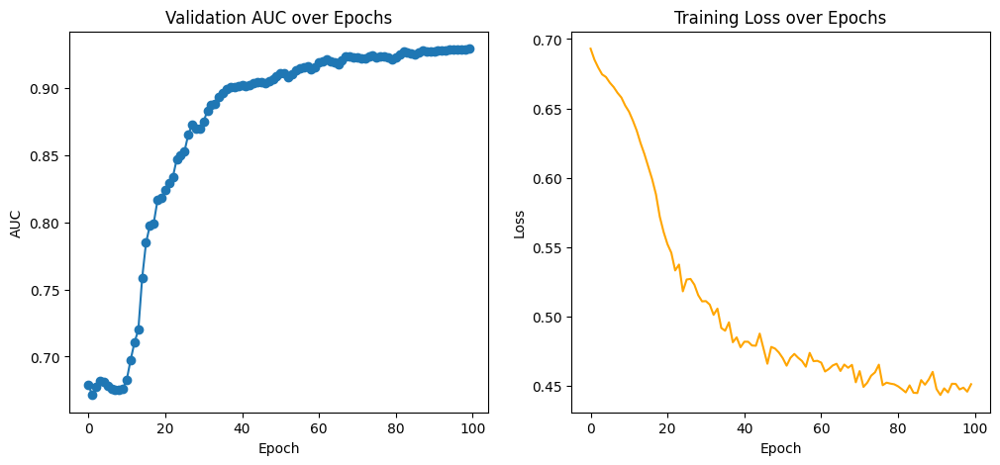

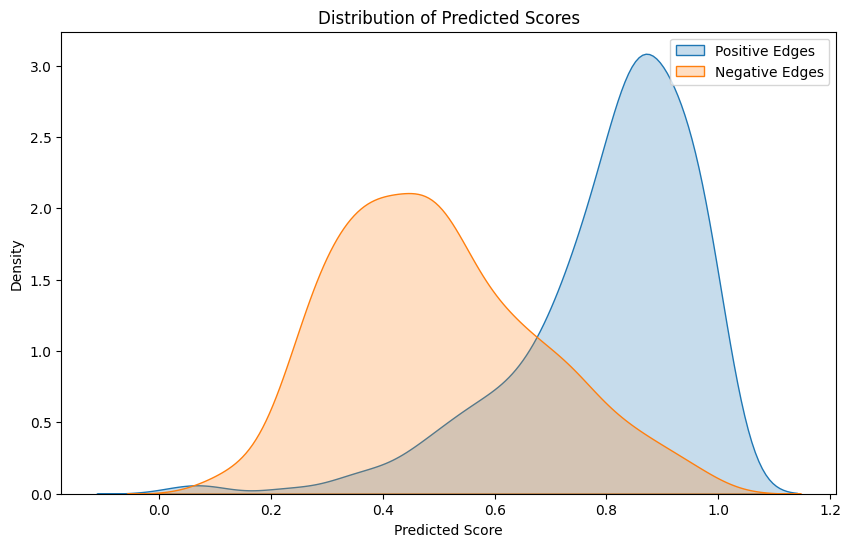

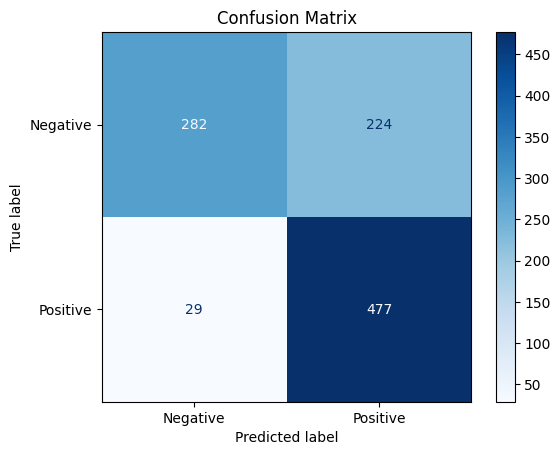

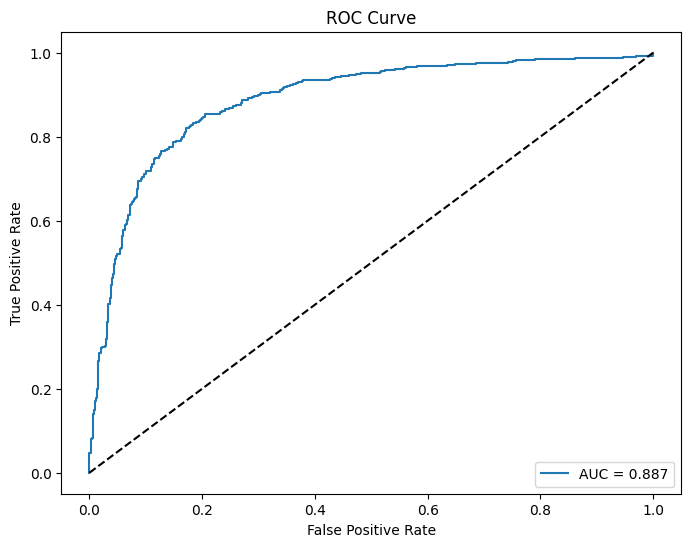

In [ ]:
#GCNEP
model = GCNEP(input_dim=cora_dataset[0].num_node_features, hidden_dim=GCNEP_hyperparams['hidden_units'], dropout=GCNEP_hyperparams['dropout'], use_concatenation=GCNEP_hyperparams['use_concatenation'])
optimizer = torch.optim.Adam(model.parameters(), lr=GCNEP_hyperparams['learning_rate'], weight_decay=GCNEP_hyperparams['weight_decay'])
gcnep_experiment = ExperimentEP(model, "GCNEP Link Prediction", optimizer)
gcnep_experiment.run(train_data, val_data, test_data, epochs=GCNEP_hyperparams['num_epochs'])
gcnep_experiment.save_model('/content/drive/MyDrive/DATA_MINING/Homework_4/gcnep_model.pth')
gcnep_experiment.plot_results('/content/drive/MyDrive/DATA_MINING/Homework_4')
#Calculate and plot score distributions and confusion matrices
gcnep_experiment.plot_score_distributions_and_confusion_matrix(test_data)
#Plot ROC Curve
gcnep_experiment.plot_roc(test_data, '/content/drive/MyDrive/DATA_MINING/Homework_4/gcnep_roc.png')

Starting Experiment: GATEP Link Prediction
Epoch: 1, Loss: 0.6930891871452332, Validation AUC: 0.7306316299270414
Epoch: 10, Loss: 0.6169009208679199, Validation AUC: 0.8350856910746927
Epoch: 20, Loss: 0.555587887763977, Validation AUC: 0.8382258744864004
Epoch: 30, Loss: 0.5234525799751282, Validation AUC: 0.8791107500507742
Epoch: 40, Loss: 0.5087194442749023, Validation AUC: 0.8918902029402116
Epoch: 50, Loss: 0.49510958790779114, Validation AUC: 0.9037166648440063
Epoch: 60, Loss: 0.488895058631897, Validation AUC: 0.9105125841678514
Epoch: 70, Loss: 0.47493723034858704, Validation AUC: 0.9180115296286461
Epoch: 80, Loss: 0.4693793058395386, Validation AUC: 0.9215579059194801
Epoch: 90, Loss: 0.4688434302806854, Validation AUC: 0.922182818041213
Epoch: 100, Loss: 0.47243061661720276, Validation AUC: 0.9222765548594729
Epoch: 110, Loss: 0.4569040834903717, Validation AUC: 0.9264947116811698
Epoch: 120, Loss: 0.47384944558143616, Validation AUC: 0.9286037900920183
Epoch: 130, Loss: 

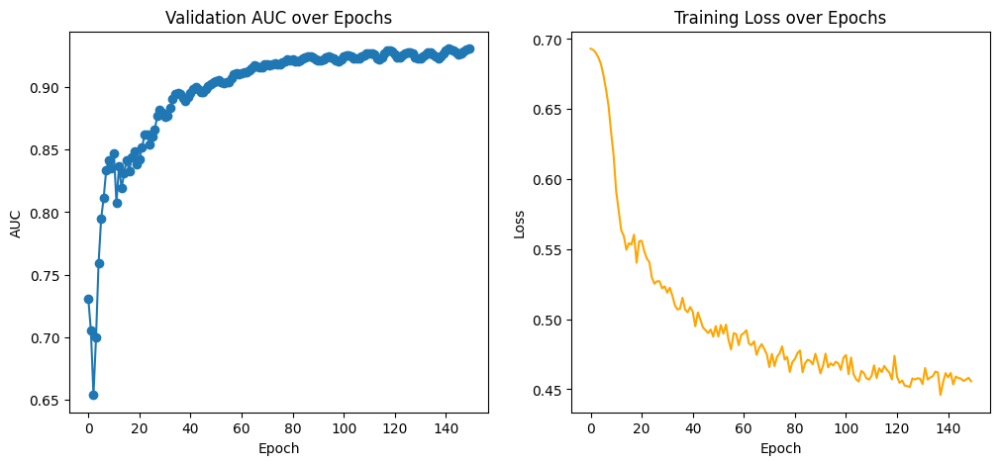

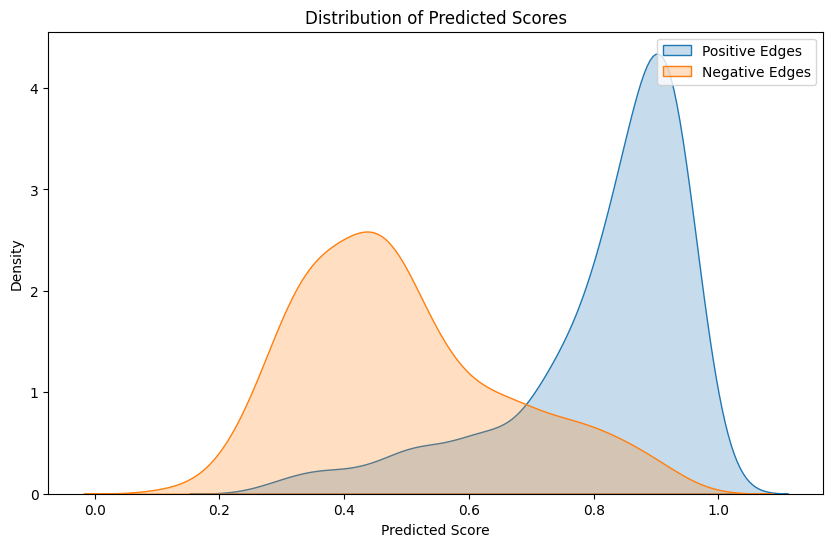

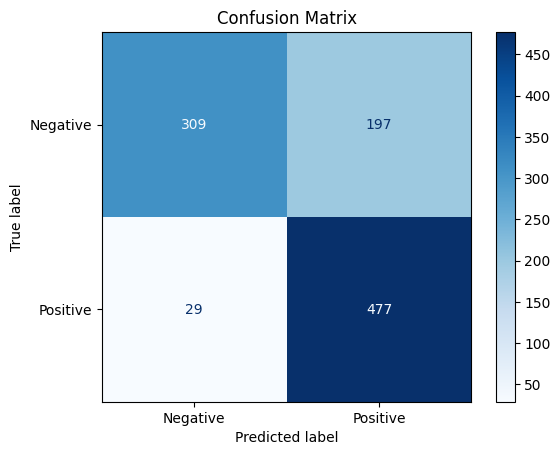

In [ ]:
#GATEP
model = GATEP(input_dim=cora_dataset[0].num_node_features, hidden_dim=GATEP_hyperparams['hidden_units'], dropout=GATEP_hyperparams['dropout'], heads=GATEP_hyperparams['heads'], use_concatenation=GATEP_hyperparams['use_concatenation'])
optimizer = torch.optim.Adam(model.parameters(), lr=GATEP_hyperparams['learning_rate'], weight_decay=GATEP_hyperparams['weight_decay'])
gatep_experiment = ExperimentEP(model, "GATEP Link Prediction", optimizer)
gatep_experiment.run(train_data, val_data, test_data, epochs=GATEP_hyperparams['num_epochs'])
gatep_experiment.save_model('/content/drive/MyDrive/DATA_MINING/Homework_4/gatep_model.pth')
gatep_experiment.plot_results('/content/drive/MyDrive/DATA_MINING/Homework_4')
gatep_experiment.plot_score_distributions_and_confusion_matrix(test_data)

Starting Experiment: GSAGEEP Link Prediction
Epoch: 1, Loss: 0.7071729898452759, Validation AUC: 0.6004624349700823
Epoch: 10, Loss: 0.6134756803512573, Validation AUC: 0.6785764501866925
Epoch: 20, Loss: 0.5260650515556335, Validation AUC: 0.7541751941133278
Epoch: 30, Loss: 0.4850647747516632, Validation AUC: 0.8373666203190177
Epoch: 40, Loss: 0.4580650329589844, Validation AUC: 0.8733459357277883
Epoch: 50, Loss: 0.44675368070602417, Validation AUC: 0.8913902732428252
Epoch: 60, Loss: 0.4369545578956604, Validation AUC: 0.8958427721101719
Epoch: 70, Loss: 0.43191421031951904, Validation AUC: 0.8996391132496993
Epoch: 80, Loss: 0.4226016104221344, Validation AUC: 0.9025449546157571
Epoch: 90, Loss: 0.42545756697654724, Validation AUC: 0.9017013232514177
Epoch: 100, Loss: 0.42753610014915466, Validation AUC: 0.908747207423956
Epoch: 110, Loss: 0.4134763777256012, Validation AUC: 0.9081691637113531
Epoch: 120, Loss: 0.4196884036064148, Validation AUC: 0.9109343998500211
Epoch: 130, Lo

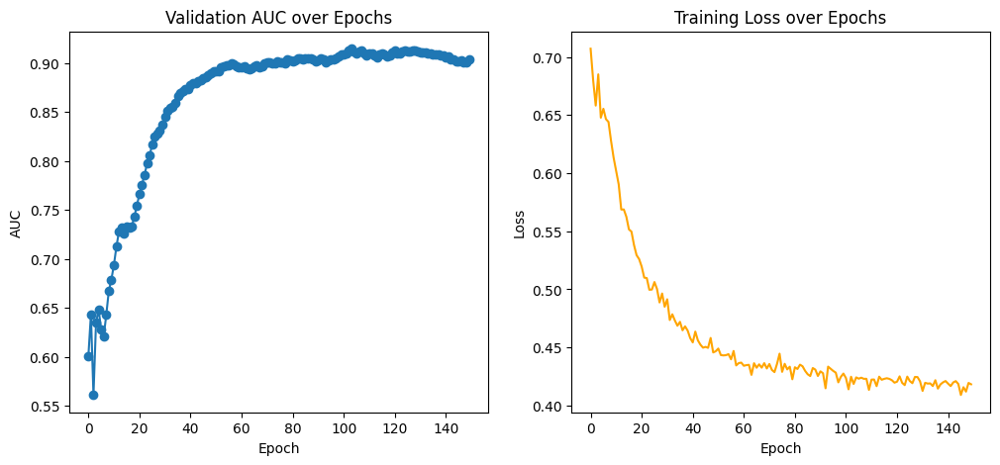

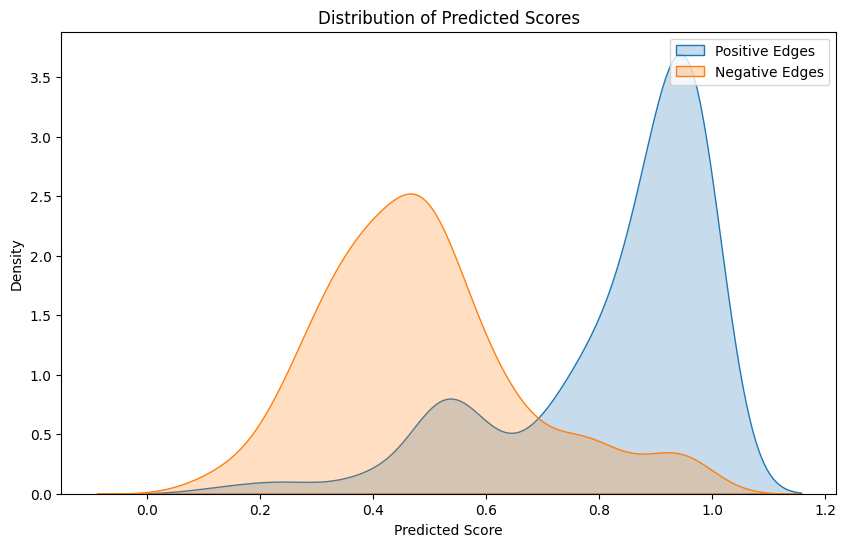

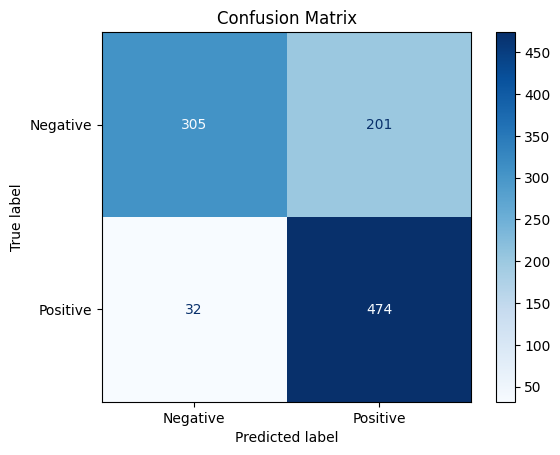

In [ ]:
#GSAGEEP
model = GraphSAGEEP(input_dim=cora_dataset[0].num_node_features, hidden_dim=GSAGEEP_hyperaprams['hidden_units'], dropout=GSAGEEP_hyperaprams['dropout'], aggr=GSAGEEP_hyperaprams['aggr'], use_concatenation=GSAGEEP_hyperaprams['use_concatenation'])
optimizer = torch.optim.Adam(model.parameters(), lr=GSAGEEP_hyperaprams['learning_rate'], weight_decay=GSAGEEP_hyperaprams['weight_decay'])
gsageep_experiment = ExperimentEP(model, "GSAGEEP Link Prediction", optimizer)
gsageep_experiment.run(train_data, val_data, test_data, epochs=GSAGEEP_hyperaprams['num_epochs'])
gsageep_experiment.save_model('/content/drive/MyDrive/DATA_MINING/Homework_4/gsageep_model.pth')
gsageep_experiment.plot_results('/content/drive/MyDrive/DATA_MINING/Homework_4')
gsageep_experiment.plot_score_distributions_and_confusion_matrix(test_data)

Plotting Link Prediction


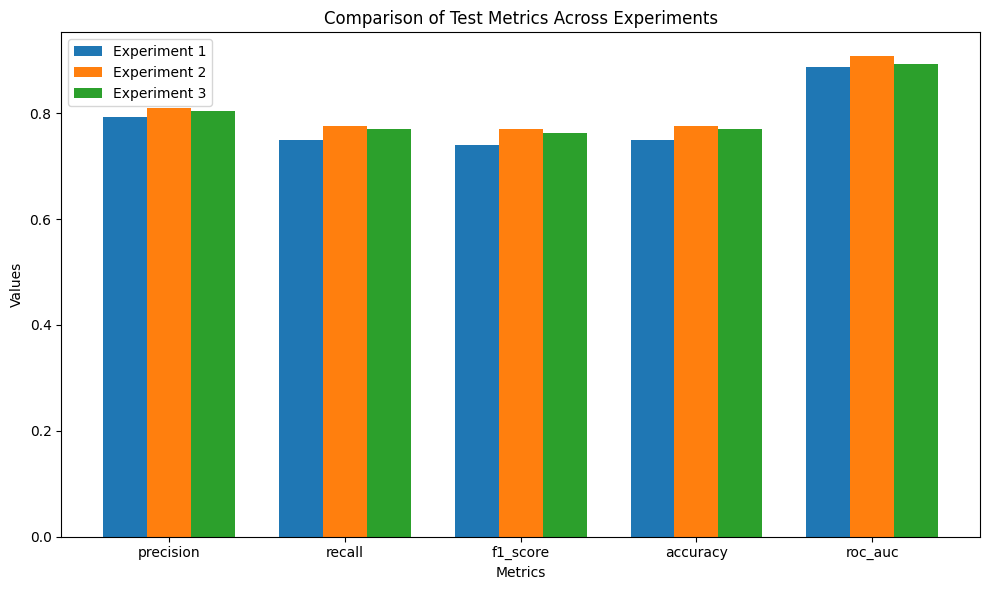

In [ ]:
#Plot test results
metrics_names = ['precision', 'recall', 'f1_score', 'accuracy', 'roc_auc']
metrics = [gcnep_experiment.test_metrics, gatep_experiment.test_metrics, gsageep_experiment.test_metrics]
plot_test_metrics(metrics_names, metrics, '/content/drive/MyDrive/DATA_MINING/Homework_4/Link_Prediction_Test_Results.png', 'Link Prediction')

#GNN embeddings study

For this part we need a GNN wrapper in order to get only the first embedding through its forward function. We then plot the inner and output embeddings using either t-SNE, since PCA plots are not very informative.

In [ ]:
#Wrapper class to extract inner embedding only
class GetEmbeddingsGNN(torch.nn.Module):
    def __init__(self, original_model):
        super(GetEmbeddingsGNN, self).__init__()
        self.original_model = original_model

    def forward(self, data): #calls only first layer and outputs inner embedding
        x, edge_index = data.x, data.edge_index
        x = self.original_model.conv1(x, edge_index)
        x = F.relu(x)
        return x

#Extracts the embedding generated by a forward pass in the middle layer and output layer and plots it with PCA on a 2D plane
def extract_and_visualize_embeddings(model, data, use_tSNE=False, LP=False):

    model.eval()
    def reduce_dimensions(embeddings, method):
        if method == "PCA":
            reducer = PCA(n_components=2)
        elif method == "tSNE":
            reducer = TSNE(n_components=2, random_state=0)
        return reducer.fit_transform(embeddings)

    reduction_method = "tSNE" if use_tSNE else "PCA"

    #Plotting inner embedding
    print("Plotting inner embedding")
    inner_embedding_model = GetEmbeddingsGNN(model)
    inner_embedding_model.eval()

    with torch.no_grad():
        inner = inner_embedding_model(data)
    reduced_inner = reduce_dimensions(inner.numpy(), reduction_method)
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(reduced_inner[:, 0], reduced_inner[:, 1], c=data.y.numpy(), cmap='viridis', s=50)
    plt.colorbar(scatter)
    plt.title(f"2D Visualization of Inner Layer Node Embeddings ({reduction_method})")
    plt.show()

    #Deal with link prediction and node classification cases separately
    if not LP:
      #Plotting output embedding too
      print("Plotting final embedding")
      with torch.no_grad():
          embeddings = model(data)
      reduced_final = reduce_dimensions(embeddings.numpy(), reduction_method)
      plt.figure(figsize=(8, 6))
      scatter = plt.scatter(reduced_final[:, 0], reduced_final[:, 1], c=data.y.numpy(), cmap='viridis', s=50)
      plt.colorbar(scatter)
      plt.title(f"2D Visualization of Output Layer Node Embeddings ({reduction_method})")
      plt.show()
    else:
      with torch.no_grad():
        embeddings = model.encode(data)
      reduced_final = reduce_dimensions(embeddings.numpy(), reduction_method)
      plt.figure(figsize=(8, 6))
      scatter = plt.scatter(reduced_final[:, 0], reduced_final[:, 1], c=data.y.numpy(), cmap='viridis', s=50)
      plt.colorbar(scatter)
      plt.title(f"2D Visualization of Output Layer Node Embeddings for Link Prediction ({reduction_method})")
      plt.show()


<ipython-input-5-6c603e59d820>:153: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(load_path)
<ipython-input-5-6c603e59d820>:138: FutureWarning: You a

Visualize embeddings of GCN
Plotting inner embedding


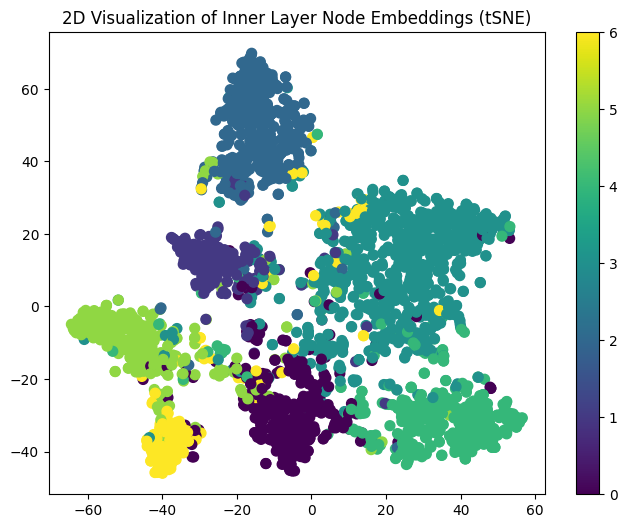

Plotting final embedding


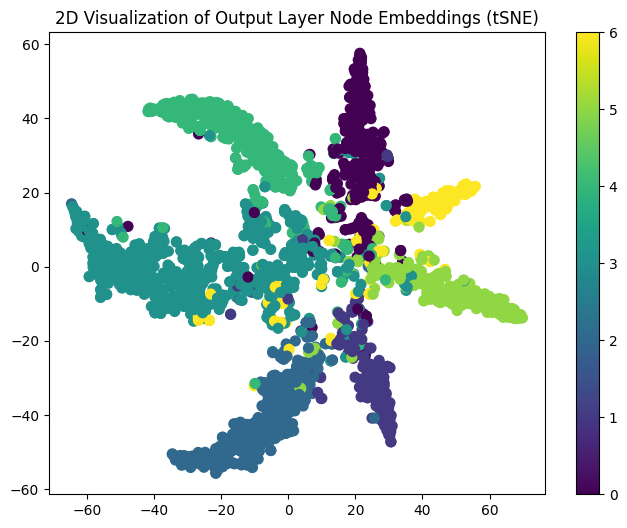

Visualize embeddings of GAT
Plotting inner embedding


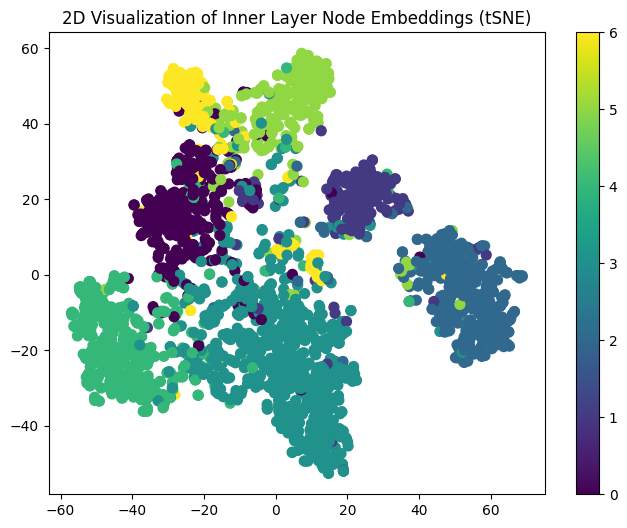

Plotting final embedding


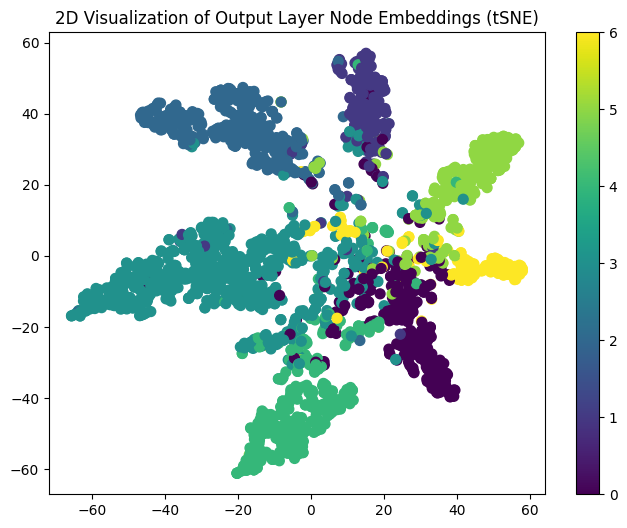

Visualize embeddings of GraphSAGE
Plotting inner embedding


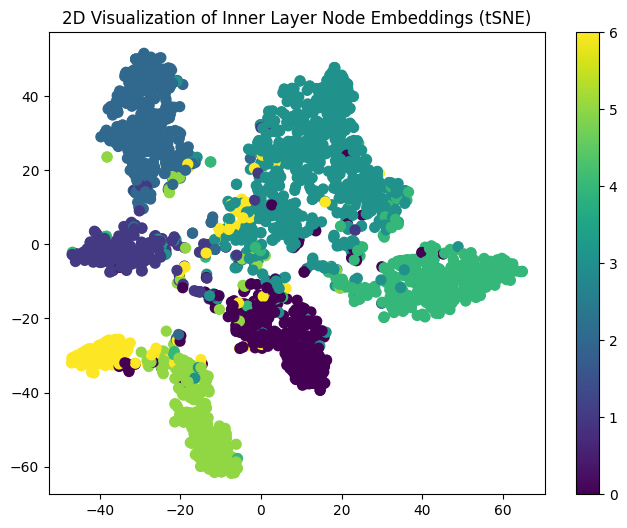

Plotting final embedding


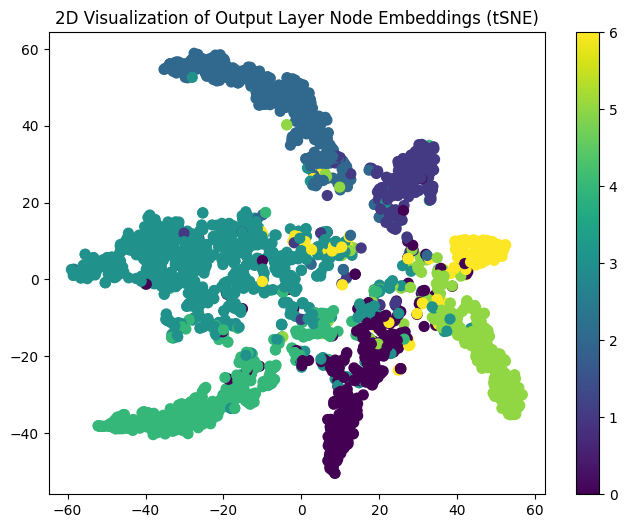

In [ ]:
gcn_hyperparams = {'learning_rate': 0.01, 'hidden_units': 16, 'dropout': 0.0, 'weight_decay': 0.0001, 'num_epochs': 200}
gat_hyperparams = {'learning_rate': 0.005, 'hidden_units': 64, 'dropout': 0.75, 'num heads': 16, 'weight_decay': 0.0001, 'num_epochs': 100}
gsage_hyperparams = {'learning_rate': 0.005, 'hidden_units': 16, 'dropout': 0.75, 'aggregate function': 'mean', 'weight_decay': 0.0001, 'num_epochs': 150}
GCN_experiment = load_experiment(hyperparams=gcn_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/gcn_model.pth')
GAT_experiment = load_experiment(hyperparams=gat_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/gat_model.pth', type="GAT")
GSAGE_experiment = load_experiment(hyperparams=gsage_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/graphsage_model.pth', type="GraphSAGE")

#Extract and visualize the embeddings
print("Visualize embeddings of GCN")
extract_and_visualize_embeddings(GCN_experiment.model, cora_dataset[0], use_tSNE=True)
print("Visualize embeddings of GAT")
extract_and_visualize_embeddings(GAT_experiment.model, cora_dataset[0], use_tSNE=True)
print("Visualize embeddings of GraphSAGE")
extract_and_visualize_embeddings(GSAGE_experiment.model, cora_dataset[0], use_tSNE=True)



<ipython-input-11-c75382326e5c>:290: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(load_path)
<ipython-input-11-c75382326e5c>:278: FutureWarning: You

Visualize embeddings of GCNEP
Plotting inner embedding


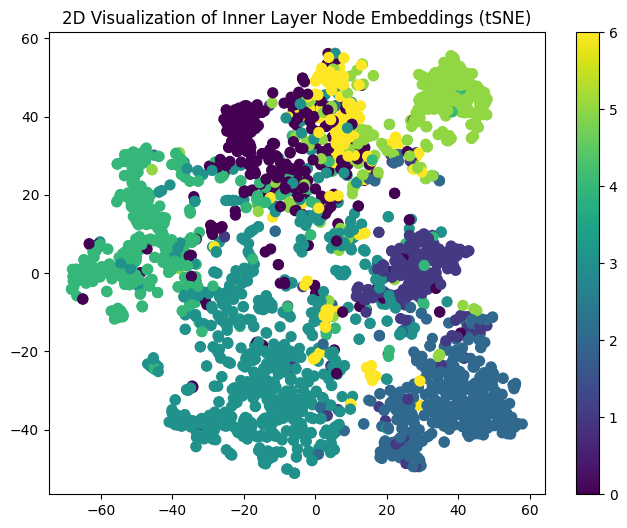

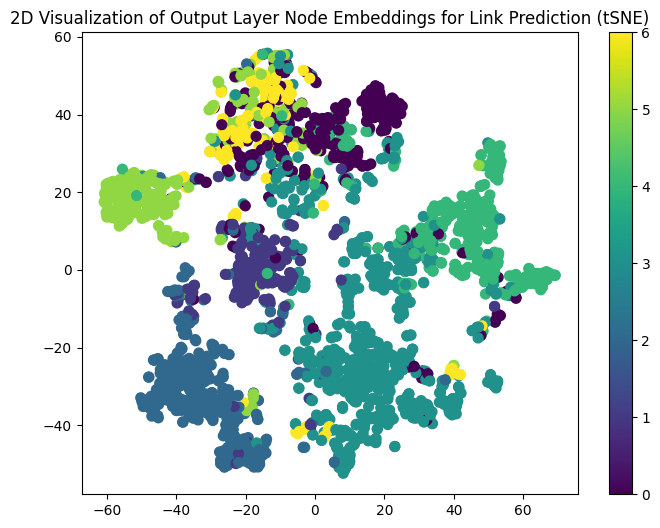

Visualize embeddings of GATEP
Plotting inner embedding


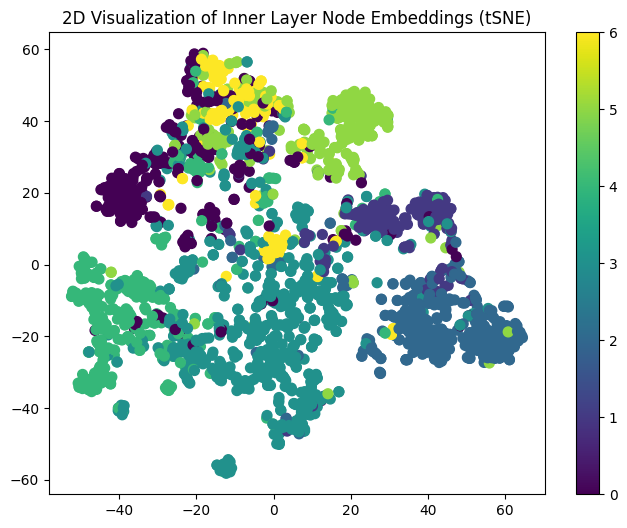

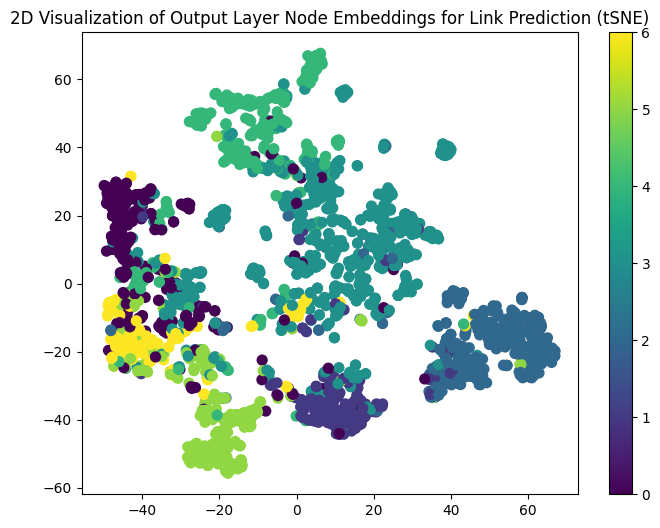

Visualize embeddings of GSAGEEP
Plotting inner embedding


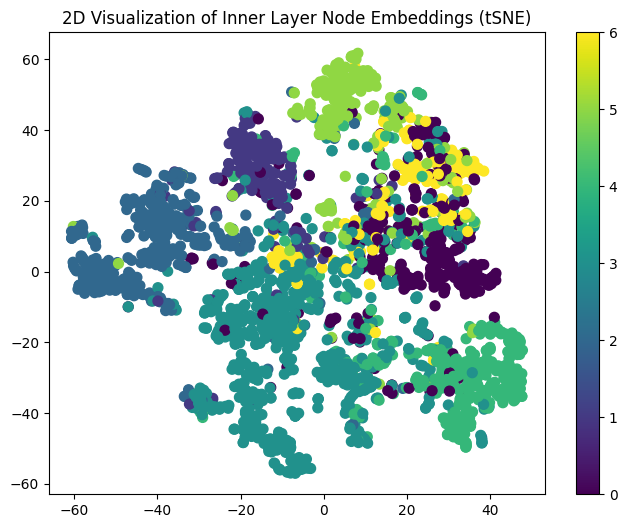

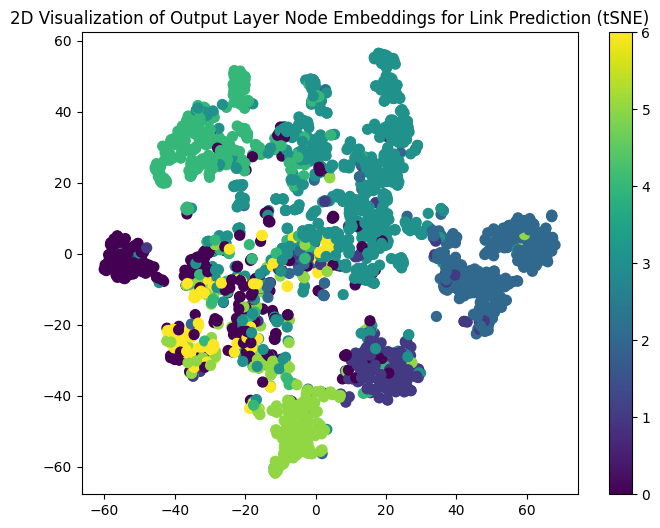

In [ ]:
GCNEP_hyperparams = {'learning_rate': 0.01, 'hidden_units': 64, 'dropout': 0.5, 'weight_decay': 1e-06, 'num_epochs': 200, 'use_concatenation': False}
GATEP_hyperparams = {'learning_rate': 0.01, 'use_concatenation': False, 'hidden_units': 16, 'heads': 8, 'dropout': 0.75, 'weight_decay': 1e-06, 'num_epochs': 150}
GSAGEEP_hyperparams =  {'learning_rate': 0.01, 'hidden_units': 64, 'use_concatenation': False, 'dropout': 0.0, 'aggr': 'max', 'weight_decay': 0.0001, 'num_epochs': 150}
GCNEP_experiment = load_experimentEP(load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/gcnep_model.pth', hyperparams=GCNEP_hyperparams)
GATEP_experiment = load_experimentEP(load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/gatep_model.pth', hyperparams=GATEP_hyperparams, type="GATEP")
GSAGEEP_experiment = load_experimentEP(load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/gsageep_model.pth', hyperparams=GSAGEEP_hyperaprams, type="GraphSAGEEP")

print("Visualize embeddings of GCNEP")
extract_and_visualize_embeddings(GCNEP_experiment.model, cora_dataset[0], use_tSNE=True, LP=True)
print("Visualize embeddings of GATEP")
extract_and_visualize_embeddings(GATEP_experiment.model, cora_dataset[0], use_tSNE=True, LP=True)
print("Visualize embeddings of GSAGEEP")
extract_and_visualize_embeddings(GSAGEEP_experiment.model, cora_dataset[0], use_tSNE=True, LP=True)

#Explainability

##Explainability using GNNExplainer
GNNExplainer is specifically designed for explaining GNNs. It identifies the important subgraph (nodes and edges) that contributes to the model’s prediction for a particular target node or edge.
It works by masking certain nodes or edges and training a simpler model to explain which parts of the graph are most relevant to the model’s decision. This is done using gradient-based optimization, which optimizes a mask over the edges and/or nodes that maximizes the model’s prediction for the target node or edge.

In [ ]:
#Load the experiments
GCN_hyperparams = {'learning_rate': 0.01, 'hidden_units': 16, 'dropout': 0.0, 'weight_decay': 0.0001, 'num_epochs': 200}
GAT_hyperparams = {'learning_rate': 0.005, 'hidden_units': 64, 'dropout': 0.75, 'num heads': 16, 'weight_decay': 0.0001, 'num_epochs': 100}
GSAGE_hyperparams = {'learning_rate': 0.005, 'hidden_units': 16, 'dropout': 0.75, 'aggregate function': 'mean', 'weight_decay': 0.0001, 'num_epochs': 100}

GCN_experiment = load_experiment(hyperparams=GCN_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/gcn_model.pth')
GAT_experiment = load_experiment(hyperparams=GAT_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/gat_model.pth', type="GAT")
GSAGE_experiment = load_experiment(hyperparams=GSAGE_hyperparams, load_path='/content/drive/MyDrive/DATA_MINING/Homework_4/graphsage_model.pth', type="GraphSAGE")

<ipython-input-7-ea772e7de389>:154: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(load_path)
<ipython-input-7-ea772e7de389>:142: FutureWarning: You a

In [ ]:
#Normal explainer needs forward method to take as input an index otherwise it doesn't work, so we use a wrapper class to fix the problem
class GNNExplanainabilityWrapper(torch.nn.Module):
    def __init__(self, base_model):
        super(GNNExplanainabilityWrapper, self).__init__()
        self.base_model = base_model

    def forward(self, x, edge_index, index=None):
        data = Data(x=x, edge_index=edge_index)
        output = self.base_model(data)

        if index is not None:
            output = output[index]

        return output

#Visualize node neighbours and most contributing nodes with edge weight
def visualize_edge_weights_gnnexplainer(edge_mask, data, node_idx, preds, threshold=0.0, seed=0):
  labels      = data.y
  edge_index  = data.edge_index

  #Instantiate the subgraph and put edges and  nodes into it
  G = nx.Graph()
  for i,edge in enumerate(edge_index.T):
    if edge_mask[i] > threshold:
      G.add_edge(edge[0].item(), edge[1].item(), weight=edge_mask[i])
      G.add_node(edge[0].item(), pred=preds[edge[0].item()])
      G.add_node(edge[1].item(), pred=preds[edge[1].item()])

  #Extract weight from edges
  edges               = G.edges(data=True)
  original_weights    = [edge[2]['weight'].item() for edge in edges]
  min_val             = min(original_weights)
  max_val             = max(original_weights)
  normalized_weights  = [(x - min_val) / (max_val - min_val) for x in original_weights]

  node_colors = [int(G.nodes[n]['pred']) for n in G.nodes]

  #Draw graph with weighted edges
  pos = nx.spring_layout(G, seed=seed)  # Positions for all nodes
  nx.draw(
    G, pos,
    with_labels=True,
    node_size=700,
    node_color=node_colors,
    cmap=plt.get_cmap('rainbow'),
    font_size=10,
    font_weight='bold',
    edge_color=normalized_weights,
    edge_cmap=plt.cm.Blues,
    alpha=0.8
  )

  edge_labels = {
    (u, v): f'{w:.3f}' for ((u, v, d), w) in zip(edges, normalized_weights)
  }

  nx.draw_networkx_edge_labels(
    G, pos,
    edge_labels=edge_labels,
    font_color='black'
  )

  plt.title(f'GNNExplainer on node {node_idx}: label = {labels[node_idx]}, pred = {preds[node_idx]}')
  plt.show()

#Visualize explanation for more nodes through the use of explainer
def visualize_for_more_nodes(experiment, data, max_neighbours=10, target_nodes=[0, 616, 308, 443, 699, 697, 681, 313], use_attention = False):

  assert (experiment.model is GAT and (use_attention == True or use_attention == False)) or (experiment.model is not GAT), "AttentionExplainer can only be used with GAT model"

  if use_attention:
      explainer = Explainer(
      model=GNNExplanainabilityWrapper(experiment.model),
      algorithm=AttentionExplainer(), #For GAT exclusively
      explanation_type='model',
      node_mask_type=None,
      edge_mask_type='object',
      model_config=dict(
          mode='multiclass_classification',
          task_level='node',
          return_type='log_probs',
      ),
      threshold_config = dict(
            threshold_type ='topk',
            value=max_neighbours,
      ),
    )
  else:
    explainer = Explainer(
      model=GNNExplanainabilityWrapper(experiment.model),
      algorithm=GNNExplainer(epochs=200),
      explanation_type='model',
      node_mask_type=None,
      edge_mask_type='object',
      model_config=dict(
          mode='multiclass_classification',
          task_level='node',
          return_type='log_probs',
      ),
      threshold_config = dict(
            threshold_type ='topk',
            value=max_neighbours,
      ),
    )

  experiment.model.eval()
  _, preds = experiment.model(data).max(1)

  for node_idx in target_nodes:
    explanation = explainer(data.x, data.edge_index, index=node_idx)
    edge_mask   = explanation.edge_mask #extract learned edge mask
    visualize_edge_weights_gnnexplainer(edge_mask, data, node_idx, preds)

Explainability of GCN


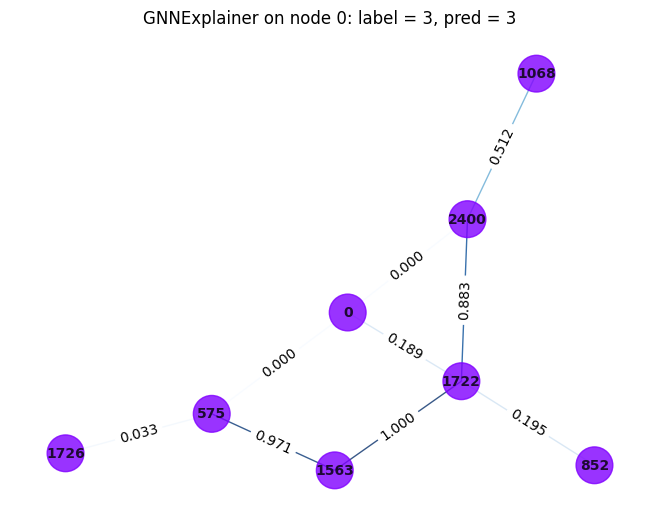

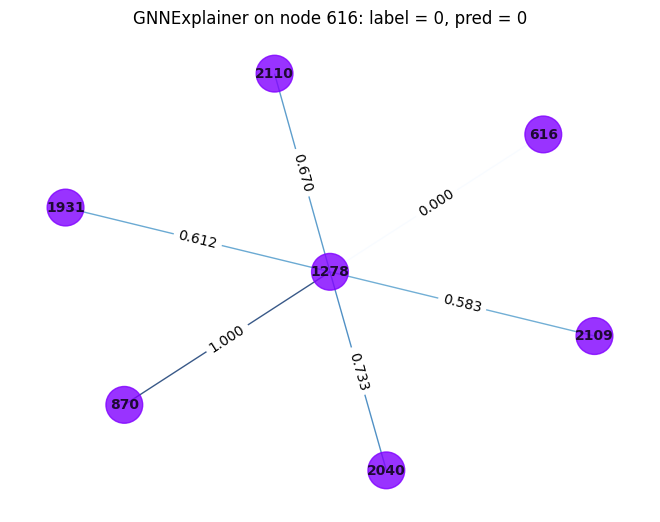

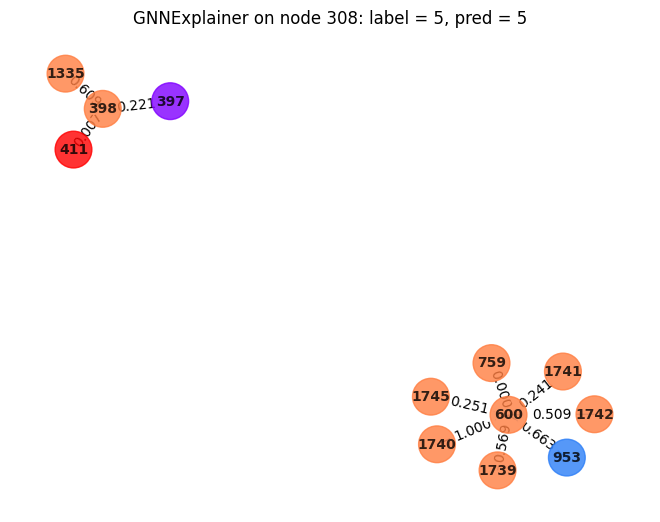

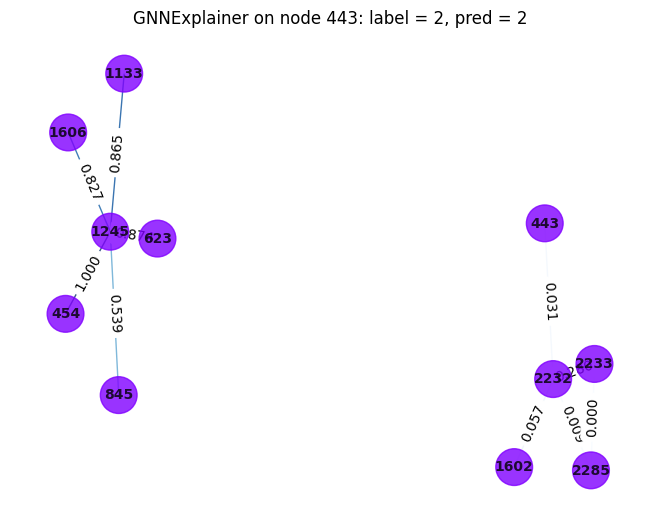

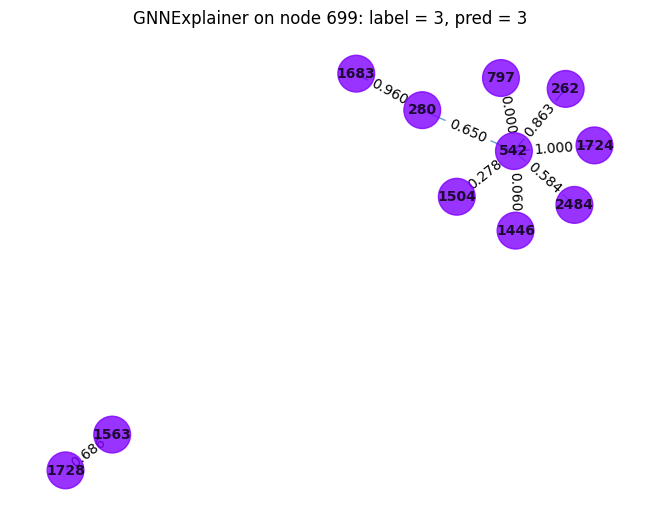

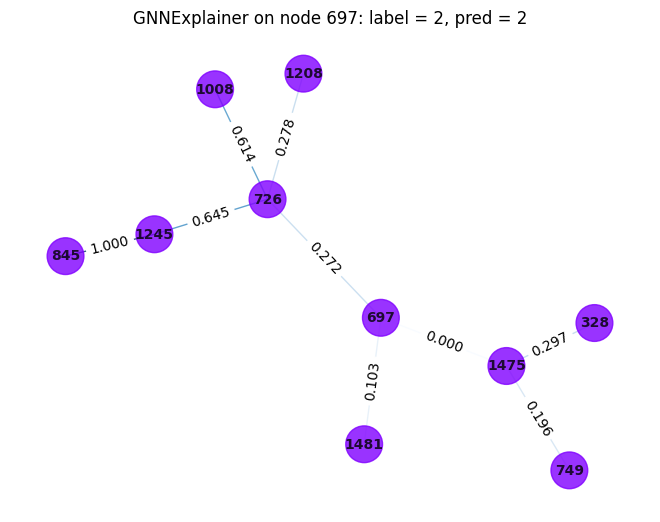

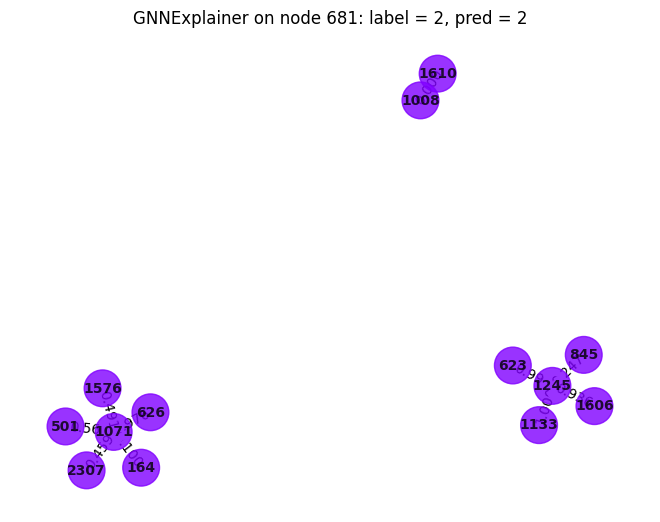

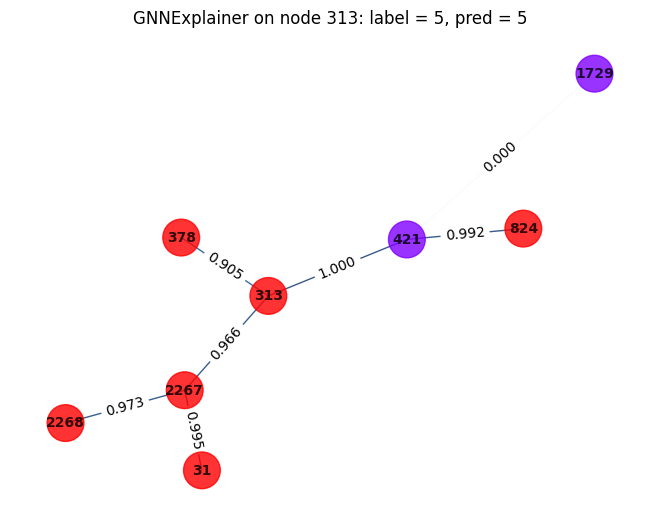

Explainability of GAT


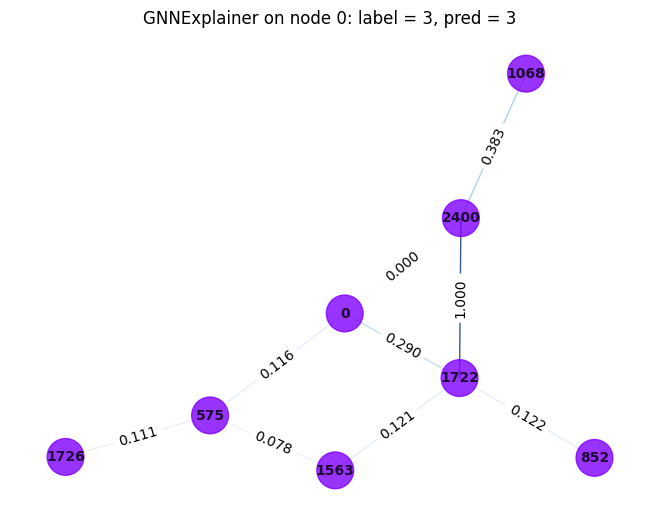

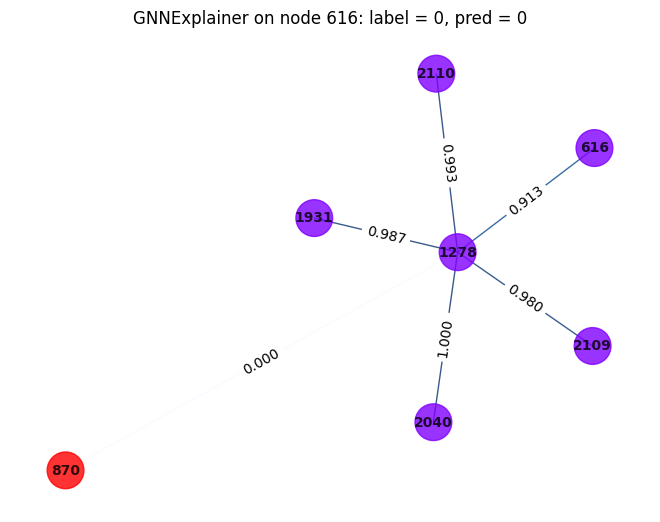

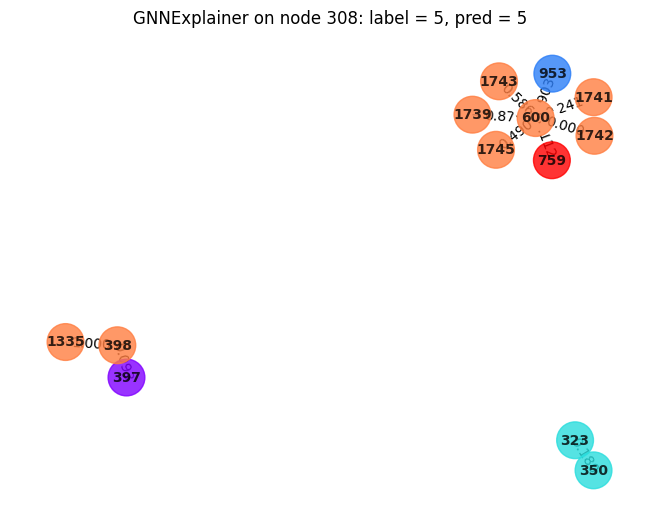

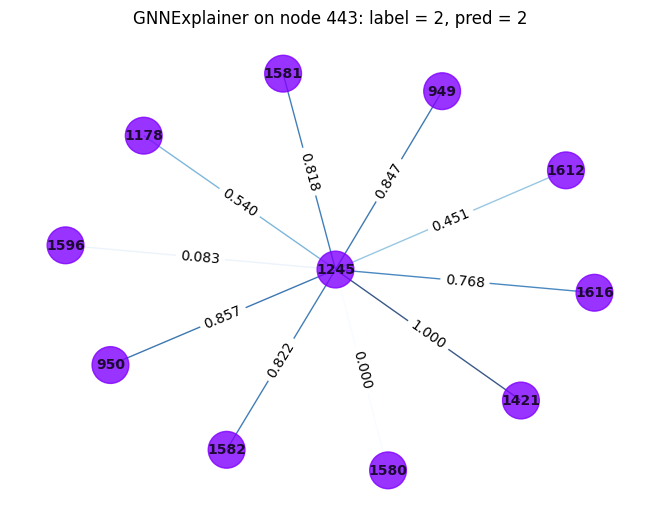

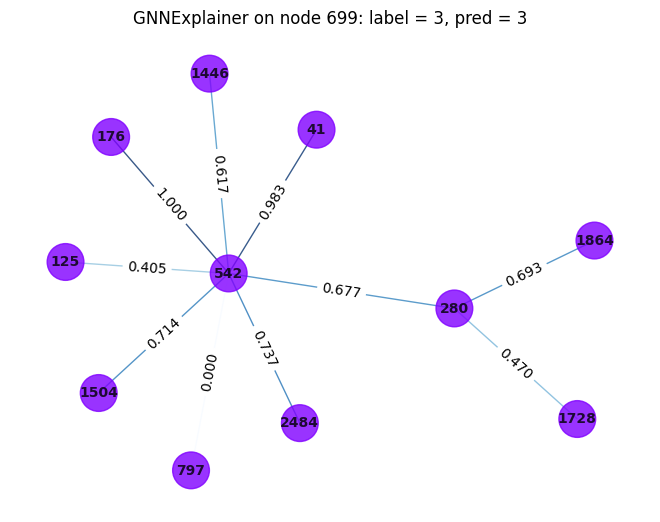

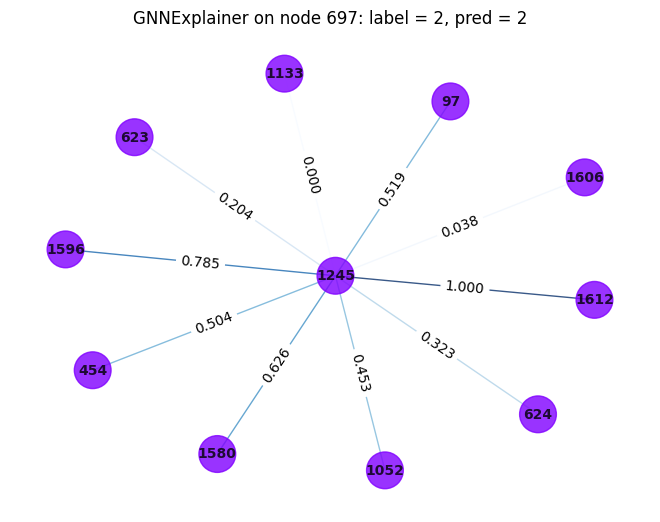

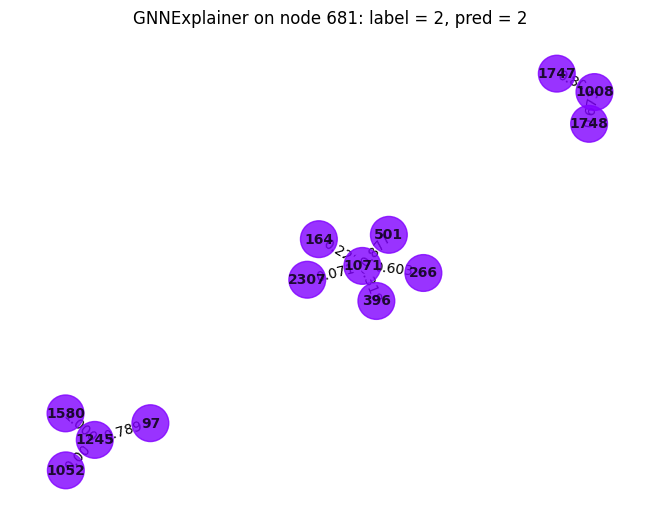

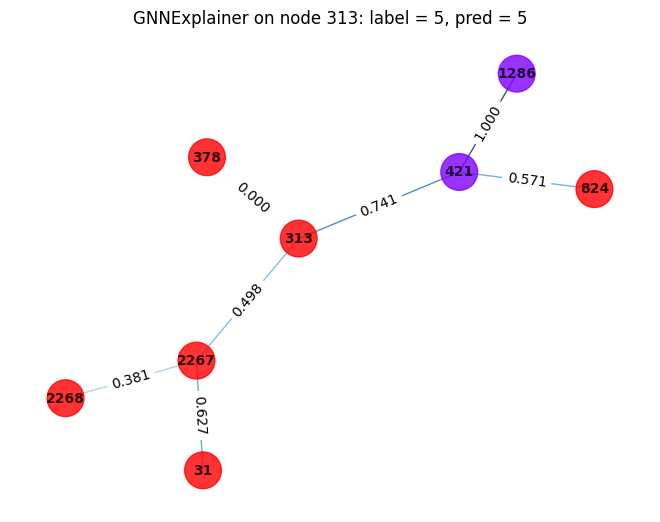

Explainability of GraphSAGE


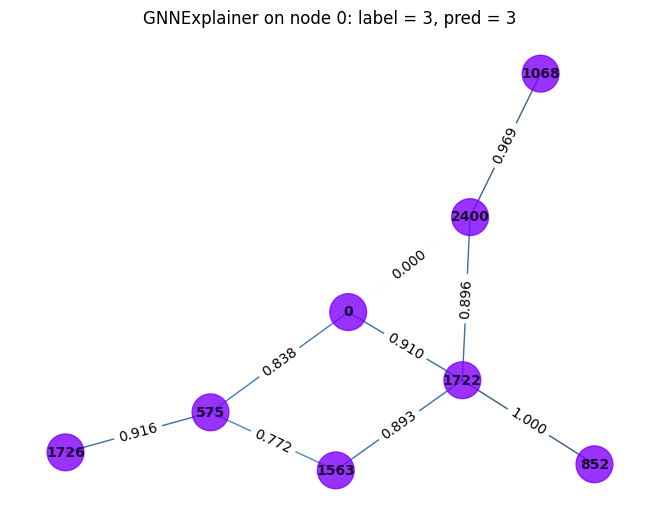

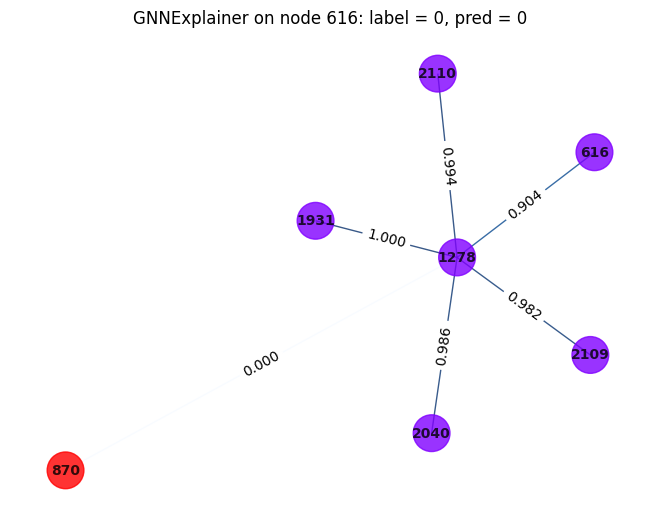

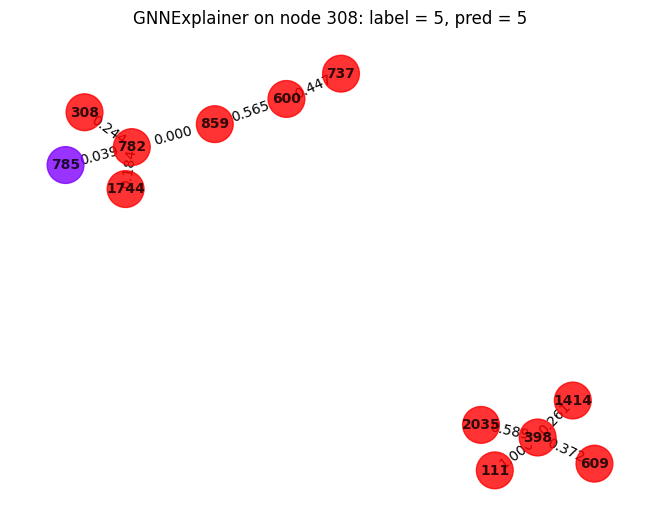

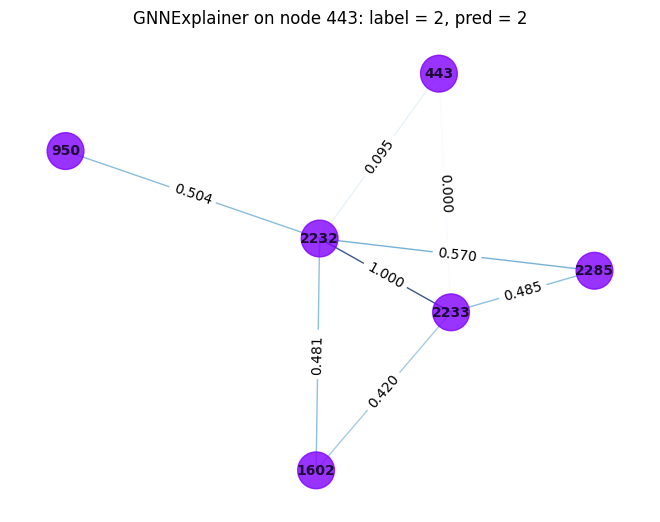

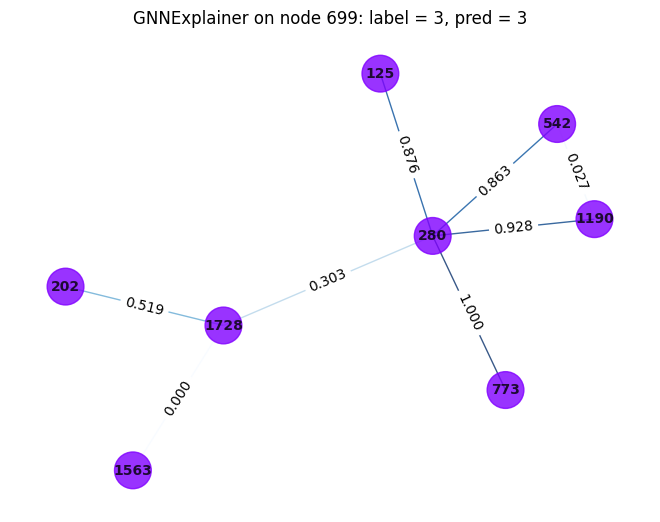

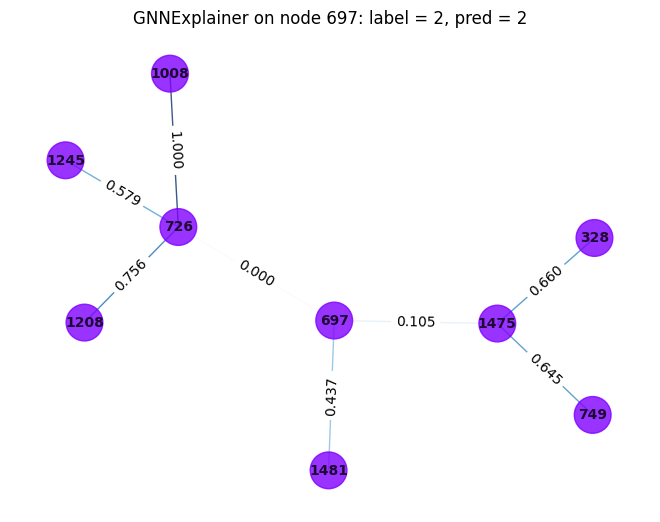

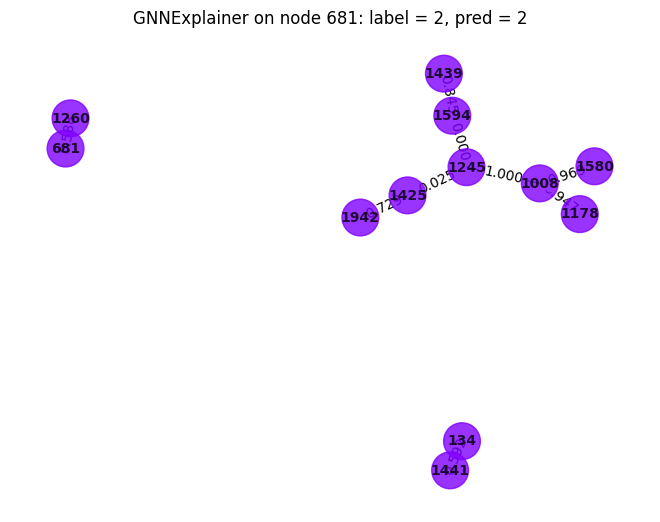

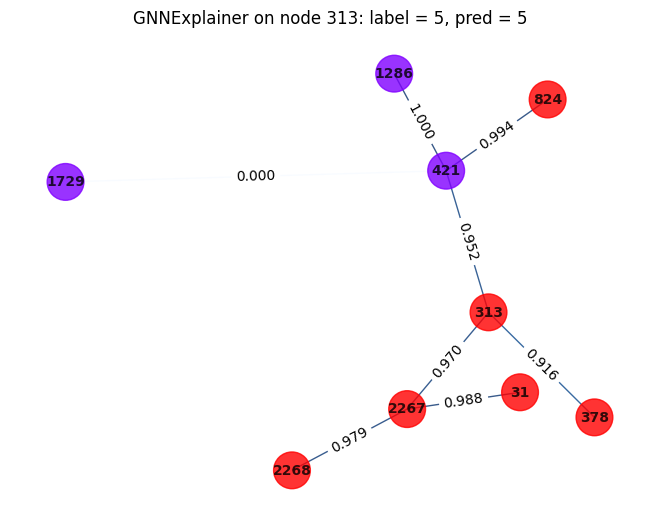

In [ ]:
print("Explainability of GCN")
visualize_for_more_nodes(GCN_experiment, data)
print("Explainability of GAT")
visualize_for_more_nodes(GAT_experiment, data)
print("Explainability of GraphSAGE")
visualize_for_more_nodes(GSAGE_experiment, data)

Explainability of GAT


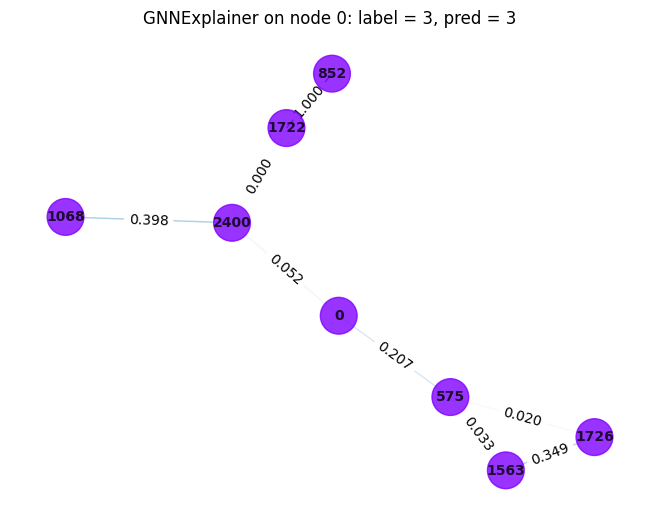

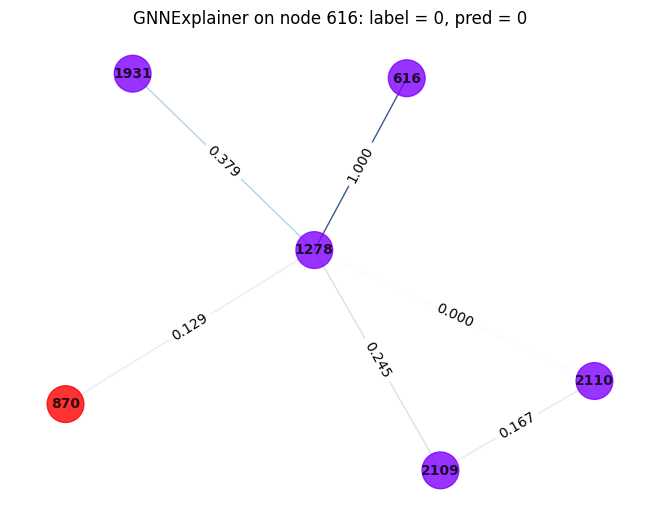

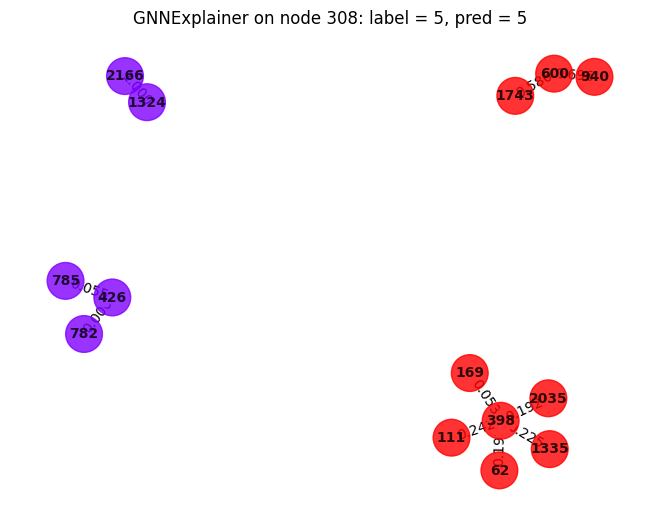

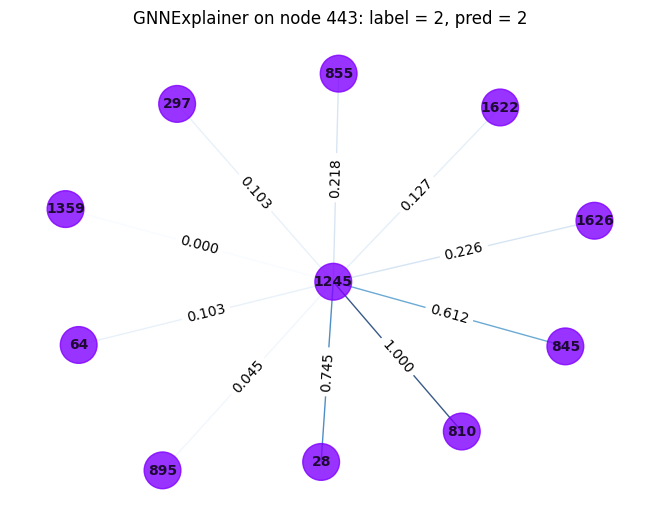

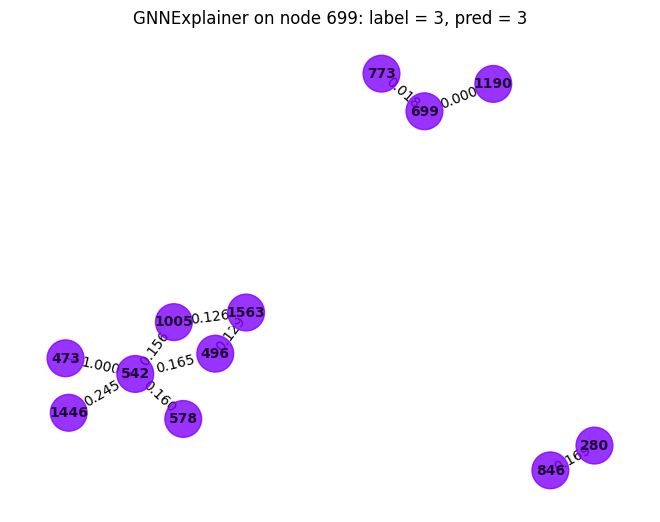

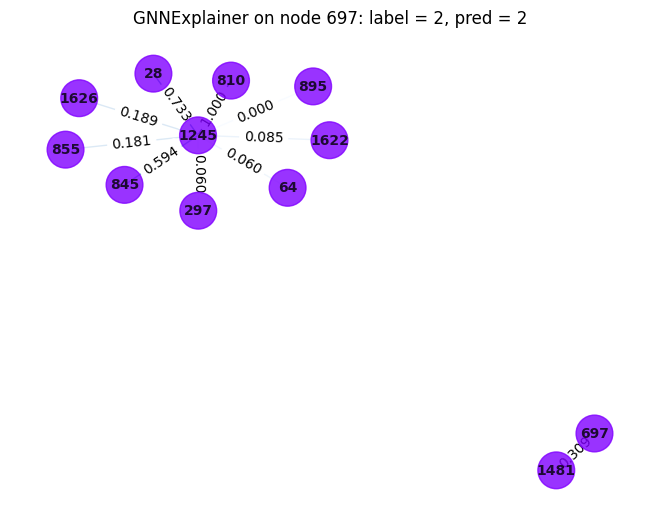

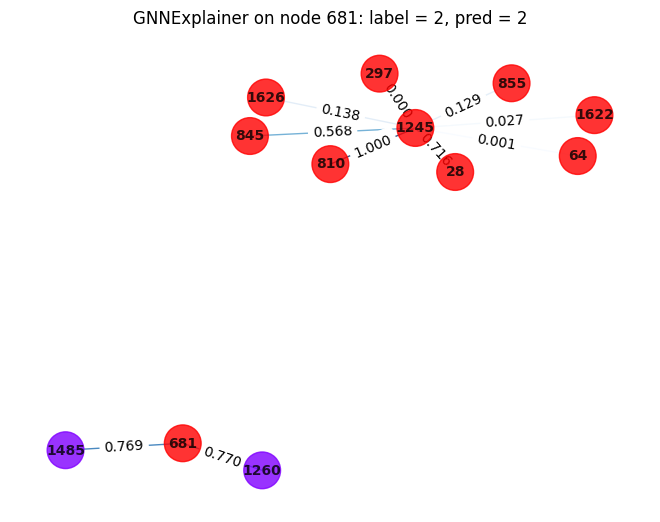

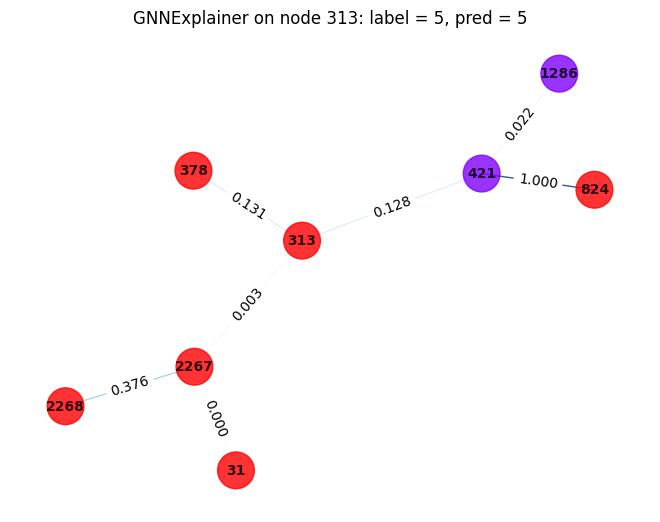

In [ ]:
#Use attention explainer too for GAT
print("Explainability of GAT")
visualize_for_more_nodes(GAT_experiment, data, use_attention=True)

##Node features explanations
Next we use the explainer to also get information about node features: what features contribute the most to a node's classification?

In [ ]:
#Functions to visualize most important features across the graph
def visualize_top_features_graph(experiment, data, top_k=30, name="Unknown"):

    explainer = Explainer(
        model=GNNExplanainabilityWrapper(experiment.model),
        algorithm=GNNExplainer(epochs=200),
        explanation_type='model',
        node_mask_type='common_attributes',
        edge_mask_type=None,
        model_config=dict(
            mode='multiclass_classification',
            task_level='node',
            return_type='log_probs',
        ),
    )

    print(f"Explainability node features of {name} for graph")
    explanation = explainer(data.x, data.edge_index)
    explanation.visualize_feature_importance(top_k=top_k)



#visualize explanation for more nodes with node feature importance
def visualize_features_for_more_nodes(experiment, data, max_neighbours=10, target_nodes=[0, 616, 308, 443, 699, 697, 681, 313], top_k=10, name="Unknown"):

    explainer = Explainer(
        model=GNNExplanainabilityWrapper(experiment.model),
        algorithm=GNNExplainer(epochs=200),
        explanation_type='model',
        node_mask_type='attributes', #Get most important feature for the node: this computes feature importance for all nodes
        edge_mask_type=None,
        model_config=dict(
            mode='multiclass_classification',
            task_level='node',
            return_type='log_probs',
        ),
    )

    experiment.model.eval()
    _, preds = experiment.model(data).max(1)

    print(f"Explainability node features of {name} for more nodes")
    #Visualize top 10 most important features for the current node
    for node_idx in target_nodes:
        explanation = explainer(data.x, data.edge_index, index=node_idx)
        print(f"Node {node_idx}: label = {data.y[node_idx]}")
        explanation.visualize_feature_importance(top_k=top_k)

Explainability node features of GCN for graph


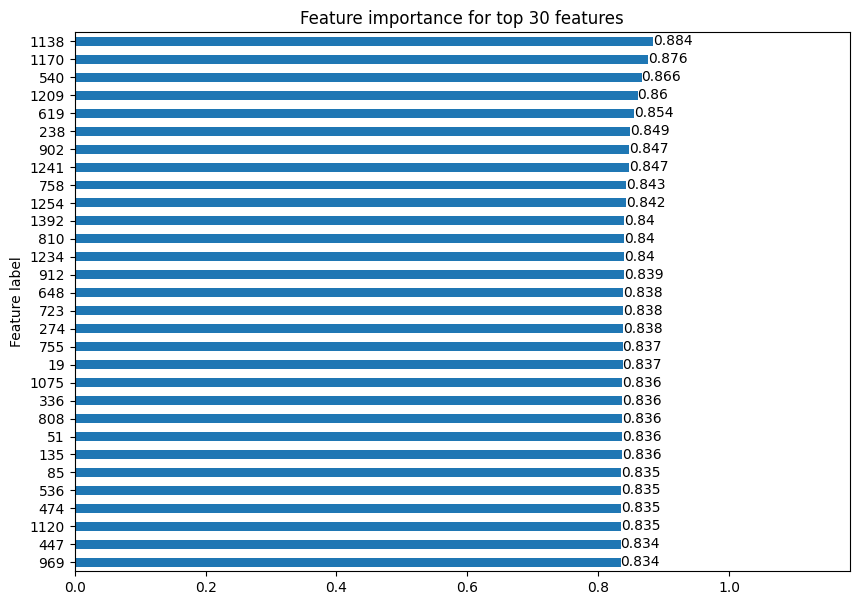

Explainability node features of GAT for graph


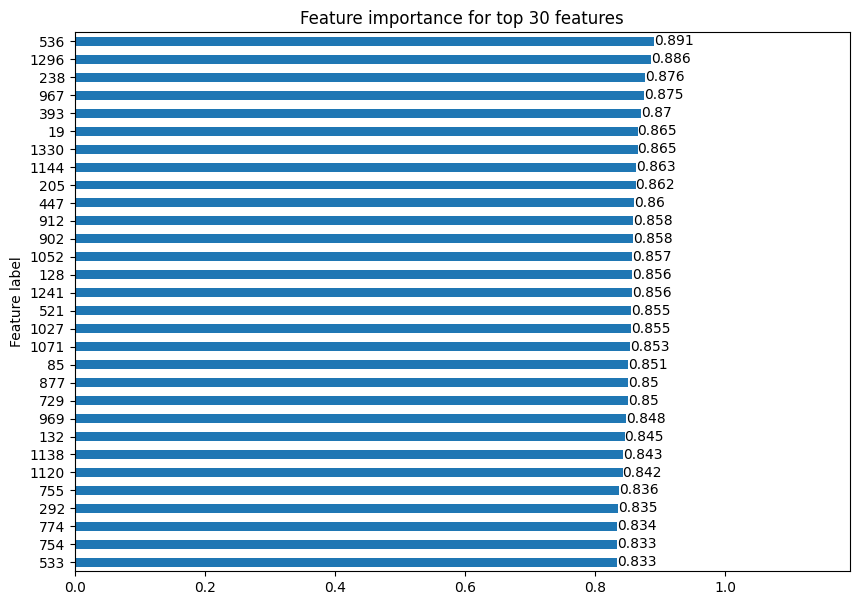

Explainability node features of GraphSAGE for graph


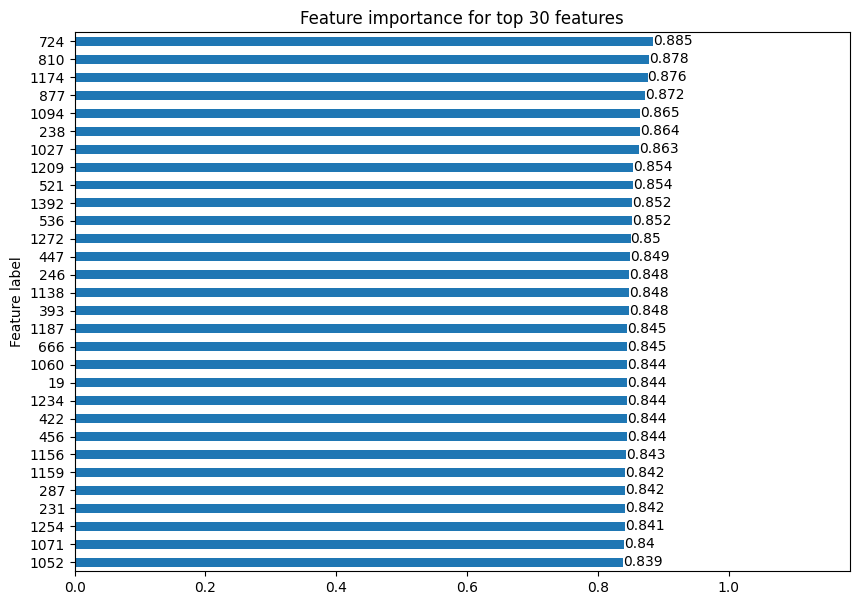

In [ ]:
#Visualize influential features for entire graph
visualize_top_features_graph(GCN_experiment, data, name="GCN")
visualize_top_features_graph(GAT_experiment, data, name="GAT")
visualize_top_features_graph(GSAGE_experiment, data, name="GraphSAGE")

Explainability node features of GCN for more nodes
Node 0: label = 3


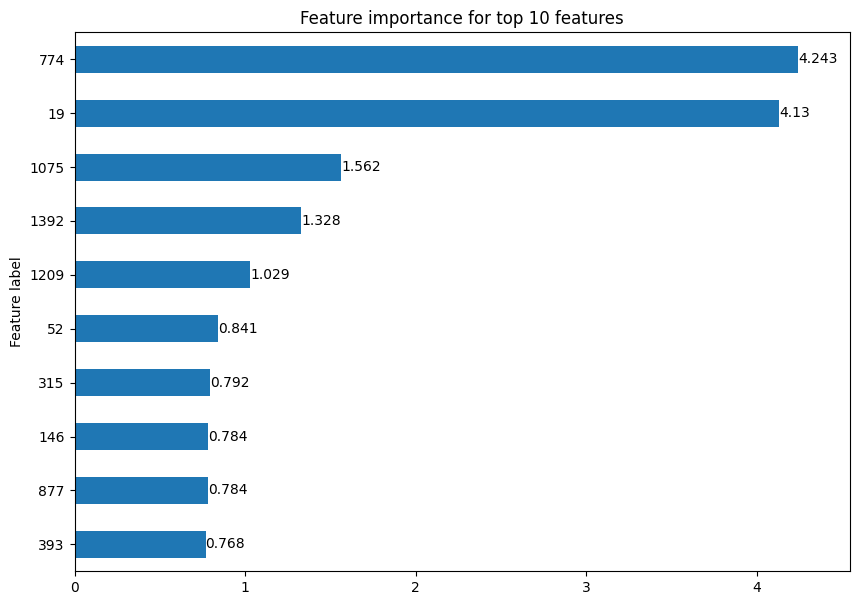

Explainability node features of GAT for more nodes
Node 0: label = 3


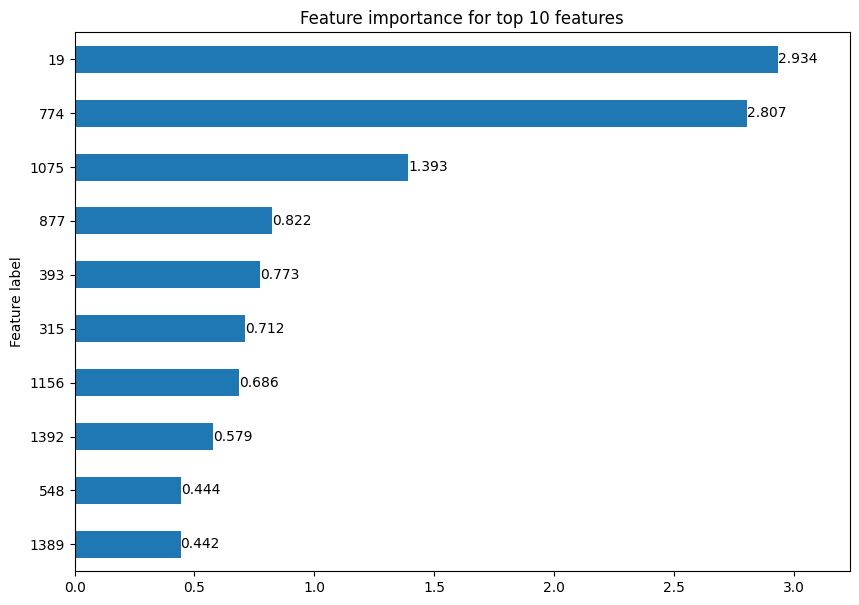

Explainability node features of GraphSAGE for more nodes
Node 0: label = 3


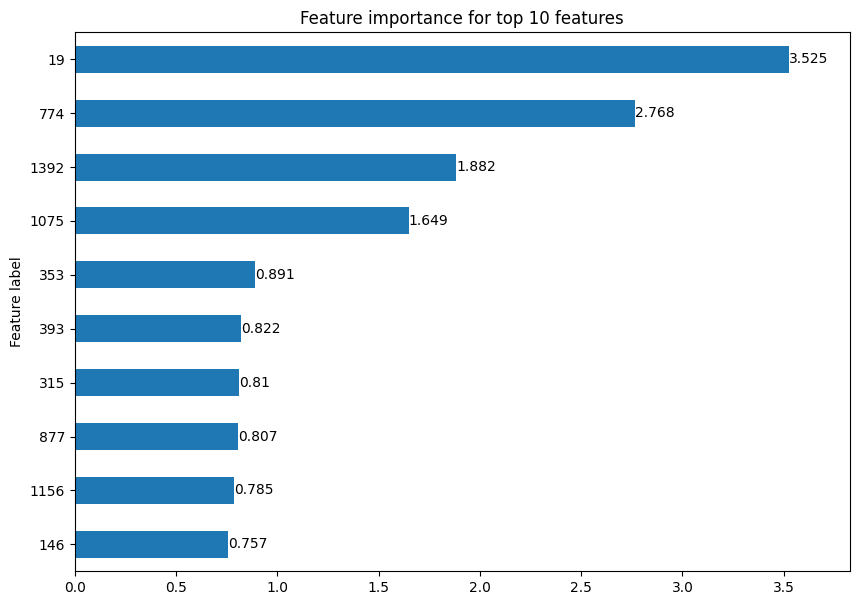

In [ ]:
#Visualize influential features for set of nodes
visualize_features_for_more_nodes(GCN_experiment, data, target_nodes=[0], name="GCN")
visualize_features_for_more_nodes(GAT_experiment, data, target_nodes=[0], name="GAT")
visualize_features_for_more_nodes(GSAGE_experiment, data, target_nodes=[0], name="GraphSAGE")

#Node2Vec Embeddings
We want to evaluate Node2Vec on our link prediction and node classification tasks. To do this, we first regenerate link prediction training data, adding negative samples to the training data too. We then define the function to generate the embedding, which does the actual training for Node2Vec, and a fine tuning function that occupies itself with both training and evaluating for the two different tasks. The idea was initially to do two different fine-tunings for the two tasks, but actually fine-tuning the embeddings for the first node classification task is better to produce embeddings that capture in a good manner the structure of the graph, and as such they are better also for link prediction. In order to have a fair comparison with respect to the GNNs, we replicate as much as possible the same steps that the GNNs do: for link prediction evaluation, after the embeddings are produced we apply dot product to them, and for the node classification we fit a logistic regression algorithm to the embeddings. Finally, we use the same evaluation techniques applied until now, with plotting of the metrics, ROC curve and confusion matrix for link prediction. It's important to note that Node2Vec is very slow to train, and as such there were problems during the fine tuning phase and the only way to solve them was to cut back on the number of hyperparameters.

In [ ]:
#Generate data for node2vec link prediction
G = to_networkx(data, to_undirected=True)
pos = nx.spring_layout(G, seed=0)

split = RandomLinkSplit(
    num_val=0.05,
    num_test=0.1,
    is_undirected=True,
    add_negative_train_samples=True,
    neg_sampling_ratio=1.0,
)
train_data, val_data, test_data = split(data)

In [ ]:
#Function to generate node2vec embeddings given cora dataset
def generate_node2vec_embeddings(data, embedding_dim=64, walk_length=20, p=1.0, q=0.5, context_size=5, walks_per_node=1, epochs=100, lr=0.01, batch_size=64, log_interval=10):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    edge_index = data.edge_index.to(device)
    node2vec = Node2Vec(
        edge_index,  #edge list
        embedding_dim=embedding_dim,
        walk_length=walk_length, #length of random walks
        context_size=context_size,
        p=p,
        q=q,
        num_negative_samples=1, #a negative for each positive
        walks_per_node=1, #number of random walks per node
        sparse=True  #use sparse optimization
    ).to(device)
    loader = node2vec.loader(batch_size=batch_size, shuffle=True, num_workers=4)
    optimizer = torch.optim.SparseAdam(node2vec.parameters(), lr=lr)

    #training Node2Vec
    node2vec.train()
    for epoch in range(1, epochs+1):
        tot = 0
        for pos_rw, neg_rw in loader:  # Iterate over batches from loader
            optimizer.zero_grad()
            pos_rw, neg_rw = pos_rw.to(device), neg_rw.to(device)
            loss = node2vec.loss(pos_rw, neg_rw)
            loss.backward()
            optimizer.step()
            tot += loss.item()
        loss = tot / len(loader)

        if epoch % log_interval == 0 or epoch == 1:
            print(f"Epoch {epoch}, Loss: {loss}")

    #get embeddings
    embeddings = node2vec.embedding.weight.data.cpu()  #[num_nodes, embedding_dim]
    return embeddings, node2vec

#Fine tune node2vec
def fine_tuning_node2vec(hyperparams,  data, task, path, log_interval):

    assert task in ['node_classification', 'link_prediction'], "Invalid task. Must be 'node_classification' or 'link_prediction'."

    best_config = None
    best_embeddings = None
    best_node2vec = None
    best_acc = 0
    best_auc = 0
    keys, values = zip(*hyperparams.items())
    combinations = itertools.product(*values)

    for combination in combinations:
        config = dict(zip(keys, combination))
        print(f"Trying hyperparams: {config}")
        embeddings, node2vec = generate_node2vec_embeddings(data, embedding_dim=config['embedding_dim'], p=config['p'], q=config['q'],
                                                            walk_length=config['walk_length'], batch_size=config['batch_size'], lr=config['lr'], context_size=config['context_size'], epochs=config['epochs'],
                                                            log_interval=log_interval)
        if task == 'node_classification':
            metrics = node_classification(embeddings, data.y, data.train_mask, data.test_mask)
            acc = metrics['accuracy']
            print(f"Validation accuracy: {acc}")
            if acc > best_acc:
                best_acc = acc
                best_config = config
                best_embeddings = embeddings
                best_node2vec = node2vec
                print(f"New Best is: {best_config}")

        elif task == 'link_prediction':
          metrics = link_prediction_evaluation(embeddings, data.edge_label_index[:, data.edge_label == 1], data.edge_label_index[:, data.edge_label == 0])
          auc = metrics['roc-auc']
          print(f"Validation AUC: {auc}")
          if auc > best_auc:
              best_auc = auc
              best_config = config
              best_embeddings = embeddings
              best_node2vec = node2vec
              print(f"New Best is: {best_config}")

    with open(f"{path}/node2vec_config_{task}.txt", 'wb') as f:
        f.write(str(best_config).encode())
        print(f"Best config saved to {path}/node2vec_config_{task}.txt")


    return best_config, best_embeddings, best_node2vec

#Does dot product step found in the GNNs
def link_prediction_node2vec(embeddings, edges):
    source_embeddings = embeddings[edges[0]]
    target_embeddings = embeddings[edges[1]]

    #dot product similarity
    scores = (source_embeddings * target_embeddings).sum(dim=1) #same dot product and sigmoid steps
    return torch.sigmoid(scores)

#Function to get test metrics on link prediction (needs code from dataset generation for link prediction)
def link_prediction_evaluation(embeddings, positive_edges, negative_edges, threshold=0.5):
    #We use the embeddings to predict if an edge is positive or negative using the same dot product as the GNNs and the same thresholding
    pos_scores = link_prediction_node2vec(embeddings, positive_edges)
    neg_scores = link_prediction_node2vec(embeddings, negative_edges)

    y_true = [1] * positive_edges.shape[1] + [0] * negative_edges.shape[1]
    y_pred = torch.cat([pos_scores, neg_scores]).cpu().numpy()

    y_pred_binary = (y_pred > threshold).astype(int)

    acc = accuracy_score(y_true, y_pred_binary)
    precision = precision_score(y_true, y_pred_binary)
    recall = recall_score(y_true, y_pred_binary)
    f1 = f1_score(y_true, y_pred_binary)
    roc_auc = roc_auc_score(y_true, y_pred)

    print(f"Link Prediction Precision: {precision}, Accuracy: {acc}, F1-Score: {f1}, Recall: {recall}. ROC-AUC: {roc_auc}")

    return {'precision': precision, 'accuracy': acc, 'f1_score': f1, 'recall': recall, 'roc-auc': roc_auc, 'y_pred': y_pred, 'y_true': y_true}

def plot_roc_and_confusion_matrix(y_true, y_pred, path, threshold=0.5):
    fpr, tpr, _ = roc_curve(y_true, y_pred)
    roc_auc = roc_auc_score(y_true, y_pred)

    y_pred_binary = (y_pred > threshold).astype(int)

    cm = confusion_matrix(y_true, y_pred_binary)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  #random classifier line
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate (FPR)', fontsize=12)
    plt.ylabel('True Positive Rate (TPR)', fontsize=12)
    plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=14)
    plt.legend(loc='lower right')

    plt.subplot(1, 2, 2)
    disp.plot(cmap='Blues', ax=plt.gca())
    plt.title('Confusion Matrix', fontsize=14)
    plt.xlabel('Predicted Label', fontsize=12)
    plt.ylabel('True Label', fontsize=12)

    plt.tight_layout()
    plt.savefig(f"{path}/node2vec_link_prediction_roc_and_confusion_matrix.png")
    plt.show()

def plot_node2vec_metrics(metrics, path, title, lp=False):

    metric_names = list(metrics.keys())[:5]
    metric_values = list(metrics.values())[:5]

    fig, ax = plt.subplots(figsize=(8, 6))

    ax.bar(metric_names, metric_values, color=['skyblue', 'lightgreen', 'lightcoral', 'lightskyblue', 'lightpink'])

    ax.set_title(f'{title}', fontsize=14)
    ax.set_ylabel('Score', fontsize=12)
    ax.set_ylim(0, 1)

    for i, v in enumerate(metric_values):
        ax.text(i, v + 0.02, f"{v:.3f}", ha='center', fontsize=12)

    #Plot histogram
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig(f"{path}/{title}.png")
    plt.show()

    if lp:
        plot_roc_and_confusion_matrix(metrics['y_true'], metrics['y_pred'], path)


#Function to get test metrics on node classification
def node_classification(embeddings, labels, train_mask, test_mask):
    X = embeddings.cpu().numpy()
    y = labels.cpu().numpy()

    X_train, y_train = X[train_mask], y[train_mask]
    X_test, y_test = X[test_mask], y[test_mask]

    clf = LogisticRegression()
    clf.fit(X_train, y_train)

    y_pred = clf.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')

    print(f"Node Classification Precision: {precision}, Accuracy: {acc}, F1-Score: {f1}, Recall: {recall}")

    return {'precision': precision, 'accuracy': acc, 'f1_score': f1, 'recall': recall}



def plot_embeddings(embeddings, labels, path, title="Embeddings_Visualization"):
    tsne = TSNE(n_components=2)
    reduced_embeddings = tsne.fit_transform(embeddings.cpu().numpy())

    plt.figure(figsize=(10, 7))
    plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], c=labels.cpu(), cmap='tab10', s=10)
    plt.colorbar()
    plt.title(title)
    plt.savefig(f"{path}/{title}.png")
    plt.show()

##Fine-tuning, testing, and plotting node2vec

In [ ]:
#We try some hyperparameters to fine tune the metrics of node2vec algorithm, get best possible embeddings for node classification and link prediction
node2vec_hyperparams = {
    "embedding_dim": [32, 64],
    "walk_length": [20], #only one choice to speed up the process, otherwise it's too slow
    "context_size": [10], #context size must be <= walk length
    "batch_size": [128, 64, 32],
    "lr": [0.01],
    "p": [0.25, 0.5, 1.0],
    "q": [0.25, 0.5, 1.0],
    "epochs": [50, 100] #from some preliminary it's clear the algorithm converges faster than the GNNs so we try lower values of epochs number
}

In [ ]:
#Fine tune algorithm (not needed)
fine_tuned_config_nc, fine_tuned_embeddings_nc, fine_tuned_node2vec_nc = fine_tuning_node2vec(node2vec_hyperparams, data, 'node_classification', '/content/drive/MyDrive/DATA_MINING/Homework_4', 10)
torch.save(fine_tuned_embeddings_nc, '/content/drive/MyDrive/DATA_MINING/Homework_4/fine_tuned_embeddings_nc.pt') #save embeddings

<ipython-input-14-6af09020d26b>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  fine_tuned_embeddings_nc = torch.load('/content/drive/MyDrive/DATA_MINING/Homework_4/fine_tu

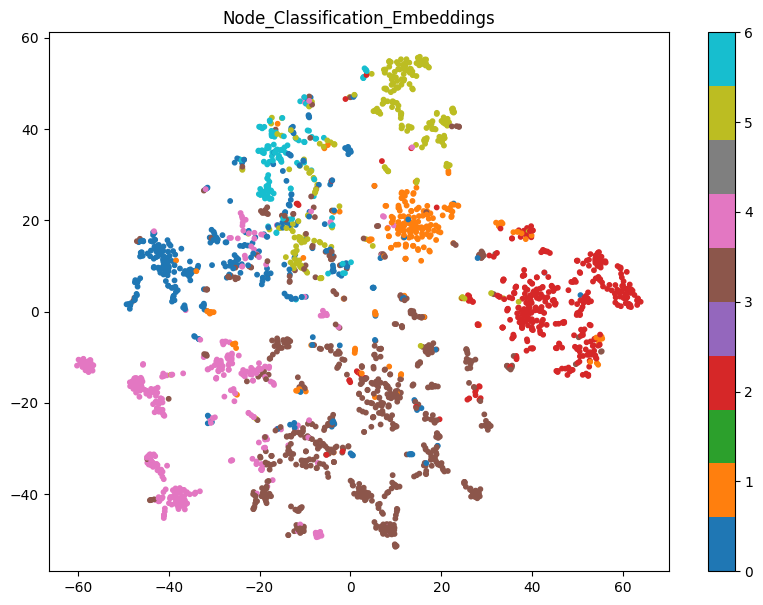

Node Classification Precision: 0.823715633630132, Accuracy: 0.8269617706237424, F1-Score: 0.8127676275542992, Recall: 0.8095565291373689


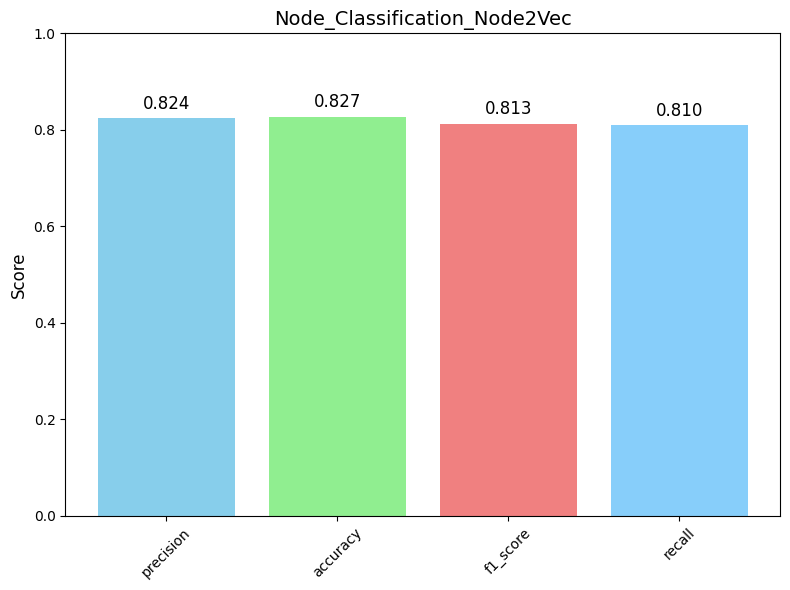

In [ ]:
fine_tuned_embeddings_nc = torch.load('/content/drive/MyDrive/DATA_MINING/Homework_4/fine_tuned_embeddings_nc.pt') #load embeddings
#Plot embeddings
plot_embeddings(fine_tuned_embeddings_nc, data.y, '/content/drive/MyDrive/DATA_MINING/Homework_4', "Node_Classification_Embeddings")

#Get metrics for node classification
plot_node2vec_metrics(node_classification(fine_tuned_embeddings_nc, data.y, data.train_mask, data.test_mask),
                      '/content/drive/MyDrive/DATA_MINING/Homework_4', "Node_Classification_Node2Vec")

In [ ]:
fine_tuned_config_lp, fine_tuned_embeddings_lp, fine_tuned_node2vec_lp = fine_tuning_node2vec(node2vec_hyperparams, train_data, 'link_prediction', '/content/drive/MyDrive/DATA_MINING/Homework_4', 10)
torch.save(fine_tuned_embeddings_lp, '/content/drive/MyDrive/DATA_MINING/Homework_4/fine_tuned_embeddings_lp.pt')

<ipython-input-12-7632fbaf06c6>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  fine_tuned_embeddings_lp = torch.load('/content/drive/MyDrive/DATA_MINING/Homework_4/fine_tu

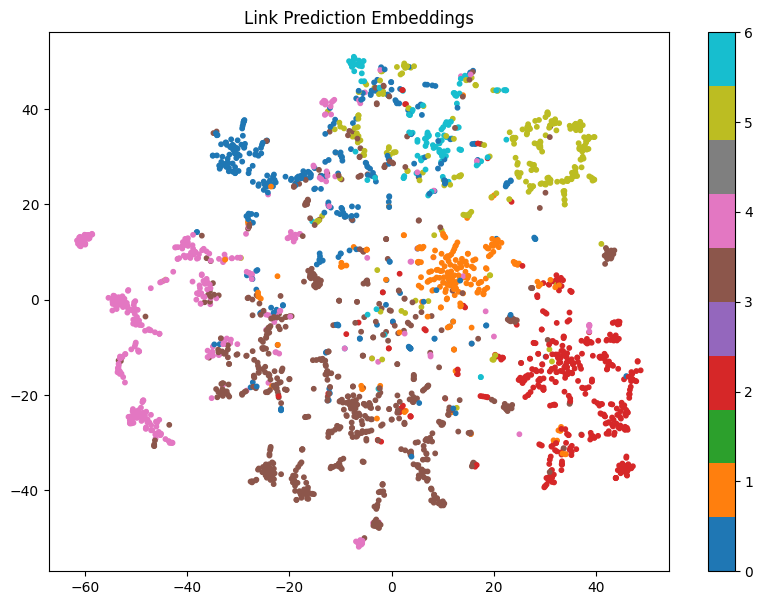

Link Prediction Precision: 0.7223837209302325, Accuracy: 0.8023715415019763, F1-Score: 0.8324958123953099, Recall: 0.9822134387351779. ROC-AUC: 0.9787881391679295


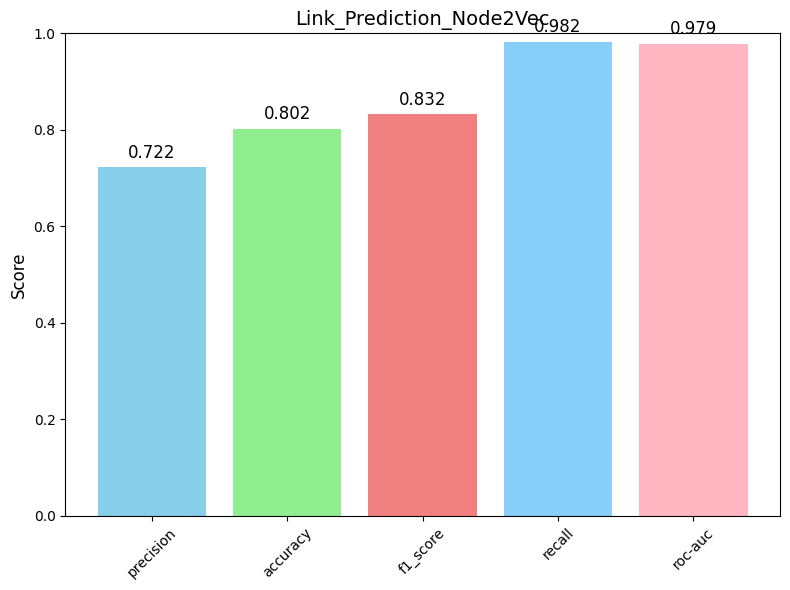

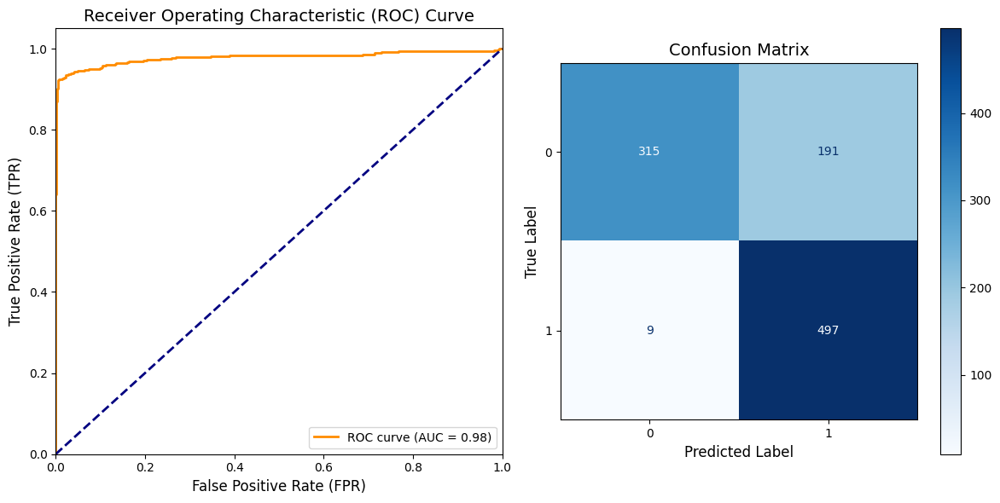

In [ ]:
fine_tuned_embeddings_lp = torch.load('/content/drive/MyDrive/DATA_MINING/Homework_4/fine_tuned_embeddings_lp.pt')
plot_embeddings(fine_tuned_embeddings_lp, data.y, '/content/drive/MyDrive/DATA_MINING/Homework_4', "Link Prediction Embeddings")

#Get metrics for link  prediction
positive_edges = test_data.edge_label_index[:, test_data.edge_label == 1]
negative_edges = test_data.edge_label_index[:, test_data.edge_label == 0]
plot_node2vec_metrics(link_prediction_evaluation(fine_tuned_embeddings_lp, positive_edges, negative_edges), '/content/drive/MyDrive/DATA_MINING/Homework_4', 'Link_Prediction_Node2Vec', lp=True)
